<a href="https://colab.research.google.com/github/TheJJL/Proyecto-Final-TG/blob/main/Reconocimiento3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Reconocimiento 3

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/Universidad - Ingeniería Electrónica/10 Semestre/Trabajo de Grado II/'
#path = '/content/drive/MyDrive/Trabajo de Grado II/'

Mounted at /content/drive


In [ ]:
import os
import shutil
import numpy as np
import random
import seaborn
import pandas as pd

from os import listdir
from PIL import Image 
from numpy import asarray
from numpy import expand_dims
from numpy import eye
from numpy import load
from numpy import savez_compressed
from random import choice
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, Adamax, SGD
from tensorflow.keras import layers
from keras.models import load_model 
from keras.callbacks import ModelCheckpoint
from keras.models import Model, Sequential
from keras.layers import Convolution2D, MaxPooling2D, LocallyConnected2D, ZeroPadding2D, Flatten, Dense, Dropout, Activation, Input, Add
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report  

%matplotlib inline

## 2. Preparación de datos

In [ ]:
# Función para aplicar data augmentation 
data_gen = ImageDataGenerator(
    rescale = .1, #Escalar aleatoriamente el múltiplo de la imagen RGB
    rotation_range = 0.15, #Rotar aleatoriamente el rango de la imagen
    zoom_range = 0.1, #Escalar aleatoriamente el rango de tamaño de la imagen
    width_shift_range = 0.2, #Cambiar aleatoriamente la imagen horizontalmente (fracción del ancho total)
    height_shift_range = 0.2, #Cambiar aleatoriamente la imagen verticalmente (fracción de la altura total)
    horizontal_flip = True,)

# Ejecutar directamente para obtener un iterador de imagen, que lee una imagen de la ruta cada vez y edita la imagen de acuerdo con las reglas del potenciador de datos.
dataflow_generator = data_gen.flow_from_directory(
    path + 'datasets/dataset/',
    target_size = (224,224),
    batch_size = 3,
    color_mode = 'rgb',
    class_mode = 'categorical')

print(dataflow_generator.filenames)

In [ ]:
# Función para extraer las imágenes
def extract_image(image):
  img = Image.open(image)            
  img = img.convert('RGB')          
  img = img.resize((47,55))  
  face_array = asarray(img)  
  return face_array


# Etiquetas Base de datos Yale (No existe el sujeto 14).
'''
name_dict = {'yaleB01':1,'yaleB02':2,'yaleB03':3,'yaleB04':4,'yaleB05':5,'yaleB06':6,'yaleB07':7,'yaleB08':8,'yaleB09':9,'yaleB10':10,
             'yaleB11':11,'yaleB12':12,'yaleB13':13,'yaleB15':15,'yaleB16':16,'yaleB17':17,'yaleB18':18,'yaleB19':19,'yaleB20':20,
             'yaleB21':21,'yaleB22':22,'yaleB23':23,'yaleB24':24,'yaleB25':25,'yaleB26':26,'yaleB27':27,'yaleB28':28,'yaleB29':29,'yaleB30':30,
             'yaleB31':31,'yaleB32':32,'yaleB33':33,'yaleB34':34,'yaleB35':35,'yaleB36':36,'yaleB37':37,'yaleB38':38,'yaleB39':39} 
'''

# Etiquetas Base de datos ROF

name_dict = {'ben_mendelsohn':1,'benedict_cumberbatch':2,'brad_pitt':3,'chris_evans':4,'chris_pratt':5,
             'colin_farell':6,'don_cheadle':7,'donnie_yen':8,'dwayne_johnson':9,'ed_skrein':10}

# Etiquetas Base de datos African
'''
name_dict = {'african_001':1,'african_002':2,'african_003':3,'african_004':4,'african_005':5,'african_006':6,'african_007':7,'african_008':8,'african_009':9,'african_010':10,
             'african_011':11,'african_012':12,'african_013':13,'african_014':14,'african_015':15,'african_016':16,'african_017':17,'african_018':18,'african_019':19,'african_020':20}
'''
# Etiquetas Base de datos Asian
'''
name_dict = {'asian_001':1,'asian_002':2,'asian_003':3,'asian_004':4,'asian_005':5,'asian_006':6,'asian_007':7,'asian_008':8,'asian_009':9,'asian_010':10,
             'asian_011':11,'asian_012':12,'asian_013':13,'asian_014':14,'asian_015':15,'asian_016':16,'asian_017':17,'asian_018':18,'asian_019':19,'asian_020':20}
'''
# Etiquetas Base de datos Latin
'''
name_dict = {'latin_001':1,'latin_002':2,'latin_003':3,'latin_004':4,'latin_005':5,'latin_006':6,'latin_007':7,'latin_008':8,'latin_009':9,'latin_010':10,
             'latin_011':11,'latin_012':12,'latin_013':13,'latin_014':14,'latin_015':15,'latin_016':16,'latin_017':17,'latin_018':18,'latin_019':19,'latin_020':20}
'''
# Etiquetas Base de datos Indian
'''
name_dict = {'indian_001':1,'indian_002':2,'indian_003':3,'indian_004':4,'indian_005':5,'indian_006':6,'indian_007':7,'indian_008':8,'indian_009':9,'indian_010':10,
             'indian_011':11,'indian_012':12,'indian_013':13,'indian_014':14,'indian_015':15,'indian_016':16,'indian_017':17,'indian_018':18,'indian_019':19,'indian_020':20}
'''
             
# Función para obtener datos faciales y sus etiquetas 

# Función para obtener datos faciales y sus etiquetas 
def load_dataset(directory, augment_times=2, is_train=True):
  x, y = [],[]
  for subdir in listdir(directory):
    path = directory + subdir + '/'
    for filename in listdir(path):
      path_file = path + filename
      faces = extract_image(path_file)
      #labels = [subdir for _ in range(len(faces))] #Creación de etiquetas
      x.append(faces)
      #y.append(labels)
      y.append(name_dict[subdir])
      if is_train:
        for _ in range(augment_times):
          faces_aug = data_gen.random_transform(faces)
          x.append(faces_aug)
          #y.append(labels)
          y.append(name_dict[subdir])

  return asarray(x), asarray(y)  

In [ ]:
#Cargar datos de entrenamiento
trainX, trainY = load_dataset(path + 'datasets/datasetROF2/train/', augment_times=0, is_train=False)
print('Cargando dataset train:')
print('Hay %d imágenes' %trainX.shape[0])  
print('Tamaño de imágenes: %d x %d pixeles' %(trainX.shape[1], trainX.shape[2]))

#Cargar datos de test
testX, testY = load_dataset(path + 'datasets/datasetROF2/test/sunglasses/', is_train=False)
print('Cargando dataset test:')
print('Hay %d imágenes' %testX.shape[0])  
print('Tamaño de imágenes: %d x %d pixeles' %(testX.shape[1], testX.shape[2]))

#Guardar datos en un archivo en formato comprimido 
savez_compressed('faces-dataset-ROF2_sunglasses.npz', trainX, trainY, testX, testY)
shutil.copy('faces-dataset-ROF2_sunglasses.npz', path + 'data_reconocimiento3') 

Cargando dataset train:
Hay 1601 imágenes
Tamaño de imágenes: 55 x 47 pixeles
Cargando dataset test:
Hay 200 imágenes
Tamaño de imágenes: 55 x 47 pixeles


'/content/drive/MyDrive/Universidad - Ingeniería Electrónica/10 Semestre/Trabajo de Grado II/data_reconocimiento3/faces-dataset-ROF2_sunglasses.npz'

## 3. Modelo de Deep Learning: DeepID
----

In [ ]:
# Carga del conjunto de datos comprimido
data = load(path + 'data_reconocimiento3/faces-dataset-VGG_indian.npz')
trainX, trainY, testX, testY = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print('Tamaño de data train:', trainX.shape)
print('Tamaño de data test:', testX.shape)

Tamaño de data train: (2696, 55, 47, 3)
Tamaño de data test: (1000, 55, 47, 3)


In [ ]:
# Estandarización de los datos de entrenamiento y test
trainX = trainX/255
testX = testX/255
trainY = to_categorical(trainY)
testY = to_categorical(testY)

Sujeto #[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


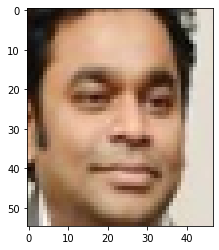

In [ ]:
# Ejemplo
print('Sujeto #{}'.format(trainY[20]))
plt.imshow(trainX[20])

### 3.1 Modelo base de DeepID


In [ ]:
myInput = Input(shape=(55, 47, 3))

x = Convolution2D(20, (4, 4), name='Conv1', activation='relu', input_shape=(55, 47, 3))(myInput)
x = MaxPooling2D(pool_size=2, strides=2, name='Pool1')(x)
x = Dropout(rate=0, name='D1')(x)

x = Convolution2D(40, (3, 3), name='Conv2', activation='relu')(x)
x = MaxPooling2D(pool_size=2, strides=2, name='Pool2')(x)
x = Dropout(rate=0, name='D2')(x)

x = Convolution2D(60, (3, 3), name='Conv3', activation='relu')(x)
x = MaxPooling2D(pool_size=2, strides=2, name='Pool3')(x)
x = Dropout(rate=0, name='D3')(x)

x1 = Flatten()(x)
fc11 = Dense(160, name='fc11')(x1)

x2 = Convolution2D(80, (2, 2), name='Conv4', activation='relu')(x)
x2 = Flatten()(x2)
fc12 = Dense(160, name='fc12')(x2)

y = Add()([fc11, fc12])
y = Activation('relu', name='deepid')(y)

deepid_model = Model(inputs=[myInput], outputs=y)

In [ ]:
deepid_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                              

In [ ]:
#Carga de los pesos de un modelo pre-entrenado
#deepid_model.load_weights(path + 'data_models/deepid_keras_weights.h5')
#deepid_model.summary()

## 4. Modelos con base de datos Yale para condiciones de iluminación

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale1 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale1 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_yale1)
deepid_model_yale1.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale1.h5', monitor="val_loss", save_best_only=True)
hist_model_yale1 = deepid_model_yale1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
50/50 [==============================] - 11s 185ms/step - loss: 4.3577 - accuracy: 0.0251 - val_loss: 4.2082 - val_accuracy: 0.0190
Epoch 2/70
50/50 [==============================] - 7s 138ms/step - loss: 4.0822 - accuracy: 0.0285 - val_loss: 4.0074 - val_accuracy: 0.0163
Epoch 3/70
50/50 [==============================] - 6s 111ms/step - loss: 3.9014 - accuracy: 0.0332 - val_loss: 3.8830 - val_accuracy: 0.0352
Epoch 4/70
50/50 [==============================] - 6s 112ms/step - loss: 3.7742 - accuracy: 0.0427 - val_loss: 3.7847 - val_accuracy: 0.0623
Epoch 5/70
50/50 [==============================] - 6s 111ms/step - loss: 3.6351 - accuracy: 0.0725 - val_loss: 3.6412 - val_accuracy: 0.0976
Epoch 6/70
50/50 [==============================] - 5s 110ms/step - loss: 3.3740 - accuracy: 0.1227 - val_loss: 3.2697 - val_accuracy: 0.2195
Epoch 7/70
50/50 [==============================] - 6s 111ms/step - loss: 3.0253 - accuracy: 0.2122 - val_loss: 2.7503 - val_accuracy: 0.2846
Epoch

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale1 = load_model(path + 'data_reconocimiento3/deepid_model_yale1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale1.evaluate(testX, testY)

18/18 [==============================] - 1s 30ms/step - loss: 0.2725 - accuracy: 0.9526


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

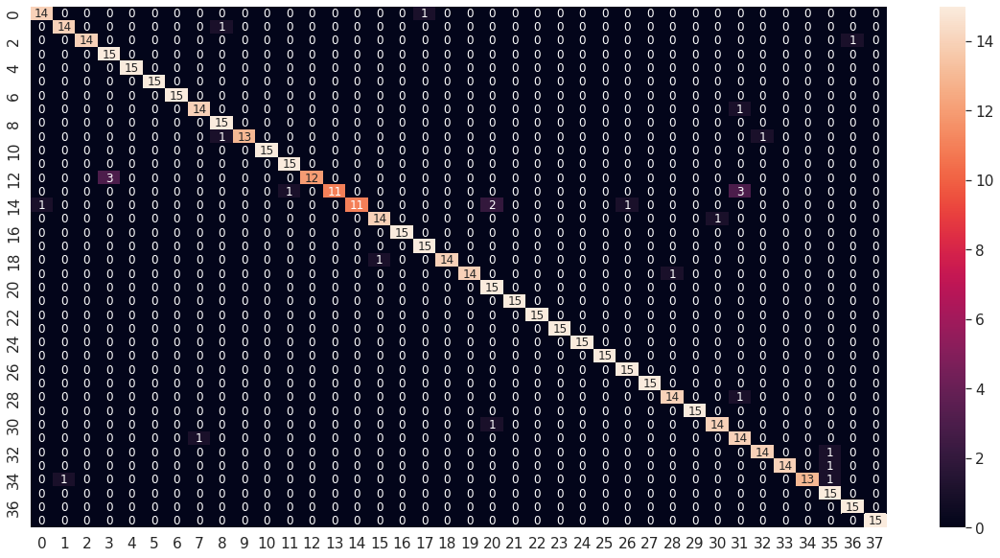

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale1_df_CM = pd.DataFrame(deepid_model_yale1_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale1_report)

              precision    recall  f1-score   support

           1       0.93      0.93      0.93        15
           2       0.93      0.93      0.93        15
           3       1.00      0.93      0.97        15
           4       0.83      1.00      0.91        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       0.93      0.93      0.93        15
           9       0.88      1.00      0.94        15
          10       1.00      0.87      0.93        15
          11       1.00      1.00      1.00        15
          12       0.94      1.00      0.97        15
          13       1.00      0.80      0.89        15
          15       1.00      0.73      0.85        15
          16       1.00      0.73      0.85        15
          17       0.93      0.93      0.93        15
          18       1.00      1.00      1.00        15
          19       0.94    

#### Modelo 2: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale2 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale2 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_yale2)
deepid_model_yale2.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale2.h5', monitor="val_loss", save_best_only=True)
hist_model_yale2 = deepid_model_yale2.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
50/50 [==============================] - 8s 140ms/step - loss: 4.3639 - accuracy: 0.0244 - val_loss: 4.2111 - val_accuracy: 0.0271
Epoch 2/100
50/50 [==============================] - 10s 194ms/step - loss: 4.0838 - accuracy: 0.0325 - val_loss: 4.0101 - val_accuracy: 0.0163
Epoch 3/100
50/50 [==============================] - 9s 188ms/step - loss: 3.9042 - accuracy: 0.0285 - val_loss: 3.8824 - val_accuracy: 0.0325
Epoch 4/100
50/50 [==============================] - 12s 238ms/step - loss: 3.7798 - accuracy: 0.0373 - val_loss: 3.7956 - val_accuracy: 0.0461
Epoch 5/100
50/50 [==============================] - 12s 232ms/step - loss: 3.6465 - accuracy: 0.0685 - val_loss: 3.6905 - val_accuracy: 0.0976
Epoch 6/100
50/50 [==============================] - 9s 181ms/step - loss: 3.4550 - accuracy: 0.1105 - val_loss: 3.3197 - val_accuracy: 0.1978
Epoch 7/100
50/50 [==============================] - 9s 173ms/step - loss: 3.1356 - accuracy: 0.1708 - val_loss: 2.9371 - val_accuracy: 0.2

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale2 = load_model(path + 'data_reconocimiento3/deepid_model_yale2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale2.evaluate(testX, testY)

18/18 [==============================] - 1s 29ms/step - loss: 0.1866 - accuracy: 0.9789


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

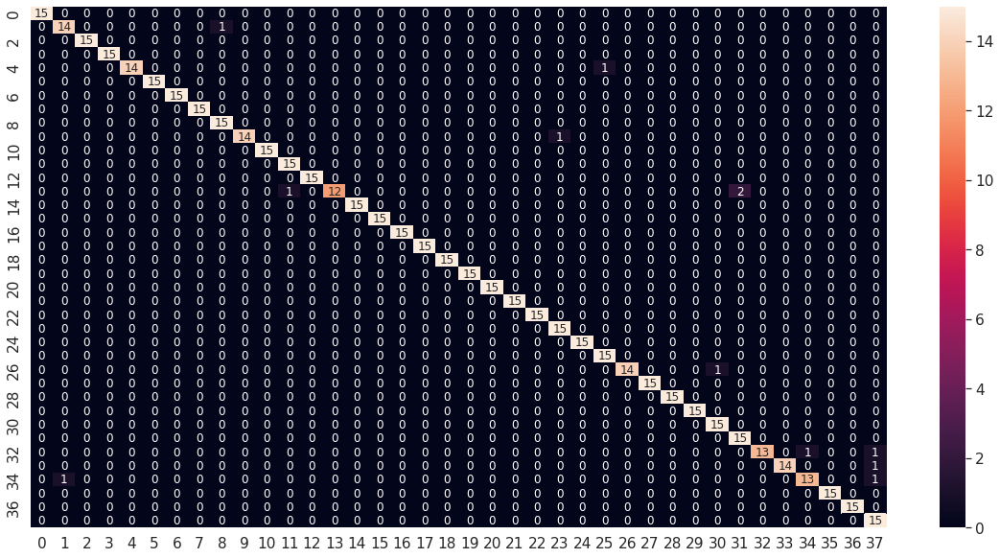

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale2_df_CM = pd.DataFrame(deepid_model_yale2_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale2_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       0.93      0.93      0.93        15
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        15
           5       1.00      0.93      0.97        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       1.00      1.00      1.00        15
           9       0.94      1.00      0.97        15
          10       1.00      0.93      0.97        15
          11       1.00      1.00      1.00        15
          12       0.94      1.00      0.97        15
          13       1.00      1.00      1.00        15
          15       1.00      0.80      0.89        15
          16       1.00      1.00      1.00        15
          17       1.00      1.00      1.00        15
          18       1.00      1.00      1.00        15
          19       1.00    

#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale3 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale3 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_yale3)
deepid_model_yale3.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale3.h5', monitor="val_loss", save_best_only=True)
hist_model_yale3 = deepid_model_yale3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
37/37 [==============================] - 9s 199ms/step - loss: 4.3903 - accuracy: 0.0210 - val_loss: 4.2573 - val_accuracy: 0.0163
Epoch 2/100
37/37 [==============================] - 8s 220ms/step - loss: 4.1369 - accuracy: 0.0298 - val_loss: 4.0676 - val_accuracy: 0.0379
Epoch 3/100
37/37 [==============================] - 8s 224ms/step - loss: 3.9666 - accuracy: 0.0285 - val_loss: 3.9352 - val_accuracy: 0.0325
Epoch 4/100
37/37 [==============================] - 11s 290ms/step - loss: 3.8407 - accuracy: 0.0312 - val_loss: 3.8503 - val_accuracy: 0.0515
Epoch 5/100
37/37 [==============================] - 12s 319ms/step - loss: 3.7156 - accuracy: 0.0454 - val_loss: 3.7001 - val_accuracy: 0.0894
Epoch 6/100
37/37 [==============================] - 9s 234ms/step - loss: 3.5585 - accuracy: 0.0820 - val_loss: 3.5043 - val_accuracy: 0.1165
Epoch 7/100
37/37 [==============================] - 9s 235ms/step - loss: 3.1941 - accuracy: 0.1661 - val_loss: 3.0185 - val_accuracy: 0.24

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale3 = load_model(path + 'data_reconocimiento3/deepid_model_yale3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale3.evaluate(testX, testY)

18/18 [==============================] - 1s 32ms/step - loss: 0.1951 - accuracy: 0.9702


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

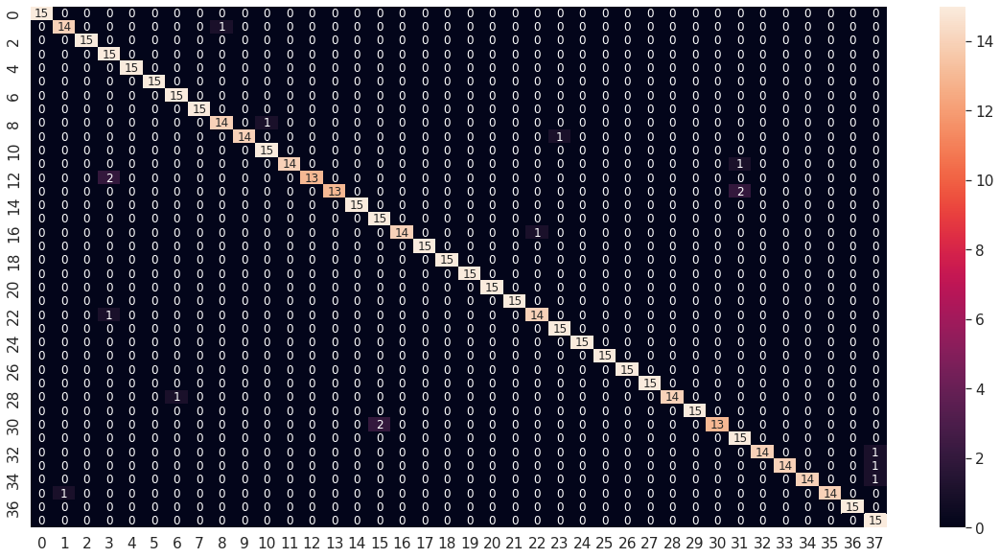

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale3_df_CM = pd.DataFrame(deepid_model_yale3_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale3_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       0.93      0.93      0.93        15
           3       1.00      1.00      1.00        15
           4       0.83      1.00      0.91        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       0.94      1.00      0.97        15
           8       1.00      1.00      1.00        15
           9       0.93      0.93      0.93        15
          10       1.00      0.93      0.97        15
          11       0.94      1.00      0.97        15
          12       1.00      0.93      0.97        15
          13       1.00      0.87      0.93        15
          15       1.00      0.87      0.93        15
          16       1.00      1.00      1.00        15
          17       0.88      1.00      0.94        15
          18       1.00      0.93      0.97        15
          19       1.00    

#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale4 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale4 = keras.Model(deepid_model.get_layer('input_5').get_output_at(node_index=0), deepid_model_yale4)
deepid_model_yale4.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_5[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale4.h5', monitor="val_loss", save_best_only=True)
hist_model_yale4 = deepid_model_yale4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
74/74 [==============================] - 11s 127ms/step - loss: 4.3268 - accuracy: 0.0258 - val_loss: 4.1398 - val_accuracy: 0.0244
Epoch 2/100
74/74 [==============================] - 9s 122ms/step - loss: 4.0070 - accuracy: 0.0224 - val_loss: 3.9268 - val_accuracy: 0.0163
Epoch 3/100
74/74 [==============================] - 11s 154ms/step - loss: 3.8304 - accuracy: 0.0325 - val_loss: 3.8065 - val_accuracy: 0.0244
Epoch 4/100
74/74 [==============================] - 11s 149ms/step - loss: 3.6976 - accuracy: 0.0549 - val_loss: 3.7283 - val_accuracy: 0.0352
Epoch 5/100
74/74 [==============================] - 9s 127ms/step - loss: 3.5212 - accuracy: 0.0881 - val_loss: 3.4018 - val_accuracy: 0.0976
Epoch 6/100
74/74 [==============================] - 9s 125ms/step - loss: 3.2634 - accuracy: 0.1532 - val_loss: 3.1434 - val_accuracy: 0.1897
Epoch 7/100
74/74 [==============================] - 9s 118ms/step - loss: 2.9556 - accuracy: 0.2136 - val_loss: 2.9153 - val_accuracy: 0.1

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale4 = load_model(path + 'data_reconocimiento3/deepid_model_yale4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale4.evaluate(testX, testY)

18/18 [==============================] - 1s 30ms/step - loss: 0.2467 - accuracy: 0.9684


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

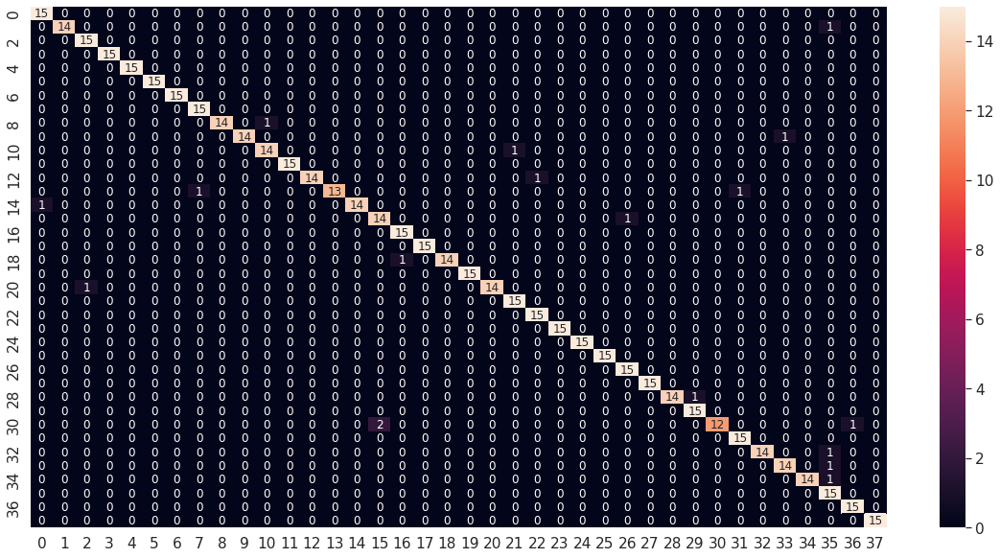

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale4_df_CM = pd.DataFrame(deepid_model_yale4_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale4_report)

              precision    recall  f1-score   support

           1       0.94      1.00      0.97        15
           2       1.00      0.93      0.97        15
           3       0.94      1.00      0.97        15
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       0.94      1.00      0.97        15
           9       1.00      0.93      0.97        15
          10       1.00      0.93      0.97        15
          11       0.93      0.93      0.93        15
          12       1.00      1.00      1.00        15
          13       1.00      0.93      0.97        15
          15       1.00      0.87      0.93        15
          16       1.00      0.93      0.97        15
          17       0.88      0.93      0.90        15
          18       0.94      1.00      0.97        15
          19       1.00    

#### Modelo 5: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale5 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale5 = keras.Model(deepid_model.get_layer('input_6').get_output_at(node_index=0), deepid_model_yale5)
deepid_model_yale5.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_6[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale5.h5', monitor="val_loss", save_best_only=True)
hist_model_yale5 = deepid_model_yale5.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
50/50 [==============================] - 7s 118ms/step - loss: 4.3944 - accuracy: 0.0292 - val_loss: 4.2342 - val_accuracy: 0.0352
Epoch 2/150
50/50 [==============================] - 5s 109ms/step - loss: 4.1095 - accuracy: 0.0217 - val_loss: 4.0331 - val_accuracy: 0.0244
Epoch 3/150
50/50 [==============================] - 5s 110ms/step - loss: 3.9356 - accuracy: 0.0298 - val_loss: 3.8874 - val_accuracy: 0.0407
Epoch 4/150
50/50 [==============================] - 5s 109ms/step - loss: 3.8152 - accuracy: 0.0353 - val_loss: 3.7933 - val_accuracy: 0.0298
Epoch 5/150
50/50 [==============================] - 5s 110ms/step - loss: 3.7204 - accuracy: 0.0447 - val_loss: 3.6861 - val_accuracy: 0.0407
Epoch 6/150
50/50 [==============================] - 5s 107ms/step - loss: 3.6172 - accuracy: 0.0664 - val_loss: 3.5757 - val_accuracy: 0.0623
Epoch 7/150
50/50 [==============================] - 5s 109ms/step - loss: 3.4879 - accuracy: 0.0868 - val_loss: 3.3871 - val_accuracy: 0.0949

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale5 = load_model(path + 'data_reconocimiento3/deepid_model_yale5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale5.evaluate(testX, testY)

18/18 [==============================] - 1s 30ms/step - loss: 0.1876 - accuracy: 0.9614


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

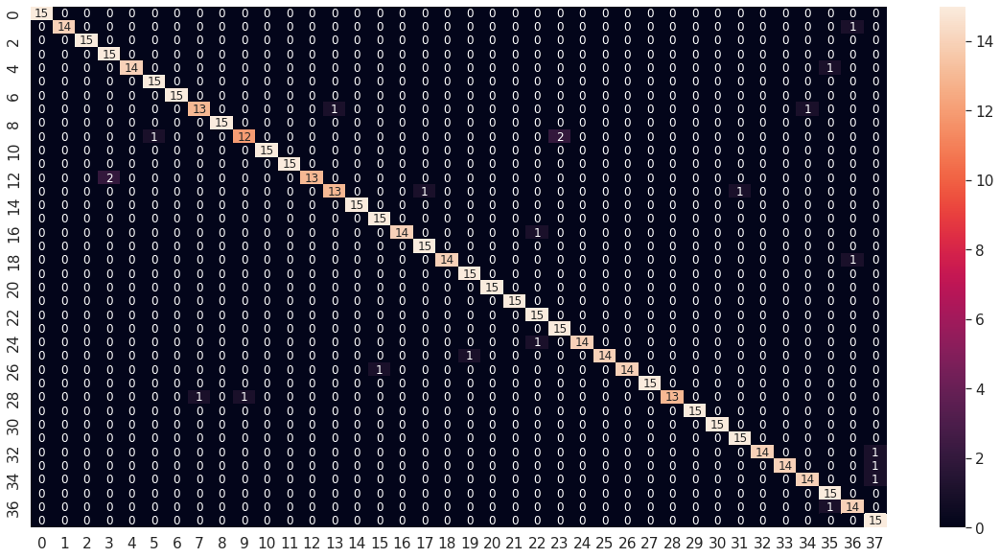

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale5_df_CM = pd.DataFrame(deepid_model_yale5_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale5_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       1.00      1.00      1.00        15
           4       0.88      1.00      0.94        15
           5       1.00      0.93      0.97        15
           6       0.94      1.00      0.97        15
           7       1.00      1.00      1.00        15
           8       0.93      0.87      0.90        15
           9       1.00      1.00      1.00        15
          10       0.92      0.80      0.86        15
          11       1.00      1.00      1.00        15
          12       1.00      1.00      1.00        15
          13       1.00      0.87      0.93        15
          15       0.93      0.87      0.90        15
          16       1.00      1.00      1.00        15
          17       0.94      1.00      0.97        15
          18       1.00      0.93      0.97        15
          19       0.94    

#### Modelo 6: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale6 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale6 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_yale6)
deepid_model_yale6.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_yale6.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale6.h5', monitor="val_loss", save_best_only=True)
hist_model_yale6 = deepid_model_yale6.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
50/50 [==============================] - 11s 174ms/step - loss: 4.4300 - accuracy: 0.0176 - val_loss: 4.3298 - val_accuracy: 0.0244
Epoch 2/150
50/50 [==============================] - 8s 159ms/step - loss: 4.2573 - accuracy: 0.0298 - val_loss: 4.2177 - val_accuracy: 0.0271
Epoch 3/150
50/50 [==============================] - 6s 116ms/step - loss: 4.1515 - accuracy: 0.0237 - val_loss: 4.1344 - val_accuracy: 0.0352
Epoch 4/150
50/50 [==============================] - 5s 100ms/step - loss: 4.0693 - accuracy: 0.0285 - val_loss: 4.0707 - val_accuracy: 0.0190
Epoch 5/150
50/50 [==============================] - 5s 100ms/step - loss: 4.0177 - accuracy: 0.0346 - val_loss: 4.0206 - val_accuracy: 0.0325
Epoch 6/150
50/50 [==============================] - 5s 100ms/step - loss: 3.9649 - accuracy: 0.0285 - val_loss: 3.9796 - val_accuracy: 0.0461
Epoch 7/150
50/50 [==============================] - 6s 115ms/step - loss: 3.9193 - accuracy: 0.0271 - val_loss: 3.9439 - val_accuracy: 0.046

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale6 = load_model(path + 'data_reconocimiento3/deepid_model_yale6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale6.evaluate(testX, testY)

18/18 [==============================] - 1s 27ms/step - loss: 0.3894 - accuracy: 0.9246


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

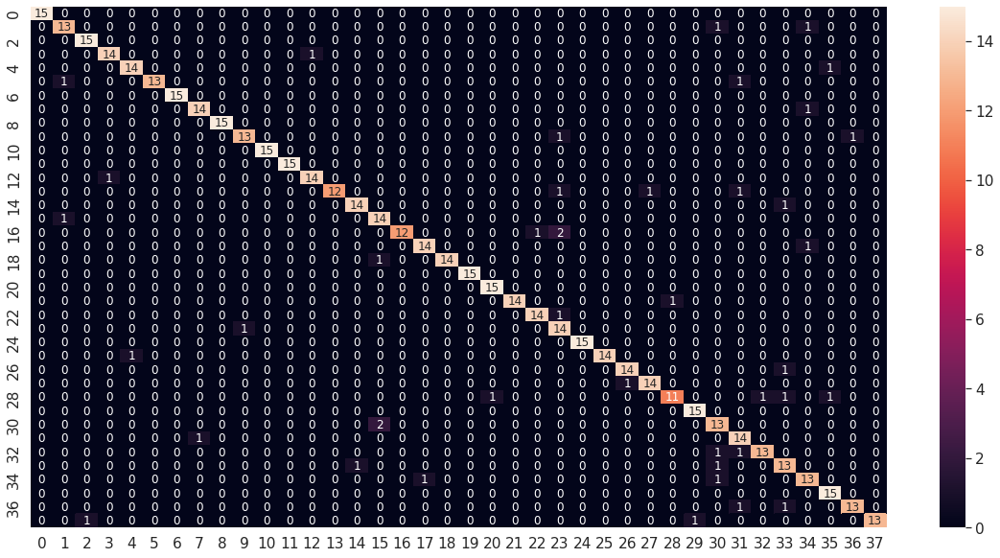

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale6_df_CM = pd.DataFrame(deepid_model_yale6_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale6_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       0.87      0.87      0.87        15
           3       0.94      1.00      0.97        15
           4       0.93      0.93      0.93        15
           5       0.93      0.93      0.93        15
           6       1.00      0.87      0.93        15
           7       1.00      1.00      1.00        15
           8       0.93      0.93      0.93        15
           9       1.00      1.00      1.00        15
          10       0.93      0.87      0.90        15
          11       1.00      1.00      1.00        15
          12       1.00      1.00      1.00        15
          13       0.93      0.93      0.93        15
          15       1.00      0.80      0.89        15
          16       0.93      0.93      0.93        15
          17       0.82      0.93      0.87        15
          18       1.00      0.80      0.89        15
          19       0.93    

#### Modelo 7: (BTH = 20, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale7 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale7 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_yale7)
deepid_model_yale7.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_yale7.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale7.h5', monitor="val_loss", save_best_only=True)
hist_model_yale7 = deepid_model_yale7.fit(new_trainX, new_trainY, batch_size=20, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
74/74 [==============================] - 7s 88ms/step - loss: 4.3685 - accuracy: 0.0197 - val_loss: 4.2577 - val_accuracy: 0.0325
Epoch 2/150
74/74 [==============================] - 7s 91ms/step - loss: 4.1648 - accuracy: 0.0203 - val_loss: 4.1197 - val_accuracy: 0.0379
Epoch 3/150
74/74 [==============================] - 5s 71ms/step - loss: 4.0421 - accuracy: 0.0278 - val_loss: 4.0299 - val_accuracy: 0.0569
Epoch 4/150
74/74 [==============================] - 7s 97ms/step - loss: 3.9583 - accuracy: 0.0373 - val_loss: 3.9647 - val_accuracy: 0.0352
Epoch 5/150
74/74 [==============================] - 8s 111ms/step - loss: 3.8876 - accuracy: 0.0441 - val_loss: 3.9066 - val_accuracy: 0.0813
Epoch 6/150
74/74 [==============================] - 8s 109ms/step - loss: 3.8207 - accuracy: 0.0414 - val_loss: 3.8681 - val_accuracy: 0.0705
Epoch 7/150
74/74 [==============================] - 10s 130ms/step - loss: 3.7297 - accuracy: 0.0807 - val_loss: 3.7837 - val_accuracy: 0.1111
Ep

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale7 = load_model(path + 'data_reconocimiento3/deepid_model_yale7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale7.evaluate(testX, testY)

18/18 [==============================] - 1s 27ms/step - loss: 0.5366 - accuracy: 0.9105


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

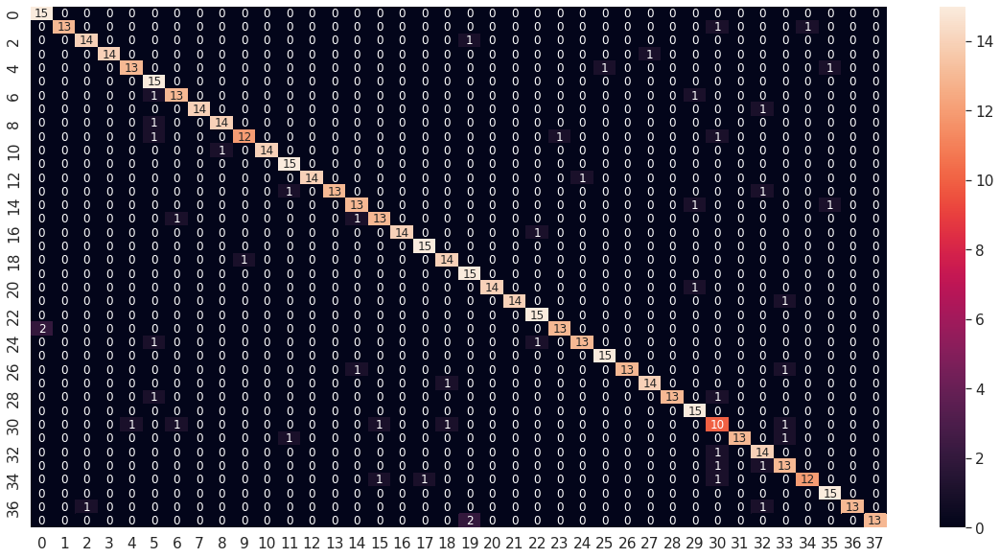

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale7_df_CM = pd.DataFrame(deepid_model_yale7_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale7_report)

              precision    recall  f1-score   support

           1       0.88      1.00      0.94        15
           2       1.00      0.87      0.93        15
           3       0.93      0.93      0.93        15
           4       1.00      0.93      0.97        15
           5       0.93      0.87      0.90        15
           6       0.75      1.00      0.86        15
           7       0.87      0.87      0.87        15
           8       1.00      0.93      0.97        15
           9       0.93      0.93      0.93        15
          10       0.92      0.80      0.86        15
          11       1.00      0.93      0.97        15
          12       0.88      1.00      0.94        15
          13       1.00      0.93      0.97        15
          15       1.00      0.87      0.93        15
          16       0.87      0.87      0.87        15
          17       0.87      0.87      0.87        15
          18       1.00      0.93      0.97        15
          19       0.94    

#### Modelo 8: (BTH = 40, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale8 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale8 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_yale8)
deepid_model_yale8.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_yale8.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale8.h5', monitor="val_loss", save_best_only=True)
hist_model_yale8 = deepid_model_yale8.fit(new_trainX, new_trainY, batch_size=40, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
37/37 [==============================] - 6s 144ms/step - loss: 4.4523 - accuracy: 0.0285 - val_loss: 4.3708 - val_accuracy: 0.0163
Epoch 2/150
37/37 [==============================] - 6s 150ms/step - loss: 4.3011 - accuracy: 0.0264 - val_loss: 4.2787 - val_accuracy: 0.0271
Epoch 3/150
37/37 [==============================] - 6s 165ms/step - loss: 4.2145 - accuracy: 0.0312 - val_loss: 4.2048 - val_accuracy: 0.0352
Epoch 4/150
37/37 [==============================] - 5s 127ms/step - loss: 4.1358 - accuracy: 0.0332 - val_loss: 4.1421 - val_accuracy: 0.0244
Epoch 5/150
37/37 [==============================] - 5s 127ms/step - loss: 4.0783 - accuracy: 0.0346 - val_loss: 4.0909 - val_accuracy: 0.0190
Epoch 6/150
37/37 [==============================] - 5s 128ms/step - loss: 4.0245 - accuracy: 0.0312 - val_loss: 4.0484 - val_accuracy: 0.0379
Epoch 7/150
37/37 [==============================] - 5s 129ms/step - loss: 3.9772 - accuracy: 0.0400 - val_loss: 4.0083 - val_accuracy: 0.0379

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale8 = load_model(path + 'data_reconocimiento3/deepid_model_yale8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale8.evaluate(testX, testY)

18/18 [==============================] - 0s 26ms/step - loss: 0.4164 - accuracy: 0.9351


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

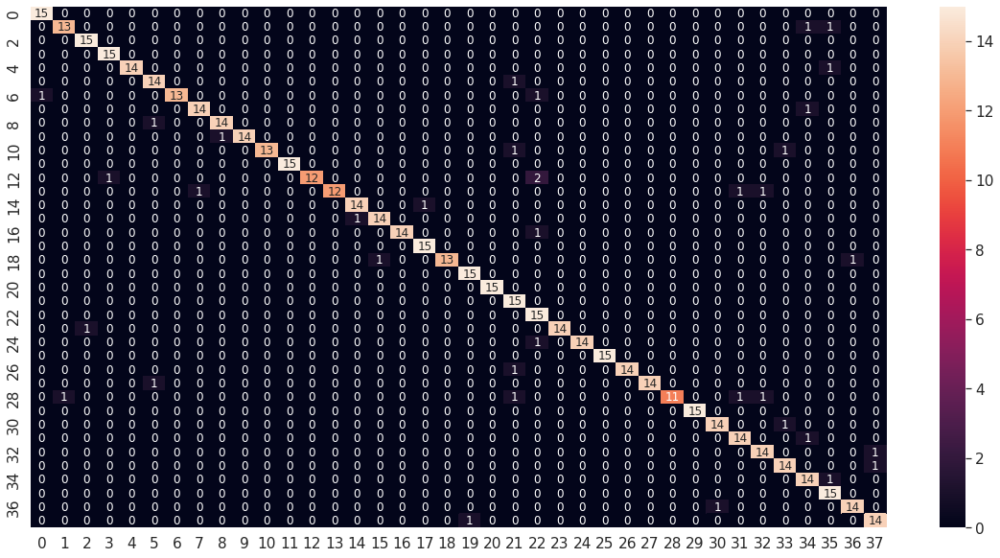

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale8_df_CM = pd.DataFrame(deepid_model_yale8_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale8_report)

              precision    recall  f1-score   support

           1       0.94      1.00      0.97        15
           2       0.93      0.87      0.90        15
           3       0.94      1.00      0.97        15
           4       0.94      1.00      0.97        15
           5       1.00      0.93      0.97        15
           6       0.88      0.93      0.90        15
           7       1.00      0.87      0.93        15
           8       0.93      0.93      0.93        15
           9       0.93      0.93      0.93        15
          10       1.00      0.93      0.97        15
          11       1.00      0.87      0.93        15
          12       1.00      1.00      1.00        15
          13       1.00      0.80      0.89        15
          15       1.00      0.80      0.89        15
          16       0.93      0.93      0.93        15
          17       0.93      0.93      0.93        15
          18       1.00      0.93      0.97        15
          19       0.94    

#### Modelo 9: (BTH = 30, EHS = 60, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale9 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale9 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_yale9)
deepid_model_yale9.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale9.h5', monitor="val_loss", save_best_only=True)
hist_model_yale9 = deepid_model_yale9.fit(new_trainX, new_trainY, batch_size=30, epochs=60, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/60
50/50 [==============================] - 14s 219ms/step - loss: 4.3075 - accuracy: 0.0217 - val_loss: 4.1444 - val_accuracy: 0.0108
Epoch 2/60
50/50 [==============================] - 8s 152ms/step - loss: 4.0085 - accuracy: 0.0386 - val_loss: 3.9293 - val_accuracy: 0.0217
Epoch 3/60
50/50 [==============================] - 7s 139ms/step - loss: 3.8224 - accuracy: 0.0407 - val_loss: 3.7701 - val_accuracy: 0.0569
Epoch 4/60
50/50 [==============================] - 7s 146ms/step - loss: 3.5984 - accuracy: 0.0881 - val_loss: 3.4336 - val_accuracy: 0.1572
Epoch 5/60
50/50 [==============================] - 5s 103ms/step - loss: 3.0191 - accuracy: 0.2400 - val_loss: 2.6293 - val_accuracy: 0.3496
Epoch 6/60
50/50 [==============================] - 4s 90ms/step - loss: 2.1614 - accuracy: 0.4475 - val_loss: 1.8479 - val_accuracy: 0.5366
Epoch 7/60
50/50 [==============================] - 5s 91ms/step - loss: 1.4725 - accuracy: 0.6108 - val_loss: 1.3471 - val_accuracy: 0.6558
Epoch 8

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale9 = load_model(path + 'data_reconocimiento3/deepid_model_yale9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale9.evaluate(testX, testY)

18/18 [==============================] - 0s 22ms/step - loss: 0.2312 - accuracy: 0.9456


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

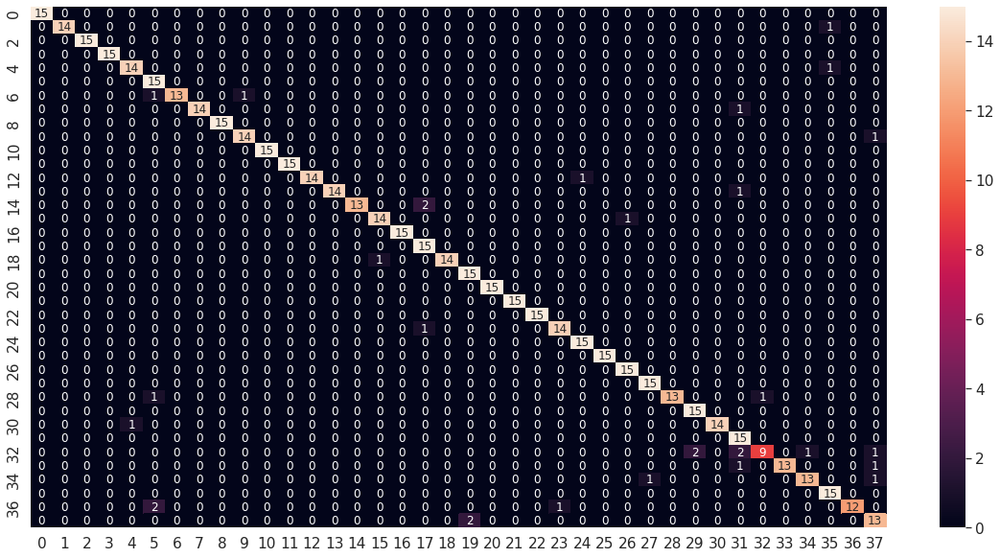

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale9_df_CM = pd.DataFrame(deepid_model_yale9_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale9_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        15
           5       0.93      0.93      0.93        15
           6       0.79      1.00      0.88        15
           7       1.00      0.87      0.93        15
           8       1.00      0.93      0.97        15
           9       1.00      1.00      1.00        15
          10       0.93      0.93      0.93        15
          11       1.00      1.00      1.00        15
          12       1.00      1.00      1.00        15
          13       1.00      0.93      0.97        15
          15       1.00      0.93      0.97        15
          16       1.00      0.87      0.93        15
          17       0.93      0.93      0.93        15
          18       1.00      1.00      1.00        15
          19       0.83    

#### Modelo 10: (BTH = 20, EHS = 60, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale10 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale10 = keras.Model(deepid_model.get_layer('input_5').get_output_at(node_index=0), deepid_model_yale10)
deepid_model_yale10.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_5[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale10.h5', monitor="val_loss", save_best_only=True)
hist_model_yale10 = deepid_model_yale10.fit(new_trainX, new_trainY, batch_size=20, epochs=60, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/60
74/74 [==============================] - 7s 71ms/step - loss: 4.2544 - accuracy: 0.0217 - val_loss: 4.0434 - val_accuracy: 0.0379
Epoch 2/60
74/74 [==============================] - 5s 64ms/step - loss: 3.9157 - accuracy: 0.0278 - val_loss: 3.8354 - val_accuracy: 0.0081
Epoch 3/60
74/74 [==============================] - 5s 64ms/step - loss: 3.7520 - accuracy: 0.0386 - val_loss: 3.7048 - val_accuracy: 0.0650
Epoch 4/60
74/74 [==============================] - 7s 93ms/step - loss: 3.5450 - accuracy: 0.0942 - val_loss: 3.3599 - val_accuracy: 0.1463
Epoch 5/60
74/74 [==============================] - 7s 94ms/step - loss: 2.7382 - accuracy: 0.2936 - val_loss: 2.1253 - val_accuracy: 0.4607
Epoch 6/60
74/74 [==============================] - 9s 125ms/step - loss: 1.6582 - accuracy: 0.5647 - val_loss: 1.5593 - val_accuracy: 0.6125
Epoch 7/60
74/74 [==============================] - 7s 101ms/step - loss: 1.0878 - accuracy: 0.7275 - val_loss: 1.0908 - val_accuracy: 0.7507
Epoch 8/60


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale10 = load_model(path + 'data_reconocimiento3/deepid_model_yale10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale10.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.1562 - accuracy: 0.9719


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

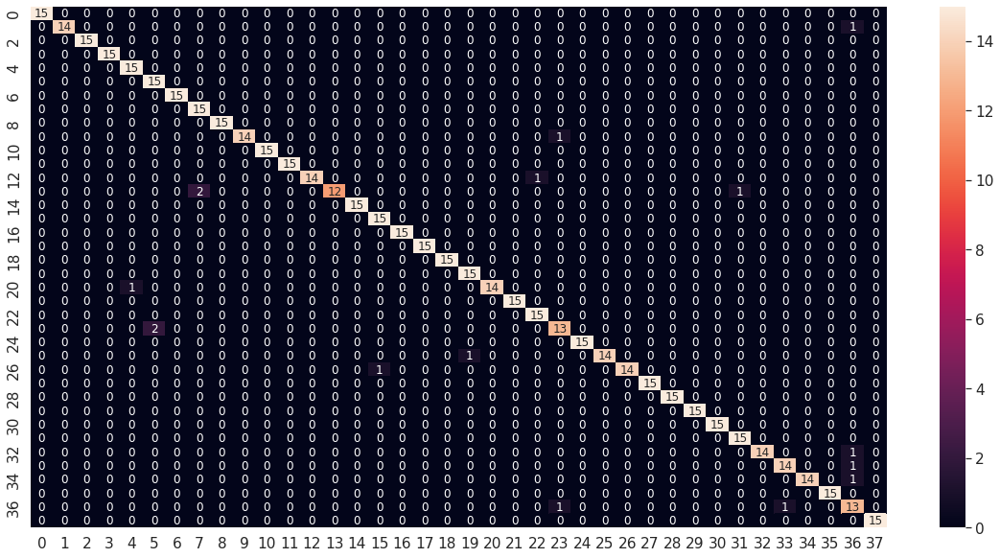

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale10_df_CM = pd.DataFrame(deepid_model_yale10_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale10_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        15
           5       0.94      1.00      0.97        15
           6       0.88      1.00      0.94        15
           7       1.00      1.00      1.00        15
           8       0.88      1.00      0.94        15
           9       1.00      1.00      1.00        15
          10       1.00      0.93      0.97        15
          11       1.00      1.00      1.00        15
          12       1.00      1.00      1.00        15
          13       1.00      0.93      0.97        15
          15       1.00      0.80      0.89        15
          16       1.00      1.00      1.00        15
          17       0.94      1.00      0.97        15
          18       1.00      1.00      1.00        15
          19       1.00    

#### Modelo 11: (BTH = 40, EHS = 60, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale11 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale11 = keras.Model(deepid_model.get_layer('input_6').get_output_at(node_index=0), deepid_model_yale11)
deepid_model_yale11.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_6[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale11.h5', monitor="val_loss", save_best_only=True)
hist_model_yale11 = deepid_model_yale11.fit(new_trainX, new_trainY, batch_size=40, epochs=60, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/60
37/37 [==============================] - 6s 124ms/step - loss: 4.3344 - accuracy: 0.0258 - val_loss: 4.1886 - val_accuracy: 0.0244
Epoch 2/60
37/37 [==============================] - 6s 166ms/step - loss: 4.0709 - accuracy: 0.0298 - val_loss: 3.9939 - val_accuracy: 0.0352
Epoch 3/60
37/37 [==============================] - 5s 131ms/step - loss: 3.8928 - accuracy: 0.0366 - val_loss: 3.8315 - val_accuracy: 0.0379
Epoch 4/60
37/37 [==============================] - 4s 117ms/step - loss: 3.6889 - accuracy: 0.0854 - val_loss: 3.4791 - val_accuracy: 0.1382
Epoch 5/60
37/37 [==============================] - 4s 118ms/step - loss: 3.0684 - accuracy: 0.2420 - val_loss: 2.5748 - val_accuracy: 0.3577
Epoch 6/60
37/37 [==============================] - 4s 119ms/step - loss: 2.0278 - accuracy: 0.4725 - val_loss: 1.6973 - val_accuracy: 0.5854
Epoch 7/60
37/37 [==============================] - 4s 120ms/step - loss: 1.3828 - accuracy: 0.6434 - val_loss: 1.2084 - val_accuracy: 0.6965
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale11 = load_model(path + 'data_reconocimiento3/deepid_model_yale11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale11.evaluate(testX, testY)

18/18 [==============================] - 0s 24ms/step - loss: 0.2268 - accuracy: 0.9632


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

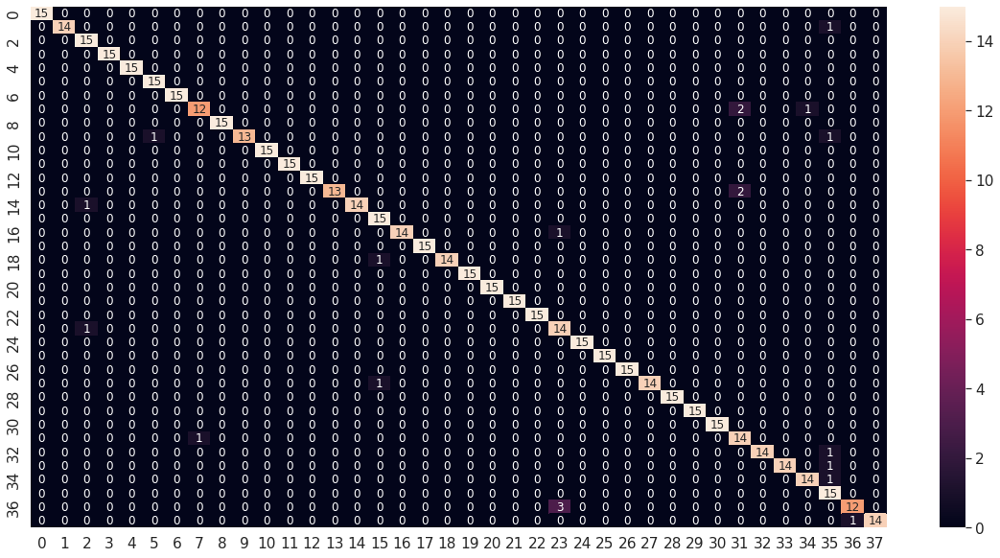

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale11_df_CM = pd.DataFrame(deepid_model_yale11_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale11_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       0.88      1.00      0.94        15
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        15
           6       0.94      1.00      0.97        15
           7       1.00      1.00      1.00        15
           8       0.92      0.80      0.86        15
           9       1.00      1.00      1.00        15
          10       1.00      0.87      0.93        15
          11       1.00      1.00      1.00        15
          12       1.00      1.00      1.00        15
          13       1.00      1.00      1.00        15
          15       1.00      0.87      0.93        15
          16       1.00      0.93      0.97        15
          17       0.88      1.00      0.94        15
          18       1.00      0.93      0.97        15
          19       1.00    

#### Modelo 12: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale12 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale12 = keras.Model(deepid_model.get_layer('input_9').get_output_at(node_index=0), deepid_model_yale12)
deepid_model_yale12.summary()

Model: "model_17"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_9[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_yale12.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale12.h5', monitor="val_loss", save_best_only=True)
hist_model_yale12 = deepid_model_yale12.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
50/50 [==============================] - 22s 416ms/step - loss: 4.3369 - accuracy: 0.0183 - val_loss: 4.2136 - val_accuracy: 0.0217
Epoch 2/100
50/50 [==============================] - 4s 89ms/step - loss: 4.1206 - accuracy: 0.0292 - val_loss: 4.0644 - val_accuracy: 0.0434
Epoch 3/100
50/50 [==============================] - 6s 124ms/step - loss: 4.0029 - accuracy: 0.0346 - val_loss: 3.9785 - val_accuracy: 0.0325
Epoch 4/100
50/50 [==============================] - 4s 89ms/step - loss: 3.9118 - accuracy: 0.0434 - val_loss: 3.9071 - val_accuracy: 0.0271
Epoch 5/100
50/50 [==============================] - 4s 89ms/step - loss: 3.8431 - accuracy: 0.0447 - val_loss: 3.8588 - val_accuracy: 0.0298
Epoch 6/100
50/50 [==============================] - 4s 89ms/step - loss: 3.7740 - accuracy: 0.0637 - val_loss: 3.7854 - val_accuracy: 0.0515
Epoch 7/100
50/50 [==============================] - 5s 91ms/step - loss: 3.6888 - accuracy: 0.0732 - val_loss: 3.7171 - val_accuracy: 0.0786
Epo

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale12 = load_model(path + 'data_reconocimiento3/deepid_model_yale12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale12.evaluate(testX, testY)

18/18 [==============================] - 0s 24ms/step - loss: 0.4392 - accuracy: 0.9246


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

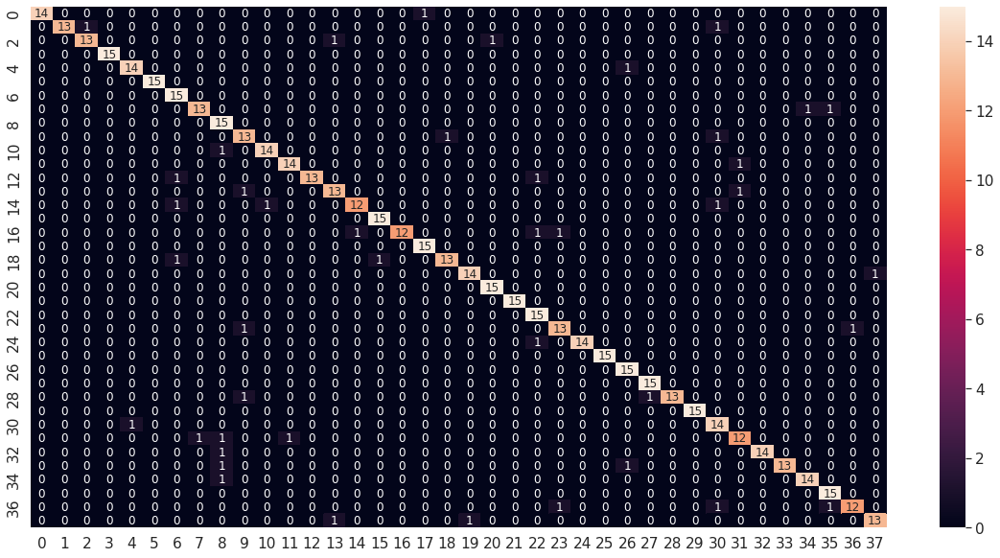

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale12_df_CM = pd.DataFrame(deepid_model_yale12_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale12_report)

              precision    recall  f1-score   support

           1       1.00      0.93      0.97        15
           2       1.00      0.87      0.93        15
           3       0.93      0.87      0.90        15
           4       1.00      1.00      1.00        15
           5       0.93      0.93      0.93        15
           6       1.00      1.00      1.00        15
           7       0.83      1.00      0.91        15
           8       0.93      0.87      0.90        15
           9       0.75      1.00      0.86        15
          10       0.81      0.87      0.84        15
          11       0.93      0.93      0.93        15
          12       0.93      0.93      0.93        15
          13       1.00      0.87      0.93        15
          15       0.87      0.87      0.87        15
          16       0.92      0.80      0.86        15
          17       0.94      1.00      0.97        15
          18       1.00      0.80      0.89        15
          19       0.94    

#### Modelo 13: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale13 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale13 = keras.Model(deepid_model.get_layer('input_10').get_output_at(node_index=0), deepid_model_yale13)
deepid_model_yale13.summary()

Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_10[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_yale13.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale13.h5', monitor="val_loss", save_best_only=True)
hist_model_yale13 = deepid_model_yale13.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
74/74 [==============================] - 9s 96ms/step - loss: 4.3042 - accuracy: 0.0258 - val_loss: 4.1683 - val_accuracy: 0.0271
Epoch 2/100
74/74 [==============================] - 5s 64ms/step - loss: 4.0695 - accuracy: 0.0353 - val_loss: 4.0152 - val_accuracy: 0.0244
Epoch 3/100
74/74 [==============================] - 6s 77ms/step - loss: 3.9418 - accuracy: 0.0393 - val_loss: 3.9263 - val_accuracy: 0.0298
Epoch 4/100
74/74 [==============================] - 5s 66ms/step - loss: 3.8530 - accuracy: 0.0461 - val_loss: 3.8571 - val_accuracy: 0.0650
Epoch 5/100
74/74 [==============================] - 5s 64ms/step - loss: 3.7675 - accuracy: 0.0651 - val_loss: 3.7735 - val_accuracy: 0.0596
Epoch 6/100
74/74 [==============================] - 5s 64ms/step - loss: 3.6593 - accuracy: 0.0854 - val_loss: 3.6724 - val_accuracy: 0.0542
Epoch 7/100
74/74 [==============================] - 5s 66ms/step - loss: 3.4816 - accuracy: 0.1336 - val_loss: 3.4767 - val_accuracy: 0.1247
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale13 = load_model(path + 'data_reconocimiento3/deepid_model_yale13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale13.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.4626 - accuracy: 0.9088


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

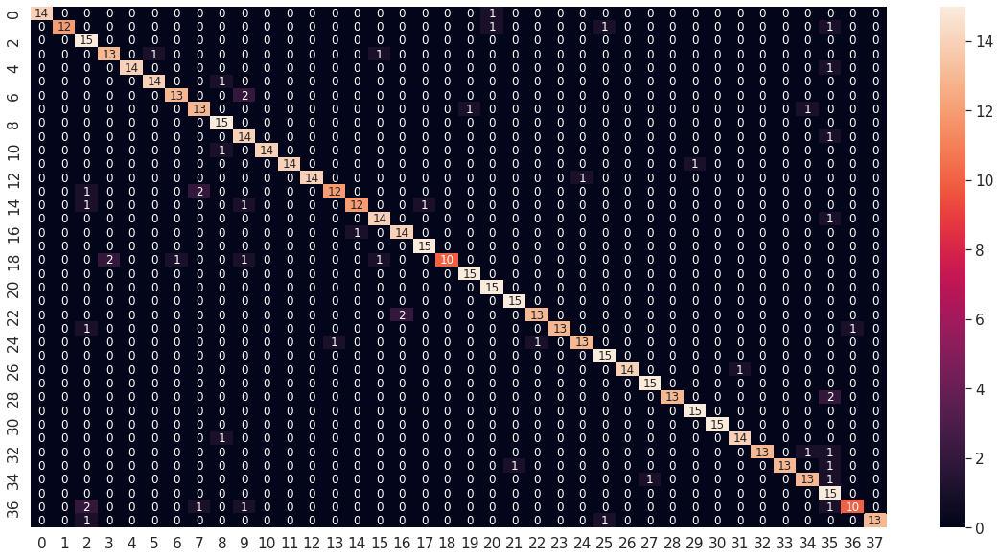

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale13_df_CM = pd.DataFrame(deepid_model_yale13_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale13_report)

              precision    recall  f1-score   support

           1       1.00      0.93      0.97        15
           2       1.00      0.80      0.89        15
           3       0.71      1.00      0.83        15
           4       0.87      0.87      0.87        15
           5       1.00      0.93      0.97        15
           6       0.93      0.93      0.93        15
           7       0.93      0.87      0.90        15
           8       0.81      0.87      0.84        15
           9       0.83      1.00      0.91        15
          10       0.74      0.93      0.82        15
          11       1.00      0.93      0.97        15
          12       1.00      0.93      0.97        15
          13       1.00      0.93      0.97        15
          15       0.92      0.80      0.86        15
          16       0.92      0.80      0.86        15
          17       0.88      0.93      0.90        15
          18       0.88      0.93      0.90        15
          19       0.94    

#### Modelo 14: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale14 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale14 = keras.Model(deepid_model.get_layer('input_11').get_output_at(node_index=0), deepid_model_yale14)
deepid_model_yale14.summary()

Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_11[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_yale14.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale14.h5', monitor="val_loss", save_best_only=True)
hist_model_yale14 = deepid_model_yale14.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
37/37 [==============================] - 8s 191ms/step - loss: 4.3892 - accuracy: 0.0237 - val_loss: 4.2683 - val_accuracy: 0.0244
Epoch 2/100
37/37 [==============================] - 4s 120ms/step - loss: 4.1812 - accuracy: 0.0251 - val_loss: 4.1167 - val_accuracy: 0.0623
Epoch 3/100
37/37 [==============================] - 4s 117ms/step - loss: 4.0451 - accuracy: 0.0373 - val_loss: 4.0031 - val_accuracy: 0.0650
Epoch 4/100
37/37 [==============================] - 4s 116ms/step - loss: 3.9277 - accuracy: 0.0617 - val_loss: 3.8819 - val_accuracy: 0.0705
Epoch 5/100
37/37 [==============================] - 4s 117ms/step - loss: 3.7745 - accuracy: 0.0956 - val_loss: 3.6700 - val_accuracy: 0.1274
Epoch 6/100
37/37 [==============================] - 6s 158ms/step - loss: 3.5426 - accuracy: 0.1369 - val_loss: 3.3627 - val_accuracy: 0.1653
Epoch 7/100
37/37 [==============================] - 5s 121ms/step - loss: 3.2215 - accuracy: 0.2027 - val_loss: 2.9769 - val_accuracy: 0.2846

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale14 = load_model(path + 'data_reconocimiento3/deepid_model_yale14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale14.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.4480 - accuracy: 0.9298


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

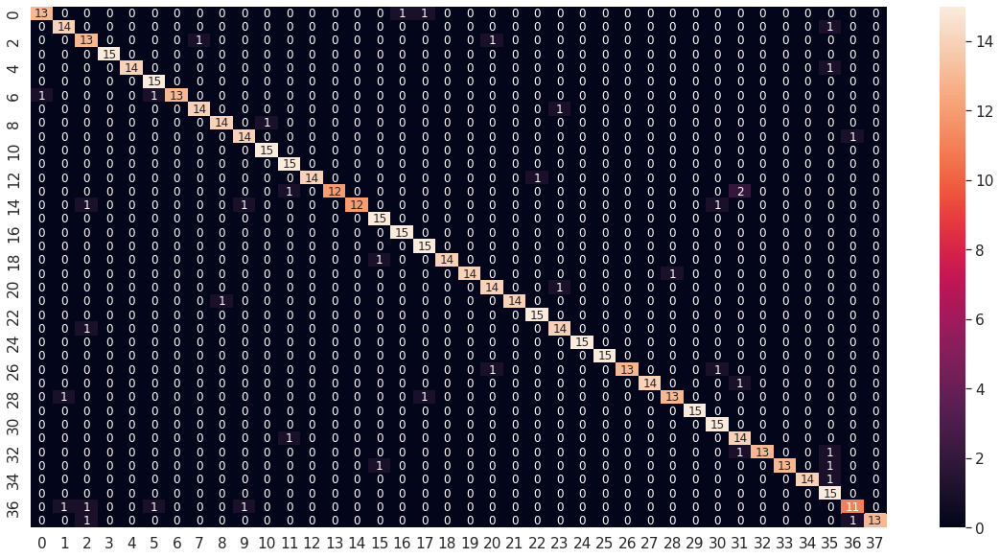

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale14_df_CM = pd.DataFrame(deepid_model_yale14_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale14_report)

              precision    recall  f1-score   support

           1       0.93      0.87      0.90        15
           2       0.88      0.93      0.90        15
           3       0.76      0.87      0.81        15
           4       1.00      1.00      1.00        15
           5       1.00      0.93      0.97        15
           6       0.88      1.00      0.94        15
           7       1.00      0.87      0.93        15
           8       0.93      0.93      0.93        15
           9       0.93      0.93      0.93        15
          10       0.88      0.93      0.90        15
          11       0.94      1.00      0.97        15
          12       0.88      1.00      0.94        15
          13       1.00      0.93      0.97        15
          15       1.00      0.80      0.89        15
          16       1.00      0.80      0.89        15
          17       0.88      1.00      0.94        15
          18       0.94      1.00      0.97        15
          19       0.88    

#### Modelo 15: (BTH = 30, EHS = 80, ValidSplit = 0.2, Dropout=0.3, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale15 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale15 = keras.Model(deepid_model.get_layer('input_18').get_output_at(node_index=0), deepid_model_yale15)
deepid_model_yale15.summary()

Model: "model_34"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_18[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale15.h5', monitor="val_loss", save_best_only=True)
hist_model_yale15 = deepid_model_yale15.fit(new_trainX, new_trainY, batch_size=30, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
50/50 [==============================] - 9s 154ms/step - loss: 4.3386 - accuracy: 0.0231 - val_loss: 4.1759 - val_accuracy: 0.0190
Epoch 2/80
50/50 [==============================] - 6s 116ms/step - loss: 4.0397 - accuracy: 0.0271 - val_loss: 3.9579 - val_accuracy: 0.0217
Epoch 3/80
50/50 [==============================] - 4s 90ms/step - loss: 3.8550 - accuracy: 0.0325 - val_loss: 3.8163 - val_accuracy: 0.0271
Epoch 4/80
50/50 [==============================] - 4s 89ms/step - loss: 3.7325 - accuracy: 0.0420 - val_loss: 3.7309 - val_accuracy: 0.0488
Epoch 5/80
50/50 [==============================] - 4s 89ms/step - loss: 3.5814 - accuracy: 0.0651 - val_loss: 3.6224 - val_accuracy: 0.0732
Epoch 6/80
50/50 [==============================] - 4s 89ms/step - loss: 3.2188 - accuracy: 0.1566 - val_loss: 3.0504 - val_accuracy: 0.2168
Epoch 7/80
50/50 [==============================] - 4s 90ms/step - loss: 2.6780 - accuracy: 0.2875 - val_loss: 2.0974 - val_accuracy: 0.5041
Epoch 8/80


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale15 = load_model(path + 'data_reconocimiento3/deepid_model_yale15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale15.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.2059 - accuracy: 0.9614


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

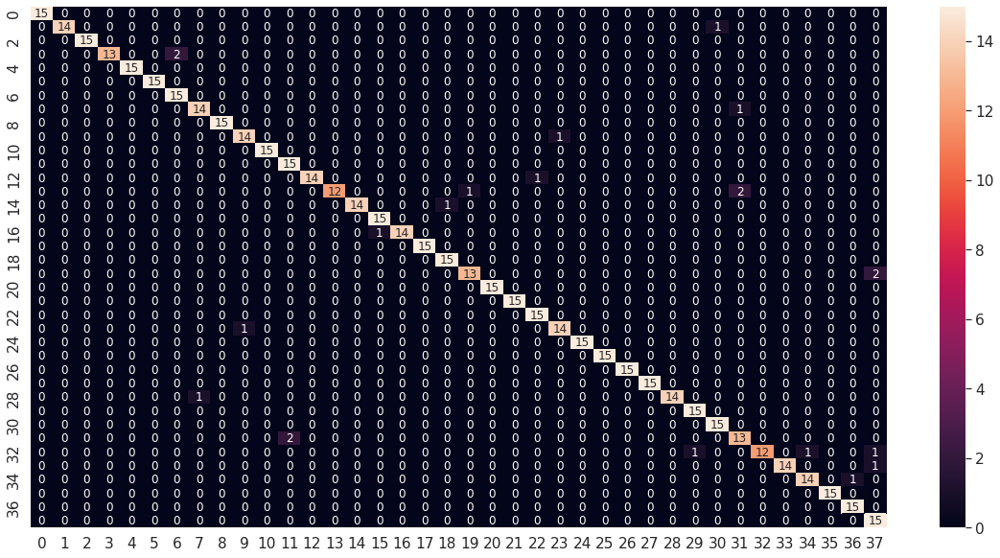

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale15_df_CM = pd.DataFrame(deepid_model_yale15_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale15_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       1.00      1.00      1.00        15
           4       1.00      0.87      0.93        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       0.88      1.00      0.94        15
           8       0.93      0.93      0.93        15
           9       1.00      1.00      1.00        15
          10       0.93      0.93      0.93        15
          11       1.00      1.00      1.00        15
          12       0.88      1.00      0.94        15
          13       1.00      0.93      0.97        15
          15       1.00      0.80      0.89        15
          16       1.00      0.93      0.97        15
          17       0.94      1.00      0.97        15
          18       1.00      0.93      0.97        15
          19       1.00    

#### Modelo 16: (BTH = 30, EHS = 80, ValidSplit = 0.2, Dropout=0.1, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale16 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale16 = keras.Model(deepid_model.get_layer('input_20').get_output_at(node_index=0), deepid_model_yale16)
deepid_model_yale16.summary()

Model: "model_37"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_20 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_20[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale16.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale16.h5', monitor="val_loss", save_best_only=True)
hist_model_yale16 = deepid_model_yale16.fit(new_trainX, new_trainY, batch_size=30, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
50/50 [==============================] - 6s 103ms/step - loss: 4.3058 - accuracy: 0.0217 - val_loss: 4.1056 - val_accuracy: 0.0298
Epoch 2/80
50/50 [==============================] - 4s 88ms/step - loss: 3.9639 - accuracy: 0.0488 - val_loss: 3.8257 - val_accuracy: 0.0678
Epoch 3/80
50/50 [==============================] - 7s 144ms/step - loss: 3.3773 - accuracy: 0.1702 - val_loss: 2.7668 - val_accuracy: 0.2954
Epoch 4/80
50/50 [==============================] - 7s 145ms/step - loss: 1.9702 - accuracy: 0.4963 - val_loss: 1.4466 - val_accuracy: 0.6206
Epoch 5/80
50/50 [==============================] - 8s 156ms/step - loss: 1.0717 - accuracy: 0.7444 - val_loss: 1.0681 - val_accuracy: 0.7100
Epoch 6/80
50/50 [==============================] - 5s 104ms/step - loss: 0.6228 - accuracy: 0.8563 - val_loss: 0.6643 - val_accuracy: 0.8564
Epoch 7/80
50/50 [==============================] - 4s 89ms/step - loss: 0.4670 - accuracy: 0.9085 - val_loss: 0.6063 - val_accuracy: 0.8753
Epoch 8/

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale16 = load_model(path + 'data_reconocimiento3/deepid_model_yale16.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale16.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale16.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.1558 - accuracy: 0.9772


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale16.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale16_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

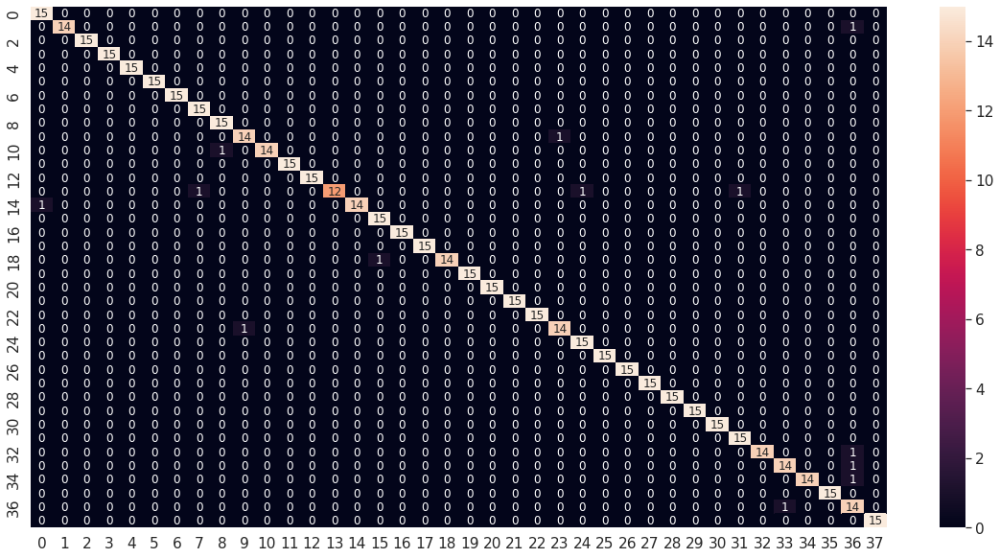

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale16_df_CM = pd.DataFrame(deepid_model_yale16_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale16_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale16_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale16_report)

              precision    recall  f1-score   support

           1       0.94      1.00      0.97        15
           2       1.00      0.93      0.97        15
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       0.94      1.00      0.97        15
           9       0.94      1.00      0.97        15
          10       0.93      0.93      0.93        15
          11       1.00      0.93      0.97        15
          12       1.00      1.00      1.00        15
          13       1.00      1.00      1.00        15
          15       1.00      0.80      0.89        15
          16       1.00      0.93      0.97        15
          17       0.94      1.00      0.97        15
          18       1.00      1.00      1.00        15
          19       1.00    

#### Modelo 17: (BTH = 20, EHS = 80, ValidSplit = 0.2, Dropout=0.1, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale17 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale17 = keras.Model(deepid_model.get_layer('input_22').get_output_at(node_index=0), deepid_model_yale17)
deepid_model_yale17.summary()

Model: "model_41"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_22[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale17.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale17.h5', monitor="val_loss", save_best_only=True)
hist_model_yale17 = deepid_model_yale17.fit(new_trainX, new_trainY, batch_size=20, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
74/74 [==============================] - 9s 108ms/step - loss: 4.2438 - accuracy: 0.0244 - val_loss: 4.0238 - val_accuracy: 0.0217
Epoch 2/80
74/74 [==============================] - 5s 74ms/step - loss: 3.8861 - accuracy: 0.0312 - val_loss: 3.8019 - val_accuracy: 0.0244
Epoch 3/80
74/74 [==============================] - 5s 66ms/step - loss: 3.6192 - accuracy: 0.0644 - val_loss: 3.1948 - val_accuracy: 0.2033
Epoch 4/80
74/74 [==============================] - 5s 65ms/step - loss: 2.5226 - accuracy: 0.3180 - val_loss: 1.8895 - val_accuracy: 0.5041
Epoch 5/80
74/74 [==============================] - 5s 66ms/step - loss: 1.3369 - accuracy: 0.6339 - val_loss: 1.1058 - val_accuracy: 0.7209
Epoch 6/80
74/74 [==============================] - 5s 66ms/step - loss: 0.7843 - accuracy: 0.7959 - val_loss: 0.8016 - val_accuracy: 0.7967
Epoch 7/80
74/74 [==============================] - 5s 66ms/step - loss: 0.4738 - accuracy: 0.8841 - val_loss: 0.6823 - val_accuracy: 0.8157
Epoch 8/80
7

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale17 = load_model(path + 'data_reconocimiento3/deepid_model_yale17.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale17.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale17.evaluate(testX, testY)

18/18 [==============================] - 0s 24ms/step - loss: 0.0987 - accuracy: 0.9789


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale17.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale17_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

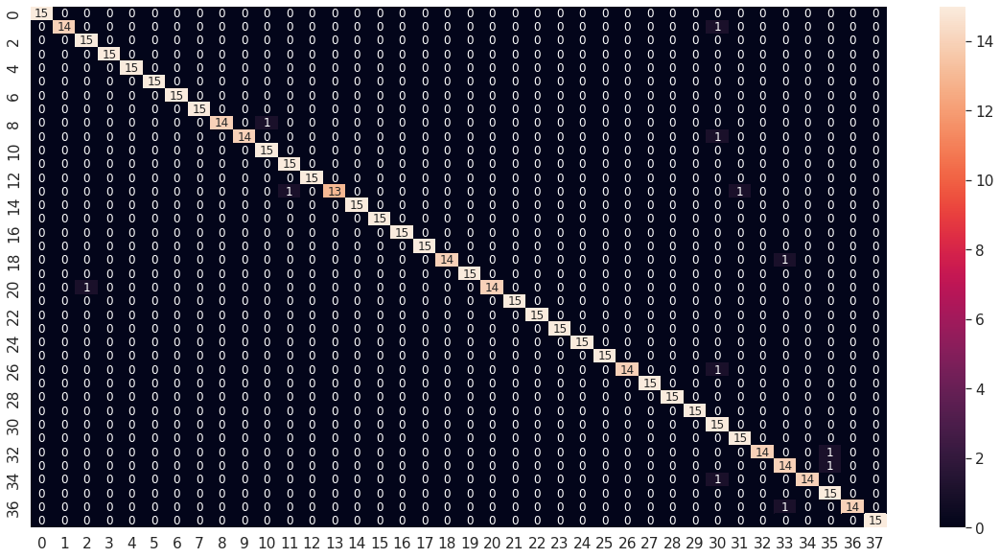

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale17_df_CM = pd.DataFrame(deepid_model_yale17_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale17_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale17_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale17_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       0.94      1.00      0.97        15
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       1.00      1.00      1.00        15
           9       1.00      0.93      0.97        15
          10       1.00      0.93      0.97        15
          11       0.94      1.00      0.97        15
          12       0.94      1.00      0.97        15
          13       1.00      1.00      1.00        15
          15       1.00      0.87      0.93        15
          16       1.00      1.00      1.00        15
          17       1.00      1.00      1.00        15
          18       1.00      1.00      1.00        15
          19       1.00    

#### Modelo 18: (BTH = 40, EHS = 80, ValidSplit = 0.2, Dropout=0.1, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale18 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale18 = keras.Model(deepid_model.get_layer('input_23').get_output_at(node_index=0), deepid_model_yale18)
deepid_model_yale18.summary()

Model: "model_43"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_23 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_23[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale18.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale18.h5', monitor="val_loss", save_best_only=True)
hist_model_yale18 = deepid_model_yale18.fit(new_trainX, new_trainY, batch_size=40, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
37/37 [==============================] - 7s 164ms/step - loss: 4.3377 - accuracy: 0.0190 - val_loss: 4.1748 - val_accuracy: 0.0190
Epoch 2/80
37/37 [==============================] - 5s 143ms/step - loss: 4.0611 - accuracy: 0.0278 - val_loss: 3.9792 - val_accuracy: 0.0163
Epoch 3/80
37/37 [==============================] - 5s 142ms/step - loss: 3.8779 - accuracy: 0.0420 - val_loss: 3.8059 - val_accuracy: 0.0759
Epoch 4/80
37/37 [==============================] - 4s 119ms/step - loss: 3.5646 - accuracy: 0.1044 - val_loss: 3.1592 - val_accuracy: 0.1789
Epoch 5/80
37/37 [==============================] - 6s 168ms/step - loss: 2.6528 - accuracy: 0.3003 - val_loss: 1.9868 - val_accuracy: 0.4743
Epoch 6/80
37/37 [==============================] - 4s 120ms/step - loss: 1.5963 - accuracy: 0.5769 - val_loss: 1.3886 - val_accuracy: 0.6477
Epoch 7/80
37/37 [==============================] - 4s 119ms/step - loss: 1.0445 - accuracy: 0.7261 - val_loss: 0.9662 - val_accuracy: 0.7561
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale18 = load_model(path + 'data_reconocimiento3/deepid_model_yale18.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale18.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale18.evaluate(testX, testY)

18/18 [==============================] - 1s 46ms/step - loss: 0.1701 - accuracy: 0.9614


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale18.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale18_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

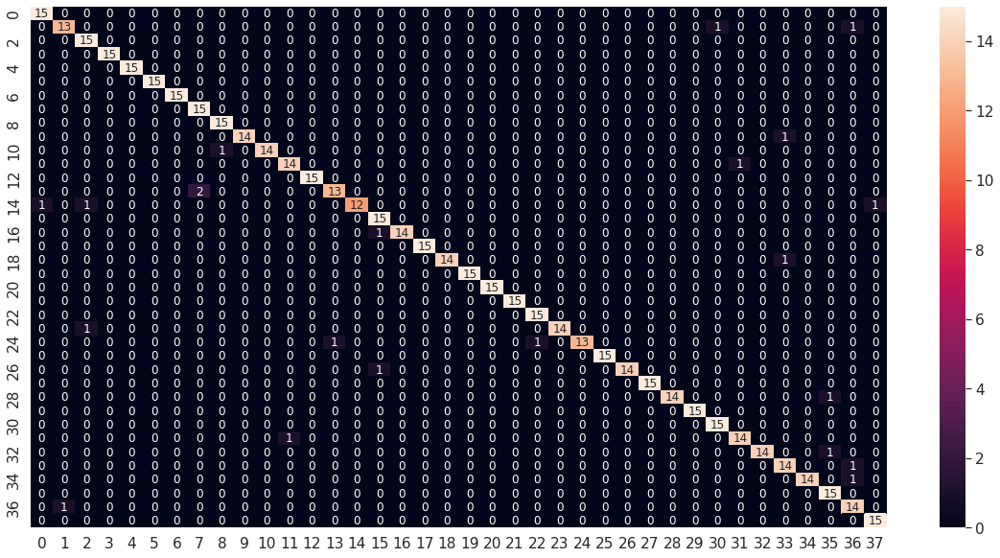

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale18_df_CM = pd.DataFrame(deepid_model_yale18_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale18_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale18_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale18_report)

              precision    recall  f1-score   support

           1       0.94      1.00      0.97        15
           2       0.93      0.87      0.90        15
           3       0.88      1.00      0.94        15
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       0.88      1.00      0.94        15
           9       0.94      1.00      0.97        15
          10       1.00      0.93      0.97        15
          11       1.00      0.93      0.97        15
          12       0.93      0.93      0.93        15
          13       1.00      1.00      1.00        15
          15       0.93      0.87      0.90        15
          16       1.00      0.80      0.89        15
          17       0.88      1.00      0.94        15
          18       1.00      0.93      0.97        15
          19       1.00    

#### Modelo 19: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.4, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale19 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale19 = keras.Model(deepid_model.get_layer('input_24').get_output_at(node_index=0), deepid_model_yale19)
deepid_model_yale19.summary()

Model: "model_45"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_24 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_24[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale19.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale19.h5', monitor="val_loss", save_best_only=True)
hist_model_yale19 = deepid_model_yale19.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
50/50 [==============================] - 8s 136ms/step - loss: 4.3350 - accuracy: 0.0231 - val_loss: 4.1674 - val_accuracy: 0.0271
Epoch 2/100
50/50 [==============================] - 8s 150ms/step - loss: 4.0464 - accuracy: 0.0264 - val_loss: 3.9566 - val_accuracy: 0.0244
Epoch 3/100
50/50 [==============================] - 7s 145ms/step - loss: 3.8661 - accuracy: 0.0237 - val_loss: 3.8380 - val_accuracy: 0.0461
Epoch 4/100
50/50 [==============================] - 9s 186ms/step - loss: 3.7340 - accuracy: 0.0353 - val_loss: 3.7576 - val_accuracy: 0.0461
Epoch 5/100
50/50 [==============================] - 8s 164ms/step - loss: 3.5825 - accuracy: 0.0712 - val_loss: 3.4820 - val_accuracy: 0.1003
Epoch 6/100
50/50 [==============================] - 7s 139ms/step - loss: 3.3572 - accuracy: 0.1105 - val_loss: 3.3155 - val_accuracy: 0.1084
Epoch 7/100
50/50 [==============================] - 7s 137ms/step - loss: 2.9903 - accuracy: 0.2014 - val_loss: 2.8303 - val_accuracy: 0.2575

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale19 = load_model(path + 'data_reconocimiento3/deepid_model_yale19.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale19.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale19.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.1682 - accuracy: 0.9754


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale19.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale19_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

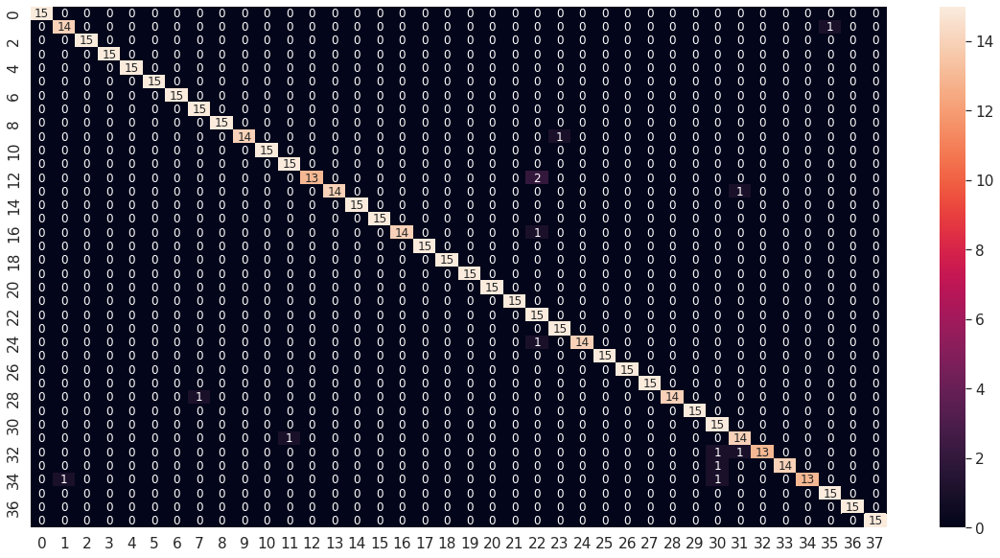

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale19_df_CM = pd.DataFrame(deepid_model_yale19_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale19_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale19_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale19_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       0.93      0.93      0.93        15
           3       1.00      1.00      1.00        15
           4       1.00      1.00      1.00        15
           5       1.00      1.00      1.00        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       0.94      1.00      0.97        15
           9       1.00      1.00      1.00        15
          10       1.00      0.93      0.97        15
          11       1.00      1.00      1.00        15
          12       0.94      1.00      0.97        15
          13       1.00      0.87      0.93        15
          15       1.00      0.93      0.97        15
          16       1.00      1.00      1.00        15
          17       1.00      1.00      1.00        15
          18       1.00      0.93      0.97        15
          19       1.00    

#### Modelo 20: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0.4, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_yale20 = layers.Dense(40, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_yale20 = keras.Model(deepid_model.get_layer('input_25').get_output_at(node_index=0), deepid_model_yale20)
deepid_model_yale20.summary()

Model: "model_47"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_25[0][0]']               
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_yale20.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/deepid_model_yale20.h5', monitor="val_loss", save_best_only=True)
hist_model_yale20 = deepid_model_yale20.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
74/74 [==============================] - 7s 82ms/step - loss: 4.3022 - accuracy: 0.0258 - val_loss: 4.0944 - val_accuracy: 0.0271
Epoch 2/100
74/74 [==============================] - 5s 63ms/step - loss: 3.9654 - accuracy: 0.0305 - val_loss: 3.8933 - val_accuracy: 0.0108
Epoch 3/100
74/74 [==============================] - 5s 63ms/step - loss: 3.7992 - accuracy: 0.0346 - val_loss: 3.7780 - val_accuracy: 0.0461
Epoch 4/100
74/74 [==============================] - 5s 64ms/step - loss: 3.6735 - accuracy: 0.0447 - val_loss: 3.6739 - val_accuracy: 0.0840
Epoch 5/100
74/74 [==============================] - 5s 63ms/step - loss: 3.4967 - accuracy: 0.0861 - val_loss: 3.5664 - val_accuracy: 0.0840
Epoch 6/100
74/74 [==============================] - 5s 62ms/step - loss: 3.2379 - accuracy: 0.1559 - val_loss: 3.2378 - val_accuracy: 0.1247
Epoch 7/100
74/74 [==============================] - 5s 73ms/step - loss: 2.9376 - accuracy: 0.2190 - val_loss: 2.7443 - val_accuracy: 0.2602
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_yale20 = load_model(path + 'data_reconocimiento3/deepid_model_yale20.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_yale20.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_yale20.evaluate(testX, testY)

18/18 [==============================] - 0s 23ms/step - loss: 0.2194 - accuracy: 0.9719


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_yale20.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_yale20_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

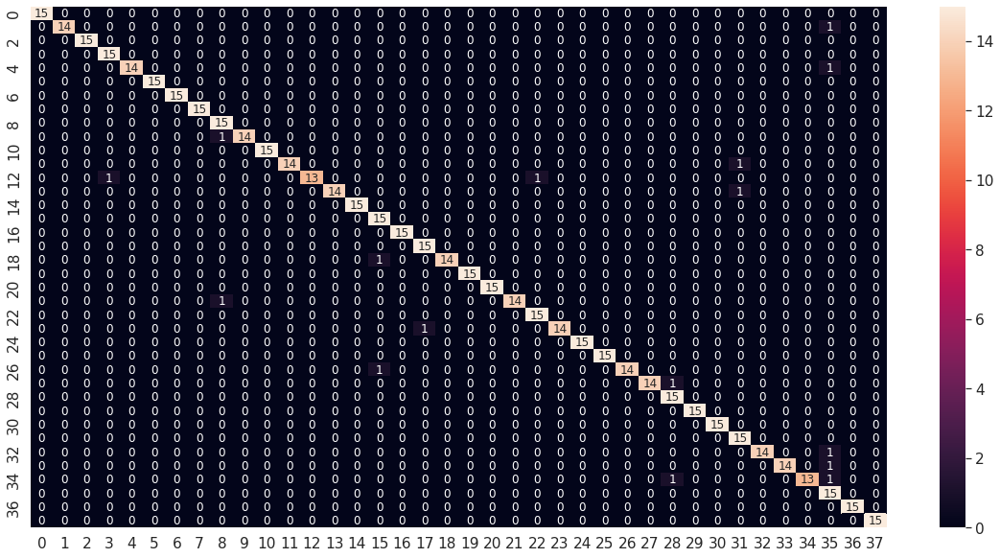

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_yale20_df_CM = pd.DataFrame(deepid_model_yale20_CM, range(38), range(38))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_yale20_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_yale20_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_yale20_report)

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        15
           2       1.00      0.93      0.97        15
           3       1.00      1.00      1.00        15
           4       0.94      1.00      0.97        15
           5       1.00      0.93      0.97        15
           6       1.00      1.00      1.00        15
           7       1.00      1.00      1.00        15
           8       1.00      1.00      1.00        15
           9       0.88      1.00      0.94        15
          10       1.00      0.93      0.97        15
          11       1.00      1.00      1.00        15
          12       1.00      0.93      0.97        15
          13       1.00      0.87      0.93        15
          15       1.00      0.93      0.97        15
          16       1.00      1.00      1.00        15
          17       0.88      1.00      0.94        15
          18       1.00      1.00      1.00        15
          19       0.94    

## 5. Modelos con base de datos ROF1 para condiciones de oclusión

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_1 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_1 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_1)
deepid_model_rof1_1.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)  
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_1.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_1 = deepid_model_rof1_1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
27/27 [==============================] - 10s 45ms/step - loss: 2.5277 - accuracy: 0.1013 - val_loss: 2.5002 - val_accuracy: 0.1000
Epoch 2/70
27/27 [==============================] - 0s 10ms/step - loss: 2.3711 - accuracy: 0.1700 - val_loss: 2.3115 - val_accuracy: 0.1550
Epoch 3/70
27/27 [==============================] - 0s 10ms/step - loss: 2.1384 - accuracy: 0.3013 - val_loss: 2.1790 - val_accuracy: 0.2550
Epoch 4/70
27/27 [==============================] - 0s 10ms/step - loss: 1.8938 - accuracy: 0.3500 - val_loss: 1.8342 - val_accuracy: 0.4250
Epoch 5/70
27/27 [==============================] - 0s 7ms/step - loss: 1.6475 - accuracy: 0.4800 - val_loss: 1.8619 - val_accuracy: 0.3800
Epoch 6/70
27/27 [==============================] - 0s 10ms/step - loss: 1.4840 - accuracy: 0.5412 - val_loss: 1.6375 - val_accuracy: 0.4750
Epoch 7/70
27/27 [==============================] - 0s 11ms/step - loss: 1.1980 - accuracy: 0.6425 - val_loss: 1.5874 - val_accuracy: 0.5400
Epoch 8/70
27

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_1 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_1.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.7370 - accuracy: 0.3050


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


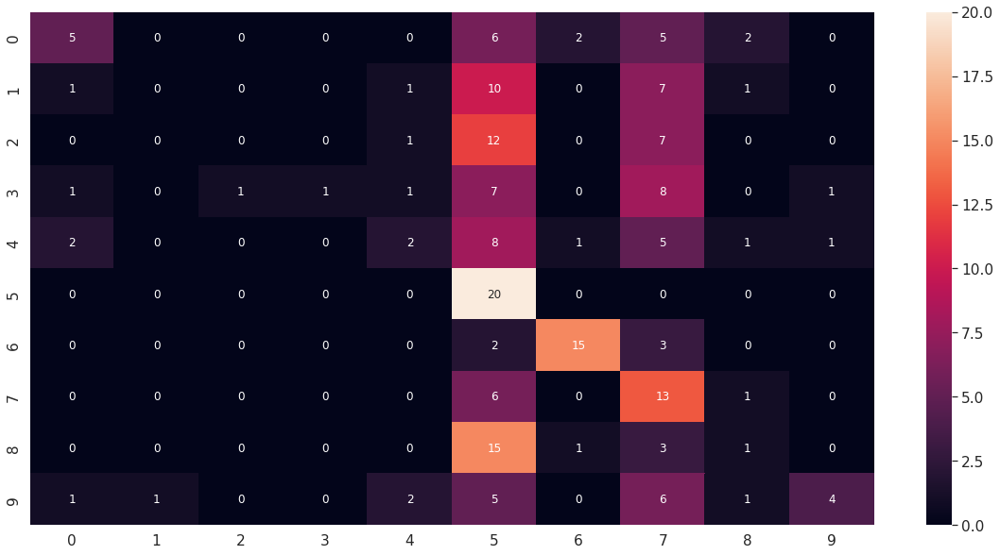

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_1_df_CM = pd.DataFrame(deepid_model_rof1_1_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_1_report)

              precision    recall  f1-score   support

           1       0.50      0.25      0.33        20
           2       0.00      0.00      0.00        20
           3       0.00      0.00      0.00        20
           4       1.00      0.05      0.10        20
           5       0.29      0.10      0.15        20
           6       0.22      1.00      0.36        20
           7       0.79      0.75      0.77        20
           8       0.23      0.65      0.34        20
           9       0.14      0.05      0.07        20
          10       0.67      0.20      0.31        20

    accuracy                           0.30       200
   macro avg       0.38      0.30      0.24       200
weighted avg       0.38      0.30      0.24       200



#### Modelo 2: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_2 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_2 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_2)
deepid_model_rof1_2.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_2.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_2 = deepid_model_rof1_2.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
27/27 [==============================] - 2s 39ms/step - loss: 4.1063 - accuracy: 0.2288 - val_loss: 2.3302 - val_accuracy: 0.2200
Epoch 2/100
27/27 [==============================] - 0s 12ms/step - loss: 1.7650 - accuracy: 0.4875 - val_loss: 1.8659 - val_accuracy: 0.4250
Epoch 3/100
27/27 [==============================] - 0s 13ms/step - loss: 1.1445 - accuracy: 0.6913 - val_loss: 1.4734 - val_accuracy: 0.5950
Epoch 4/100
27/27 [==============================] - 0s 10ms/step - loss: 0.7565 - accuracy: 0.8100 - val_loss: 1.5143 - val_accuracy: 0.6100
Epoch 5/100
27/27 [==============================] - 0s 12ms/step - loss: 0.5290 - accuracy: 0.8800 - val_loss: 1.1922 - val_accuracy: 0.7150
Epoch 6/100
27/27 [==============================] - 0s 8ms/step - loss: 0.3512 - accuracy: 0.9400 - val_loss: 1.2772 - val_accuracy: 0.6900
Epoch 7/100
27/27 [==============================] - 0s 7ms/step - loss: 0.2643 - accuracy: 0.9613 - val_loss: 1.5176 - val_accuracy: 0.6450
Epoch 8/

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_2 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_2.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 2.7853 - accuracy: 0.4100


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


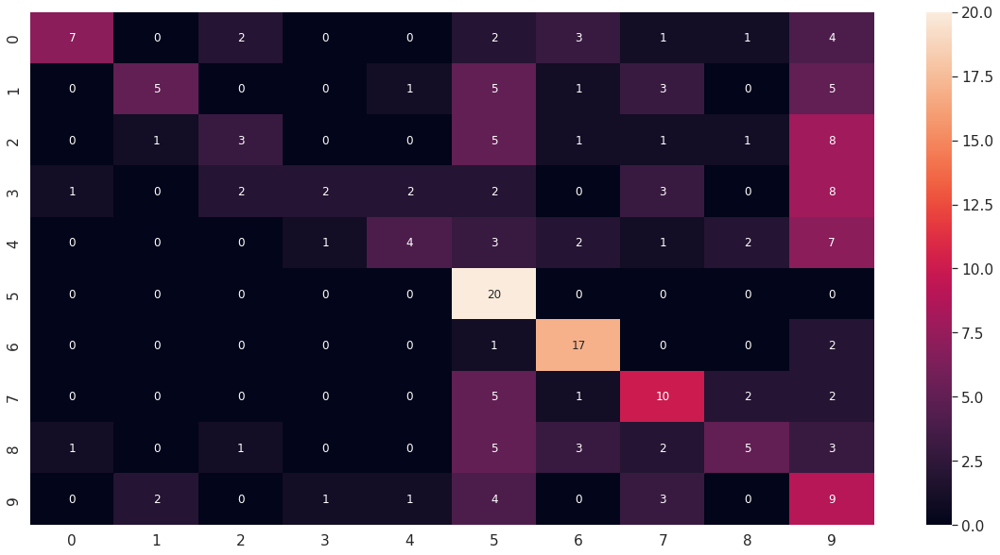

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_2_df_CM = pd.DataFrame(deepid_model_rof1_2_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_2_report)

              precision    recall  f1-score   support

           1       0.78      0.35      0.48        20
           2       0.62      0.25      0.36        20
           3       0.38      0.15      0.21        20
           4       0.50      0.10      0.17        20
           5       0.50      0.20      0.29        20
           6       0.38      1.00      0.56        20
           7       0.61      0.85      0.71        20
           8       0.42      0.50      0.45        20
           9       0.45      0.25      0.32        20
          10       0.19      0.45      0.26        20

    accuracy                           0.41       200
   macro avg       0.48      0.41      0.38       200
weighted avg       0.48      0.41      0.38       200



#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_3 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_3 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_3)
deepid_model_rof1_3.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_3.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_3 = deepid_model_rof1_3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
20/20 [==============================] - 2s 65ms/step - loss: 9.6632 - accuracy: 0.1250 - val_loss: 3.0773 - val_accuracy: 0.2050
Epoch 2/100
20/20 [==============================] - 0s 12ms/step - loss: 2.2752 - accuracy: 0.3350 - val_loss: 1.9284 - val_accuracy: 0.3900
Epoch 3/100
20/20 [==============================] - 0s 12ms/step - loss: 1.5404 - accuracy: 0.5263 - val_loss: 1.5487 - val_accuracy: 0.5500
Epoch 4/100
20/20 [==============================] - 0s 12ms/step - loss: 1.1285 - accuracy: 0.6463 - val_loss: 1.2298 - val_accuracy: 0.6450
Epoch 5/100
20/20 [==============================] - 0s 13ms/step - loss: 0.7888 - accuracy: 0.7912 - val_loss: 0.9873 - val_accuracy: 0.7400
Epoch 6/100
20/20 [==============================] - 0s 12ms/step - loss: 0.5672 - accuracy: 0.8687 - val_loss: 0.8537 - val_accuracy: 0.7600
Epoch 7/100
20/20 [==============================] - 0s 12ms/step - loss: 0.4065 - accuracy: 0.9275 - val_loss: 0.8367 - val_accuracy: 0.7650
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_3 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_3.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 3.6122 - accuracy: 0.4150


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


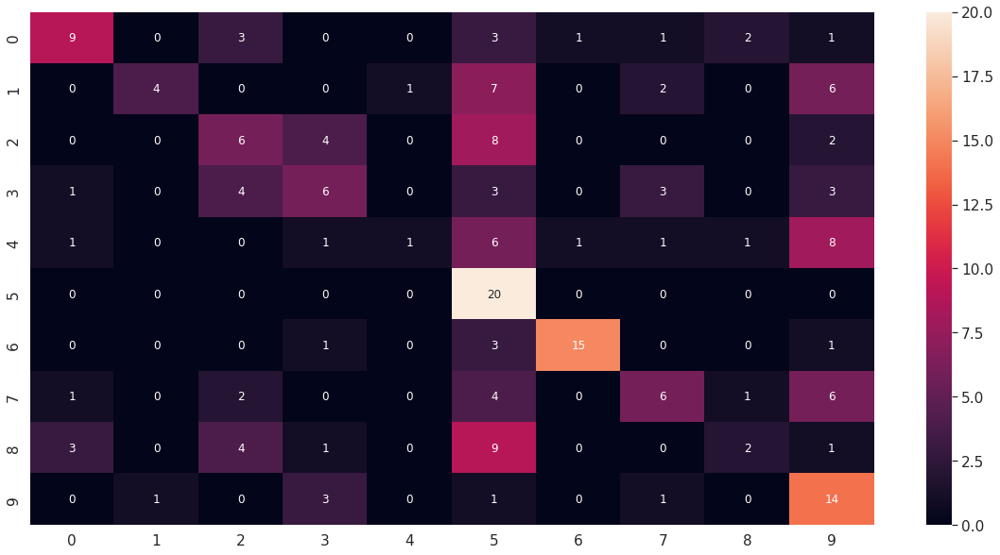

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_3_df_CM = pd.DataFrame(deepid_model_rof1_3_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_3_report)

              precision    recall  f1-score   support

           1       0.60      0.45      0.51        20
           2       0.80      0.20      0.32        20
           3       0.32      0.30      0.31        20
           4       0.38      0.30      0.33        20
           5       0.50      0.05      0.09        20
           6       0.31      1.00      0.48        20
           7       0.88      0.75      0.81        20
           8       0.43      0.30      0.35        20
           9       0.33      0.10      0.15        20
          10       0.33      0.70      0.45        20

    accuracy                           0.41       200
   macro avg       0.49      0.42      0.38       200
weighted avg       0.49      0.41      0.38       200



#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_4 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_4 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_4)
deepid_model_rof1_4.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_4.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_4 = deepid_model_rof1_4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
40/40 [==============================] - 2s 30ms/step - loss: 4.9192 - accuracy: 0.3075 - val_loss: 1.4560 - val_accuracy: 0.6150
Epoch 2/100
40/40 [==============================] - 0s 8ms/step - loss: 1.1170 - accuracy: 0.6900 - val_loss: 1.2313 - val_accuracy: 0.6400
Epoch 3/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7156 - accuracy: 0.7962 - val_loss: 0.9976 - val_accuracy: 0.7000
Epoch 4/100
40/40 [==============================] - 0s 8ms/step - loss: 0.4387 - accuracy: 0.8938 - val_loss: 0.7000 - val_accuracy: 0.8300
Epoch 5/100
40/40 [==============================] - 0s 6ms/step - loss: 0.2605 - accuracy: 0.9638 - val_loss: 0.8629 - val_accuracy: 0.7700
Epoch 6/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1743 - accuracy: 0.9925 - val_loss: 0.6163 - val_accuracy: 0.8300
Epoch 7/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1275 - accuracy: 1.0000 - val_loss: 0.5717 - val_accuracy: 0.8450
Epoch 8/100


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_4 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_4.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 6.3248 - accuracy: 0.3750


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


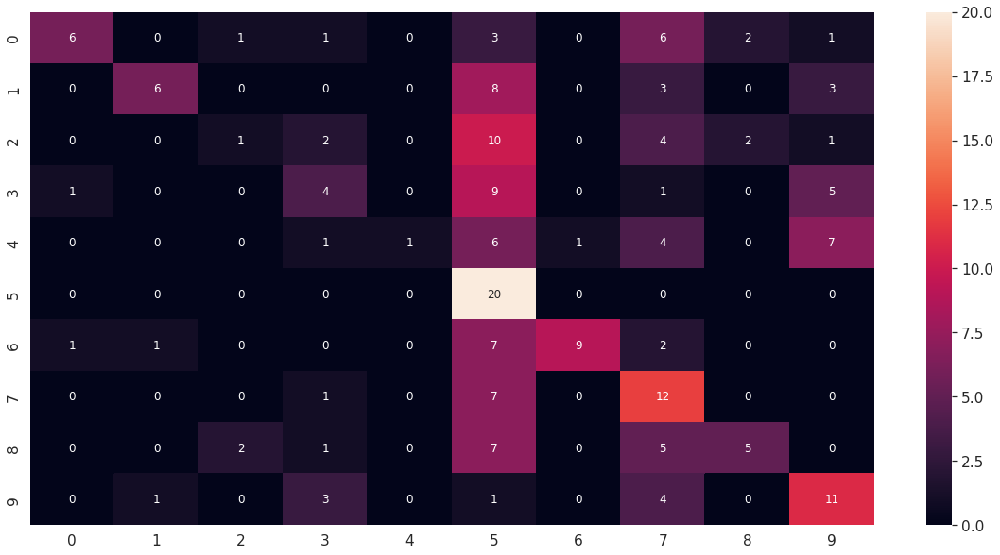

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_4_df_CM = pd.DataFrame(deepid_model_rof1_4_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_4_report)

              precision    recall  f1-score   support

           1       0.75      0.30      0.43        20
           2       0.75      0.30      0.43        20
           3       0.25      0.05      0.08        20
           4       0.31      0.20      0.24        20
           5       1.00      0.05      0.10        20
           6       0.26      1.00      0.41        20
           7       0.90      0.45      0.60        20
           8       0.29      0.60      0.39        20
           9       0.56      0.25      0.34        20
          10       0.39      0.55      0.46        20

    accuracy                           0.38       200
   macro avg       0.55      0.38      0.35       200
weighted avg       0.55      0.38      0.35       200



#### Modelo 5: (BTH = 50, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_5 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_5 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_5)
deepid_model_rof1_5.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_5.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_5 = deepid_model_rof1_5.fit(new_trainX, new_trainY, batch_size=50, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
16/16 [==============================] - 2s 73ms/step - loss: 5.4769 - accuracy: 0.1525 - val_loss: 2.3602 - val_accuracy: 0.2450
Epoch 2/100
16/16 [==============================] - 0s 13ms/step - loss: 2.1356 - accuracy: 0.2937 - val_loss: 2.0528 - val_accuracy: 0.3650
Epoch 3/100
16/16 [==============================] - 0s 13ms/step - loss: 1.7378 - accuracy: 0.5025 - val_loss: 1.7449 - val_accuracy: 0.4300
Epoch 4/100
16/16 [==============================] - 0s 13ms/step - loss: 1.4496 - accuracy: 0.5763 - val_loss: 1.7088 - val_accuracy: 0.4900
Epoch 5/100
16/16 [==============================] - 0s 14ms/step - loss: 1.2039 - accuracy: 0.6625 - val_loss: 1.5301 - val_accuracy: 0.5900
Epoch 6/100
16/16 [==============================] - 0s 14ms/step - loss: 0.9427 - accuracy: 0.7487 - val_loss: 1.2409 - val_accuracy: 0.6750
Epoch 7/100
16/16 [==============================] - 0s 15ms/step - loss: 0.7546 - accuracy: 0.8087 - val_loss: 1.0840 - val_accuracy: 0.7100
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_5 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_5.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 3.9640 - accuracy: 0.4250


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


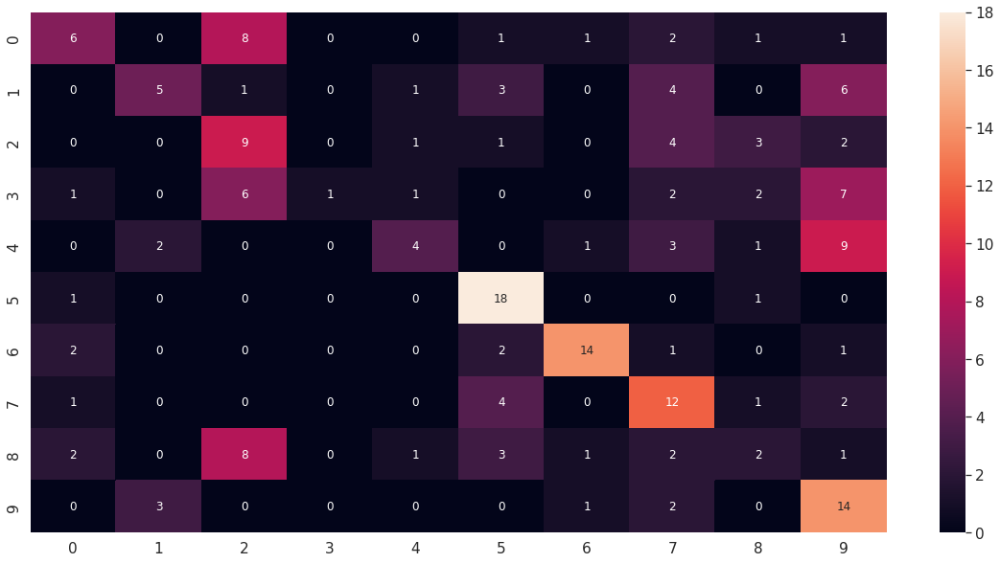

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_5_df_CM = pd.DataFrame(deepid_model_rof1_5_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_5_report)

              precision    recall  f1-score   support

           1       0.46      0.30      0.36        20
           2       0.50      0.25      0.33        20
           3       0.28      0.45      0.35        20
           4       1.00      0.05      0.10        20
           5       0.50      0.20      0.29        20
           6       0.56      0.90      0.69        20
           7       0.78      0.70      0.74        20
           8       0.38      0.60      0.46        20
           9       0.18      0.10      0.13        20
          10       0.33      0.70      0.44        20

    accuracy                           0.42       200
   macro avg       0.50      0.42      0.39       200
weighted avg       0.50      0.42      0.39       200



#### Modelo 6: (BTH = 60, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_6 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_6 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_6)
deepid_model_rof1_6.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_6.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_6.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_6 = deepid_model_rof1_6.fit(new_trainX, new_trainY, batch_size=60, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
14/14 [==============================] - 2s 52ms/step - loss: 6.5806 - accuracy: 0.1813 - val_loss: 2.2337 - val_accuracy: 0.3050
Epoch 2/100
14/14 [==============================] - 0s 15ms/step - loss: 1.7563 - accuracy: 0.4812 - val_loss: 1.6448 - val_accuracy: 0.4700
Epoch 3/100
14/14 [==============================] - 0s 16ms/step - loss: 1.3100 - accuracy: 0.6175 - val_loss: 1.3024 - val_accuracy: 0.6050
Epoch 4/100
14/14 [==============================] - 0s 16ms/step - loss: 0.9451 - accuracy: 0.7425 - val_loss: 1.0260 - val_accuracy: 0.7450
Epoch 5/100
14/14 [==============================] - 0s 16ms/step - loss: 0.6460 - accuracy: 0.8363 - val_loss: 0.8303 - val_accuracy: 0.7600
Epoch 6/100
14/14 [==============================] - 0s 16ms/step - loss: 0.4246 - accuracy: 0.9038 - val_loss: 0.6368 - val_accuracy: 0.8450
Epoch 7/100
14/14 [==============================] - 0s 15ms/step - loss: 0.2650 - accuracy: 0.9688 - val_loss: 0.5186 - val_accuracy: 0.8900
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_6 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_6.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.2477 - accuracy: 0.4800


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


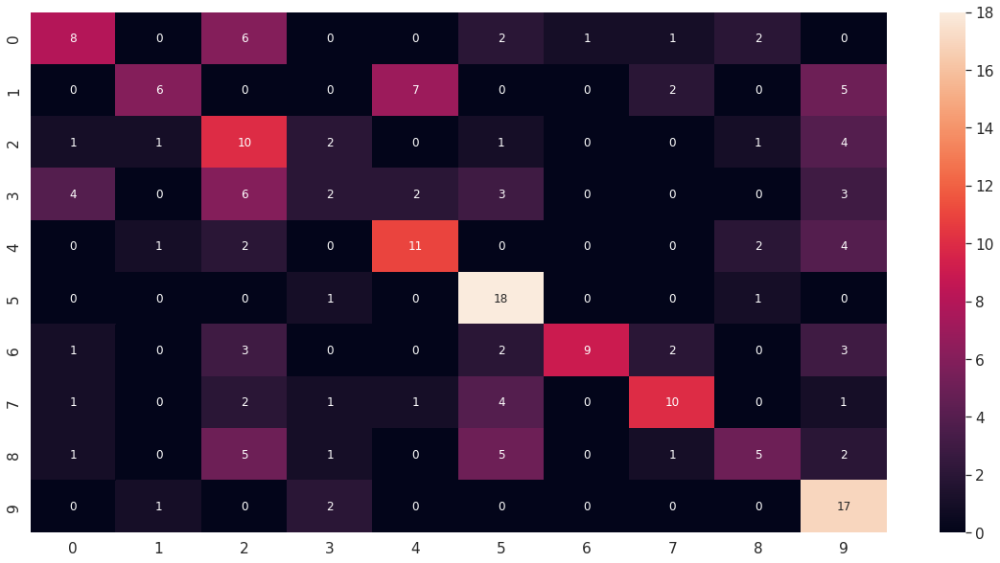

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_6_df_CM = pd.DataFrame(deepid_model_rof1_6_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_6_report)

              precision    recall  f1-score   support

           1       0.50      0.40      0.44        20
           2       0.67      0.30      0.41        20
           3       0.29      0.50      0.37        20
           4       0.22      0.10      0.14        20
           5       0.52      0.55      0.54        20
           6       0.51      0.90      0.65        20
           7       0.90      0.45      0.60        20
           8       0.62      0.50      0.56        20
           9       0.45      0.25      0.32        20
          10       0.44      0.85      0.58        20

    accuracy                           0.48       200
   macro avg       0.51      0.48      0.46       200
weighted avg       0.51      0.48      0.46       200



#### Modelo 7: (BTH = 70, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_7 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_7 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_7)
deepid_model_rof1_7.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_7.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_7.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_7 = deepid_model_rof1_7.fit(new_trainX, new_trainY, batch_size=70, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
12/12 [==============================] - 2s 78ms/step - loss: 9.1091 - accuracy: 0.1262 - val_loss: 3.4353 - val_accuracy: 0.1600
Epoch 2/100
12/12 [==============================] - 0s 19ms/step - loss: 2.7763 - accuracy: 0.2125 - val_loss: 2.1780 - val_accuracy: 0.2500
Epoch 3/100
12/12 [==============================] - 0s 20ms/step - loss: 2.0428 - accuracy: 0.3288 - val_loss: 1.9788 - val_accuracy: 0.3550
Epoch 4/100
12/12 [==============================] - 0s 21ms/step - loss: 1.7322 - accuracy: 0.4737 - val_loss: 1.7469 - val_accuracy: 0.4150
Epoch 5/100
12/12 [==============================] - 0s 19ms/step - loss: 1.3926 - accuracy: 0.6037 - val_loss: 1.5618 - val_accuracy: 0.4700
Epoch 6/100
12/12 [==============================] - 0s 20ms/step - loss: 1.0838 - accuracy: 0.6850 - val_loss: 1.2897 - val_accuracy: 0.5900
Epoch 7/100
12/12 [==============================] - 0s 19ms/step - loss: 0.8000 - accuracy: 0.7925 - val_loss: 1.1388 - val_accuracy: 0.6400
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_7 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_7.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.2184 - accuracy: 0.4750


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


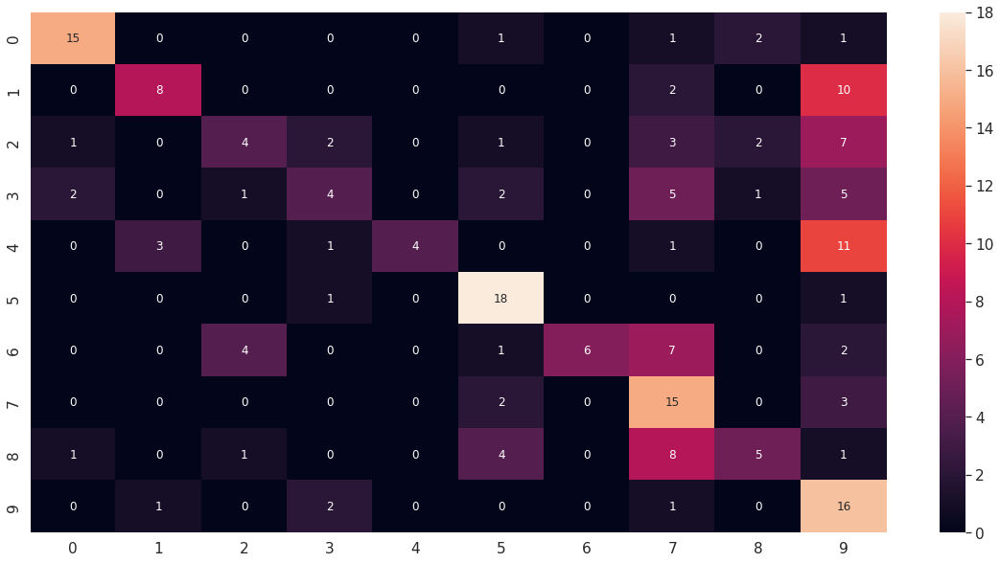

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_7_df_CM = pd.DataFrame(deepid_model_rof1_7_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_7_report)

              precision    recall  f1-score   support

           1       0.79      0.75      0.77        20
           2       0.67      0.40      0.50        20
           3       0.40      0.20      0.27        20
           4       0.40      0.20      0.27        20
           5       1.00      0.20      0.33        20
           6       0.62      0.90      0.73        20
           7       1.00      0.30      0.46        20
           8       0.35      0.75      0.48        20
           9       0.50      0.25      0.33        20
          10       0.28      0.80      0.42        20

    accuracy                           0.48       200
   macro avg       0.60      0.47      0.46       200
weighted avg       0.60      0.47      0.46       200



#### Modelo 8: (BTH = 10, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_8 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_8 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_8)
deepid_model_rof1_8.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_8.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_8.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_8 = deepid_model_rof1_8.fit(new_trainX, new_trainY, batch_size=10, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
80/80 [==============================] - 1s 9ms/step - loss: 4.5218 - accuracy: 0.2675 - val_loss: 1.8448 - val_accuracy: 0.4400
Epoch 2/100
80/80 [==============================] - 0s 6ms/step - loss: 1.3376 - accuracy: 0.5863 - val_loss: 1.2422 - val_accuracy: 0.6700
Epoch 3/100
80/80 [==============================] - 1s 7ms/step - loss: 0.8191 - accuracy: 0.7538 - val_loss: 1.0096 - val_accuracy: 0.6950
Epoch 4/100
80/80 [==============================] - 1s 6ms/step - loss: 0.4419 - accuracy: 0.8900 - val_loss: 0.6623 - val_accuracy: 0.8100
Epoch 5/100
80/80 [==============================] - 0s 5ms/step - loss: 0.2626 - accuracy: 0.9375 - val_loss: 0.6879 - val_accuracy: 0.8100
Epoch 6/100
80/80 [==============================] - 1s 6ms/step - loss: 0.1590 - accuracy: 0.9775 - val_loss: 0.5803 - val_accuracy: 0.8400
Epoch 7/100
80/80 [==============================] - 0s 5ms/step - loss: 0.0985 - accuracy: 0.9962 - val_loss: 0.6992 - val_accuracy: 0.8350
Epoch 8/100
8

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_8 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_8.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 4.3265 - accuracy: 0.5150


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


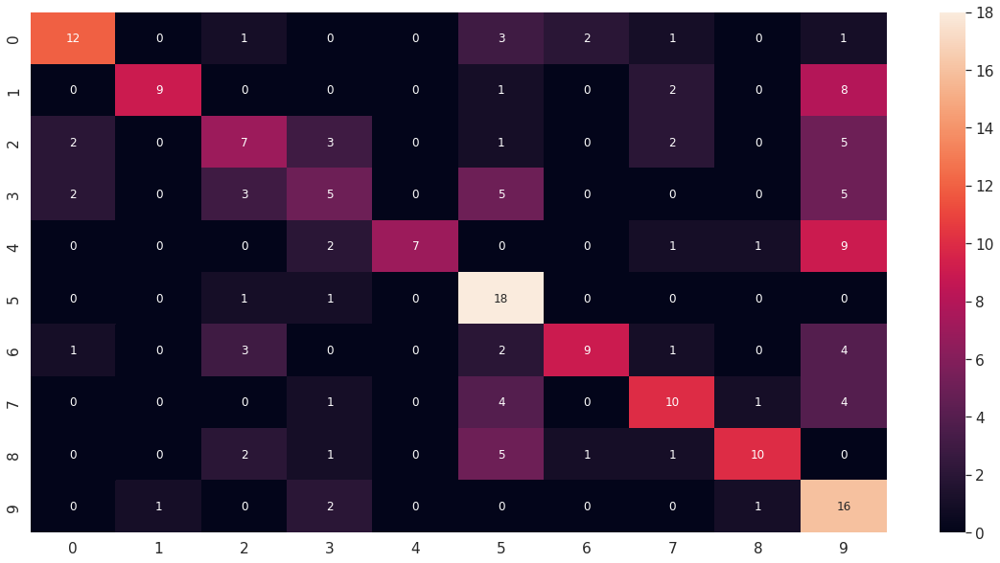

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_8_df_CM = pd.DataFrame(deepid_model_rof1_8_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_8_report)

              precision    recall  f1-score   support

           1       0.71      0.60      0.65        20
           2       0.90      0.45      0.60        20
           3       0.41      0.35      0.38        20
           4       0.33      0.25      0.29        20
           5       1.00      0.35      0.52        20
           6       0.46      0.90      0.61        20
           7       0.75      0.45      0.56        20
           8       0.56      0.50      0.53        20
           9       0.77      0.50      0.61        20
          10       0.31      0.80      0.44        20

    accuracy                           0.52       200
   macro avg       0.62      0.51      0.52       200
weighted avg       0.62      0.52      0.52       200



#### Modelo 9: (BTH = 10, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_9 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_9 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof1_9)
deepid_model_rof1_9.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_9.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_9 = deepid_model_rof1_9.fit(new_trainX, new_trainY, batch_size=10, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
80/80 [==============================] - 1s 9ms/step - loss: 4.0538 - accuracy: 0.3525 - val_loss: 1.6849 - val_accuracy: 0.5000
Epoch 2/150
80/80 [==============================] - 1s 6ms/step - loss: 0.9152 - accuracy: 0.7487 - val_loss: 0.9393 - val_accuracy: 0.7050
Epoch 3/150
80/80 [==============================] - 1s 6ms/step - loss: 0.4381 - accuracy: 0.8888 - val_loss: 0.6685 - val_accuracy: 0.8250
Epoch 4/150
80/80 [==============================] - 1s 6ms/step - loss: 0.1972 - accuracy: 0.9638 - val_loss: 0.5435 - val_accuracy: 0.8450
Epoch 5/150
80/80 [==============================] - 1s 6ms/step - loss: 0.1100 - accuracy: 0.9925 - val_loss: 0.4713 - val_accuracy: 0.8650
Epoch 6/150
80/80 [==============================] - 1s 6ms/step - loss: 0.0779 - accuracy: 1.0000 - val_loss: 0.4603 - val_accuracy: 0.8600
Epoch 7/150
80/80 [==============================] - 1s 6ms/step - loss: 0.0675 - accuracy: 1.0000 - val_loss: 0.4415 - val_accuracy: 0.8750
Epoch 8/150
8

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_9 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_9.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.5479 - accuracy: 0.5150


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


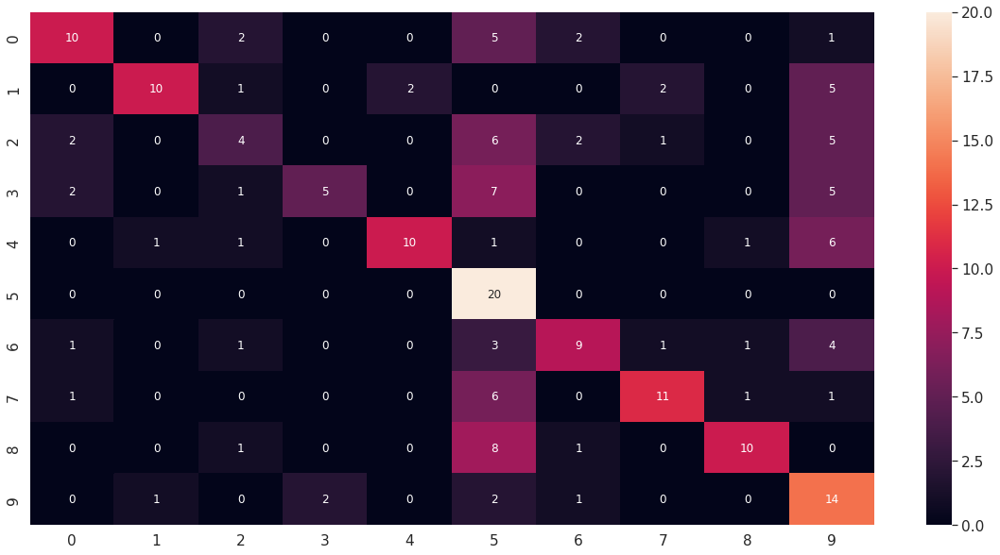

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_9_df_CM = pd.DataFrame(deepid_model_rof1_9_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_9_report)

              precision    recall  f1-score   support

           1       0.62      0.50      0.56        20
           2       0.83      0.50      0.62        20
           3       0.36      0.20      0.26        20
           4       0.71      0.25      0.37        20
           5       0.83      0.50      0.62        20
           6       0.34      1.00      0.51        20
           7       0.60      0.45      0.51        20
           8       0.73      0.55      0.63        20
           9       0.77      0.50      0.61        20
          10       0.34      0.70      0.46        20

    accuracy                           0.52       200
   macro avg       0.62      0.52      0.52       200
weighted avg       0.62      0.52      0.52       200



#### Modelo 10: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_10 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_10 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_rof1_10)
deepid_model_rof1_10.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_10.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_10 = deepid_model_rof1_10.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
27/27 [==============================] - 2s 21ms/step - loss: 2.7037 - accuracy: 0.1013 - val_loss: 2.5809 - val_accuracy: 0.0750
Epoch 2/150
27/27 [==============================] - 0s 13ms/step - loss: 2.5218 - accuracy: 0.1075 - val_loss: 2.5477 - val_accuracy: 0.1600
Epoch 3/150
27/27 [==============================] - 0s 12ms/step - loss: 2.4990 - accuracy: 0.1088 - val_loss: 2.5315 - val_accuracy: 0.1500
Epoch 4/150
27/27 [==============================] - 0s 11ms/step - loss: 2.4603 - accuracy: 0.1138 - val_loss: 2.5104 - val_accuracy: 0.1150
Epoch 5/150
27/27 [==============================] - 0s 11ms/step - loss: 2.4068 - accuracy: 0.1462 - val_loss: 2.4287 - val_accuracy: 0.1900
Epoch 6/150
27/27 [==============================] - 0s 11ms/step - loss: 2.3339 - accuracy: 0.1975 - val_loss: 2.3764 - val_accuracy: 0.2150
Epoch 7/150
27/27 [==============================] - 0s 12ms/step - loss: 2.2628 - accuracy: 0.2325 - val_loss: 2.3295 - val_accuracy: 0.1900
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_10 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_10.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.0765 - accuracy: 0.4000


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


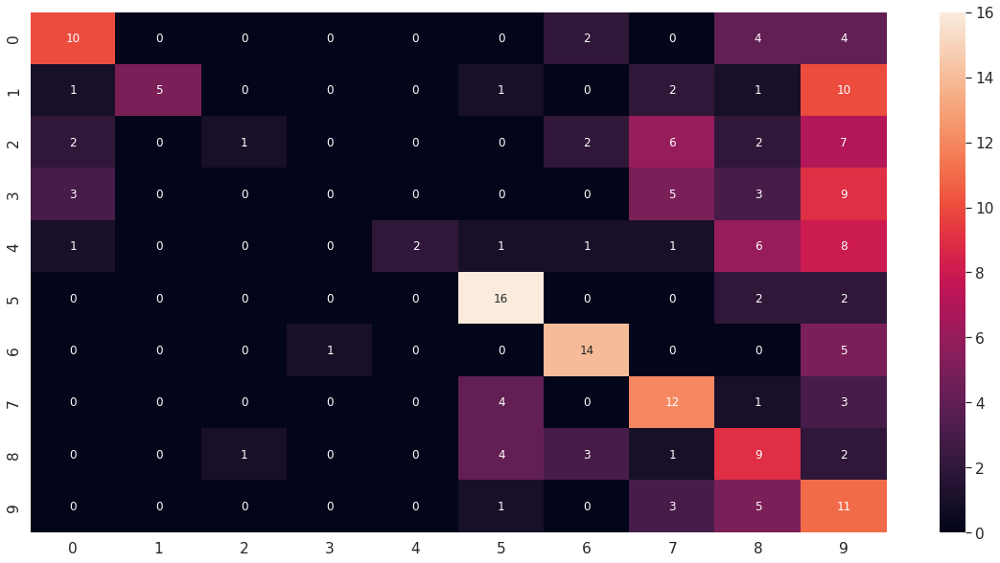

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_10_df_CM = pd.DataFrame(deepid_model_rof1_10_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_10_report)

              precision    recall  f1-score   support

           1       0.59      0.50      0.54        20
           2       1.00      0.25      0.40        20
           3       0.50      0.05      0.09        20
           4       0.00      0.00      0.00        20
           5       1.00      0.10      0.18        20
           6       0.59      0.80      0.68        20
           7       0.64      0.70      0.67        20
           8       0.40      0.60      0.48        20
           9       0.27      0.45      0.34        20
          10       0.18      0.55      0.27        20

    accuracy                           0.40       200
   macro avg       0.52      0.40      0.37       200
weighted avg       0.52      0.40      0.37       200



#### Modelo 11: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_11 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_11 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_rof1_11)
deepid_model_rof1_11.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_11.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_11 = deepid_model_rof1_11.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
20/20 [==============================] - 1s 23ms/step - loss: 4.6117 - accuracy: 0.1725 - val_loss: 2.3151 - val_accuracy: 0.2550
Epoch 2/100
20/20 [==============================] - 0s 14ms/step - loss: 2.2492 - accuracy: 0.2887 - val_loss: 2.0358 - val_accuracy: 0.3600
Epoch 3/100
20/20 [==============================] - 0s 14ms/step - loss: 1.9473 - accuracy: 0.3887 - val_loss: 1.7339 - val_accuracy: 0.5350
Epoch 4/100
20/20 [==============================] - 0s 13ms/step - loss: 1.6555 - accuracy: 0.4825 - val_loss: 1.4085 - val_accuracy: 0.6100
Epoch 5/100
20/20 [==============================] - 0s 14ms/step - loss: 1.2953 - accuracy: 0.6112 - val_loss: 1.0658 - val_accuracy: 0.7450
Epoch 6/100
20/20 [==============================] - 0s 13ms/step - loss: 1.0700 - accuracy: 0.6938 - val_loss: 0.9200 - val_accuracy: 0.7900
Epoch 7/100
20/20 [==============================] - 0s 12ms/step - loss: 0.8510 - accuracy: 0.7550 - val_loss: 0.7501 - val_accuracy: 0.8300
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_11 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_11.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.8928 - accuracy: 0.3800


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


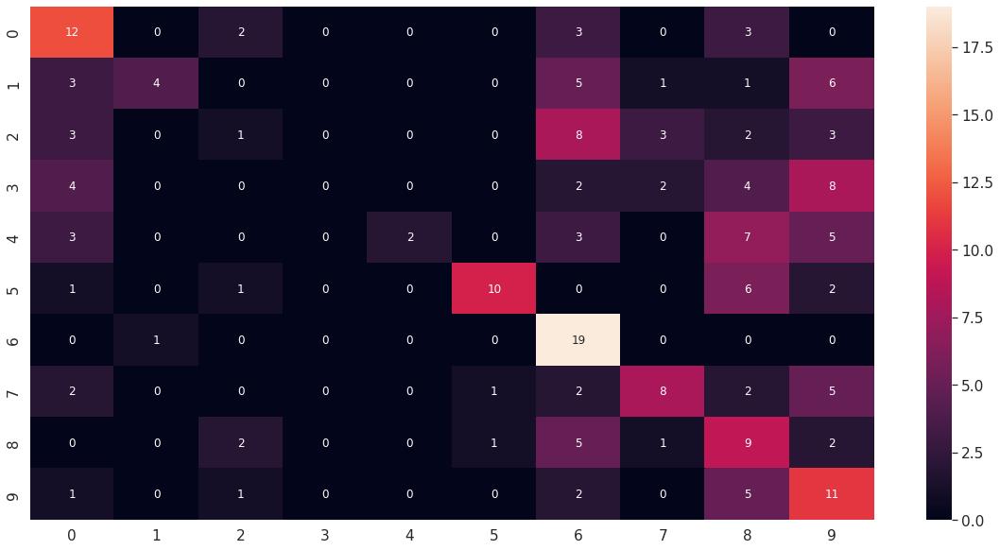

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_11_df_CM = pd.DataFrame(deepid_model_rof1_11_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_11_report)

              precision    recall  f1-score   support

           1       0.41      0.60      0.49        20
           2       0.80      0.20      0.32        20
           3       0.14      0.05      0.07        20
           4       0.00      0.00      0.00        20
           5       1.00      0.10      0.18        20
           6       0.83      0.50      0.62        20
           7       0.39      0.95      0.55        20
           8       0.53      0.40      0.46        20
           9       0.23      0.45      0.31        20
          10       0.26      0.55      0.35        20

    accuracy                           0.38       200
   macro avg       0.46      0.38      0.34       200
weighted avg       0.46      0.38      0.34       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Modelo 12: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_12 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_12 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_rof1_12)
deepid_model_rof1_12.summary()

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_rof1_12.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_12.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_12 = deepid_model_rof1_12.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
27/27 [==============================] - 1s 19ms/step - loss: 5.2485 - accuracy: 0.1163 - val_loss: 2.7222 - val_accuracy: 0.2050
Epoch 2/100
27/27 [==============================] - 0s 11ms/step - loss: 2.7585 - accuracy: 0.2050 - val_loss: 2.2903 - val_accuracy: 0.3100
Epoch 3/100
27/27 [==============================] - 0s 11ms/step - loss: 2.3991 - accuracy: 0.2488 - val_loss: 2.1228 - val_accuracy: 0.3550
Epoch 4/100
27/27 [==============================] - 0s 11ms/step - loss: 2.1730 - accuracy: 0.3300 - val_loss: 1.9825 - val_accuracy: 0.3850
Epoch 5/100
27/27 [==============================] - 0s 11ms/step - loss: 2.0395 - accuracy: 0.3825 - val_loss: 1.8350 - val_accuracy: 0.4650
Epoch 6/100
27/27 [==============================] - 0s 11ms/step - loss: 1.9223 - accuracy: 0.4225 - val_loss: 1.7049 - val_accuracy: 0.5000
Epoch 7/100
27/27 [==============================] - 0s 12ms/step - loss: 1.7936 - accuracy: 0.4487 - val_loss: 1.5897 - val_accuracy: 0.5500
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_12 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_12.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 4.4084 - accuracy: 0.3550


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


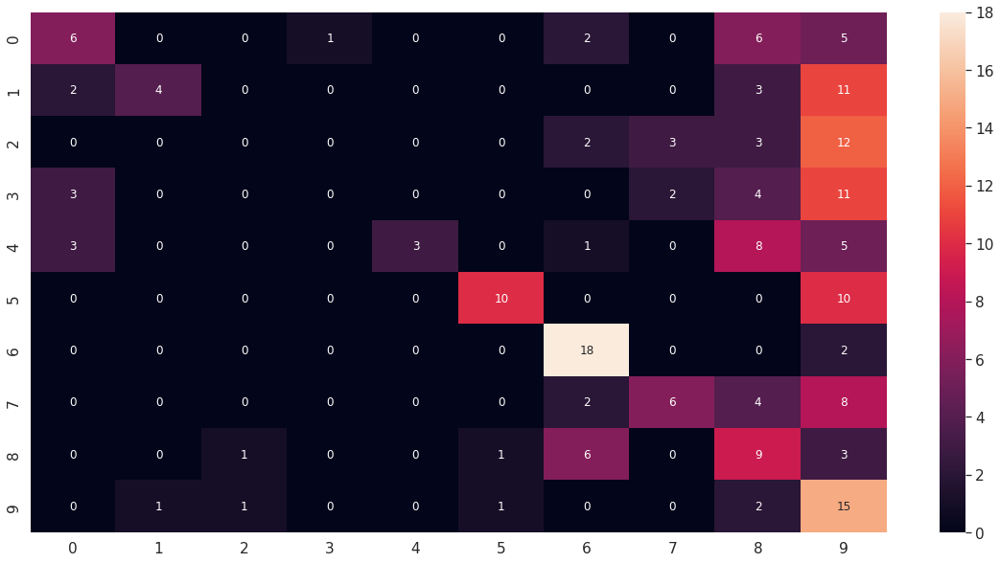

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_12_df_CM = pd.DataFrame(deepid_model_rof1_12_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_12_report)

              precision    recall  f1-score   support

           1       0.43      0.30      0.35        20
           2       0.80      0.20      0.32        20
           3       0.00      0.00      0.00        20
           4       0.00      0.00      0.00        20
           5       1.00      0.15      0.26        20
           6       0.83      0.50      0.62        20
           7       0.58      0.90      0.71        20
           8       0.55      0.30      0.39        20
           9       0.23      0.45      0.31        20
          10       0.18      0.75      0.29        20

    accuracy                           0.36       200
   macro avg       0.46      0.36      0.33       200
weighted avg       0.46      0.35      0.33       200



#### Modelo 13: (BTH = 20, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_13 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_13 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof1_13)
deepid_model_rof1_13.summary()

Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_13.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_13.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_13 = deepid_model_rof1_13.fit(new_trainX, new_trainY, batch_size=20, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
40/40 [==============================] - 2s 24ms/step - loss: 3.0851 - accuracy: 0.2250 - val_loss: 2.0863 - val_accuracy: 0.3650
Epoch 2/200
40/40 [==============================] - 0s 9ms/step - loss: 1.8978 - accuracy: 0.3887 - val_loss: 1.6303 - val_accuracy: 0.4550
Epoch 3/200
40/40 [==============================] - 0s 8ms/step - loss: 1.5077 - accuracy: 0.5325 - val_loss: 1.3236 - val_accuracy: 0.5950
Epoch 4/200
40/40 [==============================] - 0s 8ms/step - loss: 1.1419 - accuracy: 0.6762 - val_loss: 1.3090 - val_accuracy: 0.5850
Epoch 5/200
40/40 [==============================] - 0s 8ms/step - loss: 0.8689 - accuracy: 0.7550 - val_loss: 1.0839 - val_accuracy: 0.7050
Epoch 6/200
40/40 [==============================] - 0s 8ms/step - loss: 0.7356 - accuracy: 0.8087 - val_loss: 1.0028 - val_accuracy: 0.7400
Epoch 7/200
40/40 [==============================] - 0s 6ms/step - loss: 0.4977 - accuracy: 0.8913 - val_loss: 1.0252 - val_accuracy: 0.7100
Epoch 8/200


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_13 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_13.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 7.9426 - accuracy: 0.3050


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


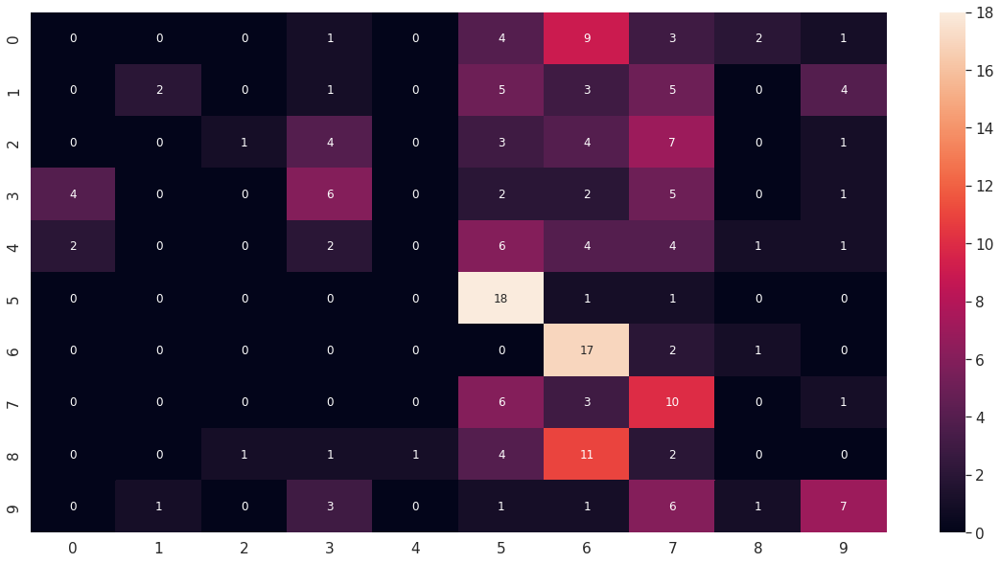

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_13_df_CM = pd.DataFrame(deepid_model_rof1_13_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_13_report)

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        20
           2       0.67      0.10      0.17        20
           3       0.50      0.05      0.09        20
           4       0.33      0.30      0.32        20
           5       0.00      0.00      0.00        20
           6       0.37      0.90      0.52        20
           7       0.31      0.85      0.45        20
           8       0.22      0.50      0.31        20
           9       0.00      0.00      0.00        20
          10       0.44      0.35      0.39        20

    accuracy                           0.30       200
   macro avg       0.28      0.31      0.23       200
weighted avg       0.28      0.30      0.23       200



#### Modelo 14: (BTH = 10, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_14 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_14 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof1_14)
deepid_model_rof1_14.summary()

Model: "model_21"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_14.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_14.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_14 = deepid_model_rof1_14.fit(new_trainX, new_trainY, batch_size=10, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
80/80 [==============================] - 2s 13ms/step - loss: 8.3689 - accuracy: 0.2700 - val_loss: 1.9246 - val_accuracy: 0.4000
Epoch 2/200
80/80 [==============================] - 1s 6ms/step - loss: 1.5745 - accuracy: 0.5188 - val_loss: 1.7497 - val_accuracy: 0.5300
Epoch 3/200
80/80 [==============================] - 0s 6ms/step - loss: 1.0367 - accuracy: 0.6975 - val_loss: 1.1649 - val_accuracy: 0.6750
Epoch 4/200
80/80 [==============================] - 1s 6ms/step - loss: 0.6567 - accuracy: 0.8288 - val_loss: 1.1059 - val_accuracy: 0.7250
Epoch 5/200
80/80 [==============================] - 1s 6ms/step - loss: 0.4303 - accuracy: 0.9013 - val_loss: 0.9491 - val_accuracy: 0.7800
Epoch 6/200
80/80 [==============================] - 0s 5ms/step - loss: 0.3097 - accuracy: 0.9400 - val_loss: 1.1858 - val_accuracy: 0.7250
Epoch 7/200
80/80 [==============================] - 1s 6ms/step - loss: 0.2175 - accuracy: 0.9688 - val_loss: 0.9042 - val_accuracy: 0.7750
Epoch 8/200


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_14 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_14.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 6.9211 - accuracy: 0.3400


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


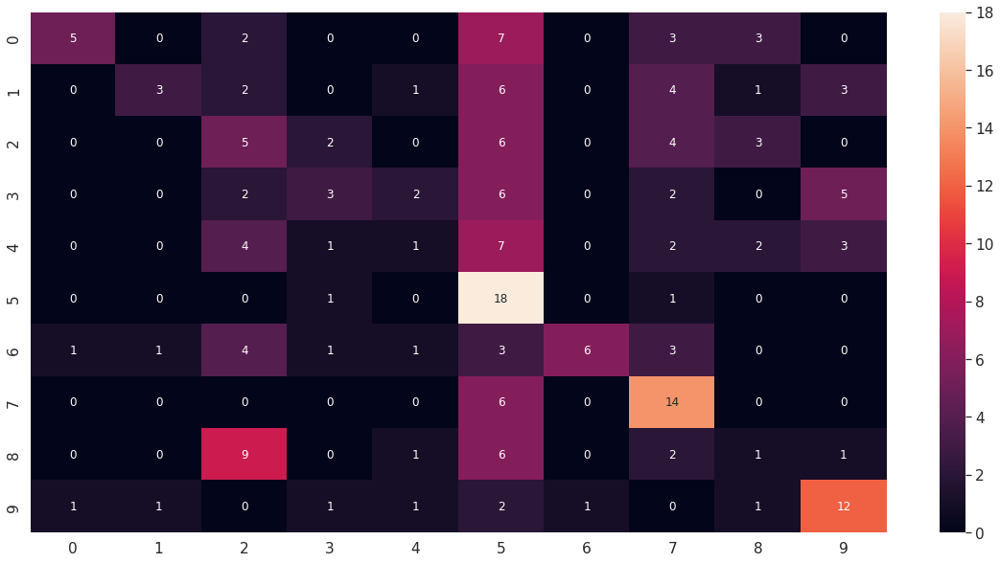

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_14_df_CM = pd.DataFrame(deepid_model_rof1_14_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_14_report)

              precision    recall  f1-score   support

           1       0.71      0.25      0.37        20
           2       0.60      0.15      0.24        20
           3       0.18      0.25      0.21        20
           4       0.33      0.15      0.21        20
           5       0.14      0.05      0.07        20
           6       0.27      0.90      0.41        20
           7       0.86      0.30      0.44        20
           8       0.40      0.70      0.51        20
           9       0.09      0.05      0.06        20
          10       0.50      0.60      0.55        20

    accuracy                           0.34       200
   macro avg       0.41      0.34      0.31       200
weighted avg       0.41      0.34      0.31       200



#### Modelo 15: (BTH = 60, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_15 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_15 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof1_15)
deepid_model_rof1_15.summary()

Model: "model_22"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_15.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_15 = deepid_model_rof1_15.fit(new_trainX, new_trainY, batch_size=60, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
14/14 [==============================] - 1s 35ms/step - loss: 29.6485 - accuracy: 0.2125 - val_loss: 8.9421 - val_accuracy: 0.2650
Epoch 2/200
14/14 [==============================] - 0s 20ms/step - loss: 5.5070 - accuracy: 0.3537 - val_loss: 3.9624 - val_accuracy: 0.3050
Epoch 3/200
14/14 [==============================] - 0s 23ms/step - loss: 2.7865 - accuracy: 0.4100 - val_loss: 2.5314 - val_accuracy: 0.3800
Epoch 4/200
14/14 [==============================] - 0s 21ms/step - loss: 1.9931 - accuracy: 0.4663 - val_loss: 2.1615 - val_accuracy: 0.4400
Epoch 5/200
14/14 [==============================] - 0s 24ms/step - loss: 1.6621 - accuracy: 0.5487 - val_loss: 1.7723 - val_accuracy: 0.5700
Epoch 6/200
14/14 [==============================] - 0s 32ms/step - loss: 1.4052 - accuracy: 0.6187 - val_loss: 1.6821 - val_accuracy: 0.5900
Epoch 7/200
14/14 [==============================] - 0s 22ms/step - loss: 1.1568 - accuracy: 0.6800 - val_loss: 1.4936 - val_accuracy: 0.6350
Epoch

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_15 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_15.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 12.8616 - accuracy: 0.2950


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


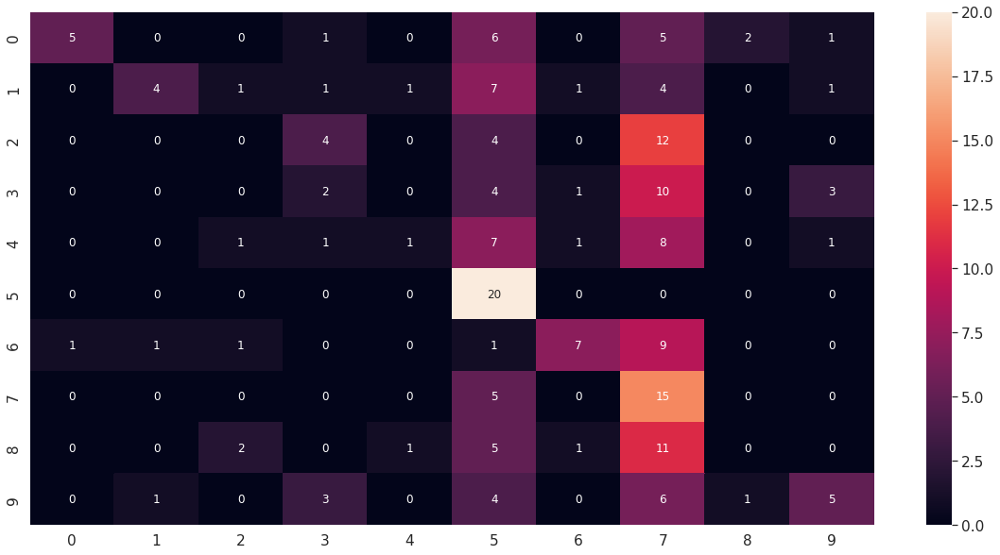

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_15_df_CM = pd.DataFrame(deepid_model_rof1_15_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_15_report)

              precision    recall  f1-score   support

           1       0.83      0.25      0.38        20
           2       0.67      0.20      0.31        20
           3       0.00      0.00      0.00        20
           4       0.17      0.10      0.12        20
           5       0.33      0.05      0.09        20
           6       0.32      1.00      0.48        20
           7       0.64      0.35      0.45        20
           8       0.19      0.75      0.30        20
           9       0.00      0.00      0.00        20
          10       0.45      0.25      0.32        20

    accuracy                           0.29       200
   macro avg       0.36      0.30      0.25       200
weighted avg       0.36      0.29      0.25       200



#### Modelo 16: (BTH = 30, EHS = 50, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_16 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_16 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof1_16)
deepid_model_rof1_16.summary()

Model: "model_24"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_16.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_16.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_16 = deepid_model_rof1_16.fit(new_trainX, new_trainY, batch_size=30, epochs=50, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/50
27/27 [==============================] - 1s 29ms/step - loss: 6.5233 - accuracy: 0.1900 - val_loss: 2.2527 - val_accuracy: 0.3200
Epoch 2/50
27/27 [==============================] - 0s 11ms/step - loss: 2.2362 - accuracy: 0.2887 - val_loss: 2.1955 - val_accuracy: 0.3200
Epoch 3/50
27/27 [==============================] - 0s 10ms/step - loss: 1.9888 - accuracy: 0.3638 - val_loss: 1.9241 - val_accuracy: 0.4250
Epoch 4/50
27/27 [==============================] - 0s 11ms/step - loss: 1.7121 - accuracy: 0.4563 - val_loss: 1.7135 - val_accuracy: 0.4650
Epoch 5/50
27/27 [==============================] - 0s 10ms/step - loss: 1.4142 - accuracy: 0.5150 - val_loss: 1.4165 - val_accuracy: 0.5450
Epoch 6/50
27/27 [==============================] - 0s 10ms/step - loss: 1.1847 - accuracy: 0.5913 - val_loss: 1.3338 - val_accuracy: 0.5950
Epoch 7/50
27/27 [==============================] - 0s 10ms/step - loss: 1.0330 - accuracy: 0.6612 - val_loss: 1.1876 - val_accuracy: 0.6000
Epoch 8/50
27

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_16 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_16.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_16.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_16.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 8.5550 - accuracy: 0.3400


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_16.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_16_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


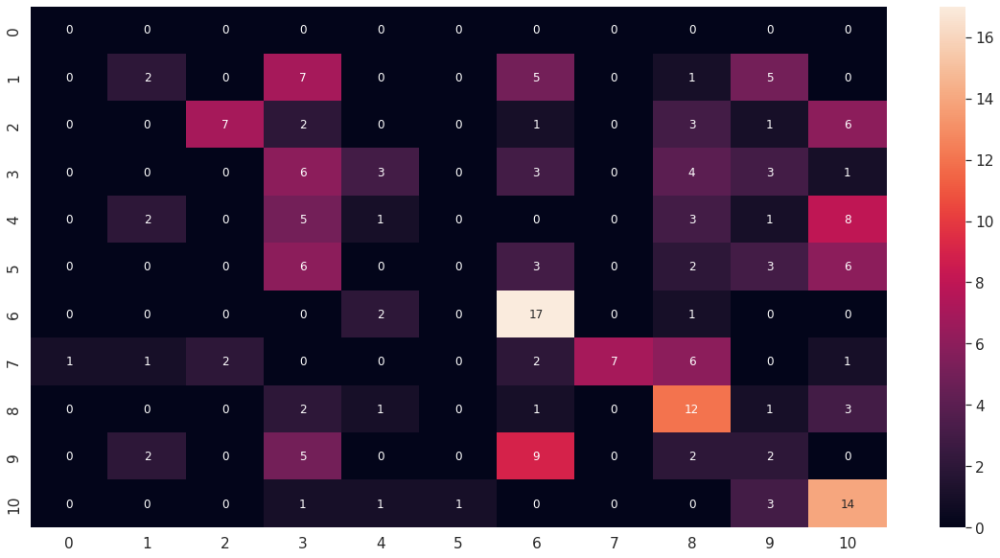

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_16_df_CM = pd.DataFrame(deepid_model_rof1_16_CM, range(11), range(11))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_16_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_16_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_16_report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.29      0.10      0.15        20
           2       0.78      0.35      0.48        20
           3       0.18      0.30      0.22        20
           4       0.12      0.05      0.07        20
           5       0.00      0.00      0.00        20
           6       0.41      0.85      0.56        20
           7       1.00      0.35      0.52        20
           8       0.35      0.60      0.44        20
           9       0.11      0.10      0.10        20
          10       0.36      0.70      0.47        20

    accuracy                           0.34       200
   macro avg       0.33      0.31      0.27       200
weighted avg       0.36      0.34      0.30       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Modelo 17: (BTH = 20, EHS = 80, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_17 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_17 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_rof1_17)
deepid_model_rof1_17.summary()

Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_17.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_17.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_17 = deepid_model_rof1_17.fit(new_trainX, new_trainY, batch_size=20, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
40/40 [==============================] - 1s 13ms/step - loss: 2.5416 - accuracy: 0.1075 - val_loss: 2.5005 - val_accuracy: 0.0850
Epoch 2/80
40/40 [==============================] - 0s 9ms/step - loss: 2.4523 - accuracy: 0.1063 - val_loss: 2.4416 - val_accuracy: 0.1200
Epoch 3/80
40/40 [==============================] - 0s 8ms/step - loss: 2.3339 - accuracy: 0.1787 - val_loss: 2.3758 - val_accuracy: 0.1350
Epoch 4/80
40/40 [==============================] - 0s 8ms/step - loss: 2.1587 - accuracy: 0.2500 - val_loss: 2.0628 - val_accuracy: 0.3150
Epoch 5/80
40/40 [==============================] - 0s 8ms/step - loss: 1.9707 - accuracy: 0.3187 - val_loss: 1.9114 - val_accuracy: 0.3650
Epoch 6/80
40/40 [==============================] - 0s 8ms/step - loss: 1.8324 - accuracy: 0.3512 - val_loss: 1.8335 - val_accuracy: 0.3950
Epoch 7/80
40/40 [==============================] - 0s 8ms/step - loss: 1.6779 - accuracy: 0.4600 - val_loss: 1.8035 - val_accuracy: 0.4350
Epoch 8/80
40/40 [=

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_17 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_17.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_17.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_17.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 3.5603 - accuracy: 0.3850


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_17.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_17_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 4ms/step


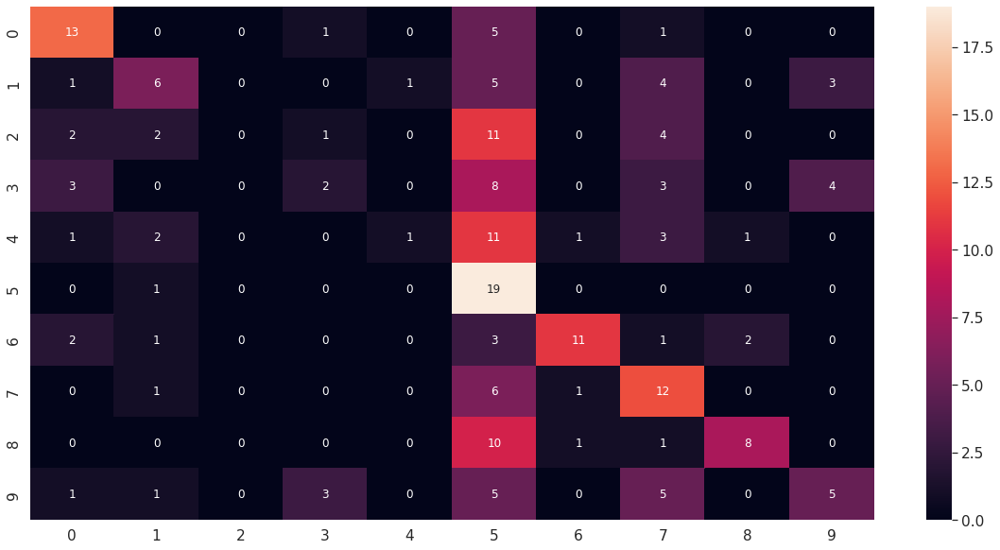

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_17_df_CM = pd.DataFrame(deepid_model_rof1_17_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_17_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_17_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_17_report)

              precision    recall  f1-score   support

           1       0.57      0.65      0.60        20
           2       0.43      0.30      0.35        20
           3       0.00      0.00      0.00        20
           4       0.29      0.10      0.15        20
           5       0.50      0.05      0.09        20
           6       0.23      0.95      0.37        20
           7       0.79      0.55      0.65        20
           8       0.35      0.60      0.44        20
           9       0.73      0.40      0.52        20
          10       0.42      0.25      0.31        20

    accuracy                           0.38       200
   macro avg       0.43      0.39      0.35       200
weighted avg       0.43      0.39      0.35       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Modelo 18: (BTH = 40, EHS = 80, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_18 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_18 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_rof1_18)
deepid_model_rof1_18.summary()

Model: "model_27"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_18.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_18.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_18 = deepid_model_rof1_18.fit(new_trainX, new_trainY, batch_size=40, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
20/20 [==============================] - 1s 24ms/step - loss: 3.9693 - accuracy: 0.2000 - val_loss: 2.0310 - val_accuracy: 0.4400
Epoch 2/80
20/20 [==============================] - 0s 14ms/step - loss: 1.8979 - accuracy: 0.4375 - val_loss: 1.5711 - val_accuracy: 0.5800
Epoch 3/80
20/20 [==============================] - 0s 13ms/step - loss: 1.2941 - accuracy: 0.6250 - val_loss: 1.0691 - val_accuracy: 0.7200
Epoch 4/80
20/20 [==============================] - 0s 14ms/step - loss: 0.8675 - accuracy: 0.7738 - val_loss: 0.7816 - val_accuracy: 0.8200
Epoch 5/80
20/20 [==============================] - 0s 12ms/step - loss: 0.6057 - accuracy: 0.8388 - val_loss: 0.6636 - val_accuracy: 0.8400
Epoch 6/80
20/20 [==============================] - 0s 8ms/step - loss: 0.4206 - accuracy: 0.9087 - val_loss: 0.6688 - val_accuracy: 0.8600
Epoch 7/80
20/20 [==============================] - 0s 13ms/step - loss: 0.3555 - accuracy: 0.9200 - val_loss: 0.5564 - val_accuracy: 0.8700
Epoch 8/80
20/

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_18 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_18.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_18.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_18.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 5.1805 - accuracy: 0.4550


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_18.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_18_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


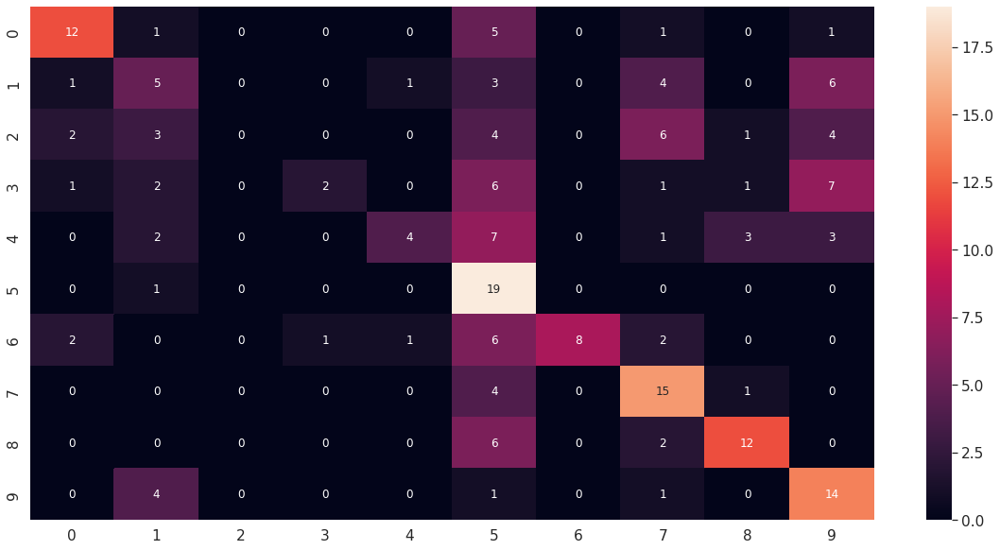

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_18_df_CM = pd.DataFrame(deepid_model_rof1_18_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_18_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_18_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_18_report)

              precision    recall  f1-score   support

           1       0.67      0.60      0.63        20
           2       0.28      0.25      0.26        20
           3       0.00      0.00      0.00        20
           4       0.67      0.10      0.17        20
           5       0.67      0.20      0.31        20
           6       0.31      0.95      0.47        20
           7       1.00      0.40      0.57        20
           8       0.45      0.75      0.57        20
           9       0.67      0.60      0.63        20
          10       0.40      0.70      0.51        20

    accuracy                           0.46       200
   macro avg       0.51      0.45      0.41       200
weighted avg       0.51      0.46      0.41       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Modelo 19: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_19 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_19 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_rof1_19)
deepid_model_rof1_19.summary()

Model: "model_29"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_19.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_19.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_19 = deepid_model_rof1_19.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
27/27 [==============================] - 1s 19ms/step - loss: 3.5688 - accuracy: 0.3075 - val_loss: 1.6682 - val_accuracy: 0.5750
Epoch 2/100
27/27 [==============================] - 0s 11ms/step - loss: 1.2355 - accuracy: 0.6725 - val_loss: 0.9263 - val_accuracy: 0.7750
Epoch 3/100
27/27 [==============================] - 0s 11ms/step - loss: 0.6920 - accuracy: 0.8375 - val_loss: 0.6237 - val_accuracy: 0.8500
Epoch 4/100
27/27 [==============================] - 0s 11ms/step - loss: 0.4595 - accuracy: 0.9000 - val_loss: 0.4490 - val_accuracy: 0.9050
Epoch 5/100
27/27 [==============================] - 0s 11ms/step - loss: 0.3162 - accuracy: 0.9525 - val_loss: 0.4179 - val_accuracy: 0.9100
Epoch 6/100
27/27 [==============================] - 0s 11ms/step - loss: 0.2506 - accuracy: 0.9688 - val_loss: 0.3658 - val_accuracy: 0.9350
Epoch 7/100
27/27 [==============================] - 0s 11ms/step - loss: 0.2028 - accuracy: 0.9800 - val_loss: 0.3500 - val_accuracy: 0.9200
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_19 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_19.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_19.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_19.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 5.5081 - accuracy: 0.4350


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_19.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_19_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


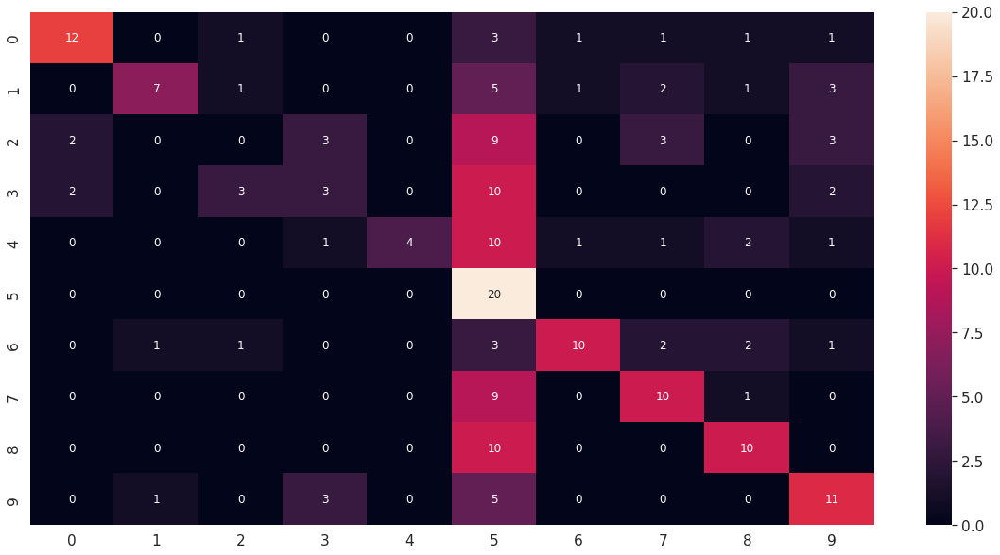

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_19_df_CM = pd.DataFrame(deepid_model_rof1_19_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_19_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_19_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_19_report)

              precision    recall  f1-score   support

           1       0.75      0.60      0.67        20
           2       0.78      0.35      0.48        20
           3       0.00      0.00      0.00        20
           4       0.30      0.15      0.20        20
           5       1.00      0.20      0.33        20
           6       0.24      1.00      0.38        20
           7       0.77      0.50      0.61        20
           8       0.53      0.50      0.51        20
           9       0.59      0.50      0.54        20
          10       0.50      0.55      0.52        20

    accuracy                           0.43       200
   macro avg       0.54      0.43      0.43       200
weighted avg       0.54      0.43      0.43       200



#### Modelo 20: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof1_20 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof1_20 = keras.Model(deepid_model.get_layer('input_4').get_output_at(node_index=0), deepid_model_rof1_20)
deepid_model_rof1_20.summary()

Model: "model_30"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_4[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof1_20.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_20.h5', monitor="val_loss", save_best_only=True)
hist_model_rof1_20 = deepid_model_rof1_20.fit(new_trainX, new_trainY, batch_size=10, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
80/80 [==============================] - 1s 9ms/step - loss: 2.7819 - accuracy: 0.4663 - val_loss: 1.0166 - val_accuracy: 0.7150
Epoch 2/100
80/80 [==============================] - 1s 6ms/step - loss: 0.6795 - accuracy: 0.8188 - val_loss: 0.4524 - val_accuracy: 0.9150
Epoch 3/100
80/80 [==============================] - 1s 9ms/step - loss: 0.3355 - accuracy: 0.9375 - val_loss: 0.3646 - val_accuracy: 0.9000
Epoch 4/100
80/80 [==============================] - 1s 8ms/step - loss: 0.2537 - accuracy: 0.9563 - val_loss: 0.3009 - val_accuracy: 0.9450
Epoch 5/100
80/80 [==============================] - 1s 9ms/step - loss: 0.1971 - accuracy: 0.9663 - val_loss: 0.2793 - val_accuracy: 0.9450
Epoch 6/100
80/80 [==============================] - 1s 8ms/step - loss: 0.1680 - accuracy: 0.9762 - val_loss: 0.2313 - val_accuracy: 0.9400
Epoch 7/100
80/80 [==============================] - 0s 5ms/step - loss: 0.1810 - accuracy: 0.9750 - val_loss: 0.2424 - val_accuracy: 0.9400
Epoch 8/100
8

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof1_20 = load_model(path + 'data_reconocimiento3/models_ROF1/deepid_model_ROF1_20.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof1_20.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof1_20.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 3.6484 - accuracy: 0.5350


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof1_20.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof1_20_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


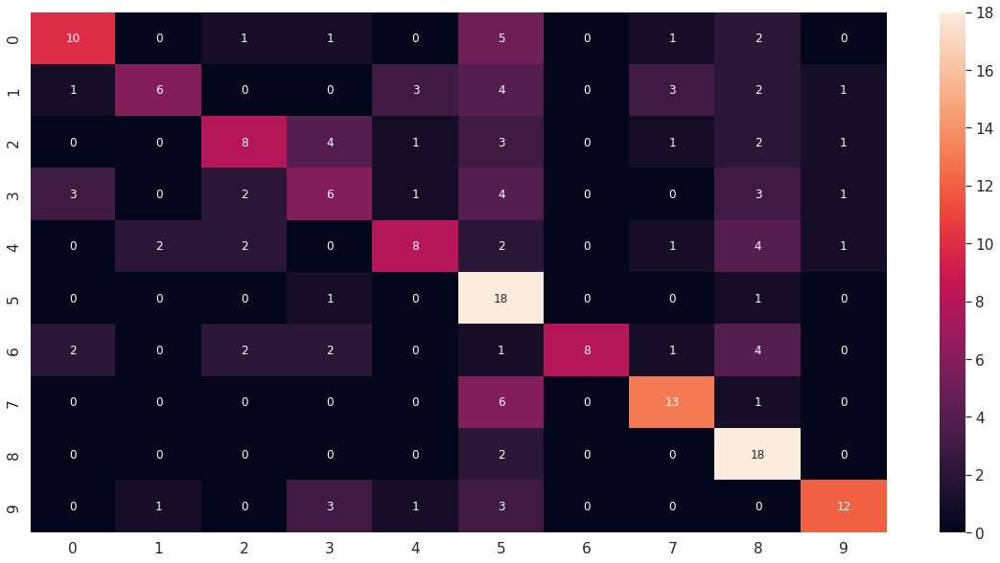

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof1_20_df_CM = pd.DataFrame(deepid_model_rof1_20_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof1_20_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof1_20_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof1_20_report)

              precision    recall  f1-score   support

           1       0.62      0.50      0.56        20
           2       0.67      0.30      0.41        20
           3       0.53      0.40      0.46        20
           4       0.35      0.30      0.32        20
           5       0.57      0.40      0.47        20
           6       0.38      0.90      0.53        20
           7       1.00      0.40      0.57        20
           8       0.65      0.65      0.65        20
           9       0.49      0.90      0.63        20
          10       0.75      0.60      0.67        20

    accuracy                           0.54       200
   macro avg       0.60      0.53      0.53       200
weighted avg       0.60      0.54      0.53       200



In [ ]:
from google.colab import drive
drive.mount('/content/drive')
path = '/content/drive/MyDrive/Universidad - Ingeniería Electrónica/10 Semestre/Trabajo de Grado II/'
#path = '/content/drive/MyDrive/Trabajo de Grado II/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import shutil
import numpy as np
import random
import seaborn
import pandas as pd

from os import listdir
from PIL import Image 
from numpy import asarray
from numpy import expand_dims
from numpy import eye
from numpy import load
from numpy import savez_compressed
from random import choice
from matplotlib import pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, Adamax, SGD
from tensorflow.keras import layers
from keras.models import load_model 
from keras.callbacks import ModelCheckpoint
from keras.models import Model, Sequential
from keras.layers import Convolution2D, MaxPooling2D, LocallyConnected2D, ZeroPadding2D, Flatten, Dense, Dropout, Activation, Input, Add
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report  

%matplotlib inline

## 6. Modelos con base de datos ROF2 para condiciones de oclusión

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_1 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_1 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_1)
deepid_model_rof2_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)  
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_1.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_1 = deepid_model_rof2_1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
43/43 [==============================] - 11s 40ms/step - loss: 2.5006 - accuracy: 0.1148 - val_loss: 2.4209 - val_accuracy: 0.1589
Epoch 2/70
43/43 [==============================] - 0s 8ms/step - loss: 2.3586 - accuracy: 0.1766 - val_loss: 2.2841 - val_accuracy: 0.2243
Epoch 3/70
43/43 [==============================] - 0s 8ms/step - loss: 2.1183 - accuracy: 0.2820 - val_loss: 2.0569 - val_accuracy: 0.3240
Epoch 4/70
43/43 [==============================] - 0s 8ms/step - loss: 1.9104 - accuracy: 0.3656 - val_loss: 1.8897 - val_accuracy: 0.3583
Epoch 5/70
43/43 [==============================] - 0s 6ms/step - loss: 1.6460 - accuracy: 0.4695 - val_loss: 2.0020 - val_accuracy: 0.3520
Epoch 6/70
43/43 [==============================] - 0s 8ms/step - loss: 1.5192 - accuracy: 0.5336 - val_loss: 1.5188 - val_accuracy: 0.5078
Epoch 7/70
43/43 [==============================] - 0s 8ms/step - loss: 1.1881 - accuracy: 0.6414 - val_loss: 1.4102 - val_accuracy: 0.5888
Epoch 8/70
43/43 [

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_1 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_1.evaluate(testX, testY)

7/7 [==============================] - 0s 17ms/step - loss: 1.2423 - accuracy: 0.6050


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


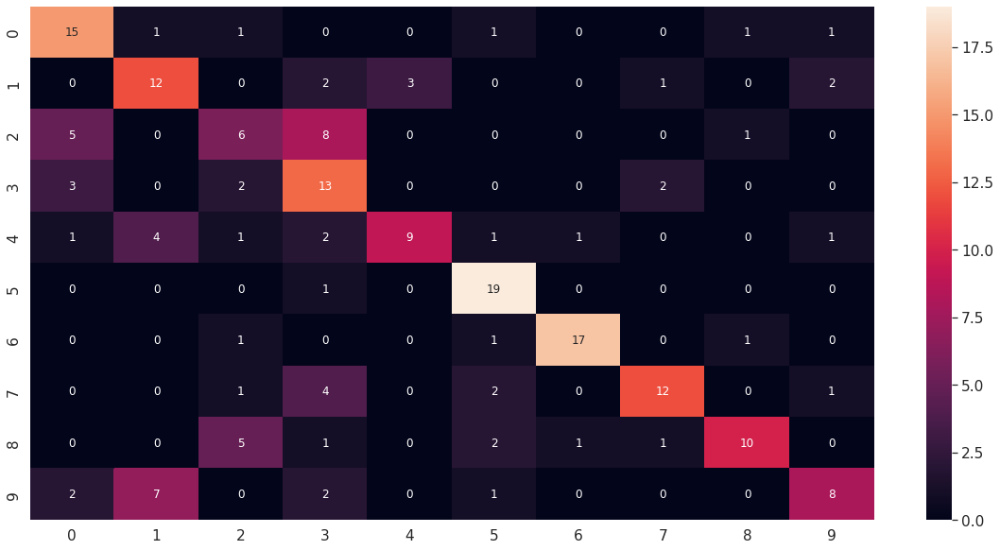

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_1_df_CM = pd.DataFrame(deepid_model_rof2_1_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_1_report)

              precision    recall  f1-score   support

           1       0.58      0.75      0.65        20
           2       0.50      0.60      0.55        20
           3       0.35      0.30      0.32        20
           4       0.39      0.65      0.49        20
           5       0.75      0.45      0.56        20
           6       0.70      0.95      0.81        20
           7       0.89      0.85      0.87        20
           8       0.75      0.60      0.67        20
           9       0.77      0.50      0.61        20
          10       0.62      0.40      0.48        20

    accuracy                           0.60       200
   macro avg       0.63      0.60      0.60       200
weighted avg       0.63      0.60      0.60       200



#### Modelo 2: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_2 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_2 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_2)
deepid_model_rof2_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_2.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_2 = deepid_model_rof2_2.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
43/43 [==============================] - 2s 37ms/step - loss: 4.4315 - accuracy: 0.2867 - val_loss: 1.9052 - val_accuracy: 0.4642
Epoch 2/150
43/43 [==============================] - 0s 11ms/step - loss: 1.4690 - accuracy: 0.5562 - val_loss: 1.4530 - val_accuracy: 0.5826
Epoch 3/150
43/43 [==============================] - 0s 10ms/step - loss: 0.8475 - accuracy: 0.7617 - val_loss: 1.1160 - val_accuracy: 0.7072
Epoch 4/150
43/43 [==============================] - 0s 10ms/step - loss: 0.4634 - accuracy: 0.8992 - val_loss: 1.0515 - val_accuracy: 0.7508
Epoch 5/150
43/43 [==============================] - 0s 8ms/step - loss: 0.2862 - accuracy: 0.9492 - val_loss: 1.0943 - val_accuracy: 0.7570
Epoch 6/150
43/43 [==============================] - 0s 9ms/step - loss: 0.1986 - accuracy: 0.9750 - val_loss: 0.9239 - val_accuracy: 0.8069
Epoch 7/150
43/43 [==============================] - 0s 7ms/step - loss: 0.1541 - accuracy: 0.9930 - val_loss: 1.1233 - val_accuracy: 0.7601
Epoch 8/1

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_2 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_2.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 1.2691 - accuracy: 0.6100


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


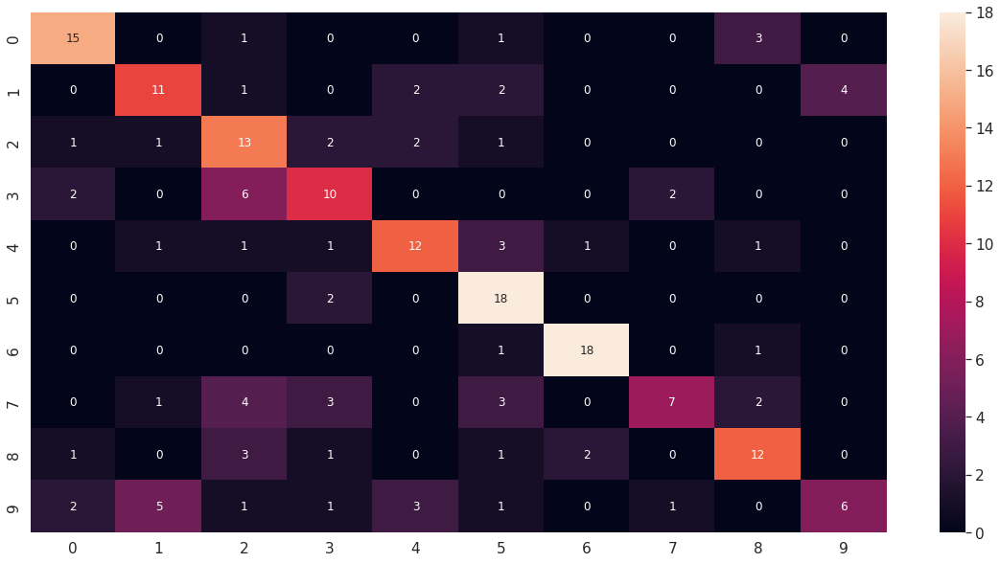

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_2_df_CM = pd.DataFrame(deepid_model_rof2_2_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_2_report)

              precision    recall  f1-score   support

           1       0.71      0.75      0.73        20
           2       0.58      0.55      0.56        20
           3       0.43      0.65      0.52        20
           4       0.50      0.50      0.50        20
           5       0.63      0.60      0.62        20
           6       0.58      0.90      0.71        20
           7       0.86      0.90      0.88        20
           8       0.70      0.35      0.47        20
           9       0.63      0.60      0.62        20
          10       0.60      0.30      0.40        20

    accuracy                           0.61       200
   macro avg       0.62      0.61      0.60       200
weighted avg       0.62      0.61      0.60       200



#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_3 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_3 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_3)
deepid_model_rof2_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_3.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_3 = deepid_model_rof2_3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
32/32 [==============================] - 1s 15ms/step - loss: 5.3826 - accuracy: 0.2531 - val_loss: 2.0523 - val_accuracy: 0.3738
Epoch 2/100
32/32 [==============================] - 0s 10ms/step - loss: 1.6706 - accuracy: 0.4984 - val_loss: 1.5512 - val_accuracy: 0.5514
Epoch 3/100
32/32 [==============================] - 0s 9ms/step - loss: 1.1090 - accuracy: 0.6742 - val_loss: 1.0835 - val_accuracy: 0.7009
Epoch 4/100
32/32 [==============================] - 0s 9ms/step - loss: 0.6670 - accuracy: 0.8266 - val_loss: 0.7787 - val_accuracy: 0.7757
Epoch 5/100
32/32 [==============================] - 0s 9ms/step - loss: 0.4027 - accuracy: 0.9102 - val_loss: 0.6192 - val_accuracy: 0.8131
Epoch 6/100
32/32 [==============================] - 0s 9ms/step - loss: 0.2465 - accuracy: 0.9641 - val_loss: 0.5194 - val_accuracy: 0.8567
Epoch 7/100
32/32 [==============================] - 0s 9ms/step - loss: 0.1595 - accuracy: 0.9883 - val_loss: 0.4399 - val_accuracy: 0.8816
Epoch 8/100

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_3 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_3.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 1.1508 - accuracy: 0.7000


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


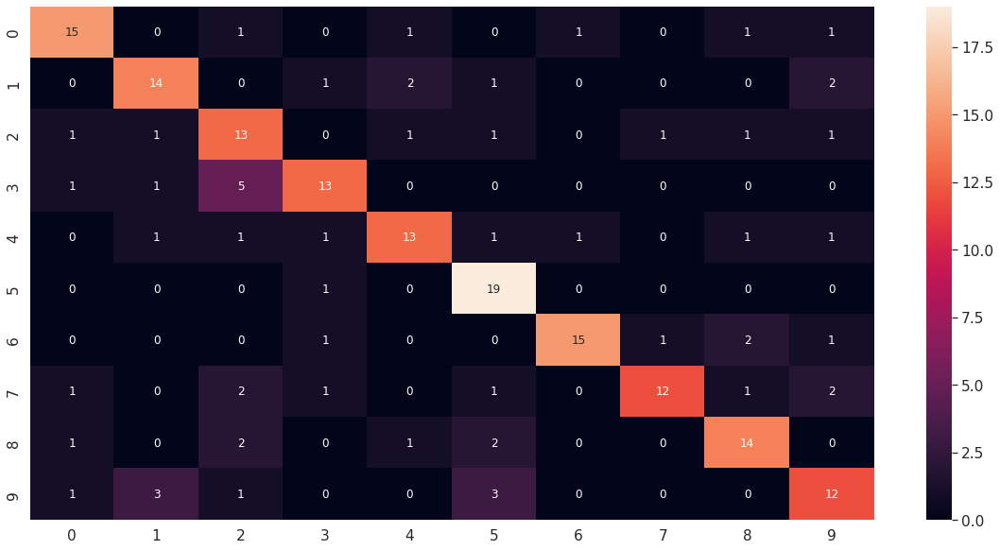

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_3_df_CM = pd.DataFrame(deepid_model_rof2_3_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_3_report)

              precision    recall  f1-score   support

           1       0.75      0.75      0.75        20
           2       0.70      0.70      0.70        20
           3       0.52      0.65      0.58        20
           4       0.72      0.65      0.68        20
           5       0.72      0.65      0.68        20
           6       0.68      0.95      0.79        20
           7       0.88      0.75      0.81        20
           8       0.86      0.60      0.71        20
           9       0.70      0.70      0.70        20
          10       0.60      0.60      0.60        20

    accuracy                           0.70       200
   macro avg       0.71      0.70      0.70       200
weighted avg       0.71      0.70      0.70       200



#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_4 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_4 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_4)
deepid_model_rof2_4.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_4.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_4 = deepid_model_rof2_4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
64/64 [==============================] - 1s 10ms/step - loss: 7.6004 - accuracy: 0.2328 - val_loss: 2.0294 - val_accuracy: 0.3551
Epoch 2/100
64/64 [==============================] - 0s 7ms/step - loss: 1.5790 - accuracy: 0.5078 - val_loss: 1.4645 - val_accuracy: 0.5639
Epoch 3/100
64/64 [==============================] - 0s 7ms/step - loss: 1.0533 - accuracy: 0.6945 - val_loss: 1.0826 - val_accuracy: 0.6791
Epoch 4/100
64/64 [==============================] - 0s 7ms/step - loss: 0.6905 - accuracy: 0.8133 - val_loss: 0.8391 - val_accuracy: 0.7539
Epoch 5/100
64/64 [==============================] - 0s 7ms/step - loss: 0.4158 - accuracy: 0.8969 - val_loss: 0.7100 - val_accuracy: 0.7882
Epoch 6/100
64/64 [==============================] - 0s 7ms/step - loss: 0.2533 - accuracy: 0.9516 - val_loss: 0.6380 - val_accuracy: 0.8255
Epoch 7/100
64/64 [==============================] - 0s 7ms/step - loss: 0.1580 - accuracy: 0.9844 - val_loss: 0.5935 - val_accuracy: 0.8474
Epoch 8/100


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_4 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_4.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 0.8570 - accuracy: 0.7550


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


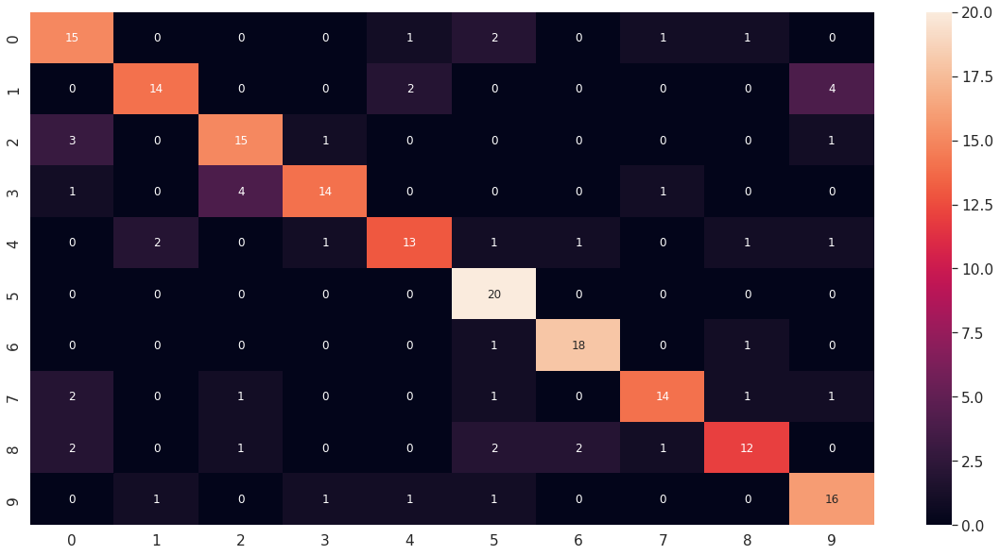

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_4_df_CM = pd.DataFrame(deepid_model_rof2_4_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_4_report)

              precision    recall  f1-score   support

           1       0.65      0.75      0.70        20
           2       0.82      0.70      0.76        20
           3       0.71      0.75      0.73        20
           4       0.82      0.70      0.76        20
           5       0.76      0.65      0.70        20
           6       0.71      1.00      0.83        20
           7       0.86      0.90      0.88        20
           8       0.82      0.70      0.76        20
           9       0.75      0.60      0.67        20
          10       0.70      0.80      0.74        20

    accuracy                           0.76       200
   macro avg       0.76      0.76      0.75       200
weighted avg       0.76      0.76      0.75       200



#### Modelo 5: (BTH = 50, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_5 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_5 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_5)
deepid_model_rof2_5.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_5.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_5 = deepid_model_rof2_5.fit(new_trainX, new_trainY, batch_size=50, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
26/26 [==============================] - 1s 18ms/step - loss: 6.0413 - accuracy: 0.1953 - val_loss: 2.4972 - val_accuracy: 0.2523
Epoch 2/100
26/26 [==============================] - 0s 10ms/step - loss: 2.0318 - accuracy: 0.3664 - val_loss: 1.9461 - val_accuracy: 0.3707
Epoch 3/100
26/26 [==============================] - 0s 11ms/step - loss: 1.5537 - accuracy: 0.5234 - val_loss: 1.5722 - val_accuracy: 0.5078
Epoch 4/100
26/26 [==============================] - 0s 11ms/step - loss: 1.1609 - accuracy: 0.6680 - val_loss: 1.2534 - val_accuracy: 0.6417
Epoch 5/100
26/26 [==============================] - 0s 10ms/step - loss: 0.7977 - accuracy: 0.7789 - val_loss: 0.9479 - val_accuracy: 0.7259
Epoch 6/100
26/26 [==============================] - 0s 11ms/step - loss: 0.5001 - accuracy: 0.8766 - val_loss: 0.7416 - val_accuracy: 0.7850
Epoch 7/100
26/26 [==============================] - 0s 10ms/step - loss: 0.2929 - accuracy: 0.9477 - val_loss: 0.6061 - val_accuracy: 0.8287
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_5 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_5.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 1.2516 - accuracy: 0.7650


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 2ms/step


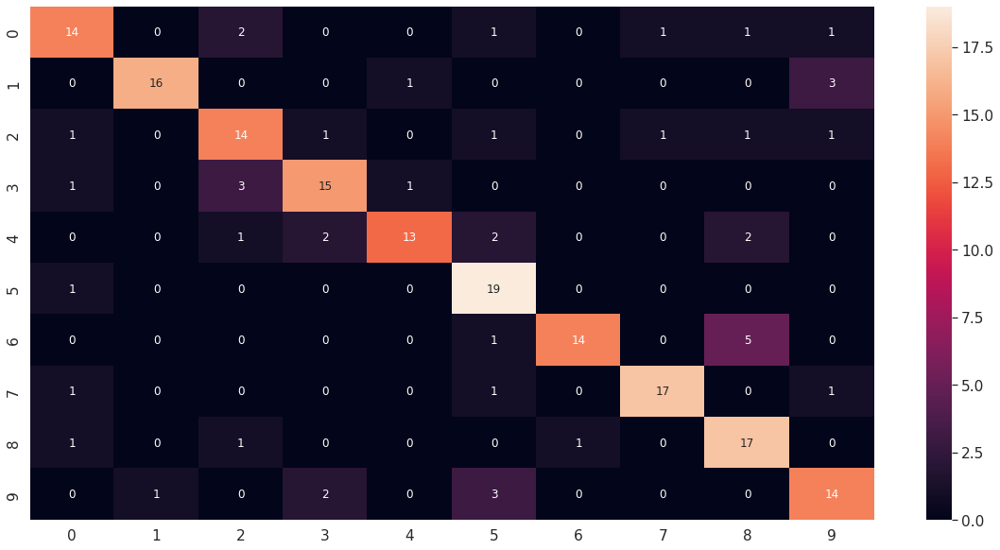

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_5_df_CM = pd.DataFrame(deepid_model_rof2_5_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_5_report)

              precision    recall  f1-score   support

           1       0.74      0.70      0.72        20
           2       0.94      0.80      0.86        20
           3       0.67      0.70      0.68        20
           4       0.75      0.75      0.75        20
           5       0.87      0.65      0.74        20
           6       0.68      0.95      0.79        20
           7       0.93      0.70      0.80        20
           8       0.89      0.85      0.87        20
           9       0.65      0.85      0.74        20
          10       0.70      0.70      0.70        20

    accuracy                           0.77       200
   macro avg       0.78      0.76      0.77       200
weighted avg       0.78      0.77      0.77       200



#### Modelo 6: (BTH = 60, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_6 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_6 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_6)
deepid_model_rof2_6.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_6.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_6.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_6 = deepid_model_rof2_6.fit(new_trainX, new_trainY, batch_size=60, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
22/22 [==============================] - 1s 41ms/step - loss: 12.2253 - accuracy: 0.1383 - val_loss: 2.6837 - val_accuracy: 0.2586
Epoch 2/100
22/22 [==============================] - 0s 16ms/step - loss: 2.2328 - accuracy: 0.3305 - val_loss: 2.0082 - val_accuracy: 0.3988
Epoch 3/100
22/22 [==============================] - 0s 13ms/step - loss: 1.7127 - accuracy: 0.4844 - val_loss: 1.5753 - val_accuracy: 0.5109
Epoch 4/100
22/22 [==============================] - 0s 12ms/step - loss: 1.2492 - accuracy: 0.6367 - val_loss: 1.2033 - val_accuracy: 0.6355
Epoch 5/100
22/22 [==============================] - 0s 12ms/step - loss: 0.8777 - accuracy: 0.7602 - val_loss: 0.9358 - val_accuracy: 0.7414
Epoch 6/100
22/22 [==============================] - 0s 12ms/step - loss: 0.5905 - accuracy: 0.8508 - val_loss: 0.7612 - val_accuracy: 0.7882
Epoch 7/100
22/22 [==============================] - 0s 13ms/step - loss: 0.3765 - accuracy: 0.9219 - val_loss: 0.6242 - val_accuracy: 0.8380
Epoch

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_6 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_6.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 1.1837 - accuracy: 0.7950


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


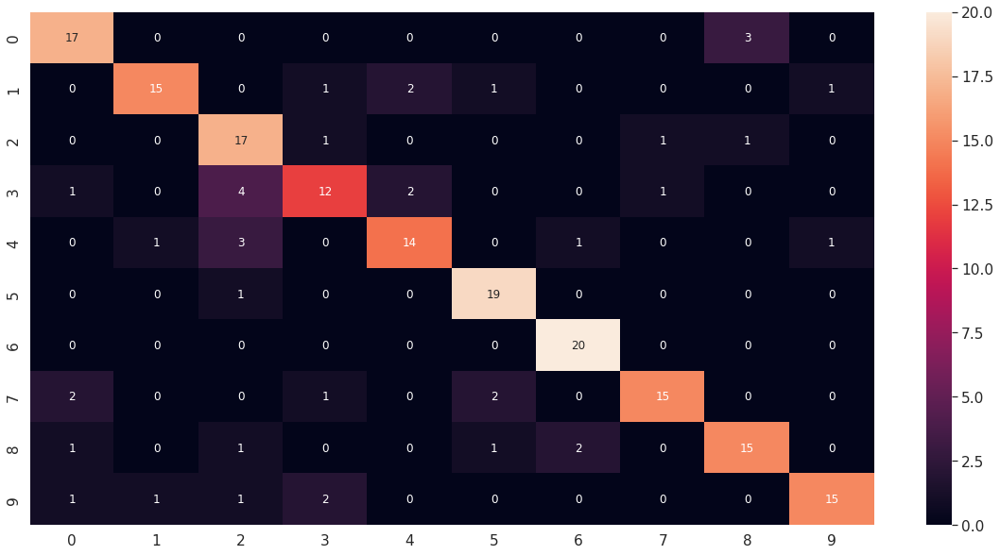

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_6_df_CM = pd.DataFrame(deepid_model_rof2_6_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_6_report)

              precision    recall  f1-score   support

           1       0.77      0.85      0.81        20
           2       0.88      0.75      0.81        20
           3       0.63      0.85      0.72        20
           4       0.71      0.60      0.65        20
           5       0.78      0.70      0.74        20
           6       0.83      0.95      0.88        20
           7       0.87      1.00      0.93        20
           8       0.88      0.75      0.81        20
           9       0.79      0.75      0.77        20
          10       0.88      0.75      0.81        20

    accuracy                           0.80       200
   macro avg       0.80      0.79      0.79       200
weighted avg       0.80      0.80      0.79       200



#### Modelo 7: (BTH = 70, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_7 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_7 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_7)
deepid_model_rof2_7.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_7.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_7.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_7 = deepid_model_rof2_7.fit(new_trainX, new_trainY, batch_size=70, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
19/19 [==============================] - 1s 27ms/step - loss: 11.7863 - accuracy: 0.1734 - val_loss: 2.9326 - val_accuracy: 0.1931
Epoch 2/100
19/19 [==============================] - 0s 16ms/step - loss: 2.4858 - accuracy: 0.2297 - val_loss: 2.1072 - val_accuracy: 0.3209
Epoch 3/100
19/19 [==============================] - 0s 15ms/step - loss: 1.9494 - accuracy: 0.3586 - val_loss: 1.8243 - val_accuracy: 0.4174
Epoch 4/100
19/19 [==============================] - 0s 15ms/step - loss: 1.6227 - accuracy: 0.4727 - val_loss: 1.5883 - val_accuracy: 0.4579
Epoch 5/100
19/19 [==============================] - 0s 14ms/step - loss: 1.3038 - accuracy: 0.6008 - val_loss: 1.3837 - val_accuracy: 0.5389
Epoch 6/100
19/19 [==============================] - 0s 17ms/step - loss: 1.0169 - accuracy: 0.7070 - val_loss: 1.1897 - val_accuracy: 0.6044
Epoch 7/100
19/19 [==============================] - 0s 13ms/step - loss: 0.7449 - accuracy: 0.8031 - val_loss: 0.9670 - val_accuracy: 0.7040
Epoch

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_7 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_7.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 1.0462 - accuracy: 0.7950


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


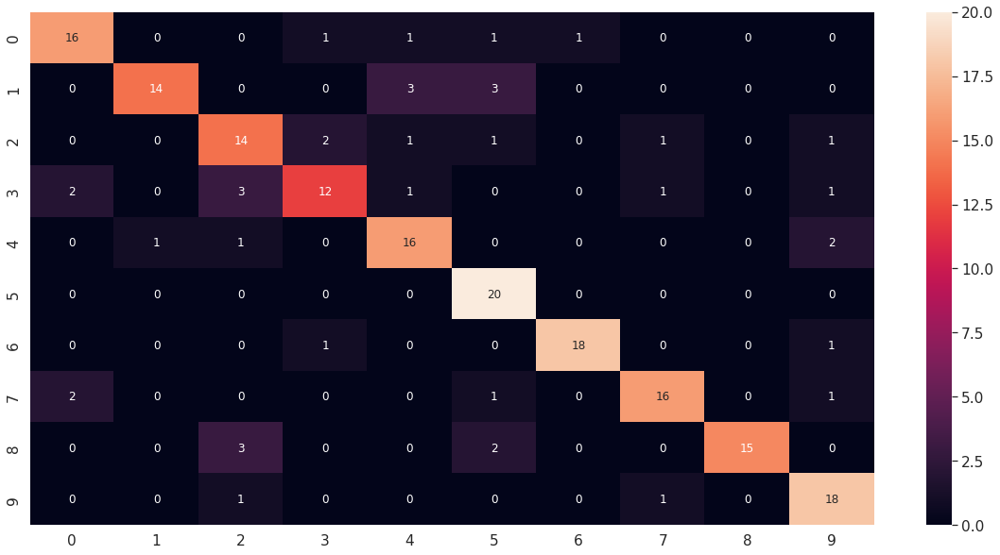

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_7_df_CM = pd.DataFrame(deepid_model_rof2_7_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_7_report)

              precision    recall  f1-score   support

           1       0.80      0.80      0.80        20
           2       0.93      0.70      0.80        20
           3       0.64      0.70      0.67        20
           4       0.75      0.60      0.67        20
           5       0.73      0.80      0.76        20
           6       0.71      1.00      0.83        20
           7       0.95      0.90      0.92        20
           8       0.84      0.80      0.82        20
           9       1.00      0.75      0.86        20
          10       0.75      0.90      0.82        20

    accuracy                           0.80       200
   macro avg       0.81      0.80      0.79       200
weighted avg       0.81      0.80      0.79       200



#### Modelo 8: (BTH = 10, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_8 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_8 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_8)
deepid_model_rof2_8.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_8.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_8.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_8 = deepid_model_rof2_8.fit(new_trainX, new_trainY, batch_size=10, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
128/128 [==============================] - 1s 7ms/step - loss: 4.8673 - accuracy: 0.2422 - val_loss: 1.8915 - val_accuracy: 0.3925
Epoch 2/100
128/128 [==============================] - 1s 5ms/step - loss: 1.4100 - accuracy: 0.5383 - val_loss: 1.1159 - val_accuracy: 0.6698
Epoch 3/100
128/128 [==============================] - 1s 5ms/step - loss: 0.6958 - accuracy: 0.7922 - val_loss: 0.4955 - val_accuracy: 0.8660
Epoch 4/100
128/128 [==============================] - 1s 5ms/step - loss: 0.2925 - accuracy: 0.9344 - val_loss: 0.3704 - val_accuracy: 0.9034
Epoch 5/100
128/128 [==============================] - 1s 5ms/step - loss: 0.1330 - accuracy: 0.9797 - val_loss: 0.2835 - val_accuracy: 0.9315
Epoch 6/100
128/128 [==============================] - 1s 6ms/step - loss: 0.0720 - accuracy: 0.9992 - val_loss: 0.2630 - val_accuracy: 0.9377
Epoch 7/100
128/128 [==============================] - 1s 5ms/step - loss: 0.0602 - accuracy: 1.0000 - val_loss: 0.2569 - val_accuracy: 0.9252

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_8 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_8.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.5837 - accuracy: 0.8600


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


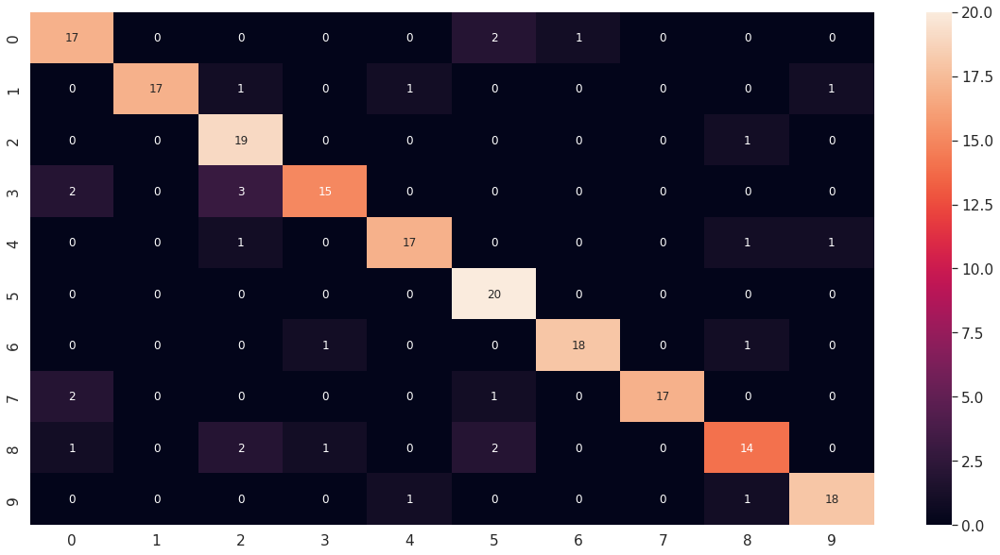

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_8_df_CM = pd.DataFrame(deepid_model_rof2_8_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_8_report)

              precision    recall  f1-score   support

           1       0.77      0.85      0.81        20
           2       1.00      0.85      0.92        20
           3       0.73      0.95      0.83        20
           4       0.88      0.75      0.81        20
           5       0.89      0.85      0.87        20
           6       0.80      1.00      0.89        20
           7       0.95      0.90      0.92        20
           8       1.00      0.85      0.92        20
           9       0.78      0.70      0.74        20
          10       0.90      0.90      0.90        20

    accuracy                           0.86       200
   macro avg       0.87      0.86      0.86       200
weighted avg       0.87      0.86      0.86       200



#### Modelo 9: (BTH = 10, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_9 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_9 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_9)
deepid_model_rof2_9.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_9.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_9 = deepid_model_rof2_9.fit(new_trainX, new_trainY, batch_size=10, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
128/128 [==============================] - 1s 7ms/step - loss: 12.4395 - accuracy: 0.3352 - val_loss: 2.2721 - val_accuracy: 0.4735
Epoch 2/150
128/128 [==============================] - 1s 6ms/step - loss: 1.3047 - accuracy: 0.6383 - val_loss: 1.4249 - val_accuracy: 0.6511
Epoch 3/150
128/128 [==============================] - 1s 6ms/step - loss: 0.6645 - accuracy: 0.8227 - val_loss: 1.0920 - val_accuracy: 0.7227
Epoch 4/150
128/128 [==============================] - 1s 5ms/step - loss: 0.3273 - accuracy: 0.9266 - val_loss: 0.8743 - val_accuracy: 0.7975
Epoch 5/150
128/128 [==============================] - 1s 5ms/step - loss: 0.1965 - accuracy: 0.9695 - val_loss: 0.8145 - val_accuracy: 0.8037
Epoch 6/150
128/128 [==============================] - 1s 5ms/step - loss: 0.1289 - accuracy: 0.9930 - val_loss: 0.6701 - val_accuracy: 0.8505
Epoch 7/150
128/128 [==============================] - 1s 5ms/step - loss: 0.1023 - accuracy: 1.0000 - val_loss: 0.6151 - val_accuracy: 0.859

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_9 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_9.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.8762 - accuracy: 0.7800


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


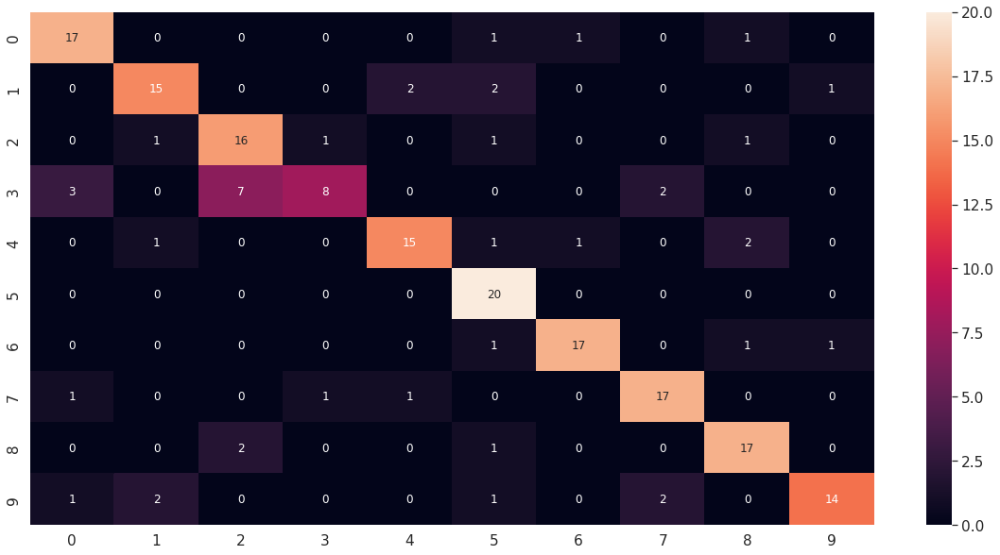

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_9_df_CM = pd.DataFrame(deepid_model_rof2_9_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_9_report)

              precision    recall  f1-score   support

           1       0.77      0.85      0.81        20
           2       0.79      0.75      0.77        20
           3       0.64      0.80      0.71        20
           4       0.80      0.40      0.53        20
           5       0.83      0.75      0.79        20
           6       0.71      1.00      0.83        20
           7       0.89      0.85      0.87        20
           8       0.81      0.85      0.83        20
           9       0.77      0.85      0.81        20
          10       0.88      0.70      0.78        20

    accuracy                           0.78       200
   macro avg       0.79      0.78      0.77       200
weighted avg       0.79      0.78      0.77       200



#### Modelo 10: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_10 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_10 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_rof2_10)
deepid_model_rof2_10.summary()

Model: "model_18"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_10.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_10 = deepid_model_rof2_10.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
43/43 [==============================] - 2s 15ms/step - loss: 2.5959 - accuracy: 0.0922 - val_loss: 2.5313 - val_accuracy: 0.0966
Epoch 2/150
43/43 [==============================] - 0s 9ms/step - loss: 2.4765 - accuracy: 0.1180 - val_loss: 2.4811 - val_accuracy: 0.1589
Epoch 3/150
43/43 [==============================] - 0s 10ms/step - loss: 2.3896 - accuracy: 0.1680 - val_loss: 2.3828 - val_accuracy: 0.1900
Epoch 4/150
43/43 [==============================] - 0s 9ms/step - loss: 2.2745 - accuracy: 0.2094 - val_loss: 2.2563 - val_accuracy: 0.2274
Epoch 5/150
43/43 [==============================] - 1s 12ms/step - loss: 2.1842 - accuracy: 0.2453 - val_loss: 2.3477 - val_accuracy: 0.1464
Epoch 6/150
43/43 [==============================] - 0s 9ms/step - loss: 2.0966 - accuracy: 0.2641 - val_loss: 2.2457 - val_accuracy: 0.1963
Epoch 7/150
43/43 [==============================] - 0s 9ms/step - loss: 2.0310 - accuracy: 0.2820 - val_loss: 2.0538 - val_accuracy: 0.3115
Epoch 8/15

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_10 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_10.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 1.0064 - accuracy: 0.6800


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


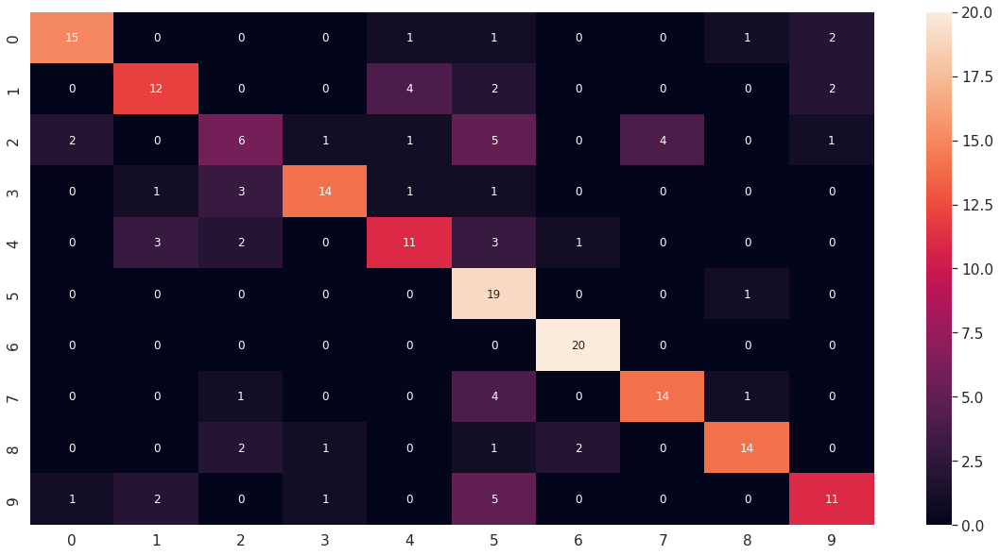

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_10_df_CM = pd.DataFrame(deepid_model_rof2_10_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_10_report)

              precision    recall  f1-score   support

           1       0.83      0.75      0.79        20
           2       0.67      0.60      0.63        20
           3       0.43      0.30      0.35        20
           4       0.82      0.70      0.76        20
           5       0.61      0.55      0.58        20
           6       0.46      0.95      0.62        20
           7       0.87      1.00      0.93        20
           8       0.78      0.70      0.74        20
           9       0.82      0.70      0.76        20
          10       0.69      0.55      0.61        20

    accuracy                           0.68       200
   macro avg       0.70      0.68      0.68       200
weighted avg       0.70      0.68      0.68       200



#### Modelo 11: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_11 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_11 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_rof2_11)
deepid_model_rof2_11.summary()

Model: "model_19"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_11.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_11 = deepid_model_rof2_11.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
32/32 [==============================] - 1s 17ms/step - loss: 4.5470 - accuracy: 0.1625 - val_loss: 2.4272 - val_accuracy: 0.1558
Epoch 2/100
32/32 [==============================] - 0s 10ms/step - loss: 2.3414 - accuracy: 0.2352 - val_loss: 2.2158 - val_accuracy: 0.2928
Epoch 3/100
32/32 [==============================] - 0s 10ms/step - loss: 2.0408 - accuracy: 0.3586 - val_loss: 1.8207 - val_accuracy: 0.4517
Epoch 4/100
32/32 [==============================] - 0s 9ms/step - loss: 1.6770 - accuracy: 0.4789 - val_loss: 1.3920 - val_accuracy: 0.5919
Epoch 5/100
32/32 [==============================] - 0s 9ms/step - loss: 1.2913 - accuracy: 0.6289 - val_loss: 1.0565 - val_accuracy: 0.7414
Epoch 6/100
32/32 [==============================] - 0s 9ms/step - loss: 1.0072 - accuracy: 0.7117 - val_loss: 0.8077 - val_accuracy: 0.8474
Epoch 7/100
32/32 [==============================] - 0s 10ms/step - loss: 0.8560 - accuracy: 0.7711 - val_loss: 0.6828 - val_accuracy: 0.8598
Epoch 8/1

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_11 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_11.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.8150


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


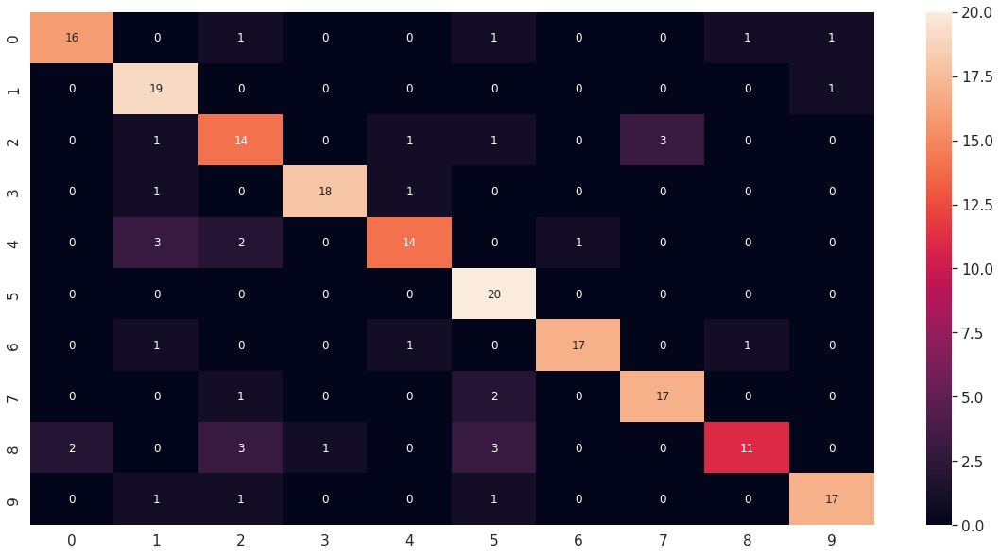

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_11_df_CM = pd.DataFrame(deepid_model_rof2_11_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_11_report)

              precision    recall  f1-score   support

           1       0.89      0.80      0.84        20
           2       0.73      0.95      0.83        20
           3       0.64      0.70      0.67        20
           4       0.95      0.90      0.92        20
           5       0.82      0.70      0.76        20
           6       0.71      1.00      0.83        20
           7       0.94      0.85      0.89        20
           8       0.85      0.85      0.85        20
           9       0.85      0.55      0.67        20
          10       0.89      0.85      0.87        20

    accuracy                           0.81       200
   macro avg       0.83      0.82      0.81       200
weighted avg       0.83      0.81      0.81       200



#### Modelo 12: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_12 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_12 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_rof2_12)
deepid_model_rof2_12.summary()

Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_rof2_12.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_12.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_12 = deepid_model_rof2_12.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
43/43 [==============================] - 1s 13ms/step - loss: 5.3226 - accuracy: 0.1398 - val_loss: 2.3584 - val_accuracy: 0.2928
Epoch 2/100
43/43 [==============================] - 0s 9ms/step - loss: 2.6083 - accuracy: 0.2000 - val_loss: 2.2635 - val_accuracy: 0.2773
Epoch 3/100
43/43 [==============================] - 0s 9ms/step - loss: 2.4132 - accuracy: 0.2320 - val_loss: 2.2014 - val_accuracy: 0.3053
Epoch 4/100
43/43 [==============================] - 0s 8ms/step - loss: 2.3243 - accuracy: 0.2531 - val_loss: 2.0793 - val_accuracy: 0.3676
Epoch 5/100
43/43 [==============================] - 0s 9ms/step - loss: 2.1475 - accuracy: 0.3031 - val_loss: 1.9609 - val_accuracy: 0.4361
Epoch 6/100
43/43 [==============================] - 0s 8ms/step - loss: 2.1072 - accuracy: 0.3422 - val_loss: 1.8456 - val_accuracy: 0.4922
Epoch 7/100
43/43 [==============================] - 0s 10ms/step - loss: 1.9618 - accuracy: 0.3992 - val_loss: 1.7098 - val_accuracy: 0.5576
Epoch 8/100

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_12 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_12.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.6598 - accuracy: 0.7900


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


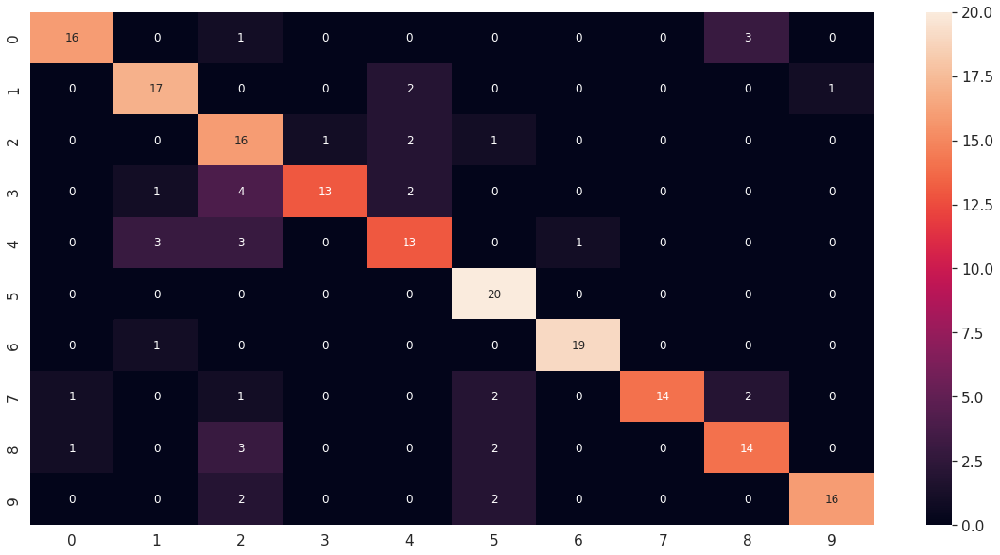

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_12_df_CM = pd.DataFrame(deepid_model_rof2_12_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_12_report)

              precision    recall  f1-score   support

           1       0.89      0.80      0.84        20
           2       0.77      0.85      0.81        20
           3       0.53      0.80      0.64        20
           4       0.93      0.65      0.76        20
           5       0.68      0.65      0.67        20
           6       0.74      1.00      0.85        20
           7       0.95      0.95      0.95        20
           8       1.00      0.70      0.82        20
           9       0.74      0.70      0.72        20
          10       0.94      0.80      0.86        20

    accuracy                           0.79       200
   macro avg       0.82      0.79      0.79       200
weighted avg       0.82      0.79      0.79       200



#### Modelo 13: (BTH = 20, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_13 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_13 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_13)
deepid_model_rof2_13.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_13.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_13.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_13 = deepid_model_rof2_13.fit(new_trainX, new_trainY, batch_size=20, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
64/64 [==============================] - 1s 10ms/step - loss: 4.7289 - accuracy: 0.1695 - val_loss: 2.2522 - val_accuracy: 0.2336
Epoch 2/200
64/64 [==============================] - 0s 7ms/step - loss: 2.0374 - accuracy: 0.2969 - val_loss: 1.8426 - val_accuracy: 0.3956
Epoch 3/200
64/64 [==============================] - 0s 7ms/step - loss: 1.5370 - accuracy: 0.4922 - val_loss: 1.4311 - val_accuracy: 0.5140
Epoch 4/200
64/64 [==============================] - 0s 6ms/step - loss: 1.0023 - accuracy: 0.6773 - val_loss: 0.9388 - val_accuracy: 0.7352
Epoch 5/200
64/64 [==============================] - 0s 7ms/step - loss: 0.5435 - accuracy: 0.8477 - val_loss: 0.6347 - val_accuracy: 0.8255
Epoch 6/200
64/64 [==============================] - 0s 6ms/step - loss: 0.2750 - accuracy: 0.9375 - val_loss: 0.5409 - val_accuracy: 0.8723
Epoch 7/200
64/64 [==============================] - 0s 6ms/step - loss: 0.1620 - accuracy: 0.9719 - val_loss: 0.4263 - val_accuracy: 0.8972
Epoch 8/200


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_13 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_13.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.7574 - accuracy: 0.8350


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


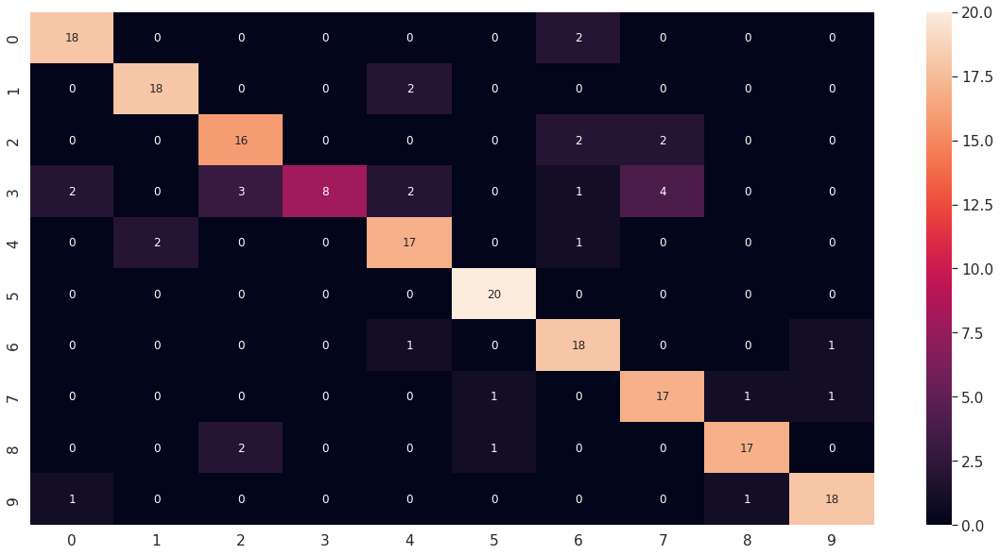

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_13_df_CM = pd.DataFrame(deepid_model_rof2_13_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_13_report)

              precision    recall  f1-score   support

           1       0.86      0.90      0.88        20
           2       0.90      0.90      0.90        20
           3       0.76      0.80      0.78        20
           4       1.00      0.40      0.57        20
           5       0.77      0.85      0.81        20
           6       0.91      1.00      0.95        20
           7       0.75      0.90      0.82        20
           8       0.74      0.85      0.79        20
           9       0.89      0.85      0.87        20
          10       0.90      0.90      0.90        20

    accuracy                           0.83       200
   macro avg       0.85      0.83      0.83       200
weighted avg       0.85      0.83      0.83       200



#### Modelo 14: (BTH = 10, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_14 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_14 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_14)
deepid_model_rof2_14.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_rof2_14.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_14.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_14 = deepid_model_rof2_14.fit(new_trainX, new_trainY, batch_size=10, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
128/128 [==============================] - 2s 7ms/step - loss: 9.7113 - accuracy: 0.3008 - val_loss: 2.7004 - val_accuracy: 0.4050
Epoch 2/200
128/128 [==============================] - 1s 6ms/step - loss: 2.2212 - accuracy: 0.4734 - val_loss: 1.8279 - val_accuracy: 0.4798
Epoch 3/200
128/128 [==============================] - 1s 6ms/step - loss: 1.5700 - accuracy: 0.5680 - val_loss: 1.4833 - val_accuracy: 0.5452
Epoch 4/200
128/128 [==============================] - 1s 6ms/step - loss: 1.2267 - accuracy: 0.6508 - val_loss: 1.1976 - val_accuracy: 0.6293
Epoch 5/200
128/128 [==============================] - 1s 6ms/step - loss: 0.9579 - accuracy: 0.7289 - val_loss: 1.0220 - val_accuracy: 0.6729
Epoch 6/200
128/128 [==============================] - 1s 6ms/step - loss: 0.7892 - accuracy: 0.7766 - val_loss: 0.8553 - val_accuracy: 0.7134
Epoch 7/200
128/128 [==============================] - 1s 6ms/step - loss: 0.6527 - accuracy: 0.8250 - val_loss: 0.7599 - val_accuracy: 0.7570

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_14 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_14.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.7502 - accuracy: 0.8300


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 2ms/step


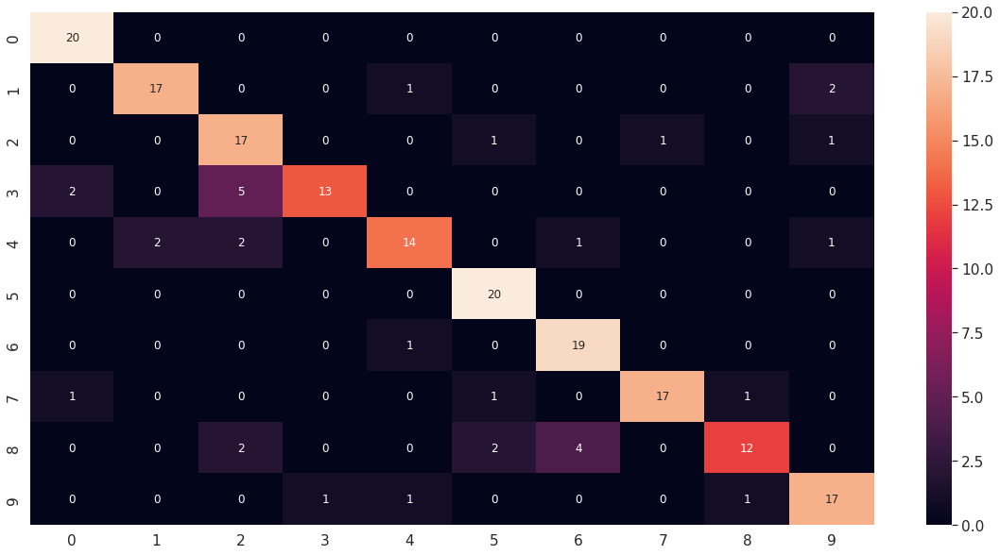

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_14_df_CM = pd.DataFrame(deepid_model_rof2_14_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_14_report)

              precision    recall  f1-score   support

           1       0.87      1.00      0.93        20
           2       0.89      0.85      0.87        20
           3       0.65      0.85      0.74        20
           4       0.93      0.65      0.76        20
           5       0.82      0.70      0.76        20
           6       0.83      1.00      0.91        20
           7       0.79      0.95      0.86        20
           8       0.94      0.85      0.89        20
           9       0.86      0.60      0.71        20
          10       0.81      0.85      0.83        20

    accuracy                           0.83       200
   macro avg       0.84      0.83      0.83       200
weighted avg       0.84      0.83      0.83       200



#### Modelo 15: (BTH = 60, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_15 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_15 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_15)
deepid_model_rof2_15.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_15.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_15 = deepid_model_rof2_15.fit(new_trainX, new_trainY, batch_size=60, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
22/22 [==============================] - 1s 21ms/step - loss: 143.6361 - accuracy: 0.0922 - val_loss: 18.2738 - val_accuracy: 0.2025
Epoch 2/200
22/22 [==============================] - 0s 13ms/step - loss: 8.2182 - accuracy: 0.3383 - val_loss: 4.1088 - val_accuracy: 0.3209
Epoch 3/200
22/22 [==============================] - 0s 11ms/step - loss: 2.9953 - accuracy: 0.3547 - val_loss: 2.6658 - val_accuracy: 0.3053
Epoch 4/200
22/22 [==============================] - 0s 11ms/step - loss: 2.2584 - accuracy: 0.4000 - val_loss: 2.3589 - val_accuracy: 0.3333
Epoch 5/200
22/22 [==============================] - 0s 12ms/step - loss: 2.0063 - accuracy: 0.4172 - val_loss: 2.2531 - val_accuracy: 0.3645
Epoch 6/200
22/22 [==============================] - 0s 12ms/step - loss: 1.8314 - accuracy: 0.4461 - val_loss: 2.1535 - val_accuracy: 0.3894
Epoch 7/200
22/22 [==============================] - 0s 11ms/step - loss: 1.7130 - accuracy: 0.4680 - val_loss: 2.0577 - val_accuracy: 0.4019
Epo

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_15 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_15.evaluate(testX, testY)

7/7 [==============================] - 0s 3ms/step - loss: 2.5185 - accuracy: 0.7050


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


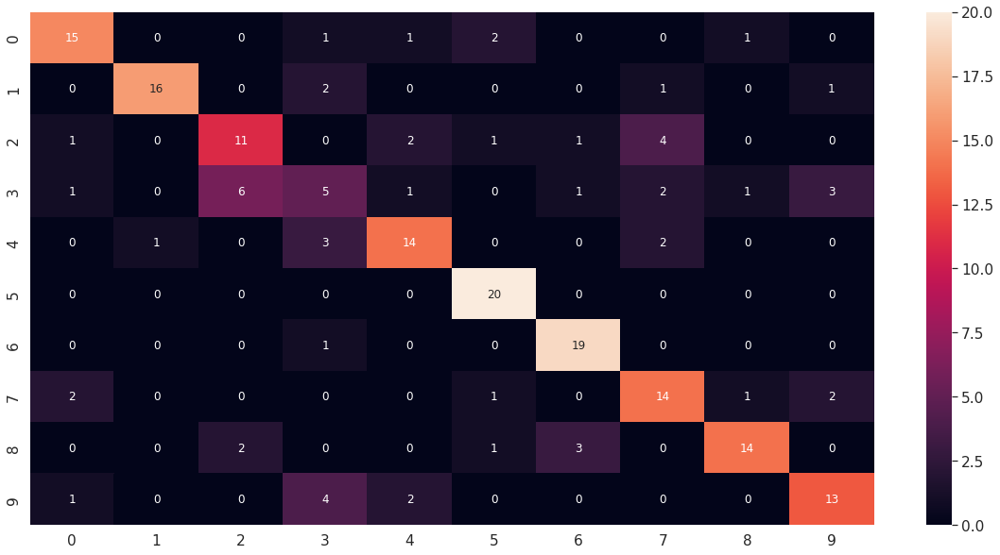

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_15_df_CM = pd.DataFrame(deepid_model_rof2_15_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_15_report)

              precision    recall  f1-score   support

           1       0.75      0.75      0.75        20
           2       0.94      0.80      0.86        20
           3       0.58      0.55      0.56        20
           4       0.31      0.25      0.28        20
           5       0.70      0.70      0.70        20
           6       0.80      1.00      0.89        20
           7       0.79      0.95      0.86        20
           8       0.61      0.70      0.65        20
           9       0.82      0.70      0.76        20
          10       0.68      0.65      0.67        20

    accuracy                           0.70       200
   macro avg       0.70      0.70      0.70       200
weighted avg       0.70      0.70      0.70       200



#### Modelo 16: (BTH = 30, EHS = 50, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_16 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_16 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_rof2_16)
deepid_model_rof2_16.summary()

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_16.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_16.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_16 = deepid_model_rof2_16.fit(new_trainX, new_trainY, batch_size=30, epochs=50, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/50
43/43 [==============================] - 1s 12ms/step - loss: 8.6460 - accuracy: 0.2109 - val_loss: 2.2915 - val_accuracy: 0.2212
Epoch 2/50
43/43 [==============================] - 0s 8ms/step - loss: 2.2286 - accuracy: 0.2562 - val_loss: 2.1016 - val_accuracy: 0.2991
Epoch 3/50
43/43 [==============================] - 0s 8ms/step - loss: 1.7335 - accuracy: 0.4359 - val_loss: 1.6254 - val_accuracy: 0.5452
Epoch 4/50
43/43 [==============================] - 0s 7ms/step - loss: 1.4102 - accuracy: 0.5875 - val_loss: 1.4400 - val_accuracy: 0.6075
Epoch 5/50
43/43 [==============================] - 0s 7ms/step - loss: 1.1795 - accuracy: 0.6602 - val_loss: 1.3194 - val_accuracy: 0.6417
Epoch 6/50
43/43 [==============================] - 0s 7ms/step - loss: 0.9326 - accuracy: 0.7570 - val_loss: 0.8936 - val_accuracy: 0.7632
Epoch 7/50
43/43 [==============================] - 0s 8ms/step - loss: 0.6459 - accuracy: 0.8313 - val_loss: 0.7652 - val_accuracy: 0.8193
Epoch 8/50
43/43 [=

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_16 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_16.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_16.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_16.evaluate(testX, testY)

7/7 [==============================] - 0s 5ms/step - loss: 1.5472 - accuracy: 0.7700


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_16.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_16_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


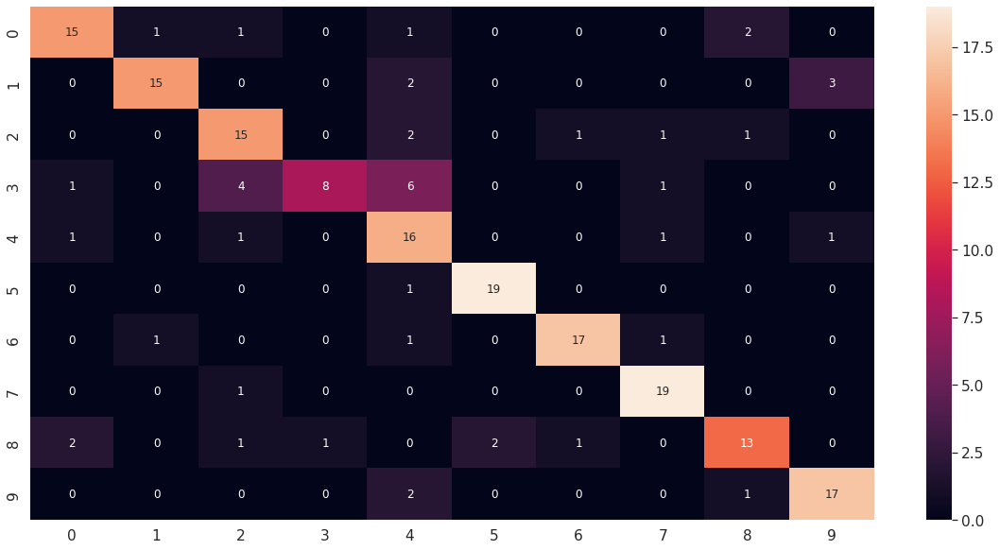

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_16_df_CM = pd.DataFrame(deepid_model_rof2_16_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_16_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_16_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_16_report)

              precision    recall  f1-score   support

           1       0.79      0.75      0.77        20
           2       0.88      0.75      0.81        20
           3       0.65      0.75      0.70        20
           4       0.89      0.40      0.55        20
           5       0.52      0.80      0.63        20
           6       0.90      0.95      0.93        20
           7       0.89      0.85      0.87        20
           8       0.83      0.95      0.88        20
           9       0.76      0.65      0.70        20
          10       0.81      0.85      0.83        20

    accuracy                           0.77       200
   macro avg       0.79      0.77      0.77       200
weighted avg       0.79      0.77      0.77       200



#### Modelo 17: (BTH = 20, EHS = 80, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_17 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_17 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof2_17)
deepid_model_rof2_17.summary()

Model: "model_22"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_17.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_17.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_17 = deepid_model_rof2_17.fit(new_trainX, new_trainY, batch_size=20, epochs=80, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/80
64/64 [==============================] - 1s 10ms/step - loss: 2.5226 - accuracy: 0.1125 - val_loss: 2.4684 - val_accuracy: 0.1028
Epoch 2/80
64/64 [==============================] - 0s 7ms/step - loss: 2.3941 - accuracy: 0.1305 - val_loss: 2.3393 - val_accuracy: 0.1433
Epoch 3/80
64/64 [==============================] - 0s 7ms/step - loss: 2.1749 - accuracy: 0.2344 - val_loss: 2.0410 - val_accuracy: 0.3146
Epoch 4/80
64/64 [==============================] - 0s 7ms/step - loss: 1.9363 - accuracy: 0.3242 - val_loss: 1.9572 - val_accuracy: 0.2960
Epoch 5/80
64/64 [==============================] - 0s 7ms/step - loss: 1.7205 - accuracy: 0.4227 - val_loss: 1.6356 - val_accuracy: 0.4891
Epoch 6/80
64/64 [==============================] - 0s 7ms/step - loss: 1.4646 - accuracy: 0.5125 - val_loss: 1.5284 - val_accuracy: 0.5171
Epoch 7/80
64/64 [==============================] - 0s 6ms/step - loss: 1.2862 - accuracy: 0.5883 - val_loss: 1.5452 - val_accuracy: 0.5358
Epoch 8/80
64/64 [=

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_17 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_17.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_17.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_17.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.7165 - accuracy: 0.8100


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_17.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_17_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


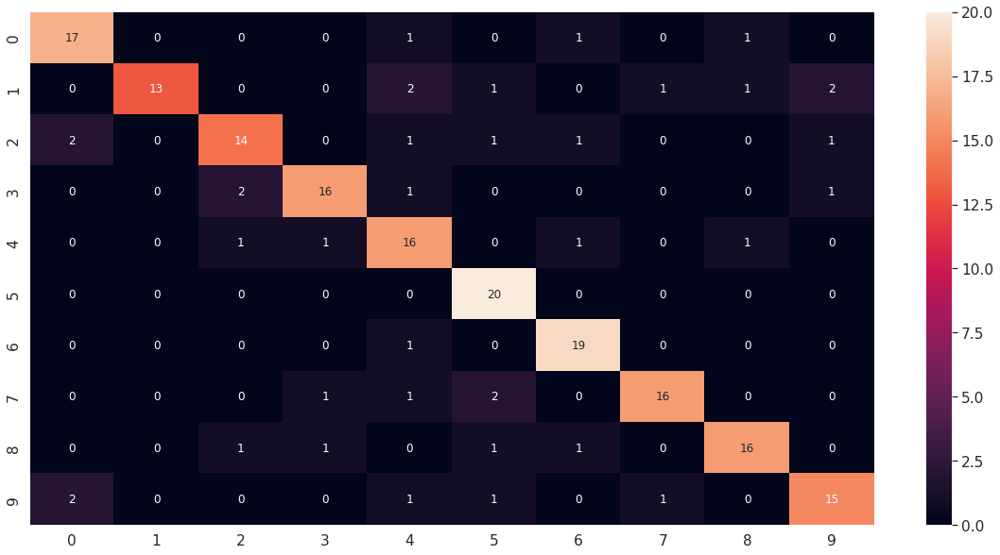

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_17_df_CM = pd.DataFrame(deepid_model_rof2_17_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_17_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_17_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_17_report)

              precision    recall  f1-score   support

           1       0.81      0.85      0.83        20
           2       1.00      0.65      0.79        20
           3       0.78      0.70      0.74        20
           4       0.84      0.80      0.82        20
           5       0.67      0.80      0.73        20
           6       0.77      1.00      0.87        20
           7       0.83      0.95      0.88        20
           8       0.89      0.80      0.84        20
           9       0.84      0.80      0.82        20
          10       0.79      0.75      0.77        20

    accuracy                           0.81       200
   macro avg       0.82      0.81      0.81       200
weighted avg       0.82      0.81      0.81       200



#### Modelo 18: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_18 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_18 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof2_18)
deepid_model_rof2_18.summary()

Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_18.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_18.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_18 = deepid_model_rof2_18.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
32/32 [==============================] - 1s 18ms/step - loss: 4.0958 - accuracy: 0.2359 - val_loss: 2.0009 - val_accuracy: 0.3676
Epoch 2/100
32/32 [==============================] - 0s 10ms/step - loss: 1.6761 - accuracy: 0.4750 - val_loss: 1.3975 - val_accuracy: 0.5919
Epoch 3/100
32/32 [==============================] - 0s 10ms/step - loss: 1.0594 - accuracy: 0.6992 - val_loss: 0.8169 - val_accuracy: 0.8162
Epoch 4/100
32/32 [==============================] - 0s 9ms/step - loss: 0.5806 - accuracy: 0.8562 - val_loss: 0.5349 - val_accuracy: 0.8847
Epoch 5/100
32/32 [==============================] - 0s 10ms/step - loss: 0.3918 - accuracy: 0.9227 - val_loss: 0.4397 - val_accuracy: 0.9034
Epoch 6/100
32/32 [==============================] - 0s 10ms/step - loss: 0.2861 - accuracy: 0.9453 - val_loss: 0.4130 - val_accuracy: 0.9065
Epoch 7/100
32/32 [==============================] - 0s 9ms/step - loss: 0.2365 - accuracy: 0.9531 - val_loss: 0.3903 - val_accuracy: 0.9408
Epoch 8/

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_18 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_18.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_18.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_18.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.4436 - accuracy: 0.8750


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_18.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_18_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


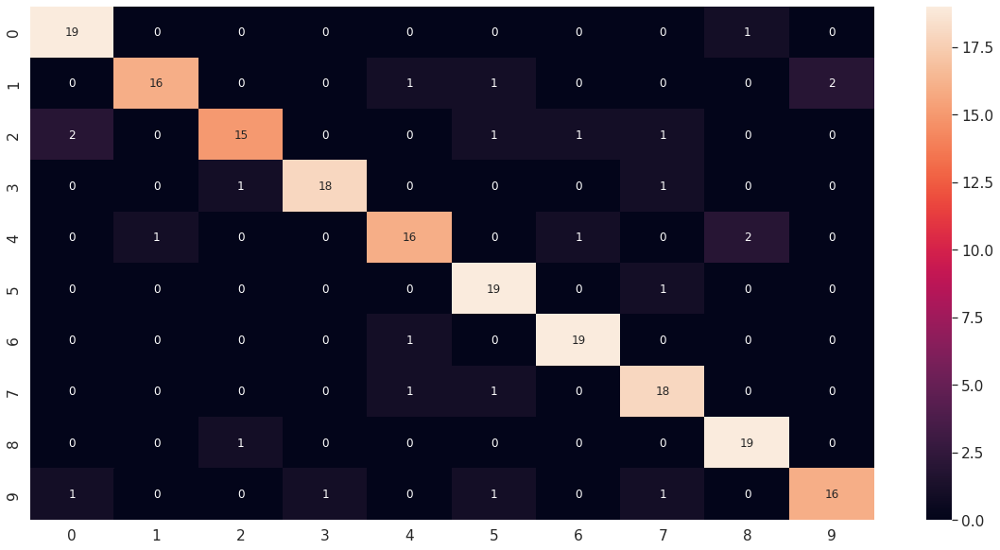

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_18_df_CM = pd.DataFrame(deepid_model_rof2_18_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_18_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_18_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_18_report)

              precision    recall  f1-score   support

           1       0.86      0.95      0.90        20
           2       0.94      0.80      0.86        20
           3       0.88      0.75      0.81        20
           4       0.95      0.90      0.92        20
           5       0.84      0.80      0.82        20
           6       0.83      0.95      0.88        20
           7       0.90      0.95      0.93        20
           8       0.82      0.90      0.86        20
           9       0.86      0.95      0.90        20
          10       0.89      0.80      0.84        20

    accuracy                           0.88       200
   macro avg       0.88      0.88      0.87       200
weighted avg       0.88      0.88      0.87       200



#### Modelo 19: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_19 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_19 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof2_19)
deepid_model_rof2_19.summary()

Model: "model_25"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_19.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_19.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_19 = deepid_model_rof2_19.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
43/43 [==============================] - 1s 13ms/step - loss: 3.5969 - accuracy: 0.3109 - val_loss: 1.6272 - val_accuracy: 0.5421
Epoch 2/100
43/43 [==============================] - 0s 9ms/step - loss: 1.1367 - accuracy: 0.6883 - val_loss: 0.8289 - val_accuracy: 0.7944
Epoch 3/100
43/43 [==============================] - 0s 9ms/step - loss: 0.5588 - accuracy: 0.8758 - val_loss: 0.6088 - val_accuracy: 0.8692
Epoch 4/100
43/43 [==============================] - 1s 13ms/step - loss: 0.3764 - accuracy: 0.9297 - val_loss: 0.4246 - val_accuracy: 0.9065
Epoch 5/100
43/43 [==============================] - 1s 12ms/step - loss: 0.2441 - accuracy: 0.9711 - val_loss: 0.3472 - val_accuracy: 0.9346
Epoch 6/100
43/43 [==============================] - 0s 10ms/step - loss: 0.2019 - accuracy: 0.9766 - val_loss: 0.3259 - val_accuracy: 0.9408
Epoch 7/100
43/43 [==============================] - 0s 10ms/step - loss: 0.1893 - accuracy: 0.9797 - val_loss: 0.2938 - val_accuracy: 0.9283
Epoch 8/

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_19 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_19.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_19.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_19.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.6459 - accuracy: 0.8350


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_19.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_19_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


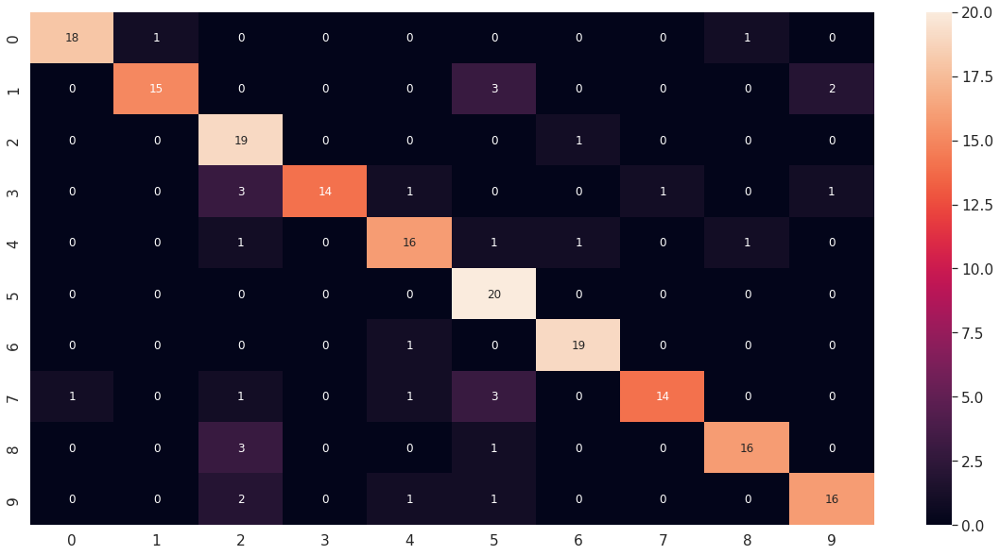

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_19_df_CM = pd.DataFrame(deepid_model_rof2_19_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_19_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_19_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_19_report)

              precision    recall  f1-score   support

           1       0.95      0.90      0.92        20
           2       0.94      0.75      0.83        20
           3       0.66      0.95      0.78        20
           4       1.00      0.70      0.82        20
           5       0.80      0.80      0.80        20
           6       0.69      1.00      0.82        20
           7       0.90      0.95      0.93        20
           8       0.93      0.70      0.80        20
           9       0.89      0.80      0.84        20
          10       0.84      0.80      0.82        20

    accuracy                           0.83       200
   macro avg       0.86      0.83      0.84       200
weighted avg       0.86      0.83      0.84       200



#### Modelo 20: (BTH = 10, EHS = 100, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_rof2_20 = layers.Dense(11, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_rof2_20 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_rof2_20)
deepid_model_rof2_20.summary()

Model: "model_26"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_rof2_20.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_20.h5', monitor="val_loss", save_best_only=True)
hist_model_rof2_20 = deepid_model_rof2_20.fit(new_trainX, new_trainY, batch_size=10, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
128/128 [==============================] - 2s 8ms/step - loss: 3.0181 - accuracy: 0.2922 - val_loss: 1.5194 - val_accuracy: 0.5670
Epoch 2/100
128/128 [==============================] - 1s 6ms/step - loss: 0.8662 - accuracy: 0.7695 - val_loss: 0.3072 - val_accuracy: 0.9502
Epoch 3/100
128/128 [==============================] - 1s 6ms/step - loss: 0.2850 - accuracy: 0.9492 - val_loss: 0.2335 - val_accuracy: 0.9595
Epoch 4/100
128/128 [==============================] - 1s 6ms/step - loss: 0.1938 - accuracy: 0.9781 - val_loss: 0.2102 - val_accuracy: 0.9720
Epoch 5/100
128/128 [==============================] - 1s 6ms/step - loss: 0.1773 - accuracy: 0.9773 - val_loss: 0.1587 - val_accuracy: 0.9782
Epoch 6/100
128/128 [==============================] - 1s 6ms/step - loss: 0.1576 - accuracy: 0.9844 - val_loss: 0.1410 - val_accuracy: 0.9875
Epoch 7/100
128/128 [==============================] - 1s 6ms/step - loss: 0.1552 - accuracy: 0.9805 - val_loss: 0.1376 - val_accuracy: 0.9844

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_rof2_20 = load_model(path + 'data_reconocimiento3/models_ROF2/deepid_model_ROF2_20.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_rof2_20.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_rof2_20.evaluate(testX, testY)

7/7 [==============================] - 0s 4ms/step - loss: 0.4316 - accuracy: 0.8750


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_rof2_20.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_rof2_20_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

7/7 [==============================] - 0s 3ms/step


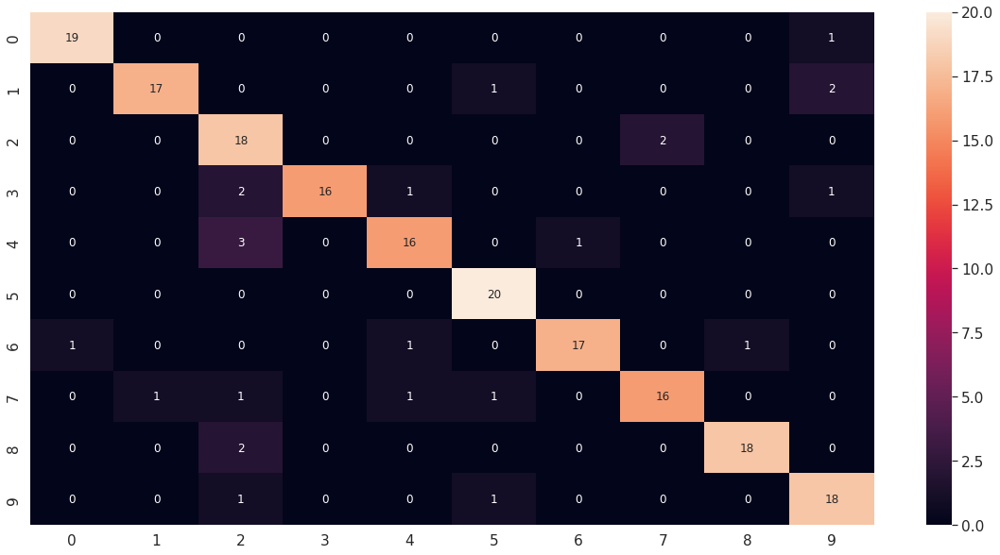

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_rof2_20_df_CM = pd.DataFrame(deepid_model_rof2_20_CM, range(10), range(10))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_rof2_20_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_rof2_20_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_rof2_20_report)

              precision    recall  f1-score   support

           1       0.95      0.95      0.95        20
           2       0.94      0.85      0.89        20
           3       0.67      0.90      0.77        20
           4       1.00      0.80      0.89        20
           5       0.84      0.80      0.82        20
           6       0.87      1.00      0.93        20
           7       0.94      0.85      0.89        20
           8       0.89      0.80      0.84        20
           9       0.95      0.90      0.92        20
          10       0.82      0.90      0.86        20

    accuracy                           0.88       200
   macro avg       0.89      0.88      0.88       200
weighted avg       0.89      0.88      0.88       200



## 7. Modelos con base de datos VGG-African para condiciones de etnia

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_1 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_1 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_1)
deepid_model_vgg1_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)  
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_1.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_1 = deepid_model_vgg1_1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
70/70 [==============================] - 12s 31ms/step - loss: 3.3000 - accuracy: 0.0632 - val_loss: 3.1184 - val_accuracy: 0.1195
Epoch 2/70
70/70 [==============================] - 0s 7ms/step - loss: 2.7505 - accuracy: 0.2131 - val_loss: 2.3811 - val_accuracy: 0.2929
Epoch 3/70
70/70 [==============================] - 0s 7ms/step - loss: 2.1055 - accuracy: 0.4012 - val_loss: 1.9043 - val_accuracy: 0.4393
Epoch 4/70
70/70 [==============================] - 0s 7ms/step - loss: 1.7461 - accuracy: 0.5101 - val_loss: 1.6033 - val_accuracy: 0.5279
Epoch 5/70
70/70 [==============================] - 0s 7ms/step - loss: 1.3477 - accuracy: 0.6365 - val_loss: 1.3446 - val_accuracy: 0.6416
Epoch 6/70
70/70 [==============================] - 0s 7ms/step - loss: 1.1084 - accuracy: 0.6871 - val_loss: 1.2311 - val_accuracy: 0.6570
Epoch 7/70
70/70 [==============================] - 0s 7ms/step - loss: 0.9248 - accuracy: 0.7449 - val_loss: 1.1331 - val_accuracy: 0.7013
Epoch 8/70
70/70 [

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_1 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_1.evaluate(testX, testY)

32/32 [==============================] - 0s 5ms/step - loss: 0.8958 - accuracy: 0.7820


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


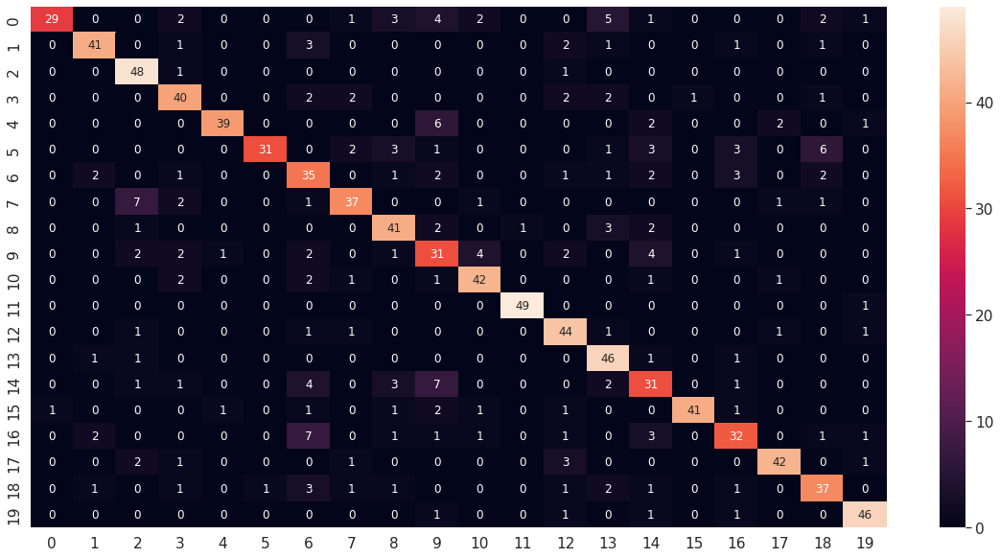

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_1_df_CM = pd.DataFrame(deepid_model_vgg1_1_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_1_report)

              precision    recall  f1-score   support

           1       0.97      0.58      0.72        50
           2       0.87      0.82      0.85        50
           3       0.76      0.96      0.85        50
           4       0.74      0.80      0.77        50
           5       0.95      0.78      0.86        50
           6       0.97      0.62      0.76        50
           7       0.57      0.70      0.63        50
           8       0.80      0.74      0.77        50
           9       0.75      0.82      0.78        50
          10       0.53      0.62      0.57        50
          11       0.82      0.84      0.83        50
          12       0.98      0.98      0.98        50
          13       0.75      0.88      0.81        50
          14       0.72      0.92      0.81        50
          15       0.60      0.62      0.61        50
          16       0.98      0.82      0.89        50
          17       0.71      0.64      0.67        50
          18       0.89    

#### Modelo 2: (BTH = 30, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_2 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_2 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_2)
deepid_model_vgg1_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_2.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_2 = deepid_model_vgg1_2.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
70/70 [==============================] - 3s 33ms/step - loss: 5.4015 - accuracy: 0.1432 - val_loss: 2.5932 - val_accuracy: 0.2871
Epoch 2/150
70/70 [==============================] - 1s 8ms/step - loss: 1.9975 - accuracy: 0.4904 - val_loss: 1.5935 - val_accuracy: 0.6050
Epoch 3/150
70/70 [==============================] - 1s 7ms/step - loss: 1.1227 - accuracy: 0.7097 - val_loss: 1.3522 - val_accuracy: 0.6570
Epoch 4/150
70/70 [==============================] - 0s 7ms/step - loss: 0.6698 - accuracy: 0.8491 - val_loss: 1.2663 - val_accuracy: 0.7091
Epoch 5/150
70/70 [==============================] - 0s 7ms/step - loss: 0.4163 - accuracy: 0.9272 - val_loss: 1.1105 - val_accuracy: 0.7495
Epoch 6/150
70/70 [==============================] - 0s 6ms/step - loss: 0.2716 - accuracy: 0.9701 - val_loss: 1.1368 - val_accuracy: 0.7688
Epoch 7/150
70/70 [==============================] - 0s 6ms/step - loss: 0.2088 - accuracy: 0.9879 - val_loss: 1.1900 - val_accuracy: 0.7707
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_2 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_2.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8177 - accuracy: 0.8470


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


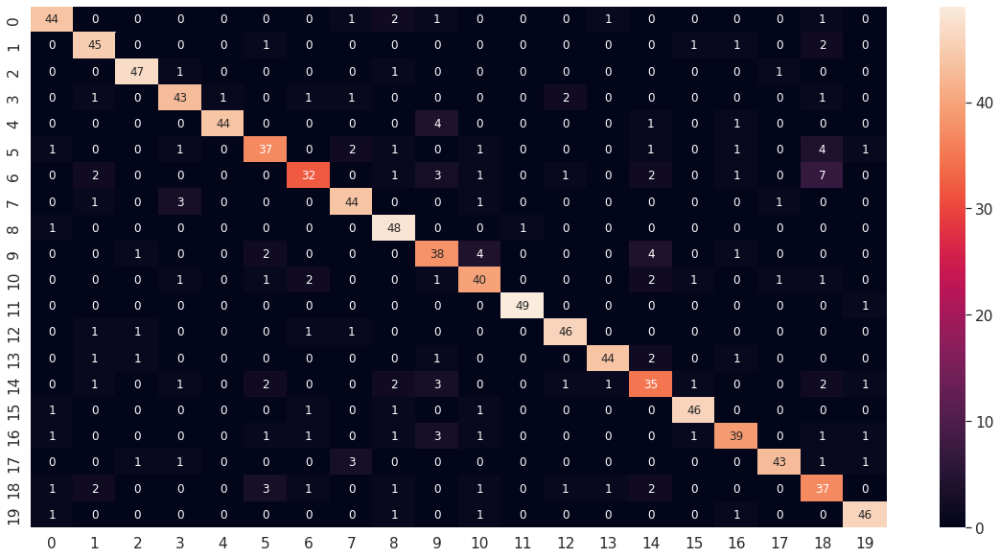

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_2_df_CM = pd.DataFrame(deepid_model_vgg1_2_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_2_report)

              precision    recall  f1-score   support

           1       0.88      0.88      0.88        50
           2       0.83      0.90      0.87        50
           3       0.92      0.94      0.93        50
           4       0.84      0.86      0.85        50
           5       0.98      0.88      0.93        50
           6       0.79      0.74      0.76        50
           7       0.82      0.64      0.72        50
           8       0.85      0.88      0.86        50
           9       0.81      0.96      0.88        50
          10       0.70      0.76      0.73        50
          11       0.78      0.80      0.79        50
          12       0.98      0.98      0.98        50
          13       0.90      0.92      0.91        50
          14       0.94      0.88      0.91        50
          15       0.71      0.70      0.71        50
          16       0.92      0.92      0.92        50
          17       0.85      0.78      0.81        50
          18       0.93    

#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_3 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_3 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_3)
deepid_model_vgg1_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_3.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_3 = deepid_model_vgg1_3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
52/52 [==============================] - 3s 35ms/step - loss: 7.1667 - accuracy: 0.1393 - val_loss: 3.0475 - val_accuracy: 0.1580
Epoch 2/100
52/52 [==============================] - 0s 7ms/step - loss: 2.6332 - accuracy: 0.2883 - val_loss: 2.4781 - val_accuracy: 0.3237
Epoch 3/100
52/52 [==============================] - 0s 7ms/step - loss: 1.8947 - accuracy: 0.4764 - val_loss: 1.8649 - val_accuracy: 0.5164
Epoch 4/100
52/52 [==============================] - 0s 7ms/step - loss: 1.2672 - accuracy: 0.6731 - val_loss: 1.3752 - val_accuracy: 0.6435
Epoch 5/100
52/52 [==============================] - 0s 7ms/step - loss: 0.8192 - accuracy: 0.7917 - val_loss: 1.1036 - val_accuracy: 0.7187
Epoch 6/100
52/52 [==============================] - 0s 7ms/step - loss: 0.5257 - accuracy: 0.8891 - val_loss: 0.9835 - val_accuracy: 0.7649
Epoch 7/100
52/52 [==============================] - 0s 7ms/step - loss: 0.3843 - accuracy: 0.9282 - val_loss: 0.8974 - val_accuracy: 0.7996
Epoch 8/100


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_3 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_3.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8605 - accuracy: 0.8450


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


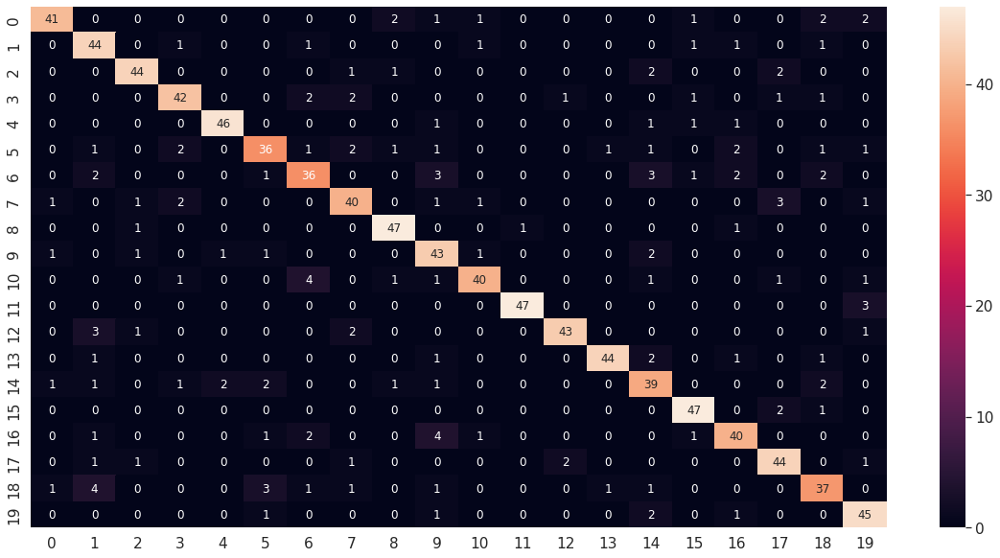

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_3_df_CM = pd.DataFrame(deepid_model_vgg1_3_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_3_report)

              precision    recall  f1-score   support

           1       0.91      0.82      0.86        50
           2       0.76      0.88      0.81        50
           3       0.90      0.88      0.89        50
           4       0.86      0.84      0.85        50
           5       0.94      0.92      0.93        50
           6       0.80      0.72      0.76        50
           7       0.77      0.72      0.74        50
           8       0.82      0.80      0.81        50
           9       0.89      0.94      0.91        50
          10       0.73      0.86      0.79        50
          11       0.89      0.80      0.84        50
          12       0.98      0.94      0.96        50
          13       0.93      0.86      0.90        50
          14       0.96      0.88      0.92        50
          15       0.72      0.78      0.75        50
          16       0.89      0.94      0.91        50
          17       0.82      0.80      0.81        50
          18       0.83    

#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_4 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_4 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_4)
deepid_model_vgg1_4.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_4.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_4 = deepid_model_vgg1_4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
104/104 [==============================] - 3s 20ms/step - loss: 6.7749 - accuracy: 0.1673 - val_loss: 2.5779 - val_accuracy: 0.2909
Epoch 2/100
104/104 [==============================] - 1s 5ms/step - loss: 1.8739 - accuracy: 0.4971 - val_loss: 1.5259 - val_accuracy: 0.6127
Epoch 3/100
104/104 [==============================] - 1s 5ms/step - loss: 0.9742 - accuracy: 0.7589 - val_loss: 1.0817 - val_accuracy: 0.7322
Epoch 4/100
104/104 [==============================] - 1s 5ms/step - loss: 0.5586 - accuracy: 0.8761 - val_loss: 0.8844 - val_accuracy: 0.7765
Epoch 5/100
104/104 [==============================] - 1s 5ms/step - loss: 0.3293 - accuracy: 0.9436 - val_loss: 0.8000 - val_accuracy: 0.8131
Epoch 6/100
104/104 [==============================] - 1s 5ms/step - loss: 0.2218 - accuracy: 0.9773 - val_loss: 0.7511 - val_accuracy: 0.8343
Epoch 7/100
104/104 [==============================] - 1s 5ms/step - loss: 0.1639 - accuracy: 0.9942 - val_loss: 0.7164 - val_accuracy: 0.840

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_4 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_4.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7286 - accuracy: 0.8650


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


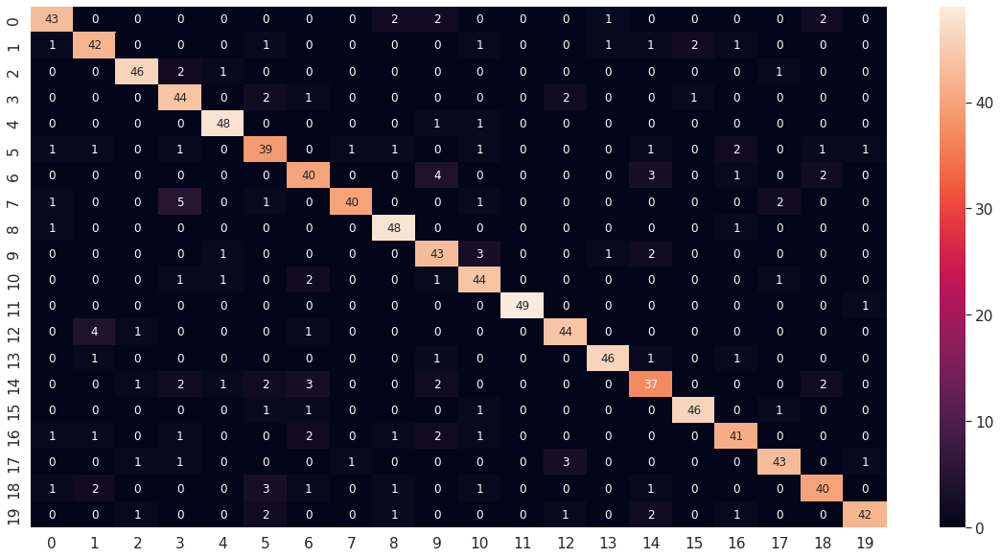

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_4_df_CM = pd.DataFrame(deepid_model_vgg1_4_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_4_report)

              precision    recall  f1-score   support

           1       0.88      0.86      0.87        50
           2       0.82      0.84      0.83        50
           3       0.92      0.92      0.92        50
           4       0.77      0.88      0.82        50
           5       0.92      0.96      0.94        50
           6       0.76      0.78      0.77        50
           7       0.78      0.80      0.79        50
           8       0.95      0.80      0.87        50
           9       0.89      0.96      0.92        50
          10       0.77      0.86      0.81        50
          11       0.81      0.88      0.85        50
          12       1.00      0.98      0.99        50
          13       0.88      0.88      0.88        50
          14       0.94      0.92      0.93        50
          15       0.77      0.74      0.76        50
          16       0.94      0.92      0.93        50
          17       0.85      0.82      0.84        50
          18       0.90    

#### Modelo 5: (BTH = 30, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_5 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_5 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_5)
deepid_model_vgg1_5.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_5.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_5 = deepid_model_vgg1_5.fit(new_trainX, new_trainY, batch_size=30, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
70/70 [==============================] - 2s 27ms/step - loss: 6.2591 - accuracy: 0.1982 - val_loss: 2.5405 - val_accuracy: 0.3121
Epoch 2/200
70/70 [==============================] - 0s 7ms/step - loss: 1.8879 - accuracy: 0.4986 - val_loss: 1.5637 - val_accuracy: 0.6069
Epoch 3/200
70/70 [==============================] - 0s 6ms/step - loss: 1.0208 - accuracy: 0.7382 - val_loss: 0.8935 - val_accuracy: 0.7881
Epoch 4/200
70/70 [==============================] - 0s 7ms/step - loss: 0.5123 - accuracy: 0.8814 - val_loss: 0.6842 - val_accuracy: 0.8382
Epoch 5/200
70/70 [==============================] - 1s 9ms/step - loss: 0.2856 - accuracy: 0.9527 - val_loss: 0.5687 - val_accuracy: 0.8786
Epoch 6/200
70/70 [==============================] - 1s 8ms/step - loss: 0.1858 - accuracy: 0.9860 - val_loss: 0.5518 - val_accuracy: 0.8863
Epoch 7/200
70/70 [==============================] - 1s 10ms/step - loss: 0.1353 - accuracy: 0.9976 - val_loss: 0.5336 - val_accuracy: 0.8844
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_5 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_5.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6883 - accuracy: 0.8740


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


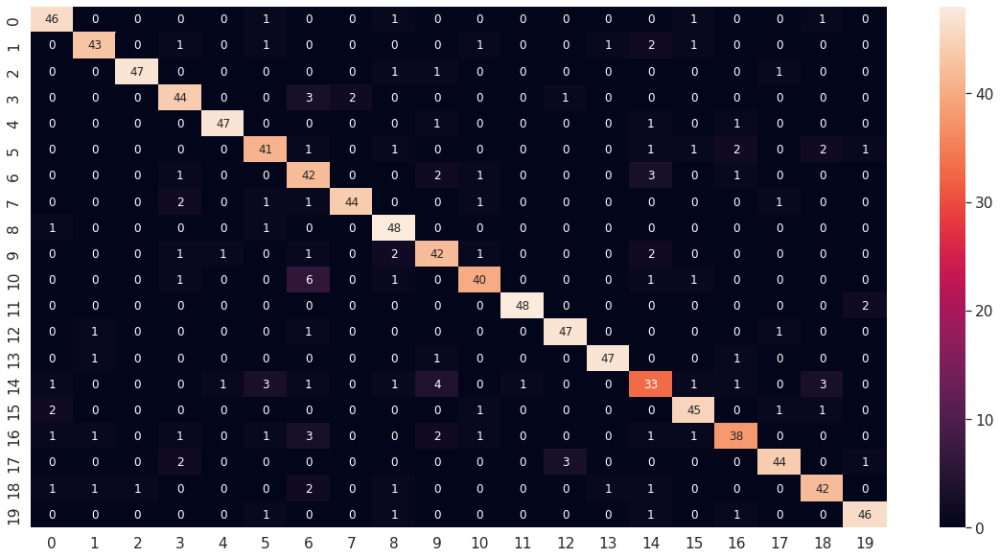

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_5_df_CM = pd.DataFrame(deepid_model_vgg1_5_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_5_report)

              precision    recall  f1-score   support

           1       0.88      0.92      0.90        50
           2       0.91      0.86      0.89        50
           3       0.98      0.94      0.96        50
           4       0.83      0.88      0.85        50
           5       0.96      0.94      0.95        50
           6       0.82      0.82      0.82        50
           7       0.69      0.84      0.76        50
           8       0.96      0.88      0.92        50
           9       0.84      0.96      0.90        50
          10       0.79      0.84      0.82        50
          11       0.87      0.80      0.83        50
          12       0.98      0.96      0.97        50
          13       0.92      0.94      0.93        50
          14       0.96      0.94      0.95        50
          15       0.72      0.66      0.69        50
          16       0.88      0.90      0.89        50
          17       0.84      0.76      0.80        50
          18       0.92    

#### Modelo 6: (BTH = 50, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_6 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_6 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_6)
deepid_model_vgg1_6.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_6.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_6.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_6 = deepid_model_vgg1_6.fit(new_trainX, new_trainY, batch_size=50, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
42/42 [==============================] - 3s 43ms/step - loss: 8.8633 - accuracy: 0.1292 - val_loss: 3.1555 - val_accuracy: 0.1118
Epoch 2/100
42/42 [==============================] - 0s 9ms/step - loss: 2.8758 - accuracy: 0.2068 - val_loss: 2.6737 - val_accuracy: 0.3044
Epoch 3/100
42/42 [==============================] - 0s 9ms/step - loss: 2.2500 - accuracy: 0.4045 - val_loss: 2.1490 - val_accuracy: 0.4355
Epoch 4/100
42/42 [==============================] - 0s 9ms/step - loss: 1.6628 - accuracy: 0.5574 - val_loss: 1.7217 - val_accuracy: 0.5318
Epoch 5/100
42/42 [==============================] - 0s 9ms/step - loss: 1.1845 - accuracy: 0.6803 - val_loss: 1.3106 - val_accuracy: 0.6513
Epoch 6/100
42/42 [==============================] - 0s 9ms/step - loss: 0.8103 - accuracy: 0.7951 - val_loss: 0.9961 - val_accuracy: 0.7726
Epoch 7/100
42/42 [==============================] - 0s 10ms/step - loss: 0.5306 - accuracy: 0.8732 - val_loss: 0.8499 - val_accuracy: 0.8150
Epoch 8/100

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_6 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_6.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.0757 - accuracy: 0.8330


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


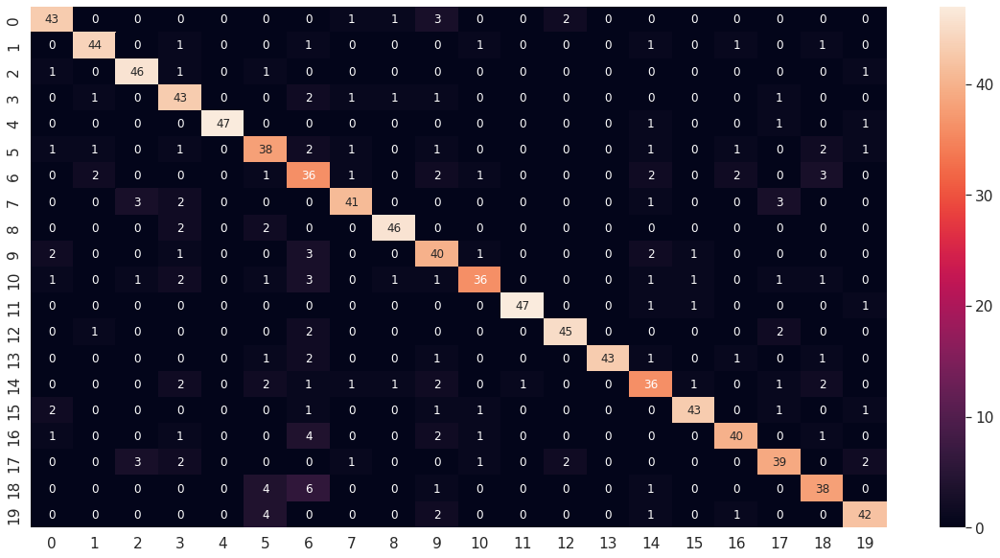

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_6_df_CM = pd.DataFrame(deepid_model_vgg1_6_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_6_report)

              precision    recall  f1-score   support

           1       0.84      0.86      0.85        50
           2       0.90      0.88      0.89        50
           3       0.87      0.92      0.89        50
           4       0.74      0.86      0.80        50
           5       1.00      0.94      0.97        50
           6       0.70      0.76      0.73        50
           7       0.57      0.72      0.64        50
           8       0.87      0.82      0.85        50
           9       0.92      0.92      0.92        50
          10       0.70      0.80      0.75        50
          11       0.86      0.72      0.78        50
          12       0.98      0.94      0.96        50
          13       0.92      0.90      0.91        50
          14       1.00      0.86      0.92        50
          15       0.73      0.72      0.73        50
          16       0.91      0.86      0.89        50
          17       0.87      0.80      0.83        50
          18       0.80    

#### Modelo 7: (BTH = 20, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_7 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_7 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_7)
deepid_model_vgg1_7.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.0001)
deepid_model_vgg1_7.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_7.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_7 = deepid_model_vgg1_7.fit(new_trainX, new_trainY, batch_size=20, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
104/104 [==============================] - 3s 23ms/step - loss: 26.5584 - accuracy: 0.0338 - val_loss: 14.6174 - val_accuracy: 0.0405
Epoch 2/150
104/104 [==============================] - 1s 8ms/step - loss: 10.1781 - accuracy: 0.0781 - val_loss: 6.4535 - val_accuracy: 0.1118
Epoch 3/150
104/104 [==============================] - 1s 9ms/step - loss: 5.2357 - accuracy: 0.1167 - val_loss: 4.0107 - val_accuracy: 0.1484
Epoch 4/150
104/104 [==============================] - 1s 9ms/step - loss: 3.6602 - accuracy: 0.1379 - val_loss: 3.2749 - val_accuracy: 0.1696
Epoch 5/150
104/104 [==============================] - 1s 10ms/step - loss: 3.1409 - accuracy: 0.1707 - val_loss: 3.0375 - val_accuracy: 0.1792
Epoch 6/150
104/104 [==============================] - 1s 8ms/step - loss: 2.9067 - accuracy: 0.1967 - val_loss: 2.9154 - val_accuracy: 0.1927
Epoch 7/150
104/104 [==============================] - 1s 8ms/step - loss: 2.7701 - accuracy: 0.2184 - val_loss: 2.8236 - val_accuracy: 0

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_7 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_7.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 0.8116 - accuracy: 0.8660


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


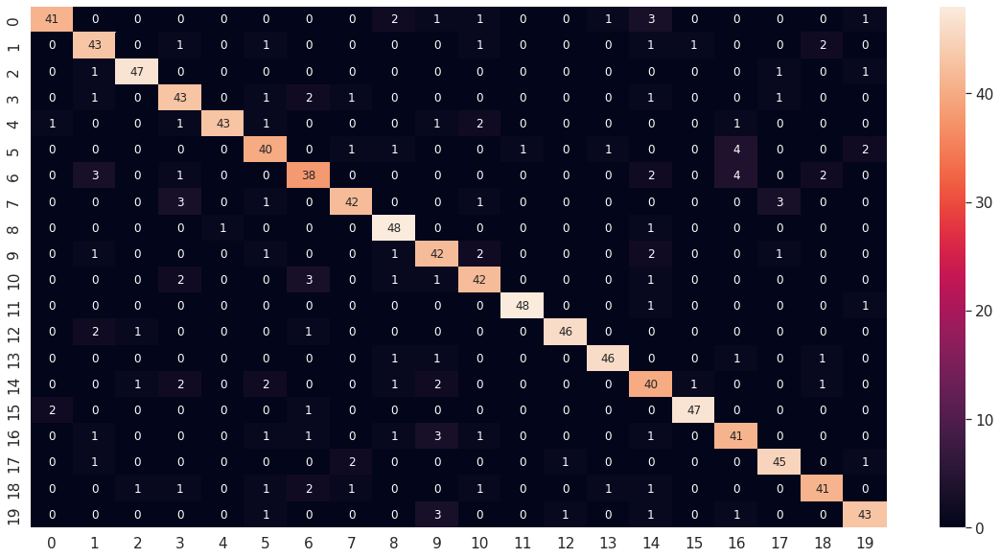

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_7_df_CM = pd.DataFrame(deepid_model_vgg1_7_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_7_report)

              precision    recall  f1-score   support

           1       0.93      0.82      0.87        50
           2       0.81      0.86      0.83        50
           3       0.94      0.94      0.94        50
           4       0.80      0.86      0.83        50
           5       0.98      0.86      0.91        50
           6       0.80      0.80      0.80        50
           7       0.79      0.76      0.78        50
           8       0.89      0.84      0.87        50
           9       0.86      0.96      0.91        50
          10       0.78      0.84      0.81        50
          11       0.82      0.84      0.83        50
          12       0.98      0.96      0.97        50
          13       0.96      0.92      0.94        50
          14       0.94      0.92      0.93        50
          15       0.73      0.80      0.76        50
          16       0.96      0.94      0.95        50
          17       0.79      0.82      0.80        50
          18       0.88    

#### Modelo 8: (BTH = 40, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_8 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_8 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_8)
deepid_model_vgg1_8.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_8.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_8.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_8 = deepid_model_vgg1_8.fit(new_trainX, new_trainY, batch_size=10, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
208/208 [==============================] - 2s 6ms/step - loss: 8.9297 - accuracy: 0.1003 - val_loss: 2.9318 - val_accuracy: 0.1445
Epoch 2/150
208/208 [==============================] - 1s 5ms/step - loss: 2.8922 - accuracy: 0.1615 - val_loss: 2.6985 - val_accuracy: 0.2042
Epoch 3/150
208/208 [==============================] - 1s 6ms/step - loss: 2.3317 - accuracy: 0.3684 - val_loss: 2.2396 - val_accuracy: 0.3834
Epoch 4/150
208/208 [==============================] - 1s 7ms/step - loss: 1.7544 - accuracy: 0.5145 - val_loss: 1.6282 - val_accuracy: 0.5800
Epoch 5/150
208/208 [==============================] - 1s 6ms/step - loss: 1.1414 - accuracy: 0.7035 - val_loss: 1.0645 - val_accuracy: 0.7572
Epoch 6/150
208/208 [==============================] - 1s 5ms/step - loss: 0.6018 - accuracy: 0.8505 - val_loss: 0.8259 - val_accuracy: 0.8092
Epoch 7/150
208/208 [==============================] - 1s 5ms/step - loss: 0.3271 - accuracy: 0.9306 - val_loss: 0.5621 - val_accuracy: 0.8690

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_8 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_8.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7179 - accuracy: 0.8640


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


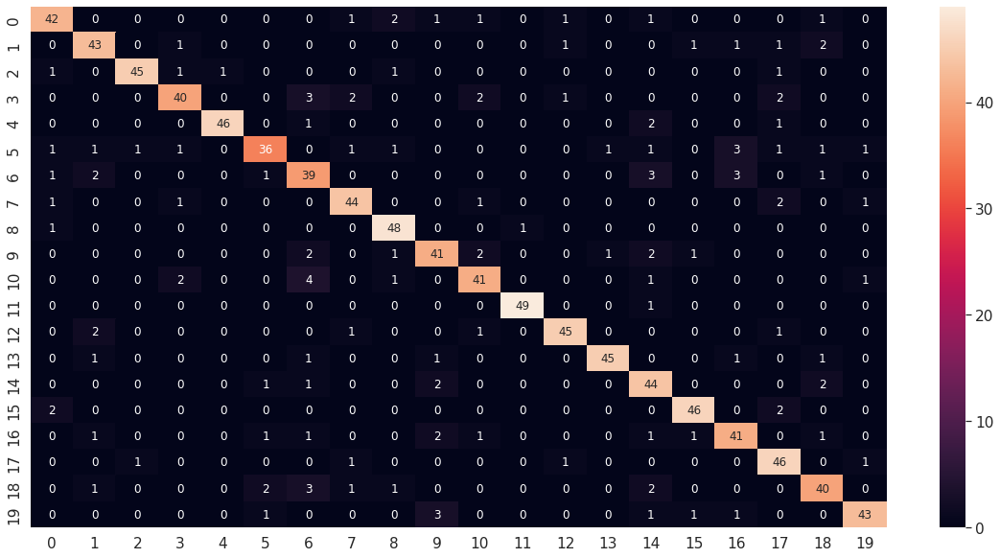

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_8_df_CM = pd.DataFrame(deepid_model_vgg1_8_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_8_report)

              precision    recall  f1-score   support

           1       0.86      0.84      0.85        50
           2       0.84      0.86      0.85        50
           3       0.96      0.90      0.93        50
           4       0.87      0.80      0.83        50
           5       0.98      0.92      0.95        50
           6       0.86      0.72      0.78        50
           7       0.71      0.78      0.74        50
           8       0.86      0.88      0.87        50
           9       0.87      0.96      0.91        50
          10       0.82      0.82      0.82        50
          11       0.84      0.82      0.83        50
          12       0.98      0.98      0.98        50
          13       0.92      0.90      0.91        50
          14       0.96      0.90      0.93        50
          15       0.75      0.88      0.81        50
          16       0.92      0.92      0.92        50
          17       0.82      0.82      0.82        50
          18       0.81    

#### Modelo 9: (BTH = 30, EHS = 300, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_9 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_9 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg1_9)
deepid_model_vgg1_9.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.01)
deepid_model_vgg1_9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_9.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_9 = deepid_model_vgg1_9.fit(new_trainX, new_trainY, batch_size=30, epochs=300, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/300
70/70 [==============================] - 11s 23ms/step - loss: 3.4599 - accuracy: 0.0550 - val_loss: 3.0935 - val_accuracy: 0.0385
Epoch 2/300
70/70 [==============================] - 1s 7ms/step - loss: 3.0222 - accuracy: 0.0820 - val_loss: 2.9082 - val_accuracy: 0.1118
Epoch 3/300
70/70 [==============================] - 1s 7ms/step - loss: 2.7608 - accuracy: 0.1678 - val_loss: 2.6186 - val_accuracy: 0.2042
Epoch 4/300
70/70 [==============================] - 1s 7ms/step - loss: 2.4490 - accuracy: 0.2584 - val_loss: 2.4520 - val_accuracy: 0.2563
Epoch 5/300
70/70 [==============================] - 1s 8ms/step - loss: 2.1513 - accuracy: 0.3713 - val_loss: 2.0245 - val_accuracy: 0.3988
Epoch 6/300
70/70 [==============================] - 0s 7ms/step - loss: 1.9104 - accuracy: 0.4373 - val_loss: 2.0720 - val_accuracy: 0.3988
Epoch 7/300
70/70 [==============================] - 1s 8ms/step - loss: 1.7062 - accuracy: 0.4846 - val_loss: 1.8841 - val_accuracy: 0.4528
Epoch 8/300

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_9 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_9.evaluate(testX, testY)

32/32 [==============================] - 0s 6ms/step - loss: 1.5902 - accuracy: 0.5900


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


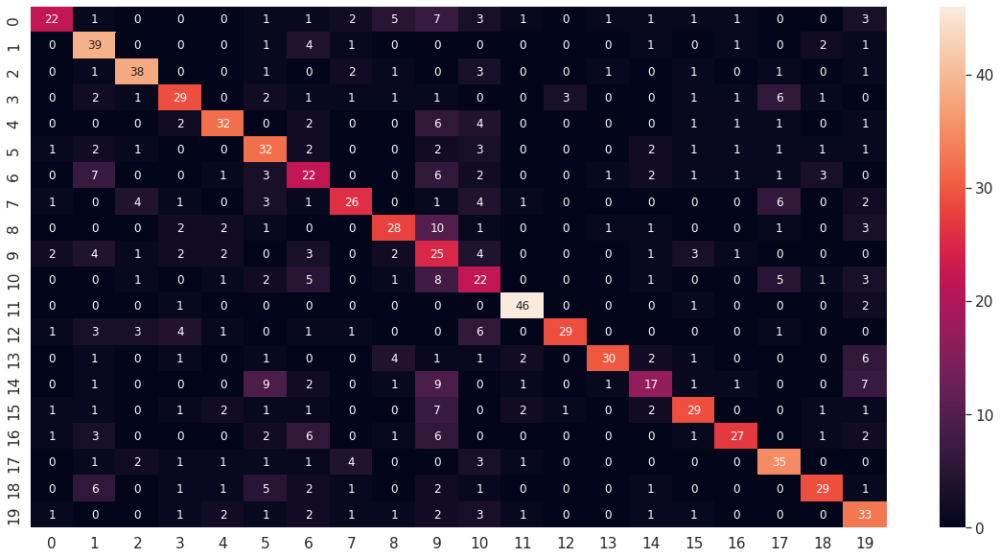

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_9_df_CM = pd.DataFrame(deepid_model_vgg1_9_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_9_report)

              precision    recall  f1-score   support

           1       0.73      0.44      0.55        50
           2       0.54      0.78      0.64        50
           3       0.75      0.76      0.75        50
           4       0.63      0.58      0.60        50
           5       0.71      0.64      0.67        50
           6       0.48      0.64      0.55        50
           7       0.39      0.44      0.42        50
           8       0.67      0.52      0.58        50
           9       0.62      0.56      0.59        50
          10       0.27      0.50      0.35        50
          11       0.37      0.44      0.40        50
          12       0.84      0.92      0.88        50
          13       0.88      0.58      0.70        50
          14       0.86      0.60      0.71        50
          15       0.53      0.34      0.41        50
          16       0.67      0.58      0.62        50
          17       0.77      0.54      0.64        50
          18       0.60    

#### Modelo 10: (BTH = 20, EHS =150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_10 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_10 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_vgg1_10)
deepid_model_vgg1_10.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_10.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_10 = deepid_model_vgg1_10.fit(new_trainX, new_trainY, batch_size=20, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
104/104 [==============================] - 3s 16ms/step - loss: 3.3515 - accuracy: 0.0463 - val_loss: 3.2429 - val_accuracy: 0.0597
Epoch 2/150
104/104 [==============================] - 1s 7ms/step - loss: 3.1529 - accuracy: 0.0559 - val_loss: 3.1328 - val_accuracy: 0.0751
Epoch 3/150
104/104 [==============================] - 1s 8ms/step - loss: 2.9885 - accuracy: 0.1056 - val_loss: 2.9079 - val_accuracy: 0.1137
Epoch 4/150
104/104 [==============================] - 1s 7ms/step - loss: 2.6406 - accuracy: 0.2184 - val_loss: 2.6614 - val_accuracy: 0.2177
Epoch 5/150
104/104 [==============================] - 1s 7ms/step - loss: 2.3668 - accuracy: 0.2985 - val_loss: 2.4776 - val_accuracy: 0.2659
Epoch 6/150
104/104 [==============================] - 1s 7ms/step - loss: 2.1005 - accuracy: 0.3785 - val_loss: 2.1347 - val_accuracy: 0.4547
Epoch 7/150
104/104 [==============================] - 1s 6ms/step - loss: 1.9289 - accuracy: 0.4243 - val_loss: 2.2740 - val_accuracy: 0.292

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_10 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_10.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7218 - accuracy: 0.8140


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


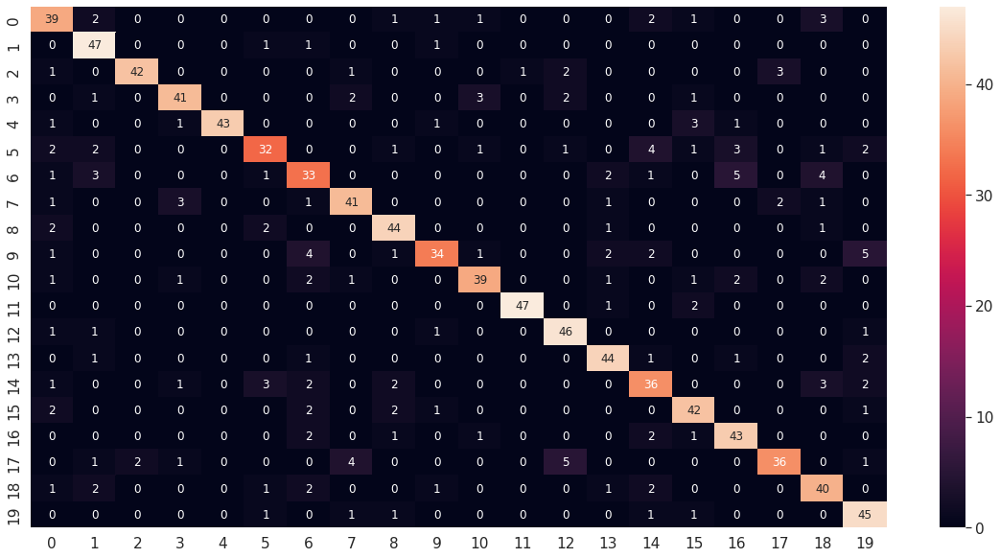

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_10_df_CM = pd.DataFrame(deepid_model_vgg1_10_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_10_report)

              precision    recall  f1-score   support

           1       0.72      0.78      0.75        50
           2       0.78      0.94      0.85        50
           3       0.95      0.84      0.89        50
           4       0.85      0.82      0.84        50
           5       1.00      0.86      0.92        50
           6       0.78      0.64      0.70        50
           7       0.66      0.66      0.66        50
           8       0.82      0.82      0.82        50
           9       0.83      0.88      0.85        50
          10       0.85      0.68      0.76        50
          11       0.85      0.78      0.81        50
          12       0.98      0.94      0.96        50
          13       0.82      0.92      0.87        50
          14       0.83      0.88      0.85        50
          15       0.71      0.72      0.71        50
          16       0.79      0.84      0.82        50
          17       0.78      0.86      0.82        50
          18       0.88    

#### Modelo 11: (BTH = 40, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_11 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_11 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_vgg1_11)
deepid_model_vgg1_11.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_11.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_11 = deepid_model_vgg1_11.fit(new_trainX, new_trainY, batch_size=40, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
52/52 [==============================] - 3s 20ms/step - loss: 5.4982 - accuracy: 0.0781 - val_loss: 3.2909 - val_accuracy: 0.1040
Epoch 2/150
52/52 [==============================] - 1s 10ms/step - loss: 3.2594 - accuracy: 0.1114 - val_loss: 3.0226 - val_accuracy: 0.1946
Epoch 3/150
52/52 [==============================] - 1s 11ms/step - loss: 2.7809 - accuracy: 0.2420 - val_loss: 2.3584 - val_accuracy: 0.3796
Epoch 4/150
52/52 [==============================] - 1s 11ms/step - loss: 2.0561 - accuracy: 0.4436 - val_loss: 1.4631 - val_accuracy: 0.6378
Epoch 5/150
52/52 [==============================] - 1s 10ms/step - loss: 1.3259 - accuracy: 0.6538 - val_loss: 0.9528 - val_accuracy: 0.7726
Epoch 6/150
52/52 [==============================] - 1s 10ms/step - loss: 1.0001 - accuracy: 0.7483 - val_loss: 0.7810 - val_accuracy: 0.8227
Epoch 7/150
52/52 [==============================] - 1s 10ms/step - loss: 0.8143 - accuracy: 0.8071 - val_loss: 0.6460 - val_accuracy: 0.8709
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_11 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_11.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.5872 - accuracy: 0.8600


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


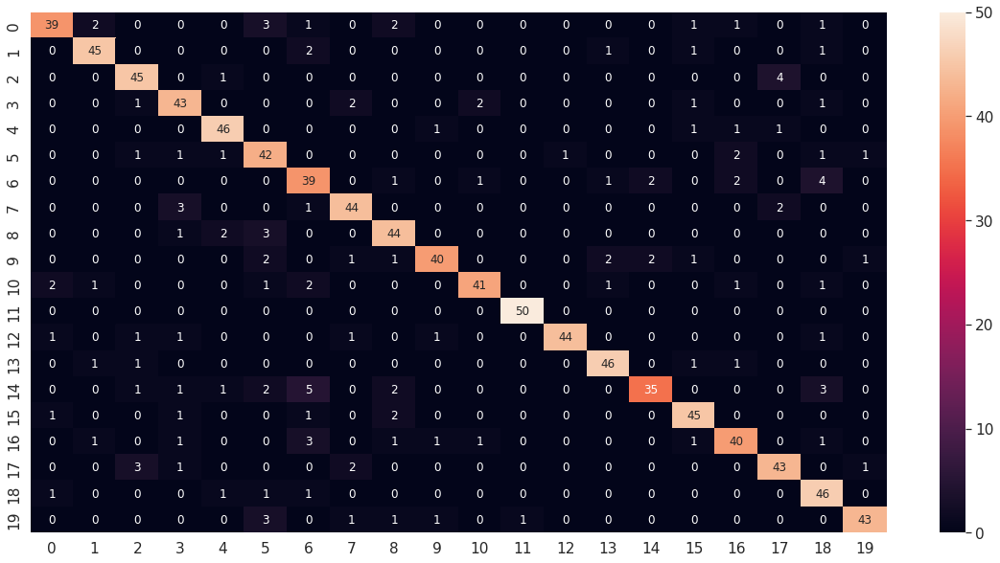

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_11_df_CM = pd.DataFrame(deepid_model_vgg1_11_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_11_report)

              precision    recall  f1-score   support

           1       0.89      0.78      0.83        50
           2       0.90      0.90      0.90        50
           3       0.85      0.90      0.87        50
           4       0.81      0.86      0.83        50
           5       0.88      0.92      0.90        50
           6       0.74      0.84      0.79        50
           7       0.71      0.78      0.74        50
           8       0.86      0.88      0.87        50
           9       0.81      0.88      0.85        50
          10       0.91      0.80      0.85        50
          11       0.91      0.82      0.86        50
          12       0.98      1.00      0.99        50
          13       0.98      0.88      0.93        50
          14       0.90      0.92      0.91        50
          15       0.90      0.70      0.79        50
          16       0.87      0.90      0.88        50
          17       0.83      0.80      0.82        50
          18       0.86    

#### Modelo 12: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_12 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_12 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_vgg1_12)
deepid_model_vgg1_12.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_vgg1_12.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_12.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_12 = deepid_model_vgg1_12.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
70/70 [==============================] - 2s 13ms/step - loss: 7.8280 - accuracy: 0.0641 - val_loss: 3.4697 - val_accuracy: 0.1021
Epoch 2/150
70/70 [==============================] - 1s 11ms/step - loss: 3.9085 - accuracy: 0.0820 - val_loss: 3.2943 - val_accuracy: 0.1040
Epoch 3/150
70/70 [==============================] - 1s 10ms/step - loss: 3.4914 - accuracy: 0.0955 - val_loss: 3.2056 - val_accuracy: 0.1040
Epoch 4/150
70/70 [==============================] - 1s 9ms/step - loss: 3.4003 - accuracy: 0.0950 - val_loss: 3.1895 - val_accuracy: 0.0906
Epoch 5/150
70/70 [==============================] - 1s 9ms/step - loss: 3.2916 - accuracy: 0.1143 - val_loss: 3.2273 - val_accuracy: 0.0867
Epoch 6/150
70/70 [==============================] - 1s 11ms/step - loss: 3.2130 - accuracy: 0.1201 - val_loss: 3.1344 - val_accuracy: 0.1137
Epoch 7/150
70/70 [==============================] - 1s 10ms/step - loss: 3.1374 - accuracy: 0.1355 - val_loss: 3.0963 - val_accuracy: 0.1272
Epoch 8/

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_12 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_12.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6206 - accuracy: 0.8610


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


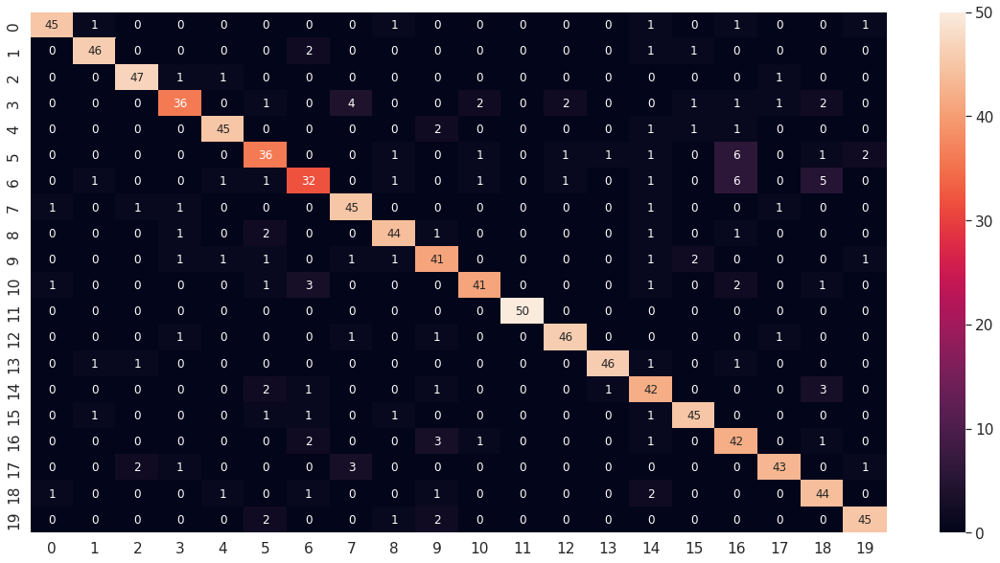

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_12_df_CM = pd.DataFrame(deepid_model_vgg1_12_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_12_report)

              precision    recall  f1-score   support

           1       0.94      0.90      0.92        50
           2       0.92      0.92      0.92        50
           3       0.92      0.94      0.93        50
           4       0.86      0.72      0.78        50
           5       0.92      0.90      0.91        50
           6       0.77      0.72      0.74        50
           7       0.76      0.64      0.70        50
           8       0.83      0.90      0.87        50
           9       0.88      0.88      0.88        50
          10       0.79      0.82      0.80        50
          11       0.89      0.82      0.85        50
          12       1.00      1.00      1.00        50
          13       0.92      0.92      0.92        50
          14       0.96      0.92      0.94        50
          15       0.75      0.84      0.79        50
          16       0.90      0.90      0.90        50
          17       0.69      0.84      0.76        50
          18       0.91    

#### Modelo 13: (BTH = 20, EHS = 150, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adamax[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_13 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_13 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_vgg1_13)
deepid_model_vgg1_13.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_vgg1_13.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_13.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_13 = deepid_model_vgg1_13.fit(new_trainX, new_trainY, batch_size=20, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
104/104 [==============================] - 2s 11ms/step - loss: 3.3421 - accuracy: 0.0569 - val_loss: 3.2557 - val_accuracy: 0.0713
Epoch 2/150
104/104 [==============================] - 1s 9ms/step - loss: 3.1548 - accuracy: 0.0902 - val_loss: 3.0910 - val_accuracy: 0.1137
Epoch 3/150
104/104 [==============================] - 1s 10ms/step - loss: 2.9021 - accuracy: 0.1702 - val_loss: 2.7782 - val_accuracy: 0.2620
Epoch 4/150
104/104 [==============================] - 1s 9ms/step - loss: 2.6312 - accuracy: 0.2729 - val_loss: 2.5466 - val_accuracy: 0.3083
Epoch 5/150
104/104 [==============================] - 1s 8ms/step - loss: 2.3657 - accuracy: 0.3472 - val_loss: 2.3023 - val_accuracy: 0.3815
Epoch 6/150
104/104 [==============================] - 1s 9ms/step - loss: 2.1777 - accuracy: 0.3751 - val_loss: 2.1808 - val_accuracy: 0.4181
Epoch 7/150
104/104 [==============================] - 1s 9ms/step - loss: 2.0419 - accuracy: 0.4286 - val_loss: 2.0367 - val_accuracy: 0.47

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_13 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_13.evaluate(testX, testY)

32/32 [==============================] - 0s 5ms/step - loss: 0.8409 - accuracy: 0.7920


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


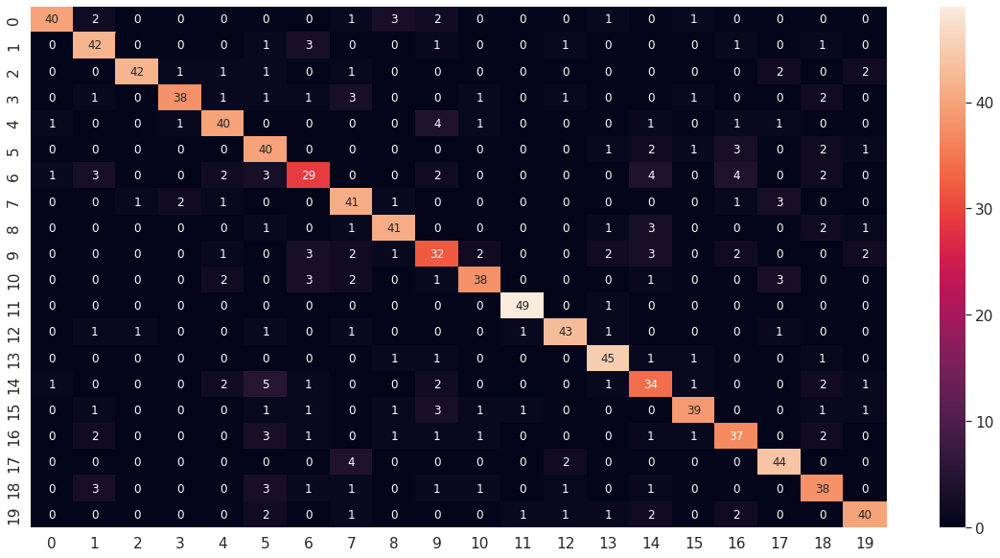

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_13_df_CM = pd.DataFrame(deepid_model_vgg1_13_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_13_report)

              precision    recall  f1-score   support

           1       0.93      0.80      0.86        50
           2       0.76      0.84      0.80        50
           3       0.95      0.84      0.89        50
           4       0.90      0.76      0.83        50
           5       0.80      0.80      0.80        50
           6       0.65      0.80      0.71        50
           7       0.67      0.58      0.62        50
           8       0.71      0.82      0.76        50
           9       0.84      0.82      0.83        50
          10       0.64      0.64      0.64        50
          11       0.84      0.76      0.80        50
          12       0.94      0.98      0.96        50
          13       0.88      0.86      0.87        50
          14       0.83      0.90      0.87        50
          15       0.64      0.68      0.66        50
          16       0.87      0.78      0.82        50
          17       0.73      0.74      0.73        50
          18       0.81    

#### Modelo 14: (BTH = 40, EHS = 150, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_14 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_14 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_vgg1_14)
deepid_model_vgg1_14.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_14.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_14.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_14 = deepid_model_vgg1_14.fit(new_trainX, new_trainY, batch_size=40, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
52/52 [==============================] - 1s 14ms/step - loss: 4.8851 - accuracy: 0.1837 - val_loss: 2.6554 - val_accuracy: 0.3410
Epoch 2/150
52/52 [==============================] - 0s 9ms/step - loss: 2.1596 - accuracy: 0.4720 - val_loss: 1.7234 - val_accuracy: 0.5992
Epoch 3/150
52/52 [==============================] - 0s 9ms/step - loss: 1.4304 - accuracy: 0.6798 - val_loss: 1.2732 - val_accuracy: 0.7187
Epoch 4/150
52/52 [==============================] - 0s 9ms/step - loss: 1.0270 - accuracy: 0.8028 - val_loss: 1.0632 - val_accuracy: 0.8073
Epoch 5/150
52/52 [==============================] - 0s 9ms/step - loss: 0.8154 - accuracy: 0.8554 - val_loss: 1.0072 - val_accuracy: 0.7977
Epoch 6/150
52/52 [==============================] - 0s 9ms/step - loss: 0.6730 - accuracy: 0.8944 - val_loss: 0.8388 - val_accuracy: 0.8536
Epoch 7/150
52/52 [==============================] - 0s 8ms/step - loss: 0.5701 - accuracy: 0.9195 - val_loss: 0.8106 - val_accuracy: 0.8651
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_14 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_14.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7784 - accuracy: 0.8360


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


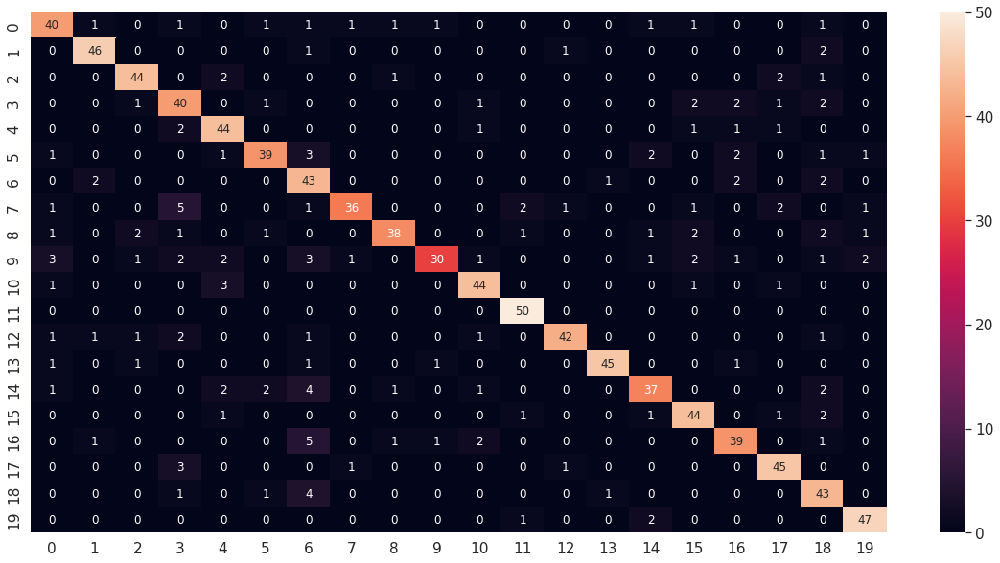

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_14_df_CM = pd.DataFrame(deepid_model_vgg1_14_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_14_report)

              precision    recall  f1-score   support

           1       0.80      0.80      0.80        50
           2       0.90      0.92      0.91        50
           3       0.88      0.88      0.88        50
           4       0.70      0.80      0.75        50
           5       0.80      0.88      0.84        50
           6       0.87      0.78      0.82        50
           7       0.64      0.86      0.74        50
           8       0.92      0.72      0.81        50
           9       0.90      0.76      0.83        50
          10       0.91      0.60      0.72        50
          11       0.86      0.88      0.87        50
          12       0.91      1.00      0.95        50
          13       0.93      0.84      0.88        50
          14       0.96      0.90      0.93        50
          15       0.82      0.74      0.78        50
          16       0.81      0.88      0.85        50
          17       0.81      0.78      0.80        50
          18       0.85    

#### Modelo 15: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg1_15 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg1_15 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_vgg1_15)
deepid_model_vgg1_15.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg1_15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_15.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg1_15 = deepid_model_vgg1_15.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
70/70 [==============================] - 2s 12ms/step - loss: 5.6349 - accuracy: 0.1162 - val_loss: 3.1592 - val_accuracy: 0.1676
Epoch 2/150
70/70 [==============================] - 1s 8ms/step - loss: 2.8681 - accuracy: 0.2454 - val_loss: 2.5914 - val_accuracy: 0.3314
Epoch 3/150
70/70 [==============================] - 1s 8ms/step - loss: 2.2672 - accuracy: 0.4214 - val_loss: 1.9520 - val_accuracy: 0.5125
Epoch 4/150
70/70 [==============================] - 1s 8ms/step - loss: 1.4911 - accuracy: 0.6413 - val_loss: 1.2641 - val_accuracy: 0.7148
Epoch 5/150
70/70 [==============================] - 1s 8ms/step - loss: 0.8969 - accuracy: 0.8115 - val_loss: 0.9260 - val_accuracy: 0.8015
Epoch 6/150
70/70 [==============================] - 1s 8ms/step - loss: 0.5772 - accuracy: 0.9079 - val_loss: 0.7193 - val_accuracy: 0.8748
Epoch 7/150
70/70 [==============================] - 1s 8ms/step - loss: 0.4118 - accuracy: 0.9441 - val_loss: 0.6237 - val_accuracy: 0.9056
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg1_15 = load_model(path + 'data_reconocimiento3/models_VGG1/deepid_model_VGG1_15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg1_15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg1_15.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.8630


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg1_15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg1_15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


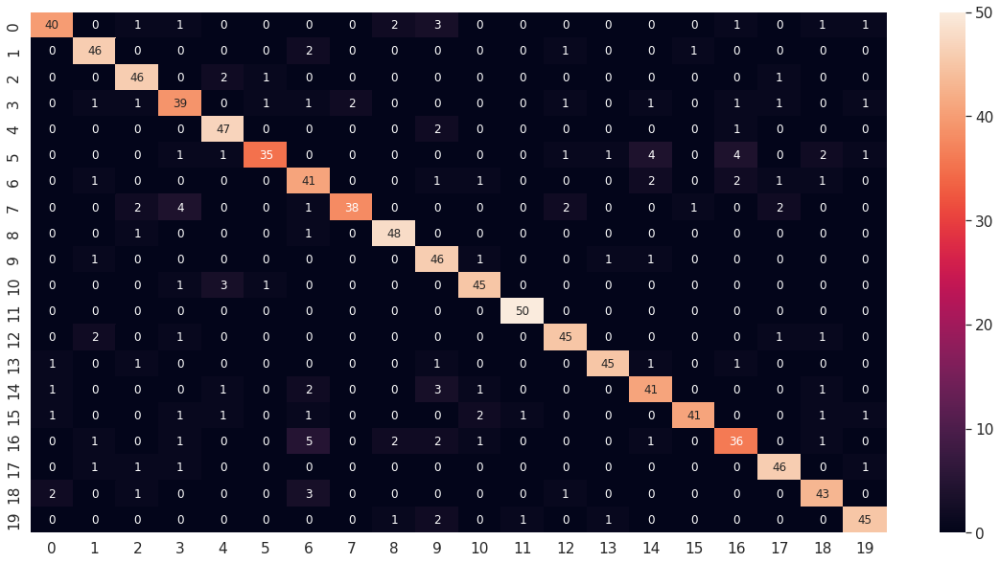

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg1_15_df_CM = pd.DataFrame(deepid_model_vgg1_15_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg1_15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg1_15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg1_15_report)

              precision    recall  f1-score   support

           1       0.89      0.80      0.84        50
           2       0.87      0.92      0.89        50
           3       0.85      0.92      0.88        50
           4       0.78      0.78      0.78        50
           5       0.85      0.94      0.90        50
           6       0.92      0.70      0.80        50
           7       0.72      0.82      0.77        50
           8       0.95      0.76      0.84        50
           9       0.91      0.96      0.93        50
          10       0.77      0.92      0.84        50
          11       0.88      0.90      0.89        50
          12       0.96      1.00      0.98        50
          13       0.88      0.90      0.89        50
          14       0.94      0.90      0.92        50
          15       0.80      0.82      0.81        50
          16       0.95      0.82      0.88        50
          17       0.78      0.72      0.75        50
          18       0.88    

## 8. Modelos con base de datos VGG-Asian para condiciones de etnia

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_1 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_1 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_1)
deepid_model_vgg2_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)  
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_1.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_1 = deepid_model_vgg2_1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
72/72 [==============================] - 10s 14ms/step - loss: 3.2394 - accuracy: 0.0904 - val_loss: 2.9623 - val_accuracy: 0.1199
Epoch 2/70
72/72 [==============================] - 0s 7ms/step - loss: 2.5454 - accuracy: 0.2454 - val_loss: 2.4183 - val_accuracy: 0.2659
Epoch 3/70
72/72 [==============================] - 1s 7ms/step - loss: 2.0158 - accuracy: 0.4178 - val_loss: 1.9120 - val_accuracy: 0.4363
Epoch 4/70
72/72 [==============================] - 1s 7ms/step - loss: 1.6496 - accuracy: 0.5321 - val_loss: 1.6453 - val_accuracy: 0.5281
Epoch 5/70
72/72 [==============================] - 1s 7ms/step - loss: 1.3610 - accuracy: 0.6023 - val_loss: 1.3935 - val_accuracy: 0.6049
Epoch 6/70
72/72 [==============================] - 0s 6ms/step - loss: 1.1038 - accuracy: 0.6937 - val_loss: 1.5530 - val_accuracy: 0.5562
Epoch 7/70
72/72 [==============================] - 0s 7ms/step - loss: 0.9778 - accuracy: 0.7260 - val_loss: 1.3076 - val_accuracy: 0.6461
Epoch 8/70
72/72 [

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_1 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_1.evaluate(testX, testY)

32/32 [==============================] - 0s 6ms/step - loss: 1.1611 - accuracy: 0.7210


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


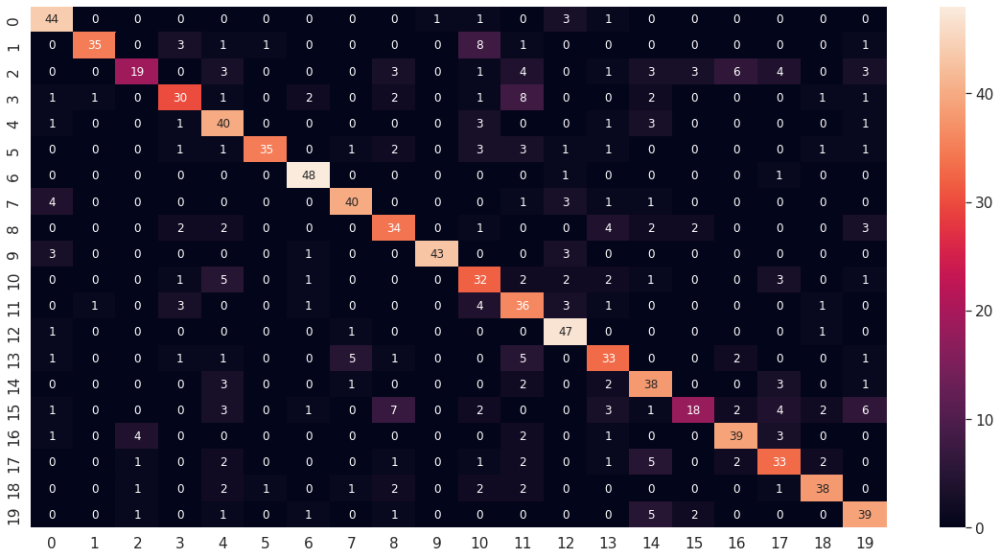

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_1_df_CM = pd.DataFrame(deepid_model_vgg2_1_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_1_report)

              precision    recall  f1-score   support

           1       0.77      0.88      0.82        50
           2       0.95      0.70      0.80        50
           3       0.73      0.38      0.50        50
           4       0.71      0.60      0.65        50
           5       0.62      0.80      0.70        50
           6       0.95      0.70      0.80        50
           7       0.87      0.96      0.91        50
           8       0.82      0.80      0.81        50
           9       0.64      0.68      0.66        50
          10       0.98      0.86      0.91        50
          11       0.54      0.64      0.59        50
          12       0.53      0.72      0.61        50
          13       0.75      0.94      0.83        50
          14       0.63      0.66      0.65        50
          15       0.62      0.76      0.68        50
          16       0.72      0.36      0.48        50
          17       0.76      0.78      0.77        50
          18       0.63    

#### Modelo 2: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_2 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_2 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_2)
deepid_model_vgg2_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_2.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_2 = deepid_model_vgg2_2.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
72/72 [==============================] - 1s 11ms/step - loss: 5.3765 - accuracy: 0.1677 - val_loss: 2.6006 - val_accuracy: 0.2921
Epoch 2/150
72/72 [==============================] - 1s 7ms/step - loss: 1.9327 - accuracy: 0.4740 - val_loss: 1.7841 - val_accuracy: 0.5337
Epoch 3/150
72/72 [==============================] - 1s 7ms/step - loss: 1.1283 - accuracy: 0.7180 - val_loss: 1.5230 - val_accuracy: 0.6311
Epoch 4/150
72/72 [==============================] - 1s 7ms/step - loss: 0.6915 - accuracy: 0.8473 - val_loss: 1.3921 - val_accuracy: 0.6798
Epoch 5/150
72/72 [==============================] - 1s 7ms/step - loss: 0.4529 - accuracy: 0.9143 - val_loss: 1.3859 - val_accuracy: 0.6891
Epoch 6/150
72/72 [==============================] - 0s 6ms/step - loss: 0.2982 - accuracy: 0.9653 - val_loss: 1.4582 - val_accuracy: 0.7154
Epoch 7/150
72/72 [==============================] - 0s 6ms/step - loss: 0.2195 - accuracy: 0.9902 - val_loss: 1.4871 - val_accuracy: 0.7022
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_2 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_2.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.2347 - accuracy: 0.7900


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


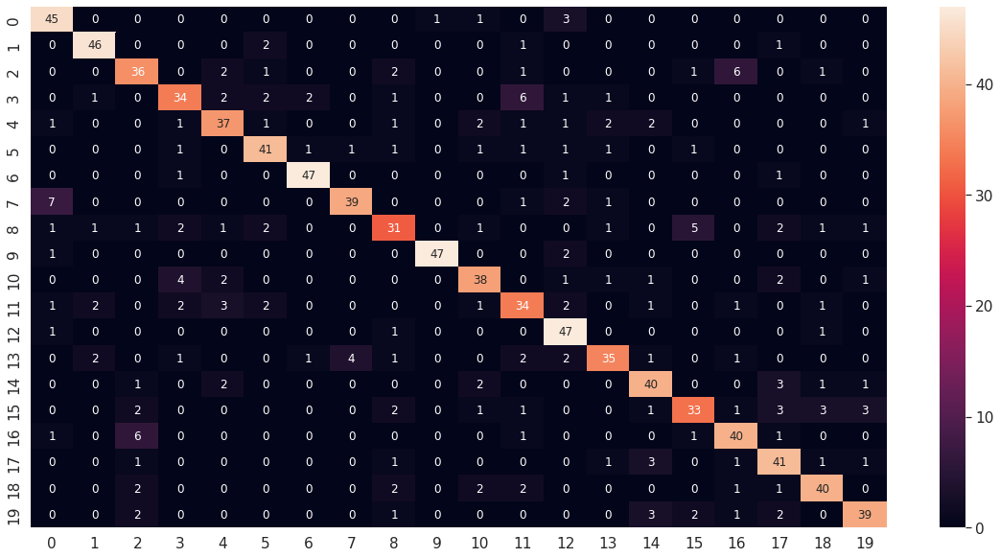

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_2_df_CM = pd.DataFrame(deepid_model_vgg2_2_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_2_report)

              precision    recall  f1-score   support

           1       0.78      0.90      0.83        50
           2       0.88      0.92      0.90        50
           3       0.71      0.72      0.71        50
           4       0.74      0.68      0.71        50
           5       0.76      0.74      0.75        50
           6       0.80      0.82      0.81        50
           7       0.92      0.94      0.93        50
           8       0.89      0.78      0.83        50
           9       0.70      0.62      0.66        50
          10       0.98      0.94      0.96        50
          11       0.78      0.76      0.77        50
          12       0.67      0.68      0.67        50
          13       0.75      0.94      0.83        50
          14       0.81      0.70      0.75        50
          15       0.77      0.80      0.78        50
          16       0.77      0.66      0.71        50
          17       0.77      0.80      0.78        50
          18       0.72    

#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_3 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_3 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_3)
deepid_model_vgg2_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_3.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_3 = deepid_model_vgg2_3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
54/54 [==============================] - 2s 14ms/step - loss: 14.6171 - accuracy: 0.1569 - val_loss: 3.0201 - val_accuracy: 0.1816
Epoch 2/100
54/54 [==============================] - 0s 8ms/step - loss: 2.8041 - accuracy: 0.2501 - val_loss: 2.7286 - val_accuracy: 0.2678
Epoch 3/100
54/54 [==============================] - 0s 8ms/step - loss: 2.4291 - accuracy: 0.3438 - val_loss: 2.3856 - val_accuracy: 0.3352
Epoch 4/100
54/54 [==============================] - 0s 8ms/step - loss: 1.9316 - accuracy: 0.4511 - val_loss: 1.9281 - val_accuracy: 0.4513
Epoch 5/100
54/54 [==============================] - 0s 8ms/step - loss: 1.5309 - accuracy: 0.5663 - val_loss: 1.7385 - val_accuracy: 0.5056
Epoch 6/100
54/54 [==============================] - 0s 8ms/step - loss: 1.2470 - accuracy: 0.6576 - val_loss: 1.5497 - val_accuracy: 0.5693
Epoch 7/100
54/54 [==============================] - 0s 8ms/step - loss: 1.0134 - accuracy: 0.7293 - val_loss: 1.3825 - val_accuracy: 0.6292
Epoch 8/100

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_3 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_3.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.4711 - accuracy: 0.7770


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


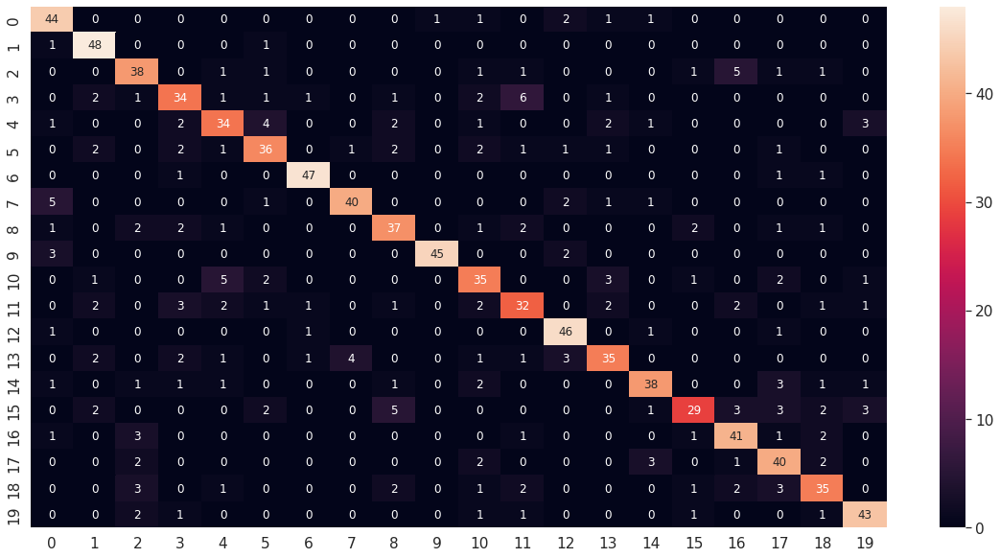

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_3_df_CM = pd.DataFrame(deepid_model_vgg2_3_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_3_report)

              precision    recall  f1-score   support

           1       0.76      0.88      0.81        50
           2       0.81      0.96      0.88        50
           3       0.73      0.76      0.75        50
           4       0.71      0.68      0.69        50
           5       0.71      0.68      0.69        50
           6       0.73      0.72      0.73        50
           7       0.92      0.94      0.93        50
           8       0.89      0.80      0.84        50
           9       0.73      0.74      0.73        50
          10       0.98      0.90      0.94        50
          11       0.67      0.70      0.69        50
          12       0.68      0.64      0.66        50
          13       0.82      0.92      0.87        50
          14       0.76      0.70      0.73        50
          15       0.83      0.76      0.79        50
          16       0.81      0.58      0.67        50
          17       0.76      0.82      0.79        50
          18       0.70    

#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_4 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_4 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_4)
deepid_model_vgg2_4.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_4.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_4 = deepid_model_vgg2_4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
107/107 [==============================] - 2s 8ms/step - loss: 6.6279 - accuracy: 0.0890 - val_loss: 3.1427 - val_accuracy: 0.0974
Epoch 2/100
107/107 [==============================] - 1s 6ms/step - loss: 2.9815 - accuracy: 0.1302 - val_loss: 2.8858 - val_accuracy: 0.1367
Epoch 3/100
107/107 [==============================] - 1s 7ms/step - loss: 2.7233 - accuracy: 0.2276 - val_loss: 2.5056 - val_accuracy: 0.2903
Epoch 4/100
107/107 [==============================] - 1s 7ms/step - loss: 2.2573 - accuracy: 0.3382 - val_loss: 1.9612 - val_accuracy: 0.4064
Epoch 5/100
107/107 [==============================] - 1s 6ms/step - loss: 1.6559 - accuracy: 0.5152 - val_loss: 1.3854 - val_accuracy: 0.5861
Epoch 6/100
107/107 [==============================] - 1s 6ms/step - loss: 1.0269 - accuracy: 0.7124 - val_loss: 1.0521 - val_accuracy: 0.7041
Epoch 7/100
107/107 [==============================] - 1s 7ms/step - loss: 0.6199 - accuracy: 0.8244 - val_loss: 0.8806 - val_accuracy: 0.7640

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_4 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_4.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.2102 - accuracy: 0.7920


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


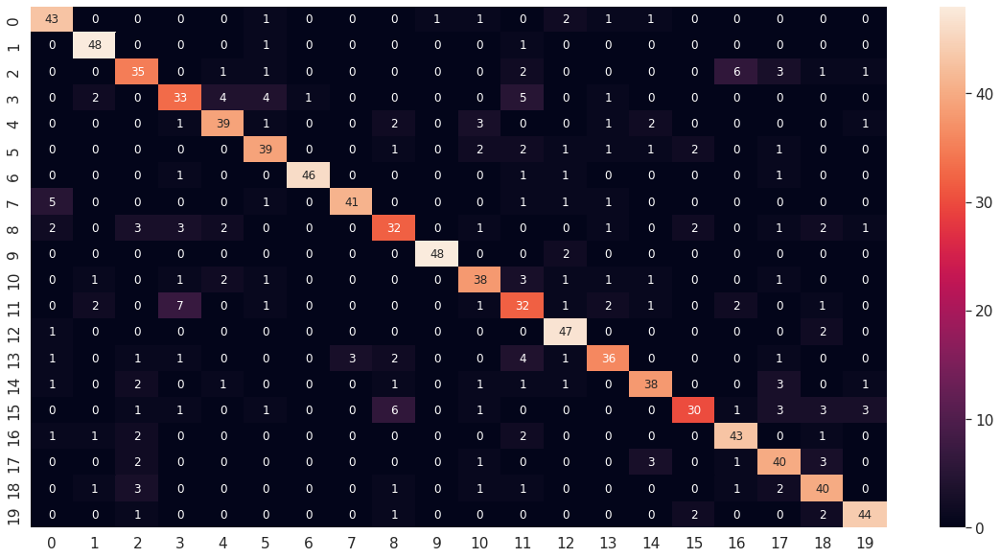

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_4_df_CM = pd.DataFrame(deepid_model_vgg2_4_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_4_report)

              precision    recall  f1-score   support

           1       0.80      0.86      0.83        50
           2       0.87      0.96      0.91        50
           3       0.70      0.70      0.70        50
           4       0.69      0.66      0.67        50
           5       0.80      0.78      0.79        50
           6       0.76      0.78      0.77        50
           7       0.98      0.92      0.95        50
           8       0.93      0.82      0.87        50
           9       0.70      0.64      0.67        50
          10       0.98      0.96      0.97        50
          11       0.76      0.76      0.76        50
          12       0.58      0.64      0.61        50
          13       0.81      0.94      0.87        50
          14       0.80      0.72      0.76        50
          15       0.81      0.76      0.78        50
          16       0.83      0.60      0.70        50
          17       0.80      0.86      0.83        50
          18       0.71    

#### Modelo 5: (BTH = 30, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_5 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_5 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_5)
deepid_model_vgg2_5.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_5.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_5 = deepid_model_vgg2_5.fit(new_trainX, new_trainY, batch_size=30, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
72/72 [==============================] - 1s 10ms/step - loss: 10.6934 - accuracy: 0.0782 - val_loss: 3.2083 - val_accuracy: 0.1030
Epoch 2/200
72/72 [==============================] - 1s 7ms/step - loss: 3.1588 - accuracy: 0.0665 - val_loss: 3.0684 - val_accuracy: 0.1049
Epoch 3/200
72/72 [==============================] - 1s 7ms/step - loss: 3.0389 - accuracy: 0.0979 - val_loss: 2.9542 - val_accuracy: 0.1199
Epoch 4/200
72/72 [==============================] - 1s 7ms/step - loss: 2.9390 - accuracy: 0.1213 - val_loss: 2.8932 - val_accuracy: 0.1217
Epoch 5/200
72/72 [==============================] - 0s 7ms/step - loss: 2.8691 - accuracy: 0.1251 - val_loss: 2.8092 - val_accuracy: 0.1423
Epoch 6/200
72/72 [==============================] - 0s 7ms/step - loss: 2.7681 - accuracy: 0.1368 - val_loss: 2.6605 - val_accuracy: 0.1648
Epoch 7/200
72/72 [==============================] - 0s 7ms/step - loss: 2.4880 - accuracy: 0.2141 - val_loss: 2.4320 - val_accuracy: 0.2285
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_5 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_5.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.1893 - accuracy: 0.7880


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


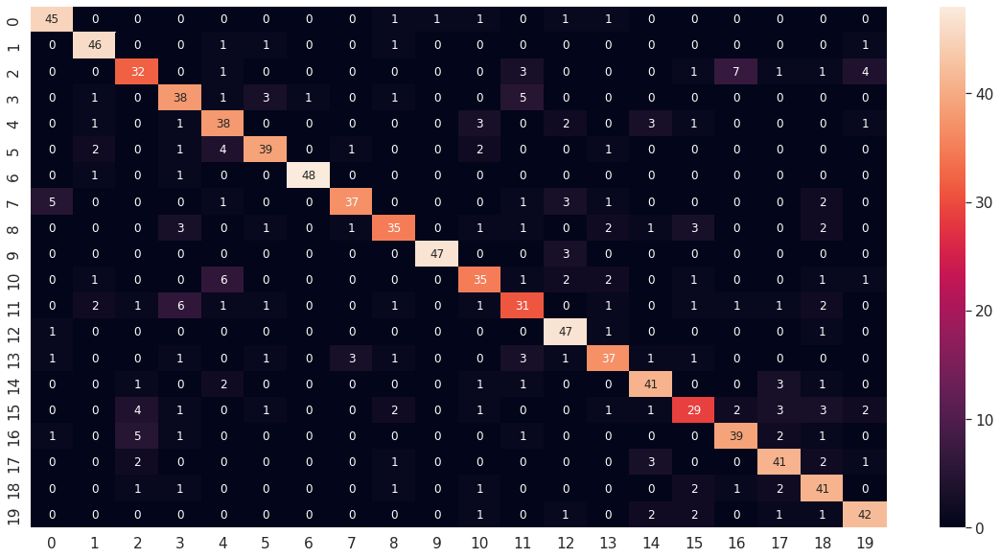

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_5_df_CM = pd.DataFrame(deepid_model_vgg2_5_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_5_report)

              precision    recall  f1-score   support

           1       0.85      0.90      0.87        50
           2       0.85      0.92      0.88        50
           3       0.70      0.64      0.67        50
           4       0.70      0.76      0.73        50
           5       0.69      0.76      0.72        50
           6       0.83      0.78      0.80        50
           7       0.98      0.96      0.97        50
           8       0.88      0.74      0.80        50
           9       0.80      0.70      0.74        50
          10       0.98      0.94      0.96        50
          11       0.74      0.70      0.72        50
          12       0.66      0.62      0.64        50
          13       0.78      0.94      0.85        50
          14       0.79      0.74      0.76        50
          15       0.79      0.82      0.80        50
          16       0.71      0.58      0.64        50
          17       0.78      0.78      0.78        50
          18       0.76    

#### Modelo 6: (BTH = 50, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_6 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_6 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_6)
deepid_model_vgg2_6.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_6.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_6.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_6 = deepid_model_vgg2_6.fit(new_trainX, new_trainY, batch_size=30, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
72/72 [==============================] - 1s 11ms/step - loss: 12.1684 - accuracy: 0.1110 - val_loss: 3.0463 - val_accuracy: 0.1573
Epoch 2/100
72/72 [==============================] - 1s 8ms/step - loss: 2.8528 - accuracy: 0.2155 - val_loss: 2.8405 - val_accuracy: 0.2097
Epoch 3/100
72/72 [==============================] - 1s 7ms/step - loss: 2.5783 - accuracy: 0.2712 - val_loss: 2.6762 - val_accuracy: 0.2678
Epoch 4/100
72/72 [==============================] - 1s 7ms/step - loss: 2.2722 - accuracy: 0.3293 - val_loss: 2.3324 - val_accuracy: 0.3727
Epoch 5/100
72/72 [==============================] - 1s 7ms/step - loss: 1.9002 - accuracy: 0.4323 - val_loss: 1.9392 - val_accuracy: 0.4850
Epoch 6/100
72/72 [==============================] - 1s 7ms/step - loss: 1.5297 - accuracy: 0.5405 - val_loss: 1.6689 - val_accuracy: 0.5468
Epoch 7/100
72/72 [==============================] - 1s 9ms/step - loss: 1.2255 - accuracy: 0.6215 - val_loss: 1.4948 - val_accuracy: 0.5749
Epoch 8/100

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_6 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_6.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.3894 - accuracy: 0.7800


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


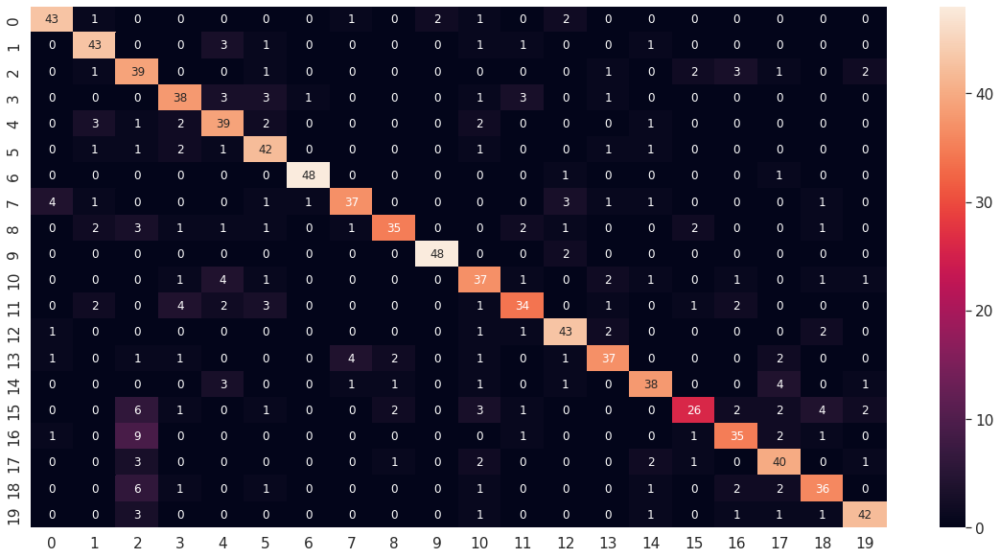

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_6_df_CM = pd.DataFrame(deepid_model_vgg2_6_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_6_report)

              precision    recall  f1-score   support

           1       0.86      0.86      0.86        50
           2       0.80      0.86      0.83        50
           3       0.54      0.78      0.64        50
           4       0.75      0.76      0.75        50
           5       0.70      0.78      0.74        50
           6       0.74      0.84      0.79        50
           7       0.96      0.96      0.96        50
           8       0.84      0.74      0.79        50
           9       0.85      0.70      0.77        50
          10       0.96      0.96      0.96        50
          11       0.69      0.74      0.71        50
          12       0.77      0.68      0.72        50
          13       0.80      0.86      0.83        50
          14       0.80      0.74      0.77        50
          15       0.81      0.76      0.78        50
          16       0.79      0.52      0.63        50
          17       0.76      0.70      0.73        50
          18       0.73    

#### Modelo 7: (BTH = 20, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_7 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_7 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_7)
deepid_model_vgg2_7.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_vgg2_7.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_7.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_7 = deepid_model_vgg2_7.fit(new_trainX, new_trainY, batch_size=20, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
107/107 [==============================] - 1s 8ms/step - loss: 9.4776 - accuracy: 0.1138 - val_loss: 3.0263 - val_accuracy: 0.1348
Epoch 2/200
107/107 [==============================] - 1s 5ms/step - loss: 2.8574 - accuracy: 0.1546 - val_loss: 2.7951 - val_accuracy: 0.1517
Epoch 3/200
107/107 [==============================] - 1s 6ms/step - loss: 2.6689 - accuracy: 0.1916 - val_loss: 2.6966 - val_accuracy: 0.1835
Epoch 4/200
107/107 [==============================] - 1s 5ms/step - loss: 2.5252 - accuracy: 0.2215 - val_loss: 2.5575 - val_accuracy: 0.2060
Epoch 5/200
107/107 [==============================] - 1s 5ms/step - loss: 2.3879 - accuracy: 0.2506 - val_loss: 2.4579 - val_accuracy: 0.2640
Epoch 6/200
107/107 [==============================] - 1s 5ms/step - loss: 2.2465 - accuracy: 0.3021 - val_loss: 2.3171 - val_accuracy: 0.3390
Epoch 7/200
107/107 [==============================] - 1s 5ms/step - loss: 2.0505 - accuracy: 0.3672 - val_loss: 2.1319 - val_accuracy: 0.3745

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_7 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_7.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.3022 - accuracy: 0.7980


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


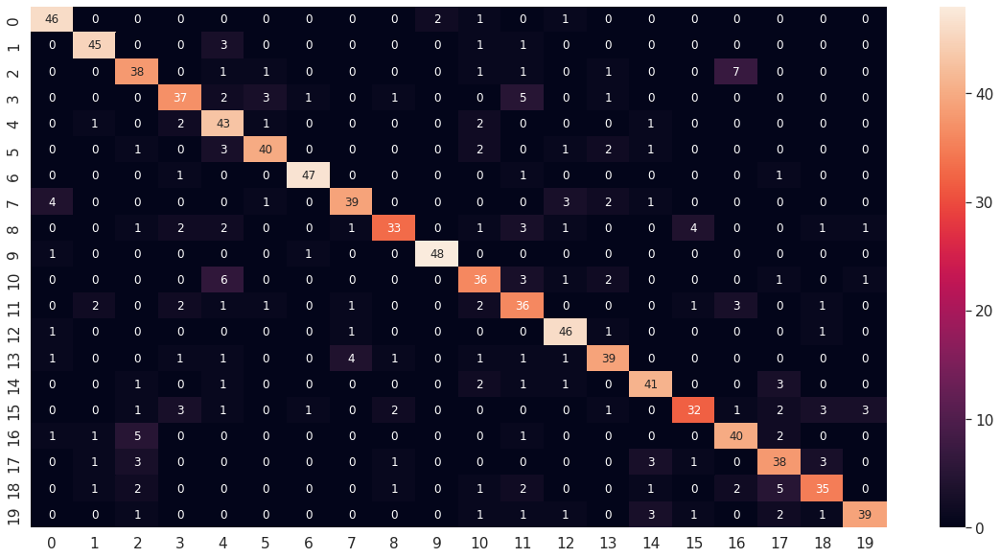

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_7_df_CM = pd.DataFrame(deepid_model_vgg2_7_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_7_report)

              precision    recall  f1-score   support

           1       0.85      0.92      0.88        50
           2       0.88      0.90      0.89        50
           3       0.72      0.76      0.74        50
           4       0.77      0.74      0.76        50
           5       0.67      0.86      0.75        50
           6       0.85      0.80      0.82        50
           7       0.94      0.94      0.94        50
           8       0.85      0.78      0.81        50
           9       0.85      0.66      0.74        50
          10       0.96      0.96      0.96        50
          11       0.71      0.72      0.71        50
          12       0.64      0.72      0.68        50
          13       0.82      0.92      0.87        50
          14       0.80      0.78      0.79        50
          15       0.80      0.82      0.81        50
          16       0.82      0.64      0.72        50
          17       0.75      0.80      0.78        50
          18       0.70    

#### Modelo 8: (BTH = 10, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_8 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_8 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_8)
deepid_model_vgg2_8.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adamax=Adamax(learning_rate=0.001)
deepid_model_vgg2_8.compile(optimizer=adamax, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_8.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_8 = deepid_model_vgg2_8.fit(new_trainX, new_trainY, batch_size=10, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
214/214 [==============================] - 2s 7ms/step - loss: 40.0598 - accuracy: 0.0843 - val_loss: 3.5210 - val_accuracy: 0.0712
Epoch 2/150
214/214 [==============================] - 1s 6ms/step - loss: 3.2822 - accuracy: 0.0867 - val_loss: 3.2906 - val_accuracy: 0.0693
Epoch 3/150
214/214 [==============================] - 1s 6ms/step - loss: 3.1532 - accuracy: 0.0824 - val_loss: 3.1900 - val_accuracy: 0.0712
Epoch 4/150
214/214 [==============================] - 1s 6ms/step - loss: 3.1200 - accuracy: 0.0881 - val_loss: 3.2074 - val_accuracy: 0.0861
Epoch 5/150
214/214 [==============================] - 1s 6ms/step - loss: 3.0891 - accuracy: 0.0834 - val_loss: 3.1717 - val_accuracy: 0.0805
Epoch 6/150
214/214 [==============================] - 1s 6ms/step - loss: 3.0670 - accuracy: 0.0904 - val_loss: 3.1587 - val_accuracy: 0.0655
Epoch 7/150
214/214 [==============================] - 1s 6ms/step - loss: 3.0443 - accuracy: 0.0815 - val_loss: 3.1910 - val_accuracy: 0.067

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_8 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_8.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.3278 - accuracy: 0.8110


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


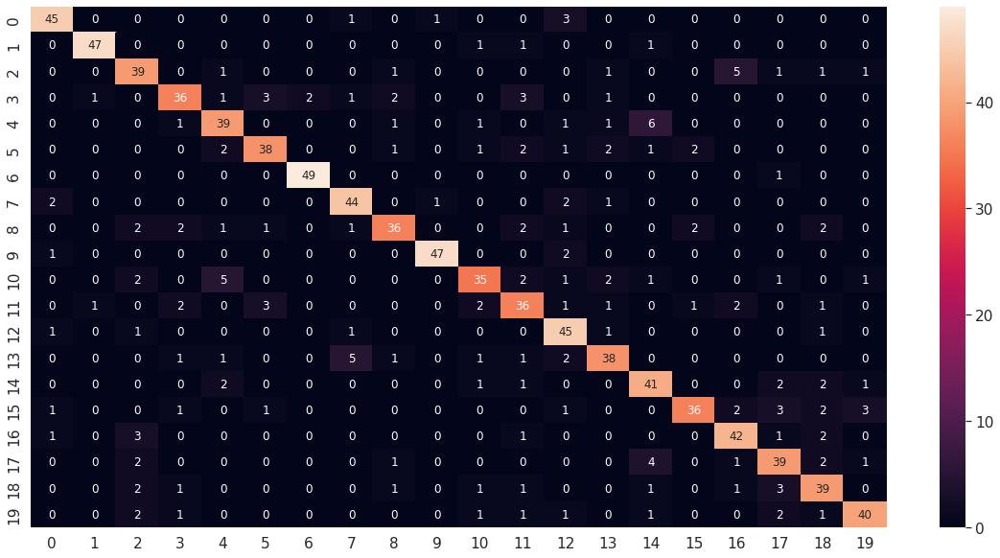

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_8_df_CM = pd.DataFrame(deepid_model_vgg2_8_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_8_report)

              precision    recall  f1-score   support

           1       0.88      0.90      0.89        50
           2       0.96      0.94      0.95        50
           3       0.74      0.78      0.76        50
           4       0.80      0.72      0.76        50
           5       0.75      0.78      0.76        50
           6       0.83      0.76      0.79        50
           7       0.96      0.98      0.97        50
           8       0.83      0.88      0.85        50
           9       0.82      0.72      0.77        50
          10       0.96      0.94      0.95        50
          11       0.80      0.70      0.74        50
          12       0.71      0.72      0.71        50
          13       0.74      0.90      0.81        50
          14       0.79      0.76      0.78        50
          15       0.73      0.82      0.77        50
          16       0.88      0.72      0.79        50
          17       0.79      0.84      0.82        50
          18       0.74    

#### Modelo 9: (BTH = 50, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_9 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_9 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_9)
deepid_model_vgg2_9.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_9.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_9 = deepid_model_vgg2_9.fit(new_trainX, new_trainY, batch_size=50, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
43/43 [==============================] - 10s 31ms/step - loss: 3.2457 - accuracy: 0.1007 - val_loss: 2.9615 - val_accuracy: 0.1423
Epoch 2/200
43/43 [==============================] - 0s 9ms/step - loss: 2.6558 - accuracy: 0.2365 - val_loss: 2.4424 - val_accuracy: 0.3315
Epoch 3/200
43/43 [==============================] - 0s 9ms/step - loss: 2.2219 - accuracy: 0.3667 - val_loss: 2.1586 - val_accuracy: 0.3539
Epoch 4/200
43/43 [==============================] - 0s 9ms/step - loss: 1.8591 - accuracy: 0.4899 - val_loss: 1.9756 - val_accuracy: 0.4419
Epoch 5/200
43/43 [==============================] - 0s 9ms/step - loss: 1.6174 - accuracy: 0.5541 - val_loss: 1.6827 - val_accuracy: 0.5449
Epoch 6/200
43/43 [==============================] - 0s 9ms/step - loss: 1.3951 - accuracy: 0.6080 - val_loss: 1.5462 - val_accuracy: 0.5712
Epoch 7/200
43/43 [==============================] - 0s 9ms/step - loss: 1.2637 - accuracy: 0.6539 - val_loss: 1.4782 - val_accuracy: 0.5918
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_9 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_9.evaluate(testX, testY)

32/32 [==============================] - 0s 6ms/step - loss: 1.1915 - accuracy: 0.7290


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


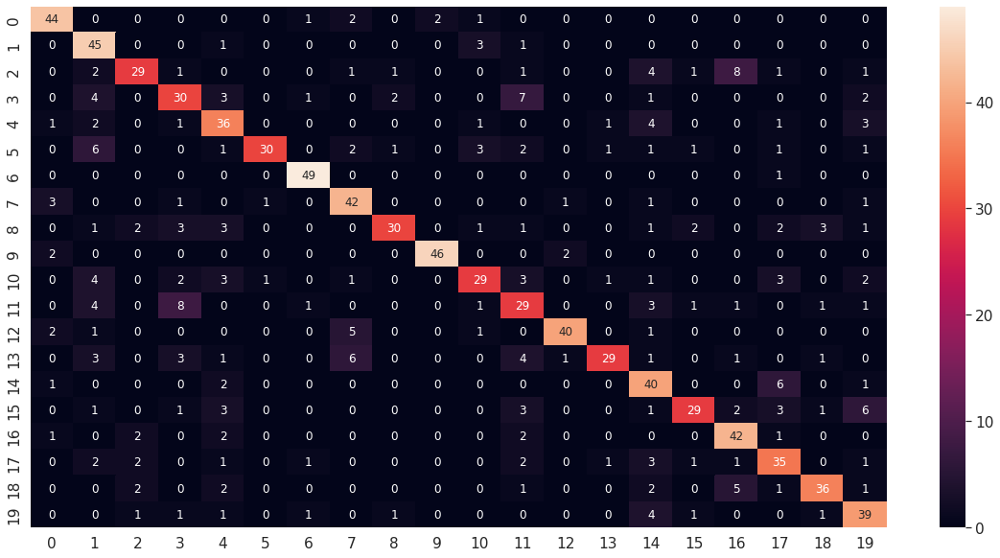

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_9_df_CM = pd.DataFrame(deepid_model_vgg2_9_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_9_report)

              precision    recall  f1-score   support

           1       0.81      0.88      0.85        50
           2       0.60      0.90      0.72        50
           3       0.76      0.58      0.66        50
           4       0.59      0.60      0.59        50
           5       0.61      0.72      0.66        50
           6       0.94      0.60      0.73        50
           7       0.91      0.98      0.94        50
           8       0.71      0.84      0.77        50
           9       0.86      0.60      0.71        50
          10       0.96      0.92      0.94        50
          11       0.72      0.58      0.64        50
          12       0.52      0.58      0.55        50
          13       0.91      0.80      0.85        50
          14       0.88      0.58      0.70        50
          15       0.59      0.80      0.68        50
          16       0.81      0.58      0.67        50
          17       0.70      0.84      0.76        50
          18       0.64    

#### Modelo 10: (BTH = 20, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_10 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_10 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_10)
deepid_model_vgg2_10.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_10.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_10 = deepid_model_vgg2_10.fit(new_trainX, new_trainY, batch_size=20, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
107/107 [==============================] - 2s 15ms/step - loss: 8.3224 - accuracy: 0.1719 - val_loss: 2.6695 - val_accuracy: 0.2678
Epoch 2/250
107/107 [==============================] - 1s 6ms/step - loss: 2.2200 - accuracy: 0.4080 - val_loss: 2.1643 - val_accuracy: 0.4494
Epoch 3/250
107/107 [==============================] - 1s 7ms/step - loss: 1.6674 - accuracy: 0.5480 - val_loss: 1.8122 - val_accuracy: 0.5318
Epoch 4/250
107/107 [==============================] - 1s 6ms/step - loss: 1.2870 - accuracy: 0.6525 - val_loss: 1.6036 - val_accuracy: 0.5861
Epoch 5/250
107/107 [==============================] - 1s 8ms/step - loss: 0.9887 - accuracy: 0.7489 - val_loss: 1.5419 - val_accuracy: 0.6105
Epoch 6/250
107/107 [==============================] - 1s 8ms/step - loss: 0.7652 - accuracy: 0.8178 - val_loss: 1.3925 - val_accuracy: 0.6442
Epoch 7/250
107/107 [==============================] - 1s 6ms/step - loss: 0.5939 - accuracy: 0.8717 - val_loss: 1.3180 - val_accuracy: 0.662

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_10 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_10.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.1782 - accuracy: 0.7910


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


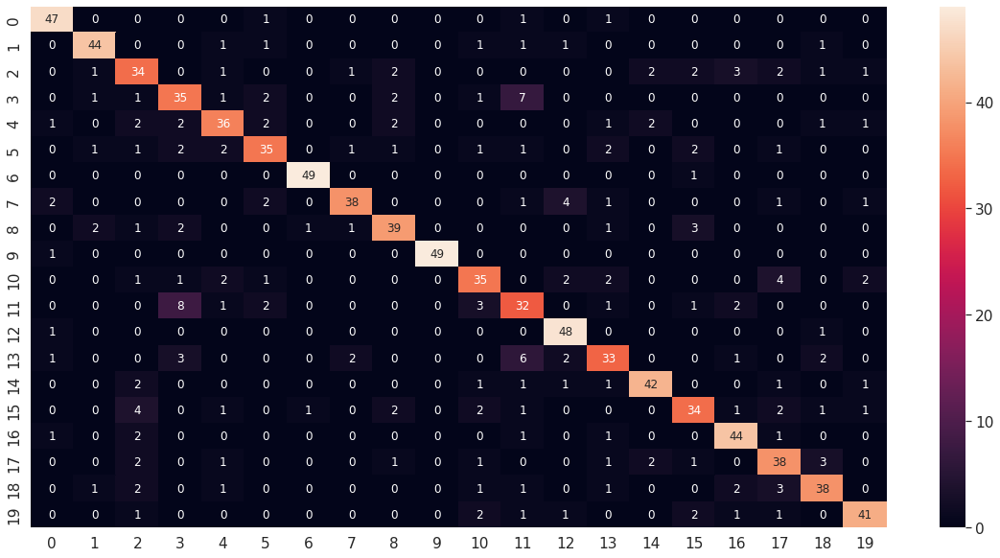

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_10_df_CM = pd.DataFrame(deepid_model_vgg2_10_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_10_report)

              precision    recall  f1-score   support

           1       0.87      0.94      0.90        50
           2       0.88      0.88      0.88        50
           3       0.64      0.68      0.66        50
           4       0.66      0.70      0.68        50
           5       0.77      0.72      0.74        50
           6       0.76      0.70      0.73        50
           7       0.96      0.98      0.97        50
           8       0.88      0.76      0.82        50
           9       0.80      0.78      0.79        50
          10       1.00      0.98      0.99        50
          11       0.73      0.70      0.71        50
          12       0.59      0.64      0.62        50
          13       0.81      0.96      0.88        50
          14       0.72      0.66      0.69        50
          15       0.88      0.84      0.86        50
          16       0.74      0.68      0.71        50
          17       0.81      0.88      0.85        50
          18       0.70    

#### Modelo 11: (BTH = 10, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_11 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_11 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg2_11)
deepid_model_vgg2_11.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_11.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_11 = deepid_model_vgg2_11.fit(new_trainX, new_trainY, batch_size=10, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
214/214 [==============================] - 3s 8ms/step - loss: 4.2623 - accuracy: 0.1508 - val_loss: 2.4998 - val_accuracy: 0.2921
Epoch 2/200
214/214 [==============================] - 2s 7ms/step - loss: 1.8312 - accuracy: 0.4918 - val_loss: 1.3372 - val_accuracy: 0.6517
Epoch 3/200
214/214 [==============================] - 1s 6ms/step - loss: 0.8511 - accuracy: 0.7742 - val_loss: 0.9244 - val_accuracy: 0.7790
Epoch 4/200
214/214 [==============================] - 1s 7ms/step - loss: 0.4308 - accuracy: 0.8937 - val_loss: 0.8243 - val_accuracy: 0.8052
Epoch 5/200
214/214 [==============================] - 2s 7ms/step - loss: 0.2257 - accuracy: 0.9583 - val_loss: 0.7081 - val_accuracy: 0.8577
Epoch 6/200
214/214 [==============================] - 1s 6ms/step - loss: 0.1437 - accuracy: 0.9808 - val_loss: 0.7397 - val_accuracy: 0.8502
Epoch 7/200
214/214 [==============================] - 2s 8ms/step - loss: 0.1049 - accuracy: 0.9930 - val_loss: 0.7620 - val_accuracy: 0.8521

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_11 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_11.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.2047 - accuracy: 0.7840


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


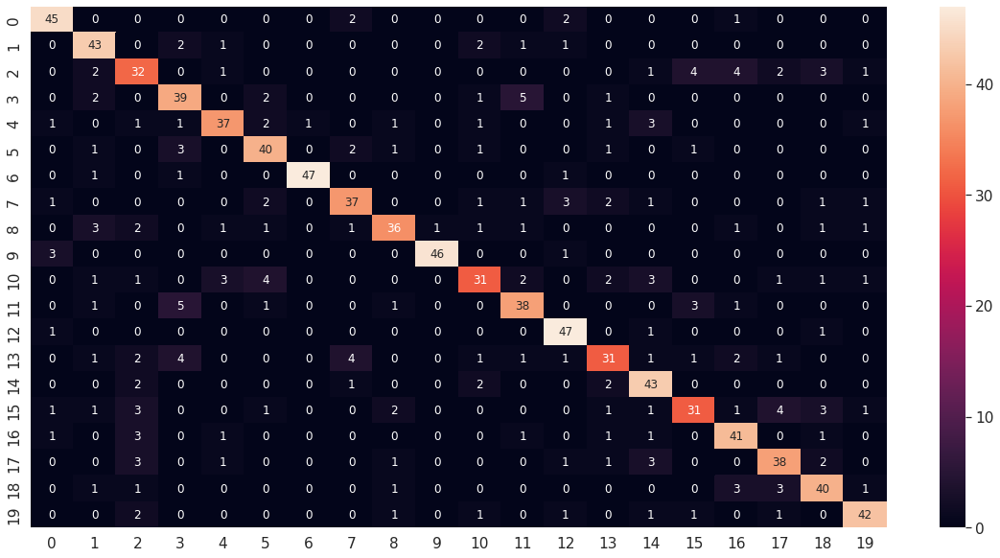

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_11_df_CM = pd.DataFrame(deepid_model_vgg2_11_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_11_report)

              precision    recall  f1-score   support

           1       0.85      0.90      0.87        50
           2       0.75      0.86      0.80        50
           3       0.62      0.64      0.63        50
           4       0.71      0.78      0.74        50
           5       0.82      0.74      0.78        50
           6       0.75      0.80      0.78        50
           7       0.98      0.94      0.96        50
           8       0.79      0.74      0.76        50
           9       0.82      0.72      0.77        50
          10       0.98      0.92      0.95        50
          11       0.74      0.62      0.67        50
          12       0.76      0.76      0.76        50
          13       0.81      0.94      0.87        50
          14       0.72      0.62      0.67        50
          15       0.73      0.86      0.79        50
          16       0.76      0.62      0.68        50
          17       0.76      0.82      0.79        50
          18       0.76    

#### Modelo 12: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_12 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_12 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_vgg2_12)
deepid_model_vgg2_12.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_12.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_12.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_12 = deepid_model_vgg2_12.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
72/72 [==============================] - 2s 11ms/step - loss: 3.4110 - accuracy: 0.0506 - val_loss: 3.3144 - val_accuracy: 0.0487
Epoch 2/150
72/72 [==============================] - 1s 7ms/step - loss: 3.2007 - accuracy: 0.0792 - val_loss: 3.1803 - val_accuracy: 0.1255
Epoch 3/150
72/72 [==============================] - 0s 7ms/step - loss: 2.9297 - accuracy: 0.1101 - val_loss: 2.9363 - val_accuracy: 0.1760
Epoch 4/150
72/72 [==============================] - 1s 7ms/step - loss: 2.6997 - accuracy: 0.1714 - val_loss: 2.8471 - val_accuracy: 0.1498
Epoch 5/150
72/72 [==============================] - 0s 7ms/step - loss: 2.5318 - accuracy: 0.1916 - val_loss: 2.7453 - val_accuracy: 0.2566
Epoch 6/150
72/72 [==============================] - 0s 7ms/step - loss: 2.3564 - accuracy: 0.2600 - val_loss: 2.5195 - val_accuracy: 0.3521
Epoch 7/150
72/72 [==============================] - 1s 7ms/step - loss: 2.2343 - accuracy: 0.3054 - val_loss: 2.3423 - val_accuracy: 0.3614
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_12 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_12.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.1226 - accuracy: 0.7150


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


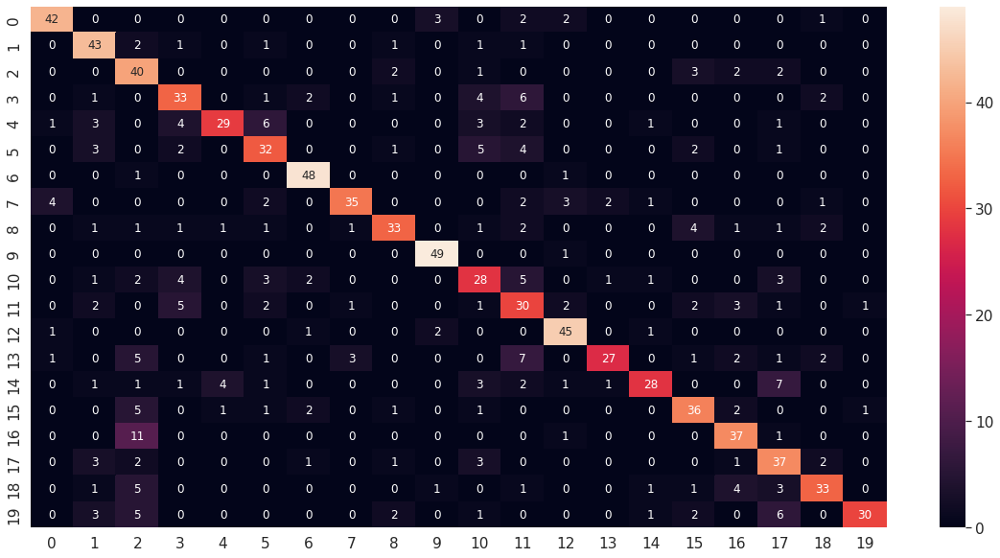

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_12_df_CM = pd.DataFrame(deepid_model_vgg2_12_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_12_report)

              precision    recall  f1-score   support

           1       0.86      0.84      0.85        50
           2       0.69      0.86      0.77        50
           3       0.50      0.80      0.62        50
           4       0.65      0.66      0.65        50
           5       0.83      0.58      0.68        50
           6       0.63      0.64      0.63        50
           7       0.86      0.96      0.91        50
           8       0.88      0.70      0.78        50
           9       0.79      0.66      0.72        50
          10       0.89      0.98      0.93        50
          11       0.54      0.56      0.55        50
          12       0.47      0.60      0.53        50
          13       0.80      0.90      0.85        50
          14       0.87      0.54      0.67        50
          15       0.82      0.56      0.67        50
          16       0.71      0.72      0.71        50
          17       0.71      0.74      0.73        50
          18       0.58    

#### Modelo 13: (BTH = 20, EHS = 150, ValidSplit = 0.2, Dropout=0.5, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_13 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_13 = keras.Model(deepid_model.get_layer('input_2').get_output_at(node_index=0), deepid_model_vgg2_13)
deepid_model_vgg2_13.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_2[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_13.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_13.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_13 = deepid_model_vgg2_13.fit(new_trainX, new_trainY, batch_size=20, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
107/107 [==============================] - 2s 9ms/step - loss: 4.4050 - accuracy: 0.0838 - val_loss: 3.2196 - val_accuracy: 0.1311
Epoch 2/150
107/107 [==============================] - 1s 7ms/step - loss: 2.8335 - accuracy: 0.2066 - val_loss: 2.4612 - val_accuracy: 0.3258
Epoch 3/150
107/107 [==============================] - 1s 7ms/step - loss: 2.1803 - accuracy: 0.3944 - val_loss: 1.5514 - val_accuracy: 0.5730
Epoch 4/150
107/107 [==============================] - 1s 7ms/step - loss: 1.5158 - accuracy: 0.5836 - val_loss: 1.1107 - val_accuracy: 0.7135
Epoch 5/150
107/107 [==============================] - 1s 7ms/step - loss: 1.1896 - accuracy: 0.6815 - val_loss: 0.8649 - val_accuracy: 0.8015
Epoch 6/150
107/107 [==============================] - 1s 7ms/step - loss: 0.9786 - accuracy: 0.7297 - val_loss: 0.8304 - val_accuracy: 0.7846
Epoch 7/150
107/107 [==============================] - 1s 6ms/step - loss: 0.9245 - accuracy: 0.7457 - val_loss: 0.7088 - val_accuracy: 0.8315

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_13 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_13.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.9568 - accuracy: 0.7530


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


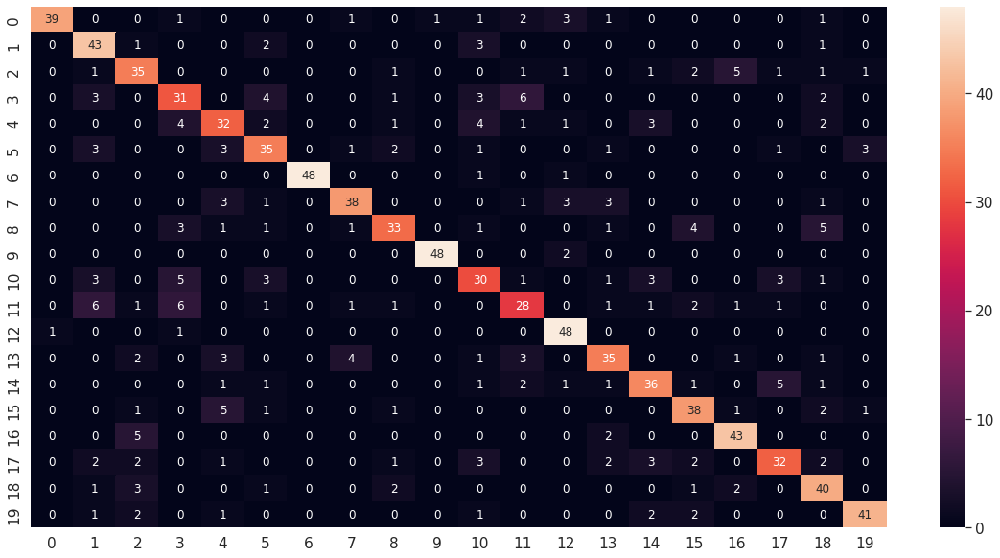

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_13_df_CM = pd.DataFrame(deepid_model_vgg2_13_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_13_report)

              precision    recall  f1-score   support

           1       0.97      0.78      0.87        50
           2       0.68      0.86      0.76        50
           3       0.67      0.70      0.69        50
           4       0.61      0.62      0.61        50
           5       0.64      0.64      0.64        50
           6       0.67      0.70      0.69        50
           7       1.00      0.96      0.98        50
           8       0.83      0.76      0.79        50
           9       0.77      0.66      0.71        50
          10       0.98      0.96      0.97        50
          11       0.60      0.60      0.60        50
          12       0.62      0.56      0.59        50
          13       0.80      0.96      0.87        50
          14       0.73      0.70      0.71        50
          15       0.73      0.72      0.73        50
          16       0.73      0.76      0.75        50
          17       0.81      0.86      0.83        50
          18       0.74    

#### Modelo 14: (BTH = 40, EHS = 150, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_14 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_14 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_vgg2_14)
deepid_model_vgg2_14.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_14.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_14.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_14 = deepid_model_vgg2_14.fit(new_trainX, new_trainY, batch_size=40, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
54/54 [==============================] - 1s 12ms/step - loss: 3.3518 - accuracy: 0.0618 - val_loss: 3.2473 - val_accuracy: 0.0730
Epoch 2/150
54/54 [==============================] - 0s 8ms/step - loss: 2.9588 - accuracy: 0.1302 - val_loss: 2.8833 - val_accuracy: 0.1461
Epoch 3/150
54/54 [==============================] - 0s 8ms/step - loss: 2.5829 - accuracy: 0.2225 - val_loss: 2.5307 - val_accuracy: 0.2060
Epoch 4/150
54/54 [==============================] - 0s 8ms/step - loss: 2.3182 - accuracy: 0.2937 - val_loss: 2.3114 - val_accuracy: 0.3277
Epoch 5/150
54/54 [==============================] - 0s 8ms/step - loss: 2.1056 - accuracy: 0.3770 - val_loss: 2.1514 - val_accuracy: 0.3839
Epoch 6/150
54/54 [==============================] - 0s 8ms/step - loss: 1.8854 - accuracy: 0.4548 - val_loss: 2.0009 - val_accuracy: 0.4064
Epoch 7/150
54/54 [==============================] - 0s 8ms/step - loss: 1.7535 - accuracy: 0.4778 - val_loss: 1.7958 - val_accuracy: 0.5112
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_14 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_14.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.1045 - accuracy: 0.7190


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


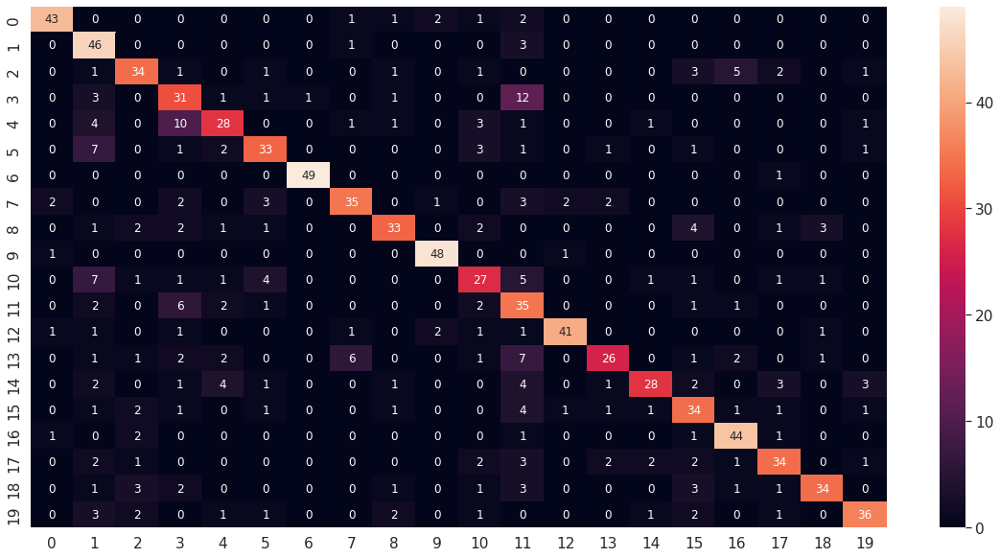

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_14_df_CM = pd.DataFrame(deepid_model_vgg2_14_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_14_report)

              precision    recall  f1-score   support

           1       0.90      0.86      0.88        50
           2       0.56      0.92      0.70        50
           3       0.71      0.68      0.69        50
           4       0.51      0.62      0.56        50
           5       0.67      0.56      0.61        50
           6       0.70      0.66      0.68        50
           7       0.98      0.98      0.98        50
           8       0.78      0.70      0.74        50
           9       0.79      0.66      0.72        50
          10       0.91      0.96      0.93        50
          11       0.60      0.54      0.57        50
          12       0.41      0.70      0.52        50
          13       0.91      0.82      0.86        50
          14       0.79      0.52      0.63        50
          15       0.82      0.56      0.67        50
          16       0.62      0.68      0.65        50
          17       0.80      0.88      0.84        50
          18       0.74    

#### Modelo 15: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0.2, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg2_15 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg2_15 = keras.Model(deepid_model.get_layer('input_3').get_output_at(node_index=0), deepid_model_vgg2_15)
deepid_model_vgg2_15.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_3[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg2_15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_15.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg2_15 = deepid_model_vgg2_15.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
72/72 [==============================] - 1s 11ms/step - loss: 5.2965 - accuracy: 0.1349 - val_loss: 2.7974 - val_accuracy: 0.2285
Epoch 2/150
72/72 [==============================] - 1s 7ms/step - loss: 2.2573 - accuracy: 0.3972 - val_loss: 1.8479 - val_accuracy: 0.4981
Epoch 3/150
72/72 [==============================] - 1s 7ms/step - loss: 1.5080 - accuracy: 0.6037 - val_loss: 1.3311 - val_accuracy: 0.6536
Epoch 4/150
72/72 [==============================] - 1s 7ms/step - loss: 1.0359 - accuracy: 0.7485 - val_loss: 1.0402 - val_accuracy: 0.7453
Epoch 5/150
72/72 [==============================] - 1s 7ms/step - loss: 0.7279 - accuracy: 0.8304 - val_loss: 0.8304 - val_accuracy: 0.8146
Epoch 6/150
72/72 [==============================] - 1s 7ms/step - loss: 0.5673 - accuracy: 0.8820 - val_loss: 0.7345 - val_accuracy: 0.8502
Epoch 7/150
72/72 [==============================] - 1s 7ms/step - loss: 0.4966 - accuracy: 0.8974 - val_loss: 0.6549 - val_accuracy: 0.8801
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg2_15 = load_model(path + 'data_reconocimiento3/models_VGG2/deepid_model_VGG2_15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg2_15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg2_15.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.0843 - accuracy: 0.7730


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg2_15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg2_15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


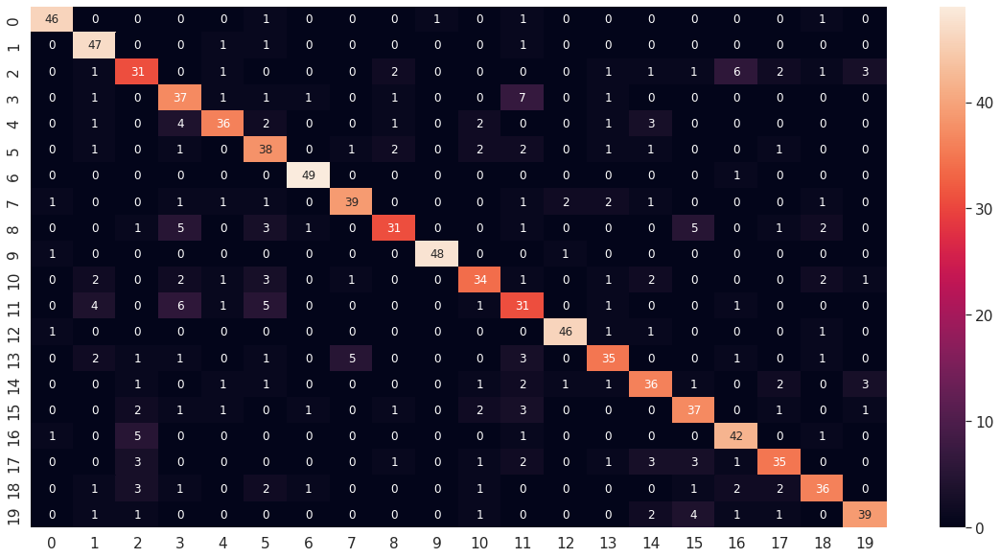

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg2_15_df_CM = pd.DataFrame(deepid_model_vgg2_15_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg2_15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg2_15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg2_15_report)

              precision    recall  f1-score   support

           1       0.92      0.92      0.92        50
           2       0.77      0.94      0.85        50
           3       0.65      0.62      0.63        50
           4       0.63      0.74      0.68        50
           5       0.82      0.72      0.77        50
           6       0.64      0.76      0.70        50
           7       0.92      0.98      0.95        50
           8       0.85      0.78      0.81        50
           9       0.79      0.62      0.70        50
          10       0.98      0.96      0.97        50
          11       0.76      0.68      0.72        50
          12       0.55      0.62      0.58        50
          13       0.92      0.92      0.92        50
          14       0.76      0.70      0.73        50
          15       0.72      0.72      0.72        50
          16       0.71      0.74      0.73        50
          17       0.76      0.84      0.80        50
          18       0.78    

## 9. Modelos con base de datos VGG-Latin para condiciones de etnia

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_1 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_1 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_1)
deepid_model_vgg3_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)  
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_1.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_1 = deepid_model_vgg3_1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
74/74 [==============================] - 11s 18ms/step - loss: 3.2310 - accuracy: 0.0950 - val_loss: 2.8654 - val_accuracy: 0.1836
Epoch 2/70
74/74 [==============================] - 1s 10ms/step - loss: 2.4316 - accuracy: 0.3047 - val_loss: 2.1437 - val_accuracy: 0.3891
Epoch 3/70
74/74 [==============================] - 1s 11ms/step - loss: 1.7472 - accuracy: 0.5052 - val_loss: 1.6694 - val_accuracy: 0.5109
Epoch 4/70
74/74 [==============================] - 1s 9ms/step - loss: 1.2883 - accuracy: 0.6330 - val_loss: 1.3261 - val_accuracy: 0.6382
Epoch 5/70
74/74 [==============================] - 1s 8ms/step - loss: 0.9762 - accuracy: 0.7244 - val_loss: 1.1424 - val_accuracy: 0.6945
Epoch 6/70
74/74 [==============================] - 1s 9ms/step - loss: 0.7725 - accuracy: 0.7945 - val_loss: 1.0444 - val_accuracy: 0.7218
Epoch 7/70
74/74 [==============================] - 1s 12ms/step - loss: 0.5924 - accuracy: 0.8440 - val_loss: 0.9815 - val_accuracy: 0.7509
Epoch 8/70
74/7

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_1 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_1.evaluate(testX, testY)

32/32 [==============================] - 0s 5ms/step - loss: 0.7552 - accuracy: 0.8420


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


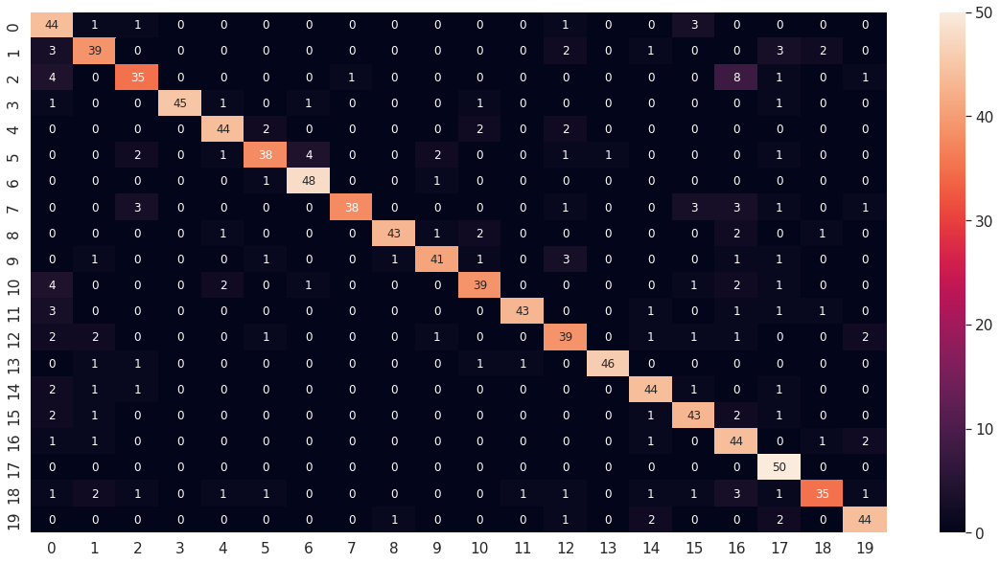

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_1_df_CM = pd.DataFrame(deepid_model_vgg3_1_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_1_report)

              precision    recall  f1-score   support

           1       0.66      0.88      0.75        50
           2       0.80      0.78      0.79        50
           3       0.80      0.70      0.74        50
           4       1.00      0.90      0.95        50
           5       0.88      0.88      0.88        50
           6       0.86      0.76      0.81        50
           7       0.89      0.96      0.92        50
           8       0.97      0.76      0.85        50
           9       0.96      0.86      0.91        50
          10       0.89      0.82      0.85        50
          11       0.85      0.78      0.81        50
          12       0.96      0.86      0.91        50
          13       0.76      0.78      0.77        50
          14       0.98      0.92      0.95        50
          15       0.85      0.88      0.86        50
          16       0.81      0.86      0.83        50
          17       0.66      0.88      0.75        50
          18       0.77    

#### Modelo 2: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_2 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_2 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_2)
deepid_model_vgg3_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_2.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_2 = deepid_model_vgg3_2.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
74/74 [==============================] - 1s 10ms/step - loss: 5.9299 - accuracy: 0.1764 - val_loss: 2.6057 - val_accuracy: 0.3000
Epoch 2/150
74/74 [==============================] - 1s 7ms/step - loss: 1.9116 - accuracy: 0.5034 - val_loss: 1.7208 - val_accuracy: 0.5455
Epoch 3/150
74/74 [==============================] - 1s 7ms/step - loss: 1.0096 - accuracy: 0.7572 - val_loss: 1.2812 - val_accuracy: 0.6982
Epoch 4/150
74/74 [==============================] - 1s 7ms/step - loss: 0.5940 - accuracy: 0.8740 - val_loss: 1.1262 - val_accuracy: 0.7509
Epoch 5/150
74/74 [==============================] - 0s 7ms/step - loss: 0.3874 - accuracy: 0.9368 - val_loss: 1.0583 - val_accuracy: 0.7782
Epoch 6/150
74/74 [==============================] - 0s 6ms/step - loss: 0.2842 - accuracy: 0.9682 - val_loss: 1.0694 - val_accuracy: 0.7818
Epoch 7/150
74/74 [==============================] - 0s 6ms/step - loss: 0.2275 - accuracy: 0.9850 - val_loss: 1.0713 - val_accuracy: 0.7800
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_2 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_2.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.5985 - accuracy: 0.8890


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


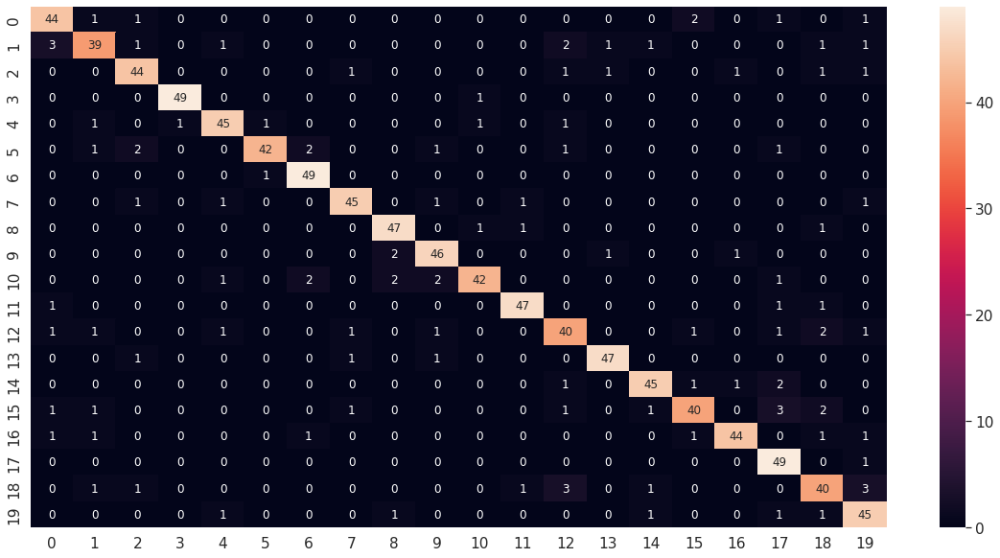

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_2_df_CM = pd.DataFrame(deepid_model_vgg3_2_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_2_report)

              precision    recall  f1-score   support

           1       0.86      0.88      0.87        50
           2       0.85      0.78      0.81        50
           3       0.86      0.88      0.87        50
           4       0.98      0.98      0.98        50
           5       0.90      0.90      0.90        50
           6       0.95      0.84      0.89        50
           7       0.91      0.98      0.94        50
           8       0.92      0.90      0.91        50
           9       0.90      0.94      0.92        50
          10       0.88      0.92      0.90        50
          11       0.93      0.84      0.88        50
          12       0.94      0.94      0.94        50
          13       0.80      0.80      0.80        50
          14       0.94      0.94      0.94        50
          15       0.92      0.90      0.91        50
          16       0.89      0.80      0.84        50
          17       0.94      0.88      0.91        50
          18       0.82    

#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_3 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_3 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_3)
deepid_model_vgg3_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_3.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_3 = deepid_model_vgg3_3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
55/55 [==============================] - 2s 14ms/step - loss: 6.9101 - accuracy: 0.1473 - val_loss: 2.7056 - val_accuracy: 0.2691
Epoch 2/100
55/55 [==============================] - 0s 8ms/step - loss: 2.0765 - accuracy: 0.4366 - val_loss: 1.5772 - val_accuracy: 0.5709
Epoch 3/100
55/55 [==============================] - 0s 8ms/step - loss: 1.1201 - accuracy: 0.7153 - val_loss: 0.9490 - val_accuracy: 0.7800
Epoch 4/100
55/55 [==============================] - 0s 8ms/step - loss: 0.5827 - accuracy: 0.8813 - val_loss: 0.7164 - val_accuracy: 0.8418
Epoch 5/100
55/55 [==============================] - 0s 8ms/step - loss: 0.3526 - accuracy: 0.9459 - val_loss: 0.6340 - val_accuracy: 0.8582
Epoch 6/100
55/55 [==============================] - 0s 8ms/step - loss: 0.2260 - accuracy: 0.9827 - val_loss: 0.5835 - val_accuracy: 0.8745
Epoch 7/100
55/55 [==============================] - 0s 8ms/step - loss: 0.1698 - accuracy: 0.9959 - val_loss: 0.5417 - val_accuracy: 0.8745
Epoch 8/100


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_3 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_3.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6041 - accuracy: 0.8700


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


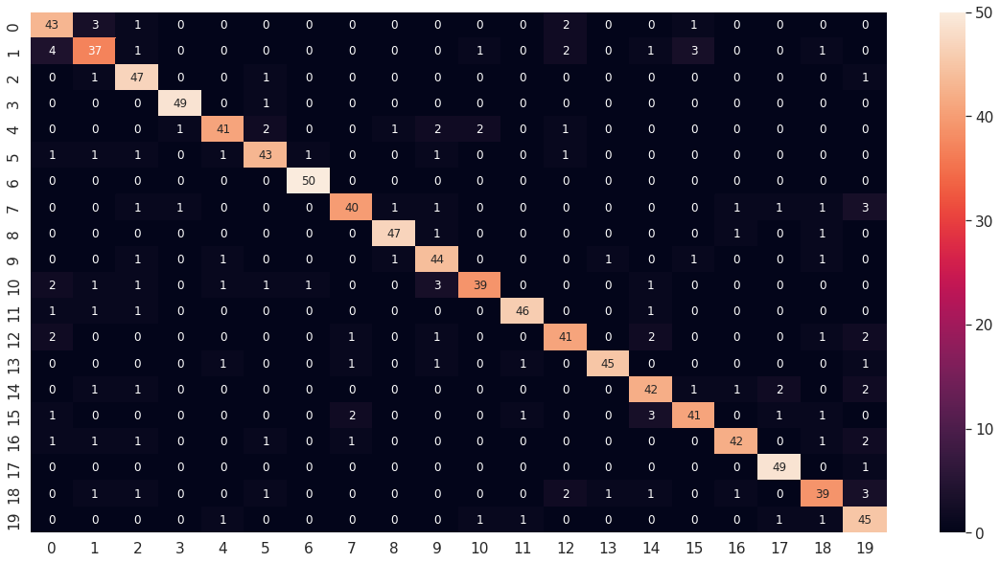

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_3_df_CM = pd.DataFrame(deepid_model_vgg3_3_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_3_report)

              precision    recall  f1-score   support

           1       0.78      0.86      0.82        50
           2       0.79      0.74      0.76        50
           3       0.82      0.94      0.88        50
           4       0.96      0.98      0.97        50
           5       0.89      0.82      0.85        50
           6       0.86      0.86      0.86        50
           7       0.96      1.00      0.98        50
           8       0.89      0.80      0.84        50
           9       0.94      0.94      0.94        50
          10       0.81      0.88      0.85        50
          11       0.91      0.78      0.84        50
          12       0.94      0.92      0.93        50
          13       0.84      0.82      0.83        50
          14       0.96      0.90      0.93        50
          15       0.82      0.84      0.83        50
          16       0.87      0.82      0.85        50
          17       0.91      0.84      0.87        50
          18       0.91    

#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_4 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_4 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_4)
deepid_model_vgg3_4.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_4.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_4 = deepid_model_vgg3_4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
110/110 [==============================] - 2s 9ms/step - loss: 6.4785 - accuracy: 0.2783 - val_loss: 2.2001 - val_accuracy: 0.4200
Epoch 2/100
110/110 [==============================] - 1s 7ms/step - loss: 1.5684 - accuracy: 0.5953 - val_loss: 1.4006 - val_accuracy: 0.6636
Epoch 3/100
110/110 [==============================] - 1s 6ms/step - loss: 0.7183 - accuracy: 0.8290 - val_loss: 1.0050 - val_accuracy: 0.7745
Epoch 4/100
110/110 [==============================] - 1s 6ms/step - loss: 0.3670 - accuracy: 0.9291 - val_loss: 0.7350 - val_accuracy: 0.8509
Epoch 5/100
110/110 [==============================] - 1s 6ms/step - loss: 0.2199 - accuracy: 0.9791 - val_loss: 0.6614 - val_accuracy: 0.8727
Epoch 6/100
110/110 [==============================] - 1s 6ms/step - loss: 0.1597 - accuracy: 0.9959 - val_loss: 0.6164 - val_accuracy: 0.8818
Epoch 7/100
110/110 [==============================] - 1s 6ms/step - loss: 0.1414 - accuracy: 0.9986 - val_loss: 0.6724 - val_accuracy: 0.8855

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_4 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_4.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.8760


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


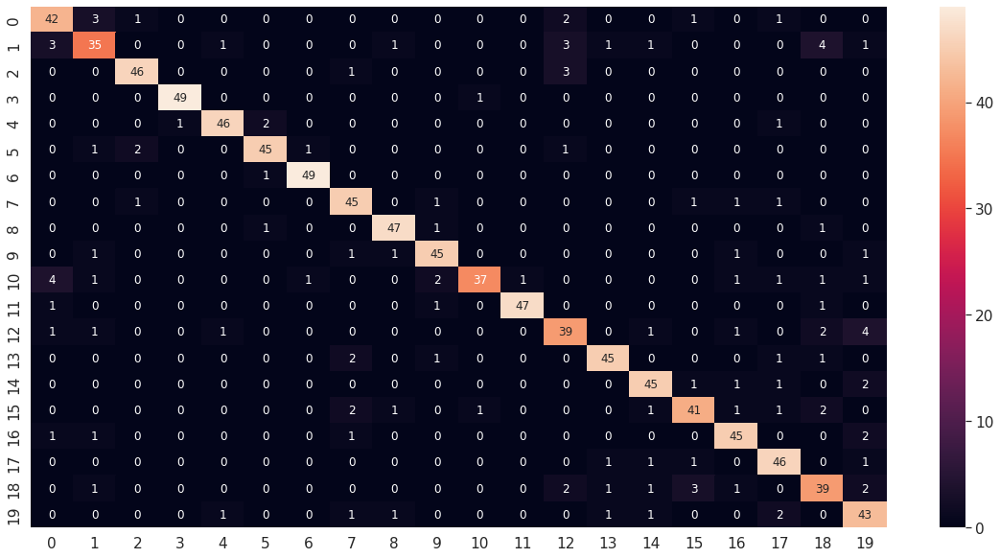

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_4_df_CM = pd.DataFrame(deepid_model_vgg3_4_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_4_report)

              precision    recall  f1-score   support

           1       0.81      0.84      0.82        50
           2       0.80      0.70      0.74        50
           3       0.92      0.92      0.92        50
           4       0.98      0.98      0.98        50
           5       0.94      0.92      0.93        50
           6       0.92      0.90      0.91        50
           7       0.96      0.98      0.97        50
           8       0.85      0.90      0.87        50
           9       0.92      0.94      0.93        50
          10       0.88      0.90      0.89        50
          11       0.95      0.74      0.83        50
          12       0.98      0.94      0.96        50
          13       0.78      0.78      0.78        50
          14       0.92      0.90      0.91        50
          15       0.88      0.90      0.89        50
          16       0.85      0.82      0.84        50
          17       0.87      0.90      0.88        50
          18       0.84    

#### Modelo 5: (BTH = 30, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_5 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_5 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_5)
deepid_model_vgg3_5.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_5.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_5 = deepid_model_vgg3_5.fit(new_trainX, new_trainY, batch_size=30, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
74/74 [==============================] - 1s 9ms/step - loss: 11.8314 - accuracy: 0.1646 - val_loss: 2.6209 - val_accuracy: 0.3145
Epoch 2/250
74/74 [==============================] - 0s 7ms/step - loss: 2.1531 - accuracy: 0.4302 - val_loss: 1.8433 - val_accuracy: 0.5073
Epoch 3/250
74/74 [==============================] - 0s 6ms/step - loss: 1.4164 - accuracy: 0.6312 - val_loss: 1.2307 - val_accuracy: 0.6982
Epoch 4/250
74/74 [==============================] - 0s 6ms/step - loss: 0.8684 - accuracy: 0.7972 - val_loss: 0.9096 - val_accuracy: 0.7691
Epoch 5/250
74/74 [==============================] - 0s 6ms/step - loss: 0.5461 - accuracy: 0.8854 - val_loss: 0.7342 - val_accuracy: 0.8218
Epoch 6/250
74/74 [==============================] - 0s 6ms/step - loss: 0.3603 - accuracy: 0.9413 - val_loss: 0.6523 - val_accuracy: 0.8473
Epoch 7/250
74/74 [==============================] - 0s 6ms/step - loss: 0.2593 - accuracy: 0.9736 - val_loss: 0.5953 - val_accuracy: 0.8600
Epoch 8/250


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_5 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_5.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.5987 - accuracy: 0.8860


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


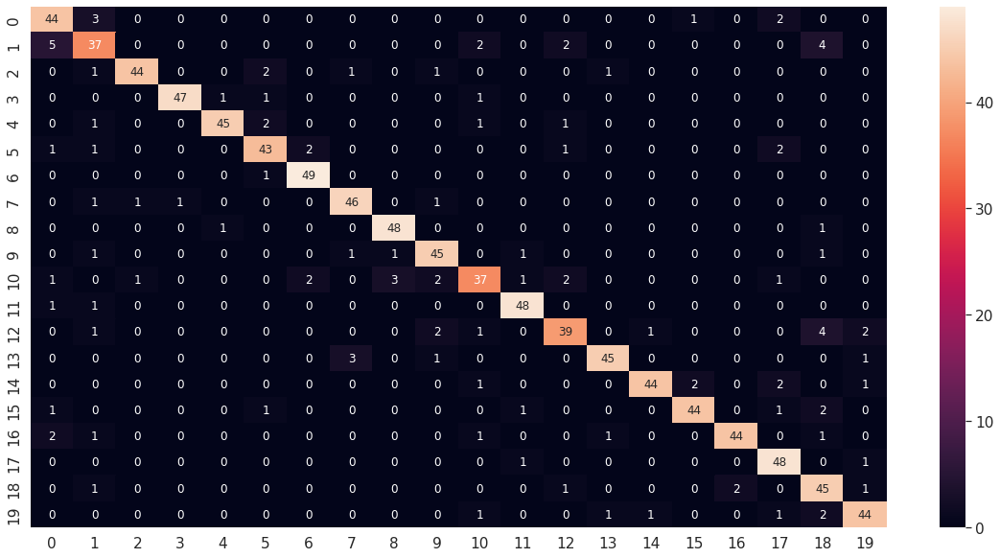

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_5_df_CM = pd.DataFrame(deepid_model_vgg3_5_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_5_report)

              precision    recall  f1-score   support

           1       0.80      0.88      0.84        50
           2       0.76      0.74      0.75        50
           3       0.96      0.88      0.92        50
           4       0.98      0.94      0.96        50
           5       0.96      0.90      0.93        50
           6       0.86      0.86      0.86        50
           7       0.92      0.98      0.95        50
           8       0.90      0.92      0.91        50
           9       0.92      0.96      0.94        50
          10       0.87      0.90      0.88        50
          11       0.82      0.74      0.78        50
          12       0.92      0.96      0.94        50
          13       0.85      0.78      0.81        50
          14       0.94      0.90      0.92        50
          15       0.96      0.88      0.92        50
          16       0.94      0.88      0.91        50
          17       0.96      0.88      0.92        50
          18       0.84    

#### Modelo 6: (BTH = 50, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_6 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_6 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_6)
deepid_model_vgg3_6.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_6.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_6.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_6 = deepid_model_vgg3_6.fit(new_trainX, new_trainY, batch_size=50, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
44/44 [==============================] - 2s 19ms/step - loss: 8.9524 - accuracy: 0.1087 - val_loss: 3.2030 - val_accuracy: 0.0709
Epoch 2/150
44/44 [==============================] - 0s 11ms/step - loss: 3.0411 - accuracy: 0.1819 - val_loss: 2.8092 - val_accuracy: 0.2800
Epoch 3/150
44/44 [==============================] - 0s 11ms/step - loss: 2.4343 - accuracy: 0.3543 - val_loss: 2.1596 - val_accuracy: 0.4564
Epoch 4/150
44/44 [==============================] - 0s 10ms/step - loss: 1.8071 - accuracy: 0.5193 - val_loss: 1.7213 - val_accuracy: 0.5273
Epoch 5/150
44/44 [==============================] - 0s 10ms/step - loss: 1.3159 - accuracy: 0.6185 - val_loss: 1.3168 - val_accuracy: 0.6273
Epoch 6/150
44/44 [==============================] - 0s 11ms/step - loss: 0.8408 - accuracy: 0.7694 - val_loss: 1.0257 - val_accuracy: 0.7273
Epoch 7/150
44/44 [==============================] - 0s 11ms/step - loss: 0.5597 - accuracy: 0.8658 - val_loss: 0.8523 - val_accuracy: 0.7855
Epoch 

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_6 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_6.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.8850


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


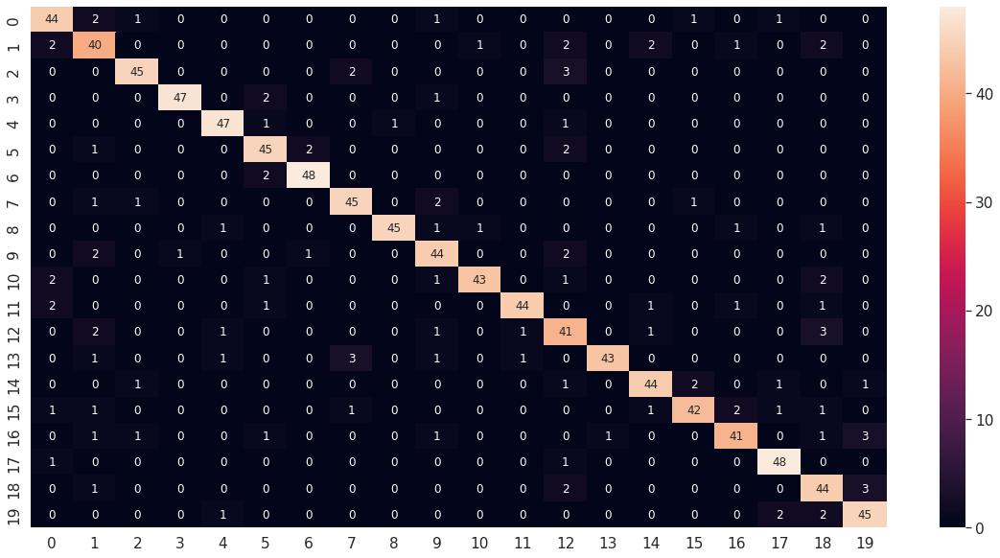

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_6_df_CM = pd.DataFrame(deepid_model_vgg3_6_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_6_report)

              precision    recall  f1-score   support

           1       0.85      0.88      0.86        50
           2       0.77      0.80      0.78        50
           3       0.92      0.90      0.91        50
           4       0.98      0.94      0.96        50
           5       0.92      0.94      0.93        50
           6       0.85      0.90      0.87        50
           7       0.94      0.96      0.95        50
           8       0.88      0.90      0.89        50
           9       0.98      0.90      0.94        50
          10       0.83      0.88      0.85        50
          11       0.96      0.86      0.91        50
          12       0.96      0.88      0.92        50
          13       0.73      0.82      0.77        50
          14       0.98      0.86      0.91        50
          15       0.90      0.88      0.89        50
          16       0.91      0.84      0.87        50
          17       0.89      0.82      0.85        50
          18       0.91    

#### Modelo 7: (BTH = 20, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_7 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_7 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_7)
deepid_model_vgg3_7.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_7.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_7.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_7 = deepid_model_vgg3_7.fit(new_trainX, new_trainY, batch_size=20, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
110/110 [==============================] - 2s 9ms/step - loss: 6.1772 - accuracy: 0.1655 - val_loss: 2.5766 - val_accuracy: 0.2764
Epoch 2/200
110/110 [==============================] - 1s 7ms/step - loss: 2.4153 - accuracy: 0.3211 - val_loss: 2.0447 - val_accuracy: 0.4273
Epoch 3/200
110/110 [==============================] - 1s 6ms/step - loss: 1.7879 - accuracy: 0.4957 - val_loss: 1.4735 - val_accuracy: 0.6200
Epoch 4/200
110/110 [==============================] - 1s 6ms/step - loss: 1.1426 - accuracy: 0.6799 - val_loss: 0.8827 - val_accuracy: 0.7691
Epoch 5/200
110/110 [==============================] - 1s 7ms/step - loss: 0.5151 - accuracy: 0.8645 - val_loss: 0.4581 - val_accuracy: 0.9073
Epoch 6/200
110/110 [==============================] - 1s 6ms/step - loss: 0.1986 - accuracy: 0.9645 - val_loss: 0.3741 - val_accuracy: 0.9273
Epoch 7/200
110/110 [==============================] - 1s 6ms/step - loss: 0.1226 - accuracy: 0.9850 - val_loss: 0.3346 - val_accuracy: 0.9455

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_7 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_7.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.6760 - accuracy: 0.8780


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


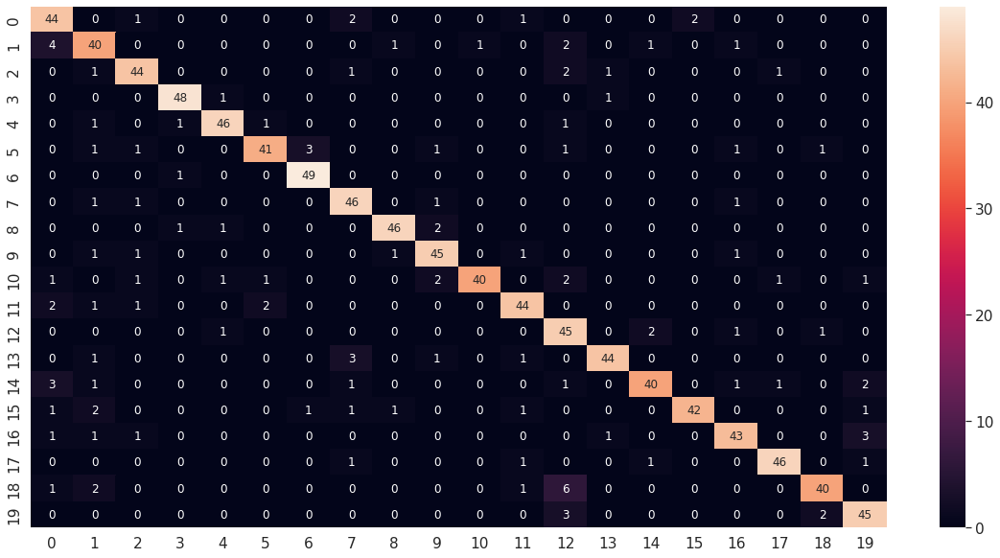

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_7_df_CM = pd.DataFrame(deepid_model_vgg3_7_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_7_report)

              precision    recall  f1-score   support

           1       0.77      0.88      0.82        50
           2       0.75      0.80      0.78        50
           3       0.86      0.88      0.87        50
           4       0.94      0.96      0.95        50
           5       0.92      0.92      0.92        50
           6       0.91      0.82      0.86        50
           7       0.92      0.98      0.95        50
           8       0.84      0.92      0.88        50
           9       0.94      0.92      0.93        50
          10       0.87      0.90      0.88        50
          11       0.98      0.80      0.88        50
          12       0.88      0.88      0.88        50
          13       0.71      0.90      0.80        50
          14       0.94      0.88      0.91        50
          15       0.91      0.80      0.85        50
          16       0.95      0.84      0.89        50
          17       0.88      0.86      0.87        50
          18       0.94    

#### Modelo 8: (BTH = 40, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_8 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_8 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_8)
deepid_model_vgg3_8.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_8.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_8.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_8 = deepid_model_vgg3_8.fit(new_trainX, new_trainY, batch_size=40, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
55/55 [==============================] - 1s 13ms/step - loss: 11.2317 - accuracy: 0.1114 - val_loss: 3.0732 - val_accuracy: 0.1145
Epoch 2/200
55/55 [==============================] - 0s 9ms/step - loss: 2.9061 - accuracy: 0.1824 - val_loss: 2.7652 - val_accuracy: 0.2200
Epoch 3/200
55/55 [==============================] - 0s 8ms/step - loss: 2.5615 - accuracy: 0.2719 - val_loss: 2.4110 - val_accuracy: 0.3182
Epoch 4/200
55/55 [==============================] - 0s 8ms/step - loss: 2.2137 - accuracy: 0.3774 - val_loss: 2.1446 - val_accuracy: 0.4218
Epoch 5/200
55/55 [==============================] - 0s 8ms/step - loss: 1.9214 - accuracy: 0.4593 - val_loss: 1.8173 - val_accuracy: 0.4800
Epoch 6/200
55/55 [==============================] - 0s 8ms/step - loss: 1.6448 - accuracy: 0.5102 - val_loss: 1.6035 - val_accuracy: 0.5418
Epoch 7/200
55/55 [==============================] - 0s 8ms/step - loss: 1.4223 - accuracy: 0.5985 - val_loss: 1.4752 - val_accuracy: 0.6091
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_8 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_8.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7263 - accuracy: 0.8900


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


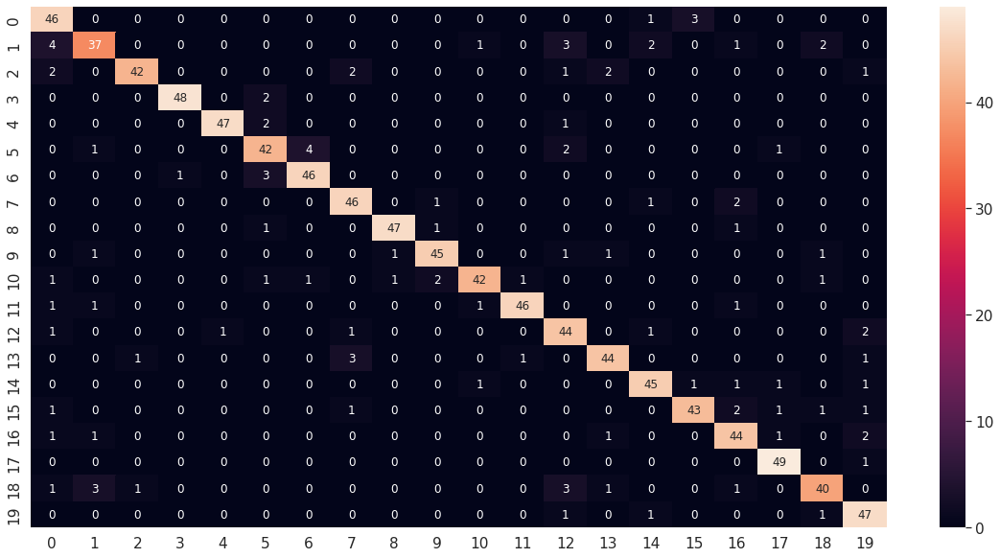

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_8_df_CM = pd.DataFrame(deepid_model_vgg3_8_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_8_report)

              precision    recall  f1-score   support

           1       0.79      0.92      0.85        50
           2       0.84      0.74      0.79        50
           3       0.95      0.84      0.89        50
           4       0.98      0.96      0.97        50
           5       0.98      0.94      0.96        50
           6       0.82      0.84      0.83        50
           7       0.90      0.92      0.91        50
           8       0.87      0.92      0.89        50
           9       0.96      0.94      0.95        50
          10       0.92      0.90      0.91        50
          11       0.93      0.84      0.88        50
          12       0.96      0.92      0.94        50
          13       0.79      0.88      0.83        50
          14       0.90      0.88      0.89        50
          15       0.88      0.90      0.89        50
          16       0.91      0.86      0.89        50
          17       0.83      0.88      0.85        50
          18       0.92    

#### Modelo 9: (BTH = 10, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_9 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_9 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_9)
deepid_model_vgg3_9.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_9.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_9 = deepid_model_vgg3_9.fit(new_trainX, new_trainY, batch_size=30, epochs=60, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/60
74/74 [==============================] - 1s 10ms/step - loss: 9.7481 - accuracy: 0.1724 - val_loss: 2.7290 - val_accuracy: 0.2564
Epoch 2/60
74/74 [==============================] - 1s 7ms/step - loss: 2.6395 - accuracy: 0.2851 - val_loss: 2.4537 - val_accuracy: 0.3345
Epoch 3/60
74/74 [==============================] - 1s 7ms/step - loss: 2.2892 - accuracy: 0.3693 - val_loss: 2.1109 - val_accuracy: 0.4182
Epoch 4/60
74/74 [==============================] - 1s 7ms/step - loss: 1.8106 - accuracy: 0.5193 - val_loss: 1.7024 - val_accuracy: 0.5491
Epoch 5/60
74/74 [==============================] - 1s 7ms/step - loss: 1.2850 - accuracy: 0.6471 - val_loss: 1.2429 - val_accuracy: 0.6709
Epoch 6/60
74/74 [==============================] - 1s 7ms/step - loss: 0.9160 - accuracy: 0.7490 - val_loss: 0.9629 - val_accuracy: 0.7818
Epoch 7/60
74/74 [==============================] - 1s 7ms/step - loss: 0.6382 - accuracy: 0.8367 - val_loss: 0.7594 - val_accuracy: 0.8255
Epoch 8/60
74/74 [=

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_9 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_9.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.1203 - accuracy: 0.8420


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


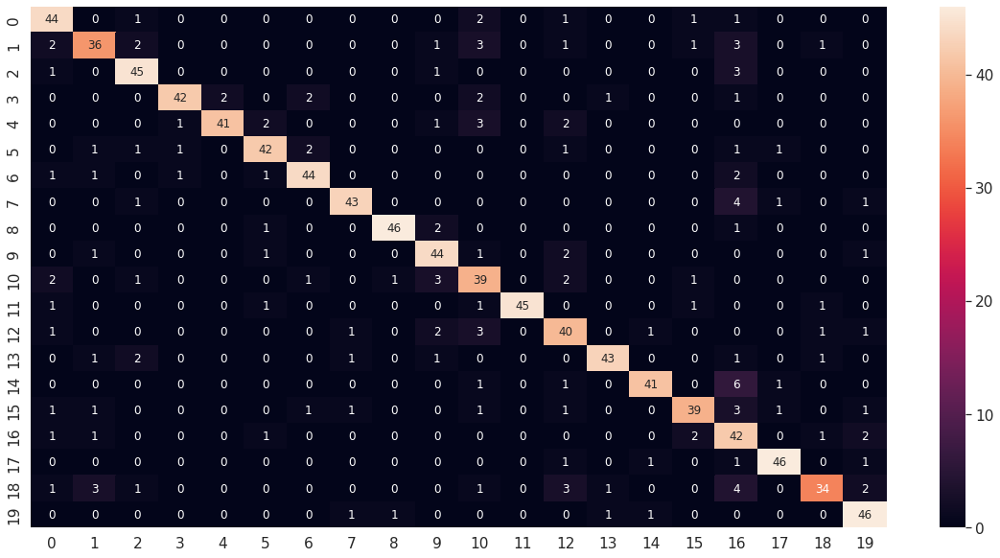

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_9_df_CM = pd.DataFrame(deepid_model_vgg3_9_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_9_report)

              precision    recall  f1-score   support

           1       0.80      0.88      0.84        50
           2       0.80      0.72      0.76        50
           3       0.83      0.90      0.87        50
           4       0.93      0.84      0.88        50
           5       0.95      0.82      0.88        50
           6       0.86      0.84      0.85        50
           7       0.88      0.88      0.88        50
           8       0.91      0.86      0.89        50
           9       0.96      0.92      0.94        50
          10       0.80      0.88      0.84        50
          11       0.68      0.78      0.73        50
          12       1.00      0.90      0.95        50
          13       0.73      0.80      0.76        50
          14       0.93      0.86      0.90        50
          15       0.93      0.82      0.87        50
          16       0.87      0.78      0.82        50
          17       0.58      0.84      0.68        50
          18       0.92    

#### Modelo 10: (BTH = 50, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_10 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_10 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_10)
deepid_model_vgg3_10.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_10.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_10 = deepid_model_vgg3_10.fit(new_trainX, new_trainY, batch_size=50, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
44/44 [==============================] - 2s 30ms/step - loss: 16.8655 - accuracy: 0.1296 - val_loss: 3.1183 - val_accuracy: 0.1273
Epoch 2/250
44/44 [==============================] - 0s 10ms/step - loss: 3.0545 - accuracy: 0.1219 - val_loss: 3.0008 - val_accuracy: 0.1364
Epoch 3/250
44/44 [==============================] - 0s 10ms/step - loss: 2.8518 - accuracy: 0.1764 - val_loss: 2.8170 - val_accuracy: 0.2200
Epoch 4/250
44/44 [==============================] - 0s 9ms/step - loss: 2.6530 - accuracy: 0.2524 - val_loss: 2.6650 - val_accuracy: 0.2309
Epoch 5/250
44/44 [==============================] - 0s 9ms/step - loss: 2.5092 - accuracy: 0.2660 - val_loss: 2.5564 - val_accuracy: 0.2709
Epoch 6/250
44/44 [==============================] - 0s 9ms/step - loss: 2.3589 - accuracy: 0.3256 - val_loss: 2.4096 - val_accuracy: 0.3182
Epoch 7/250
44/44 [==============================] - 0s 9ms/step - loss: 2.2277 - accuracy: 0.3597 - val_loss: 2.3099 - val_accuracy: 0.3473
Epoch 8/2

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_10 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_10.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7728 - accuracy: 0.8800


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


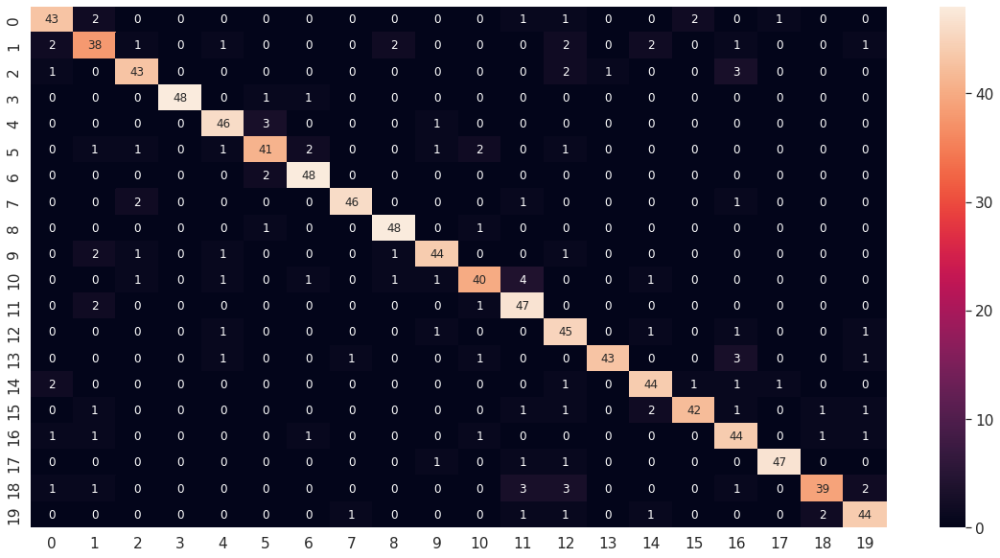

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_10_df_CM = pd.DataFrame(deepid_model_vgg3_10_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_10_report)

              precision    recall  f1-score   support

           1       0.86      0.86      0.86        50
           2       0.79      0.76      0.78        50
           3       0.88      0.86      0.87        50
           4       1.00      0.96      0.98        50
           5       0.88      0.92      0.90        50
           6       0.85      0.82      0.84        50
           7       0.91      0.96      0.93        50
           8       0.96      0.92      0.94        50
           9       0.92      0.96      0.94        50
          10       0.90      0.88      0.89        50
          11       0.87      0.80      0.83        50
          12       0.80      0.94      0.86        50
          13       0.76      0.90      0.83        50
          14       0.98      0.86      0.91        50
          15       0.86      0.88      0.87        50
          16       0.93      0.84      0.88        50
          17       0.79      0.88      0.83        50
          18       0.96    

#### Modelo 11: (BTH = 40, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_11 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_11 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_11)
deepid_model_vgg3_11.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_11.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_11 = deepid_model_vgg3_11.fit(new_trainX, new_trainY, batch_size=40, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
55/55 [==============================] - 1s 13ms/step - loss: 14.7040 - accuracy: 0.1760 - val_loss: 2.8992 - val_accuracy: 0.2455
Epoch 2/250
55/55 [==============================] - 0s 8ms/step - loss: 2.6652 - accuracy: 0.2838 - val_loss: 2.6016 - val_accuracy: 0.3000
Epoch 3/250
55/55 [==============================] - 0s 8ms/step - loss: 2.3660 - accuracy: 0.3270 - val_loss: 2.2974 - val_accuracy: 0.3691
Epoch 4/250
55/55 [==============================] - 0s 8ms/step - loss: 2.1151 - accuracy: 0.3638 - val_loss: 2.0063 - val_accuracy: 0.4255
Epoch 5/250
55/55 [==============================] - 0s 8ms/step - loss: 1.8464 - accuracy: 0.4420 - val_loss: 1.8033 - val_accuracy: 0.4655
Epoch 6/250
55/55 [==============================] - 0s 8ms/step - loss: 1.6432 - accuracy: 0.4907 - val_loss: 1.7135 - val_accuracy: 0.4800
Epoch 7/250
55/55 [==============================] - 0s 9ms/step - loss: 1.4928 - accuracy: 0.5025 - val_loss: 1.6442 - val_accuracy: 0.5182
Epoch 8/250

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_11 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_11.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8466 - accuracy: 0.8790


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


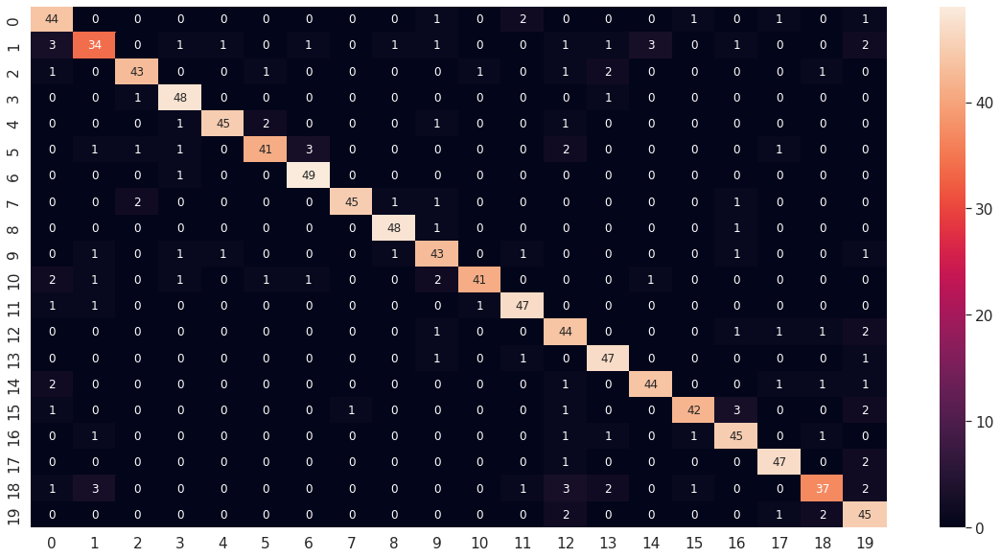

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_11_df_CM = pd.DataFrame(deepid_model_vgg3_11_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_11_report)

              precision    recall  f1-score   support

           1       0.80      0.88      0.84        50
           2       0.81      0.68      0.74        50
           3       0.91      0.86      0.89        50
           4       0.89      0.96      0.92        50
           5       0.96      0.90      0.93        50
           6       0.91      0.82      0.86        50
           7       0.91      0.98      0.94        50
           8       0.98      0.90      0.94        50
           9       0.94      0.96      0.95        50
          10       0.83      0.86      0.84        50
          11       0.95      0.82      0.88        50
          12       0.90      0.94      0.92        50
          13       0.76      0.88      0.81        50
          14       0.87      0.94      0.90        50
          15       0.92      0.88      0.90        50
          16       0.93      0.84      0.88        50
          17       0.85      0.90      0.87        50
          18       0.90    

#### Modelo 12: (BTH = 30, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_12 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_12 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_12)
deepid_model_vgg3_12.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_12.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_12.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_12 = deepid_model_vgg3_12.fit(new_trainX, new_trainY, batch_size=30, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
74/74 [==============================] - 1s 12ms/step - loss: 12.1457 - accuracy: 0.1132 - val_loss: 2.9201 - val_accuracy: 0.1564
Epoch 2/200
74/74 [==============================] - 1s 7ms/step - loss: 2.7760 - accuracy: 0.2692 - val_loss: 2.6558 - val_accuracy: 0.2709
Epoch 3/200
74/74 [==============================] - 1s 7ms/step - loss: 2.5201 - accuracy: 0.3097 - val_loss: 2.4363 - val_accuracy: 0.2891
Epoch 4/200
74/74 [==============================] - 1s 7ms/step - loss: 2.1606 - accuracy: 0.3643 - val_loss: 2.1677 - val_accuracy: 0.3509
Epoch 5/200
74/74 [==============================] - 1s 7ms/step - loss: 1.8758 - accuracy: 0.4143 - val_loss: 1.9186 - val_accuracy: 0.4091
Epoch 6/200
74/74 [==============================] - 1s 7ms/step - loss: 1.4857 - accuracy: 0.5398 - val_loss: 1.5446 - val_accuracy: 0.5636
Epoch 7/200
74/74 [==============================] - 1s 7ms/step - loss: 1.1976 - accuracy: 0.6421 - val_loss: 1.3224 - val_accuracy: 0.6291
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_12 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_12.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.9901 - accuracy: 0.8600


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


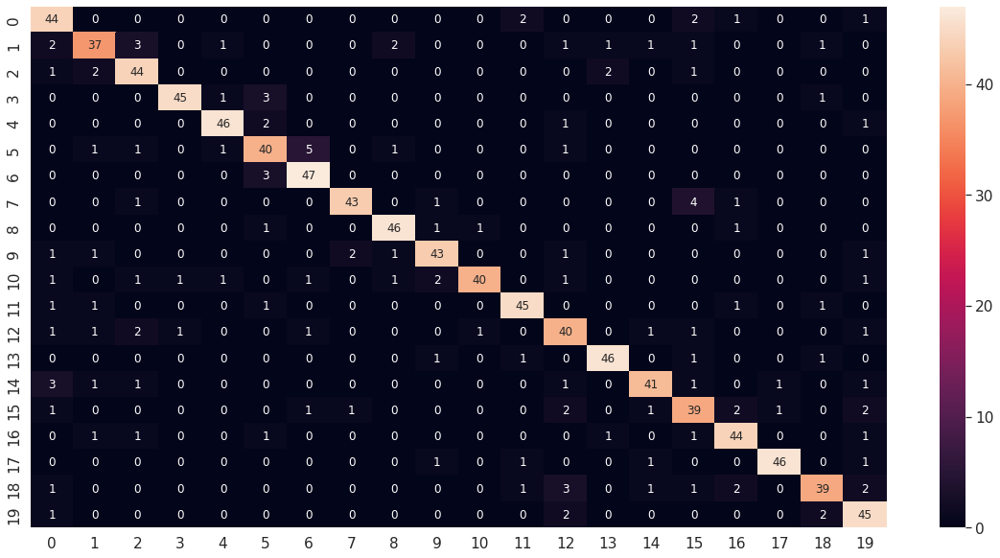

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_12_df_CM = pd.DataFrame(deepid_model_vgg3_12_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_12_report)

              precision    recall  f1-score   support

           1       0.77      0.88      0.82        50
           2       0.82      0.74      0.78        50
           3       0.81      0.88      0.85        50
           4       0.96      0.90      0.93        50
           5       0.92      0.92      0.92        50
           6       0.78      0.80      0.79        50
           7       0.85      0.94      0.90        50
           8       0.93      0.86      0.90        50
           9       0.90      0.92      0.91        50
          10       0.88      0.86      0.87        50
          11       0.95      0.80      0.87        50
          12       0.90      0.90      0.90        50
          13       0.75      0.80      0.78        50
          14       0.92      0.92      0.92        50
          15       0.89      0.82      0.85        50
          16       0.75      0.78      0.76        50
          17       0.85      0.88      0.86        50
          18       0.96    

#### Modelo 13: (BTH = 10, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_13 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_13 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_13)
deepid_model_vgg3_13.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_13.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_13.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_13 = deepid_model_vgg3_13.fit(new_trainX, new_trainY, batch_size=10, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
220/220 [==============================] - 2s 5ms/step - loss: 6.2449 - accuracy: 0.2337 - val_loss: 2.2374 - val_accuracy: 0.3945
Epoch 2/250
220/220 [==============================] - 1s 5ms/step - loss: 1.7079 - accuracy: 0.5261 - val_loss: 1.4718 - val_accuracy: 0.6436
Epoch 3/250
220/220 [==============================] - 1s 5ms/step - loss: 1.0174 - accuracy: 0.7381 - val_loss: 1.0179 - val_accuracy: 0.7436
Epoch 4/250
220/220 [==============================] - 1s 5ms/step - loss: 0.6896 - accuracy: 0.8304 - val_loss: 0.8837 - val_accuracy: 0.7964
Epoch 5/250
220/220 [==============================] - 1s 5ms/step - loss: 0.4563 - accuracy: 0.8868 - val_loss: 0.6172 - val_accuracy: 0.8764
Epoch 6/250
220/220 [==============================] - 1s 5ms/step - loss: 0.2330 - accuracy: 0.9482 - val_loss: 0.5889 - val_accuracy: 0.8909
Epoch 7/250
220/220 [==============================] - 1s 5ms/step - loss: 0.1491 - accuracy: 0.9704 - val_loss: 0.4253 - val_accuracy: 0.9291

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_13 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_13.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8890 - accuracy: 0.8680


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


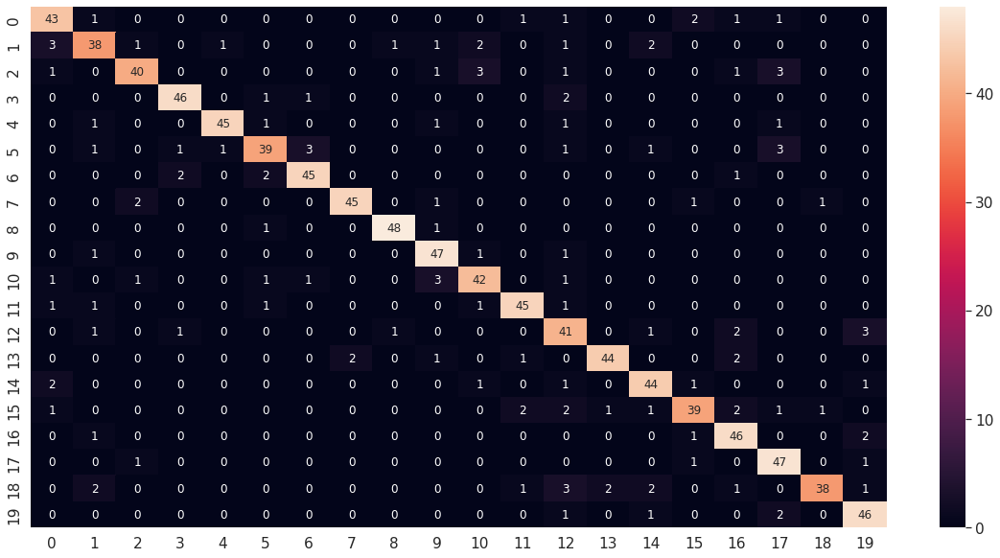

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_13_df_CM = pd.DataFrame(deepid_model_vgg3_13_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_13_report)

              precision    recall  f1-score   support

           1       0.83      0.86      0.84        50
           2       0.81      0.76      0.78        50
           3       0.89      0.80      0.84        50
           4       0.92      0.92      0.92        50
           5       0.96      0.90      0.93        50
           6       0.85      0.78      0.81        50
           7       0.90      0.90      0.90        50
           8       0.96      0.90      0.93        50
           9       0.96      0.96      0.96        50
          10       0.84      0.94      0.89        50
          11       0.84      0.84      0.84        50
          12       0.90      0.90      0.90        50
          13       0.71      0.82      0.76        50
          14       0.94      0.88      0.91        50
          15       0.85      0.88      0.86        50
          16       0.87      0.78      0.82        50
          17       0.82      0.92      0.87        50
          18       0.81    

#### Modelo 14: (BTH = 20, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_14 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_14 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_14)
deepid_model_vgg3_14.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_14.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_14.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_14 = deepid_model_vgg3_14.fit(new_trainX, new_trainY, batch_size=20, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
110/110 [==============================] - 2s 8ms/step - loss: 8.1915 - accuracy: 0.1555 - val_loss: 2.6837 - val_accuracy: 0.2273
Epoch 2/250
110/110 [==============================] - 1s 7ms/step - loss: 2.5890 - accuracy: 0.2615 - val_loss: 2.3545 - val_accuracy: 0.3055
Epoch 3/250
110/110 [==============================] - 1s 6ms/step - loss: 2.3420 - accuracy: 0.3179 - val_loss: 2.1186 - val_accuracy: 0.3709
Epoch 4/250
110/110 [==============================] - 1s 6ms/step - loss: 2.0912 - accuracy: 0.3793 - val_loss: 1.8854 - val_accuracy: 0.4582
Epoch 5/250
110/110 [==============================] - 1s 6ms/step - loss: 1.8367 - accuracy: 0.4648 - val_loss: 1.6995 - val_accuracy: 0.5145
Epoch 6/250
110/110 [==============================] - 1s 6ms/step - loss: 1.6572 - accuracy: 0.5020 - val_loss: 1.5362 - val_accuracy: 0.5600
Epoch 7/250
110/110 [==============================] - 1s 6ms/step - loss: 1.4551 - accuracy: 0.5534 - val_loss: 1.3256 - val_accuracy: 0.6036

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_14 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_14.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.1146 - accuracy: 0.8810


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


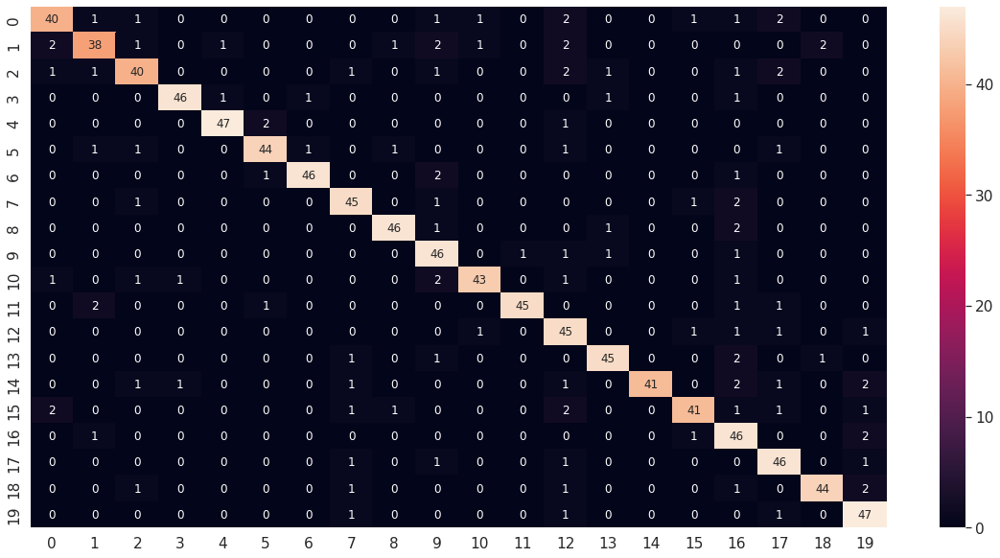

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_14_df_CM = pd.DataFrame(deepid_model_vgg3_14_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_14_report)

              precision    recall  f1-score   support

           1       0.87      0.80      0.83        50
           2       0.86      0.76      0.81        50
           3       0.85      0.80      0.82        50
           4       0.96      0.92      0.94        50
           5       0.96      0.94      0.95        50
           6       0.92      0.88      0.90        50
           7       0.96      0.92      0.94        50
           8       0.87      0.90      0.88        50
           9       0.94      0.92      0.93        50
          10       0.79      0.92      0.85        50
          11       0.93      0.86      0.90        50
          12       0.98      0.90      0.94        50
          13       0.74      0.90      0.81        50
          14       0.92      0.90      0.91        50
          15       1.00      0.82      0.90        50
          16       0.91      0.82      0.86        50
          17       0.72      0.92      0.81        50
          18       0.82    

#### Modelo 15: (BTH = 50, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg3_15 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg3_15 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg3_15)
deepid_model_vgg3_15.summary()

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg3_15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_15.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg3_15 = deepid_model_vgg3_15.fit(new_trainX, new_trainY, batch_size=50, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
44/44 [==============================] - 1s 13ms/step - loss: 19.6678 - accuracy: 0.0728 - val_loss: 3.1598 - val_accuracy: 0.0855
Epoch 2/200
44/44 [==============================] - 0s 9ms/step - loss: 3.0703 - accuracy: 0.1260 - val_loss: 2.8852 - val_accuracy: 0.1673
Epoch 3/200
44/44 [==============================] - 0s 9ms/step - loss: 2.8040 - accuracy: 0.1855 - val_loss: 2.6212 - val_accuracy: 0.2473
Epoch 4/200
44/44 [==============================] - 0s 9ms/step - loss: 2.5416 - accuracy: 0.2715 - val_loss: 2.4563 - val_accuracy: 0.2745
Epoch 5/200
44/44 [==============================] - 0s 9ms/step - loss: 2.2869 - accuracy: 0.3388 - val_loss: 2.1721 - val_accuracy: 0.3836
Epoch 6/200
44/44 [==============================] - 0s 8ms/step - loss: 2.0313 - accuracy: 0.4343 - val_loss: 1.9612 - val_accuracy: 0.4400
Epoch 7/200
44/44 [==============================] - 0s 9ms/step - loss: 1.8764 - accuracy: 0.4684 - val_loss: 1.8555 - val_accuracy: 0.4582
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg3_15 = load_model(path + 'data_reconocimiento3/models_VGG3/deepid_model_VGG3_15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg3_15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg3_15.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.3111 - accuracy: 0.8500


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg3_15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg3_15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


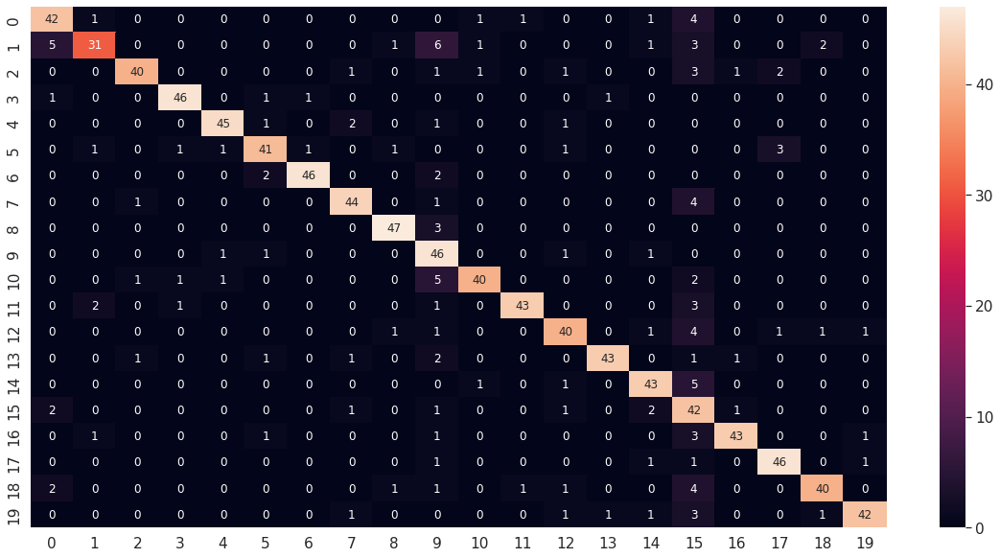

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg3_15_df_CM = pd.DataFrame(deepid_model_vgg3_15_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg3_15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg3_15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg3_15_report)

              precision    recall  f1-score   support

           1       0.81      0.84      0.82        50
           2       0.86      0.62      0.72        50
           3       0.93      0.80      0.86        50
           4       0.94      0.92      0.93        50
           5       0.94      0.90      0.92        50
           6       0.85      0.82      0.84        50
           7       0.96      0.92      0.94        50
           8       0.88      0.88      0.88        50
           9       0.92      0.94      0.93        50
          10       0.63      0.92      0.75        50
          11       0.91      0.80      0.85        50
          12       0.96      0.86      0.91        50
          13       0.83      0.80      0.82        50
          14       0.96      0.86      0.91        50
          15       0.84      0.86      0.85        50
          16       0.51      0.84      0.64        50
          17       0.93      0.86      0.90        50
          18       0.88    

## 10. Modelos con base de datos VGG-Indian para condiciones de etnia

#### Modelo 1: (BTH = 30, EHS = 70, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_1 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_1 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_1)
deepid_model_vgg4_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)  
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_1.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_1.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_1 = deepid_model_vgg4_1.fit(new_trainX, new_trainY, batch_size=30, epochs=70, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/70
72/72 [==============================] - 12s 16ms/step - loss: 3.2790 - accuracy: 0.0816 - val_loss: 3.0362 - val_accuracy: 0.1630
Epoch 2/70
72/72 [==============================] - 1s 7ms/step - loss: 2.6290 - accuracy: 0.2393 - val_loss: 2.2062 - val_accuracy: 0.3815
Epoch 3/70
72/72 [==============================] - 0s 6ms/step - loss: 1.9297 - accuracy: 0.4420 - val_loss: 1.7873 - val_accuracy: 0.4815
Epoch 4/70
72/72 [==============================] - 1s 9ms/step - loss: 1.4524 - accuracy: 0.5928 - val_loss: 1.5246 - val_accuracy: 0.5481
Epoch 5/70
72/72 [==============================] - 1s 9ms/step - loss: 1.1512 - accuracy: 0.6869 - val_loss: 1.4452 - val_accuracy: 0.5815
Epoch 6/70
72/72 [==============================] - 1s 9ms/step - loss: 0.9354 - accuracy: 0.7352 - val_loss: 1.1536 - val_accuracy: 0.6667
Epoch 7/70
72/72 [==============================] - 1s 9ms/step - loss: 0.7693 - accuracy: 0.7857 - val_loss: 1.1264 - val_accuracy: 0.6870
Epoch 8/70
72/72 [

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_1 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_1.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_1.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_1.evaluate(testX, testY)

32/32 [==============================] - 0s 5ms/step - loss: 0.9540 - accuracy: 0.8450


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_1.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_1_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


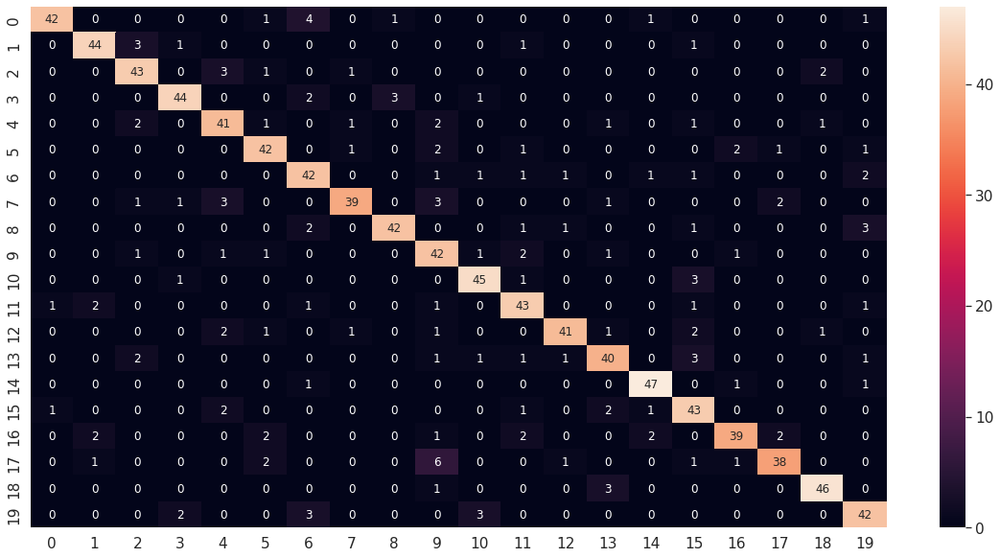

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_1_df_CM = pd.DataFrame(deepid_model_vgg4_1_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_1_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_1_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_1_report)

              precision    recall  f1-score   support

           1       0.95      0.84      0.89        50
           2       0.90      0.88      0.89        50
           3       0.83      0.86      0.84        50
           4       0.90      0.88      0.89        50
           5       0.79      0.82      0.80        50
           6       0.82      0.84      0.83        50
           7       0.76      0.84      0.80        50
           8       0.91      0.78      0.84        50
           9       0.91      0.84      0.87        50
          10       0.69      0.84      0.76        50
          11       0.87      0.90      0.88        50
          12       0.80      0.86      0.83        50
          13       0.91      0.82      0.86        50
          14       0.82      0.80      0.81        50
          15       0.90      0.94      0.92        50
          16       0.75      0.86      0.80        50
          17       0.89      0.78      0.83        50
          18       0.88    

#### Modelo 2: (BTH = 30, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_2 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_2 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_2)
deepid_model_vgg4_2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.Random(10).shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_2.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_2.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_2 = deepid_model_vgg4_2.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
72/72 [==============================] - 1s 10ms/step - loss: 4.8690 - accuracy: 0.2236 - val_loss: 2.4658 - val_accuracy: 0.3648
Epoch 2/150
72/72 [==============================] - 0s 7ms/step - loss: 1.7842 - accuracy: 0.5436 - val_loss: 1.7913 - val_accuracy: 0.5259
Epoch 3/150
72/72 [==============================] - 1s 7ms/step - loss: 1.0408 - accuracy: 0.7468 - val_loss: 1.3724 - val_accuracy: 0.6556
Epoch 4/150
72/72 [==============================] - 0s 7ms/step - loss: 0.6068 - accuracy: 0.8720 - val_loss: 1.2794 - val_accuracy: 0.7019
Epoch 5/150
72/72 [==============================] - 0s 7ms/step - loss: 0.3820 - accuracy: 0.9420 - val_loss: 1.1955 - val_accuracy: 0.7278
Epoch 6/150
72/72 [==============================] - 0s 7ms/step - loss: 0.2646 - accuracy: 0.9768 - val_loss: 1.0946 - val_accuracy: 0.7722
Epoch 7/150
72/72 [==============================] - 0s 6ms/step - loss: 0.1967 - accuracy: 0.9958 - val_loss: 1.1241 - val_accuracy: 0.7778
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_2 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_2.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_2.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_2.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8396 - accuracy: 0.8380


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_2.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_2_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


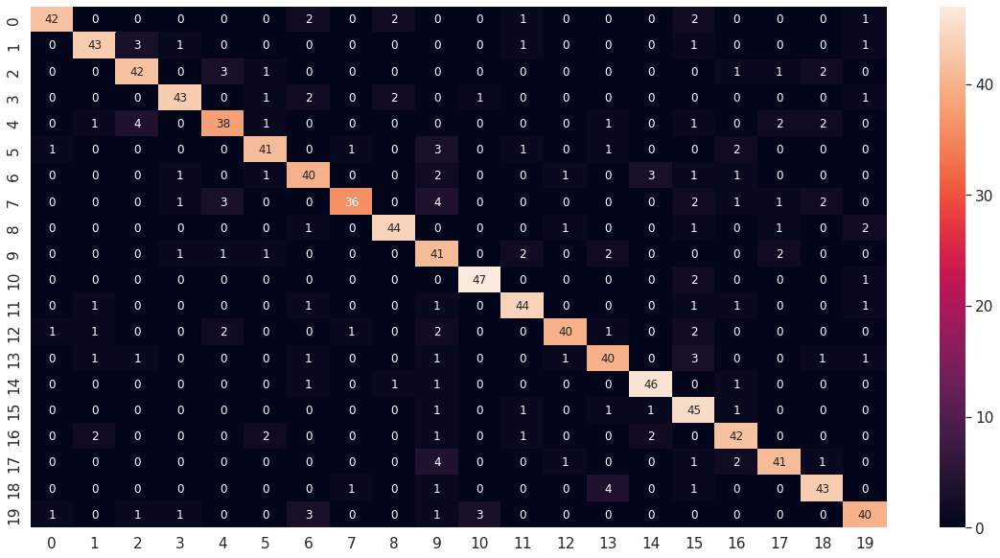

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_2_df_CM = pd.DataFrame(deepid_model_vgg4_2_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_2_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_2_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_2_report)

              precision    recall  f1-score   support

           1       0.93      0.84      0.88        50
           2       0.88      0.86      0.87        50
           3       0.82      0.84      0.83        50
           4       0.90      0.86      0.88        50
           5       0.81      0.76      0.78        50
           6       0.85      0.82      0.84        50
           7       0.78      0.80      0.79        50
           8       0.92      0.72      0.81        50
           9       0.90      0.88      0.89        50
          10       0.65      0.82      0.73        50
          11       0.92      0.94      0.93        50
          12       0.86      0.88      0.87        50
          13       0.91      0.80      0.85        50
          14       0.80      0.80      0.80        50
          15       0.88      0.92      0.90        50
          16       0.71      0.90      0.80        50
          17       0.81      0.84      0.82        50
          18       0.85    

#### Modelo 3: (BTH = 40, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_3 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_3 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_3)
deepid_model_vgg4_3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_3.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_3.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_3 = deepid_model_vgg4_3.fit(new_trainX, new_trainY, batch_size=40, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
54/54 [==============================] - 2s 18ms/step - loss: 10.8679 - accuracy: 0.2199 - val_loss: 2.8224 - val_accuracy: 0.3000
Epoch 2/100
54/54 [==============================] - 1s 9ms/step - loss: 2.1601 - accuracy: 0.4559 - val_loss: 1.8837 - val_accuracy: 0.5389
Epoch 3/100
54/54 [==============================] - 0s 9ms/step - loss: 1.3784 - accuracy: 0.6582 - val_loss: 1.3785 - val_accuracy: 0.6815
Epoch 4/100
54/54 [==============================] - 0s 9ms/step - loss: 0.8767 - accuracy: 0.7950 - val_loss: 1.1336 - val_accuracy: 0.7463
Epoch 5/100
54/54 [==============================] - 0s 9ms/step - loss: 0.5733 - accuracy: 0.8776 - val_loss: 0.9482 - val_accuracy: 0.7833
Epoch 6/100
54/54 [==============================] - 1s 9ms/step - loss: 0.3864 - accuracy: 0.9365 - val_loss: 0.8870 - val_accuracy: 0.8019
Epoch 7/100
54/54 [==============================] - 1s 10ms/step - loss: 0.2720 - accuracy: 0.9726 - val_loss: 0.8347 - val_accuracy: 0.8278
Epoch 8/10

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_3 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_3.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_3.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_3.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8456 - accuracy: 0.8510


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_3.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_3_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


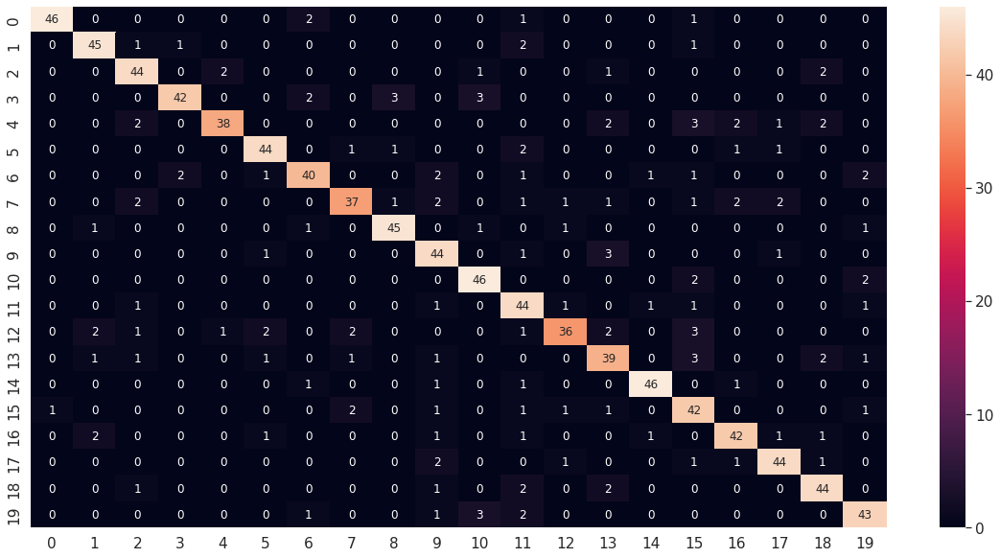

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_3_df_CM = pd.DataFrame(deepid_model_vgg4_3_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_3_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_3_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_3_report)

              precision    recall  f1-score   support

           1       0.98      0.92      0.95        50
           2       0.88      0.90      0.89        50
           3       0.83      0.88      0.85        50
           4       0.93      0.84      0.88        50
           5       0.93      0.76      0.84        50
           6       0.88      0.88      0.88        50
           7       0.85      0.80      0.82        50
           8       0.86      0.74      0.80        50
           9       0.90      0.90      0.90        50
          10       0.77      0.88      0.82        50
          11       0.85      0.92      0.88        50
          12       0.73      0.88      0.80        50
          13       0.88      0.72      0.79        50
          14       0.76      0.78      0.77        50
          15       0.94      0.92      0.93        50
          16       0.71      0.84      0.77        50
          17       0.86      0.84      0.85        50
          18       0.88    

#### Modelo 4: (BTH = 20, EHS = 100, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_4 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_4 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_4)
deepid_model_vgg4_4.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_4.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_4.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_4 = deepid_model_vgg4_4.fit(new_trainX, new_trainY, batch_size=20, epochs=100, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/100
108/108 [==============================] - 2s 9ms/step - loss: 6.8056 - accuracy: 0.1164 - val_loss: 2.8963 - val_accuracy: 0.1741
Epoch 2/100
108/108 [==============================] - 1s 6ms/step - loss: 2.4809 - accuracy: 0.2704 - val_loss: 2.0813 - val_accuracy: 0.4204
Epoch 3/100
108/108 [==============================] - 1s 6ms/step - loss: 1.3635 - accuracy: 0.6095 - val_loss: 1.2752 - val_accuracy: 0.6556
Epoch 4/100
108/108 [==============================] - 1s 6ms/step - loss: 0.6917 - accuracy: 0.8256 - val_loss: 0.8330 - val_accuracy: 0.7963
Epoch 5/100
108/108 [==============================] - 1s 6ms/step - loss: 0.3613 - accuracy: 0.9198 - val_loss: 0.6204 - val_accuracy: 0.8426
Epoch 6/100
108/108 [==============================] - 1s 6ms/step - loss: 0.2136 - accuracy: 0.9694 - val_loss: 0.5475 - val_accuracy: 0.8833
Epoch 7/100
108/108 [==============================] - 1s 6ms/step - loss: 0.1413 - accuracy: 0.9935 - val_loss: 0.5030 - val_accuracy: 0.8870

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_4 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_4.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_4.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_4.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8297 - accuracy: 0.8480


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_4.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_4_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


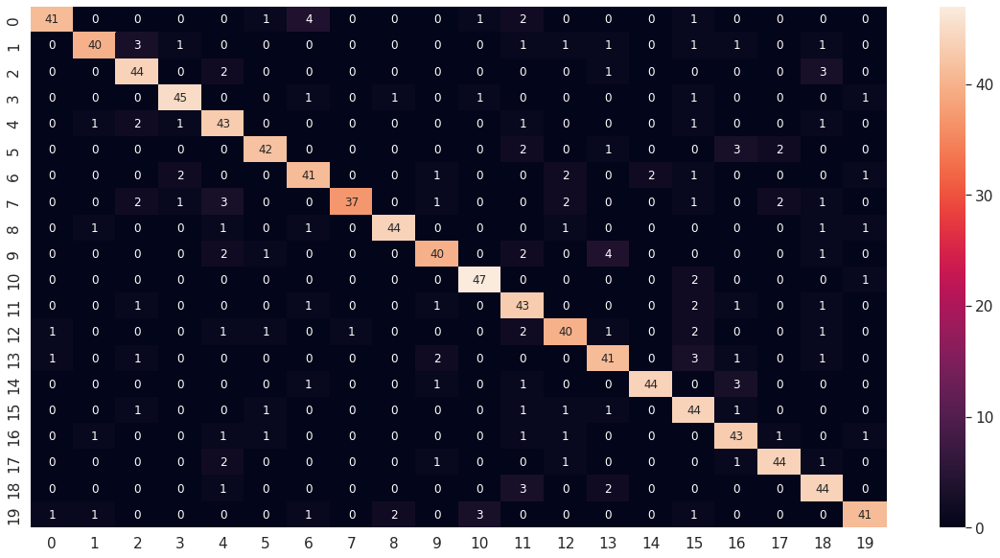

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_4_df_CM = pd.DataFrame(deepid_model_vgg4_4_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_4_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_4_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_4_report)

              precision    recall  f1-score   support

           1       0.93      0.82      0.87        50
           2       0.91      0.80      0.85        50
           3       0.81      0.88      0.85        50
           4       0.90      0.90      0.90        50
           5       0.77      0.86      0.81        50
           6       0.89      0.84      0.87        50
           7       0.82      0.82      0.82        50
           8       0.97      0.74      0.84        50
           9       0.94      0.88      0.91        50
          10       0.85      0.80      0.82        50
          11       0.90      0.94      0.92        50
          12       0.73      0.86      0.79        50
          13       0.82      0.80      0.81        50
          14       0.79      0.82      0.80        50
          15       0.96      0.88      0.92        50
          16       0.73      0.88      0.80        50
          17       0.80      0.86      0.83        50
          18       0.90    

#### Modelo 5: (BTH = 30, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_5 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_5 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_5)
deepid_model_vgg4_5.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_5.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_5.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_5 = deepid_model_vgg4_5.fit(new_trainX, new_trainY, batch_size=30, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
72/72 [==============================] - 2s 13ms/step - loss: 7.0365 - accuracy: 0.1456 - val_loss: 2.6736 - val_accuracy: 0.2611
Epoch 2/200
72/72 [==============================] - 1s 8ms/step - loss: 2.3314 - accuracy: 0.3349 - val_loss: 2.0023 - val_accuracy: 0.4481
Epoch 3/200
72/72 [==============================] - 1s 8ms/step - loss: 1.5251 - accuracy: 0.5631 - val_loss: 1.1630 - val_accuracy: 0.6648
Epoch 4/200
72/72 [==============================] - 1s 8ms/step - loss: 0.8542 - accuracy: 0.7570 - val_loss: 0.8257 - val_accuracy: 0.7796
Epoch 5/200
72/72 [==============================] - 1s 8ms/step - loss: 0.4634 - accuracy: 0.8938 - val_loss: 0.6813 - val_accuracy: 0.8241
Epoch 6/200
72/72 [==============================] - 1s 8ms/step - loss: 0.2776 - accuracy: 0.9522 - val_loss: 0.6021 - val_accuracy: 0.8519
Epoch 7/200
72/72 [==============================] - 1s 8ms/step - loss: 0.1878 - accuracy: 0.9777 - val_loss: 0.5245 - val_accuracy: 0.8704
Epoch 8/200


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_5 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_5.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_5.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_5.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8806 - accuracy: 0.8510


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_5.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_5_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


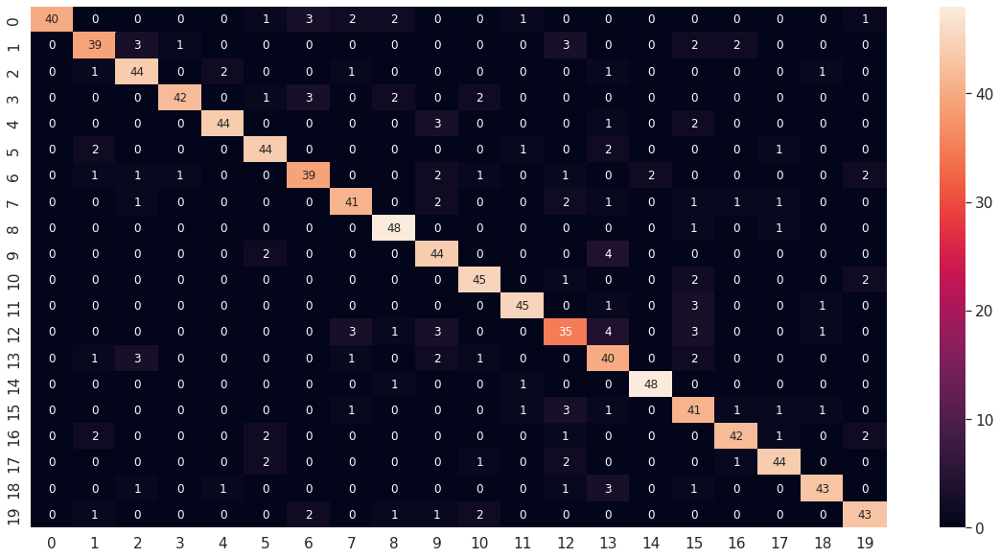

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_5_df_CM = pd.DataFrame(deepid_model_vgg4_5_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_5_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_5_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_5_report)

              precision    recall  f1-score   support

           1       1.00      0.80      0.89        50
           2       0.83      0.78      0.80        50
           3       0.83      0.88      0.85        50
           4       0.95      0.84      0.89        50
           5       0.94      0.88      0.91        50
           6       0.85      0.88      0.86        50
           7       0.83      0.78      0.80        50
           8       0.84      0.82      0.83        50
           9       0.87      0.96      0.91        50
          10       0.77      0.88      0.82        50
          11       0.87      0.90      0.88        50
          12       0.92      0.90      0.91        50
          13       0.71      0.70      0.71        50
          14       0.69      0.80      0.74        50
          15       0.96      0.96      0.96        50
          16       0.71      0.82      0.76        50
          17       0.89      0.84      0.87        50
          18       0.90    

#### Modelo 6: (BTH = 50, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_6 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_6 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_6)
deepid_model_vgg4_6.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_6.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_6.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_6 = deepid_model_vgg4_6.fit(new_trainX, new_trainY, batch_size=30, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
72/72 [==============================] - 1s 10ms/step - loss: 9.0156 - accuracy: 0.1475 - val_loss: 2.6561 - val_accuracy: 0.2407
Epoch 2/150
72/72 [==============================] - 0s 7ms/step - loss: 2.4513 - accuracy: 0.2890 - val_loss: 2.2833 - val_accuracy: 0.3426
Epoch 3/150
72/72 [==============================] - 0s 7ms/step - loss: 2.0300 - accuracy: 0.4290 - val_loss: 1.9055 - val_accuracy: 0.4778
Epoch 4/150
72/72 [==============================] - 0s 7ms/step - loss: 1.5173 - accuracy: 0.5775 - val_loss: 1.4747 - val_accuracy: 0.6019
Epoch 5/150
72/72 [==============================] - 0s 7ms/step - loss: 1.0192 - accuracy: 0.7194 - val_loss: 1.1513 - val_accuracy: 0.7019
Epoch 6/150
72/72 [==============================] - 0s 7ms/step - loss: 0.6581 - accuracy: 0.8251 - val_loss: 0.8891 - val_accuracy: 0.7778
Epoch 7/150
72/72 [==============================] - 0s 7ms/step - loss: 0.4383 - accuracy: 0.8998 - val_loss: 0.8067 - val_accuracy: 0.8185
Epoch 8/150


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_6 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_6.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_6.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_6.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 0.7839 - accuracy: 0.8540


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_6.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_6_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


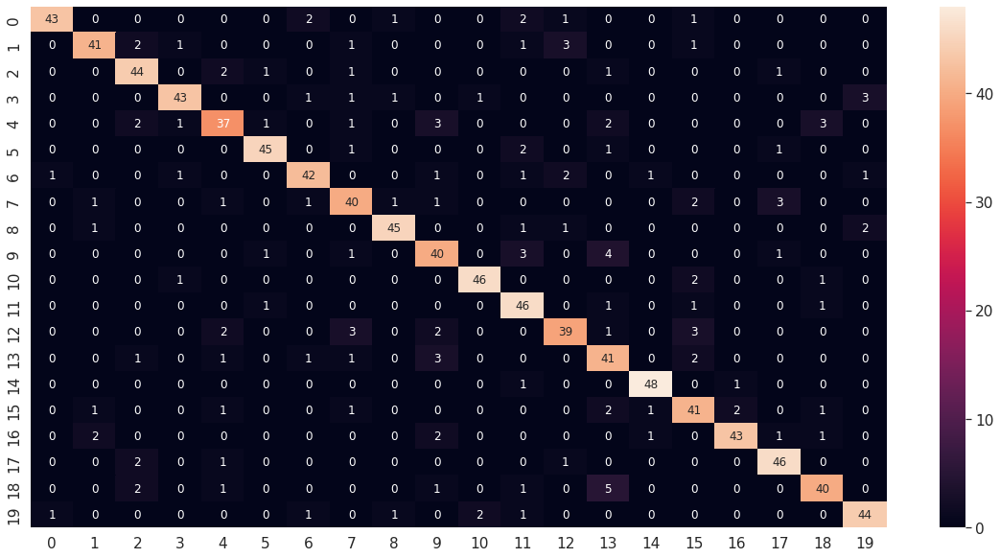

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_6_df_CM = pd.DataFrame(deepid_model_vgg4_6_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_6_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_6_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_6_report)

              precision    recall  f1-score   support

           1       0.96      0.86      0.91        50
           2       0.89      0.82      0.85        50
           3       0.83      0.88      0.85        50
           4       0.91      0.86      0.89        50
           5       0.80      0.74      0.77        50
           6       0.92      0.90      0.91        50
           7       0.88      0.84      0.86        50
           8       0.78      0.80      0.79        50
           9       0.92      0.90      0.91        50
          10       0.75      0.80      0.78        50
          11       0.94      0.92      0.93        50
          12       0.78      0.92      0.84        50
          13       0.83      0.78      0.80        50
          14       0.71      0.82      0.76        50
          15       0.94      0.96      0.95        50
          16       0.77      0.82      0.80        50
          17       0.93      0.86      0.90        50
          18       0.87    

#### Modelo 7: (BTH = 20, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_7 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_7 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_7)
deepid_model_vgg4_7.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_7.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_7.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_7 = deepid_model_vgg4_7.fit(new_trainX, new_trainY, batch_size=20, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
108/108 [==============================] - 1s 8ms/step - loss: 7.1276 - accuracy: 0.2092 - val_loss: 2.5500 - val_accuracy: 0.3130
Epoch 2/150
108/108 [==============================] - 1s 7ms/step - loss: 2.1637 - accuracy: 0.4193 - val_loss: 1.8246 - val_accuracy: 0.5019
Epoch 3/150
108/108 [==============================] - 1s 6ms/step - loss: 1.4887 - accuracy: 0.5993 - val_loss: 1.3078 - val_accuracy: 0.6611
Epoch 4/150
108/108 [==============================] - 1s 6ms/step - loss: 0.9563 - accuracy: 0.7342 - val_loss: 0.8907 - val_accuracy: 0.7667
Epoch 5/150
108/108 [==============================] - 1s 6ms/step - loss: 0.6160 - accuracy: 0.8242 - val_loss: 0.7267 - val_accuracy: 0.8093
Epoch 6/150
108/108 [==============================] - 1s 6ms/step - loss: 0.3968 - accuracy: 0.8942 - val_loss: 0.5645 - val_accuracy: 0.8574
Epoch 7/150
108/108 [==============================] - 1s 6ms/step - loss: 0.2432 - accuracy: 0.9532 - val_loss: 0.4711 - val_accuracy: 0.8889

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_7 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_7.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_7.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_7.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 0.7218 - accuracy: 0.8610


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_7.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_7_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


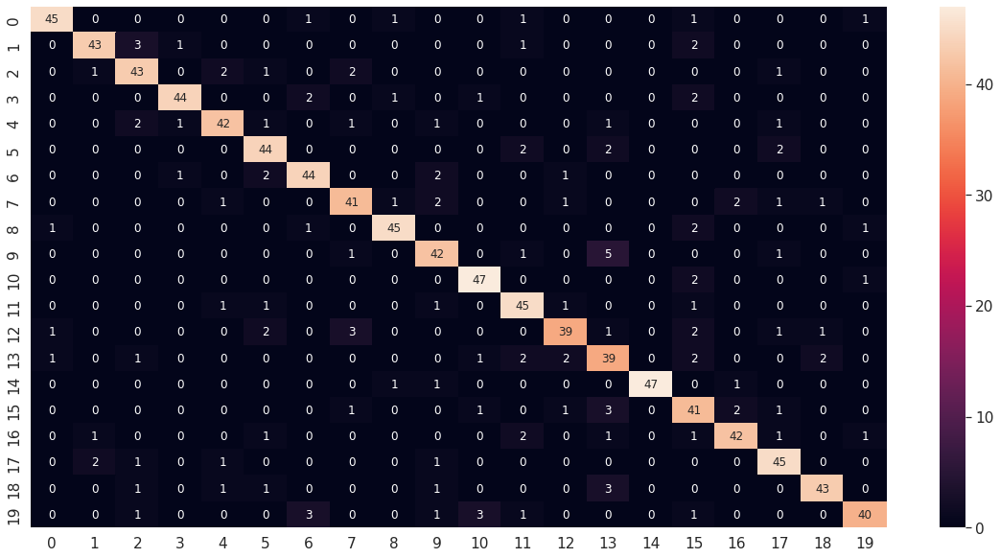

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_7_df_CM = pd.DataFrame(deepid_model_vgg4_7_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_7_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_7_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_7_report)

              precision    recall  f1-score   support

           1       0.94      0.90      0.92        50
           2       0.91      0.86      0.89        50
           3       0.83      0.86      0.84        50
           4       0.94      0.88      0.91        50
           5       0.88      0.84      0.86        50
           6       0.83      0.88      0.85        50
           7       0.86      0.88      0.87        50
           8       0.84      0.82      0.83        50
           9       0.92      0.90      0.91        50
          10       0.81      0.84      0.82        50
          11       0.89      0.94      0.91        50
          12       0.82      0.90      0.86        50
          13       0.87      0.78      0.82        50
          14       0.71      0.78      0.74        50
          15       1.00      0.94      0.97        50
          16       0.72      0.82      0.77        50
          17       0.89      0.84      0.87        50
          18       0.83    

#### Modelo 8: (BTH = 10, EHS = 150, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_8 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_8 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_8)
deepid_model_vgg4_8.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                            

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_8.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_8.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_8 = deepid_model_vgg4_8.fit(new_trainX, new_trainY, batch_size=10, epochs=150, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/150
216/216 [==============================] - 2s 8ms/step - loss: 7.8283 - accuracy: 0.0863 - val_loss: 2.9414 - val_accuracy: 0.1148
Epoch 2/150
216/216 [==============================] - 1s 5ms/step - loss: 2.9035 - accuracy: 0.1364 - val_loss: 2.9211 - val_accuracy: 0.1074
Epoch 3/150
216/216 [==============================] - 1s 5ms/step - loss: 2.6558 - accuracy: 0.2032 - val_loss: 2.6090 - val_accuracy: 0.2204
Epoch 4/150
216/216 [==============================] - 1s 5ms/step - loss: 2.3784 - accuracy: 0.2853 - val_loss: 2.2433 - val_accuracy: 0.3222
Epoch 5/150
216/216 [==============================] - 1s 5ms/step - loss: 1.9249 - accuracy: 0.4207 - val_loss: 1.8947 - val_accuracy: 0.4259
Epoch 6/150
216/216 [==============================] - 1s 5ms/step - loss: 1.5748 - accuracy: 0.5510 - val_loss: 1.6017 - val_accuracy: 0.5241
Epoch 7/150
216/216 [==============================] - 1s 6ms/step - loss: 1.2649 - accuracy: 0.6262 - val_loss: 1.3079 - val_accuracy: 0.6241

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_8 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_8.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_8.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_8.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 1.1329 - accuracy: 0.8380


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_8.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_8_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


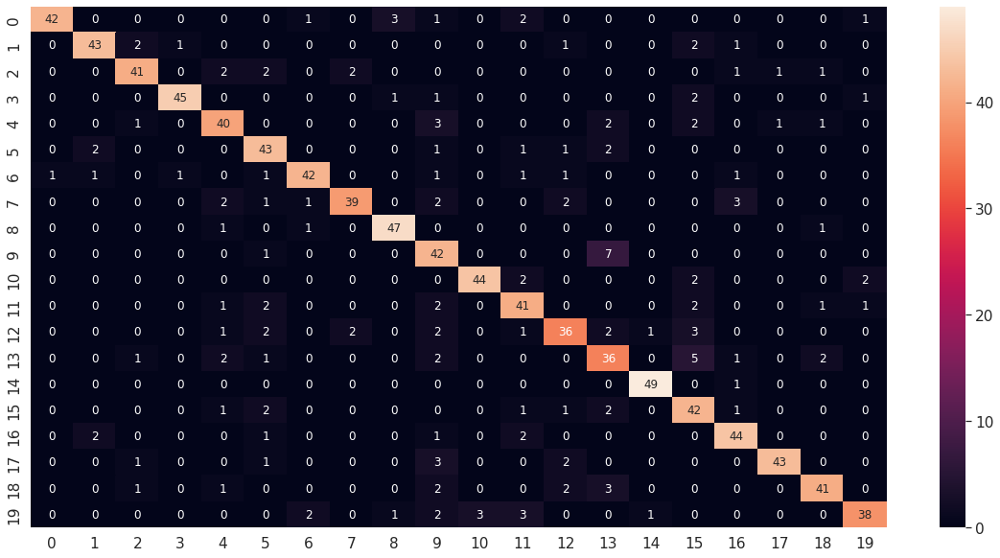

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_8_df_CM = pd.DataFrame(deepid_model_vgg4_8_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_8_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_8_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_8_report)

              precision    recall  f1-score   support

           1       0.98      0.84      0.90        50
           2       0.90      0.86      0.88        50
           3       0.87      0.82      0.85        50
           4       0.96      0.90      0.93        50
           5       0.78      0.80      0.79        50
           6       0.75      0.86      0.80        50
           7       0.89      0.84      0.87        50
           8       0.91      0.78      0.84        50
           9       0.90      0.94      0.92        50
          10       0.65      0.84      0.73        50
          11       0.94      0.88      0.91        50
          12       0.76      0.82      0.79        50
          13       0.78      0.72      0.75        50
          14       0.67      0.72      0.69        50
          15       0.96      0.98      0.97        50
          16       0.70      0.84      0.76        50
          17       0.83      0.88      0.85        50
          18       0.96    

#### Modelo 9: (BTH = 40, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_9 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_9 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_9)
deepid_model_vgg4_9.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_9.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_9.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_9 = deepid_model_vgg4_9.fit(new_trainX, new_trainY, batch_size=40, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
54/54 [==============================] - 1s 13ms/step - loss: 9.0858 - accuracy: 0.2032 - val_loss: 2.5456 - val_accuracy: 0.3204
Epoch 2/200
54/54 [==============================] - 0s 9ms/step - loss: 2.1637 - accuracy: 0.4207 - val_loss: 1.9382 - val_accuracy: 0.5389
Epoch 3/200
54/54 [==============================] - 0s 8ms/step - loss: 1.6578 - accuracy: 0.5626 - val_loss: 1.5448 - val_accuracy: 0.5667
Epoch 4/200
54/54 [==============================] - 0s 8ms/step - loss: 1.2222 - accuracy: 0.6637 - val_loss: 1.2404 - val_accuracy: 0.6870
Epoch 5/200
54/54 [==============================] - 0s 8ms/step - loss: 0.8674 - accuracy: 0.7676 - val_loss: 0.9276 - val_accuracy: 0.7833
Epoch 6/200
54/54 [==============================] - 0s 8ms/step - loss: 0.5781 - accuracy: 0.8590 - val_loss: 0.7218 - val_accuracy: 0.8407
Epoch 7/200
54/54 [==============================] - 0s 8ms/step - loss: 0.4342 - accuracy: 0.9054 - val_loss: 0.6120 - val_accuracy: 0.8556
Epoch 8/200


In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_9 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_9.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_9.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_9.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.8277 - accuracy: 0.8590


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_9.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_9_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


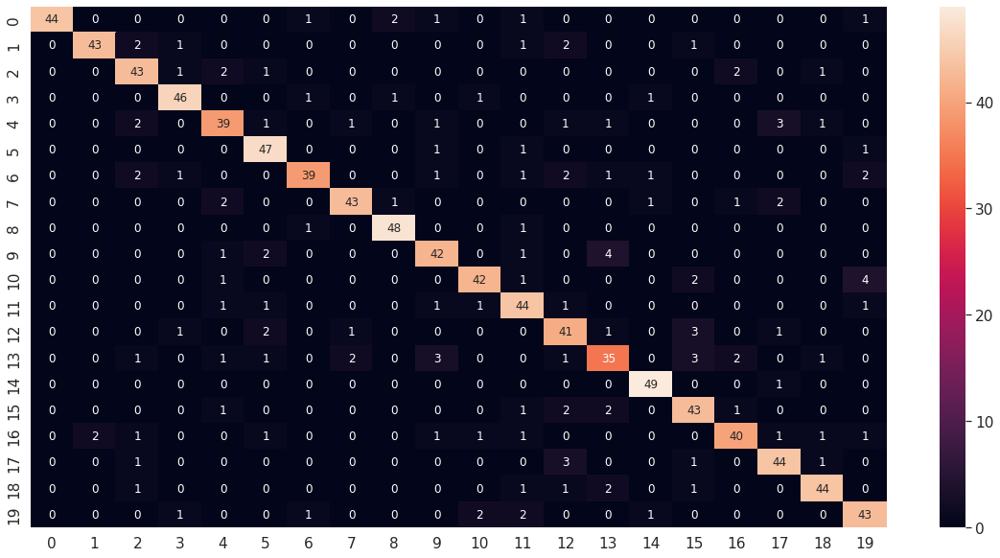

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_9_df_CM = pd.DataFrame(deepid_model_vgg4_9_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_9_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_9_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_9_report)

              precision    recall  f1-score   support

           1       1.00      0.88      0.94        50
           2       0.96      0.86      0.91        50
           3       0.81      0.86      0.83        50
           4       0.90      0.92      0.91        50
           5       0.81      0.78      0.80        50
           6       0.84      0.94      0.89        50
           7       0.91      0.78      0.84        50
           8       0.91      0.86      0.89        50
           9       0.92      0.96      0.94        50
          10       0.82      0.84      0.83        50
          11       0.89      0.84      0.87        50
          12       0.79      0.88      0.83        50
          13       0.76      0.82      0.79        50
          14       0.76      0.70      0.73        50
          15       0.92      0.98      0.95        50
          16       0.80      0.86      0.83        50
          17       0.87      0.80      0.83        50
          18       0.85    

#### Modelo 10: (BTH = 20, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_10 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_10 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_10)
deepid_model_vgg4_10.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_10.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_10.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_10 = deepid_model_vgg4_10.fit(new_trainX, new_trainY, batch_size=20, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
108/108 [==============================] - 2s 9ms/step - loss: 11.9026 - accuracy: 0.1373 - val_loss: 2.7954 - val_accuracy: 0.1833
Epoch 2/200
108/108 [==============================] - 1s 6ms/step - loss: 2.5750 - accuracy: 0.2616 - val_loss: 2.5539 - val_accuracy: 0.2815
Epoch 3/200
108/108 [==============================] - 1s 7ms/step - loss: 2.3133 - accuracy: 0.3381 - val_loss: 2.3995 - val_accuracy: 0.3463
Epoch 4/200
108/108 [==============================] - 1s 6ms/step - loss: 2.1615 - accuracy: 0.3469 - val_loss: 2.2256 - val_accuracy: 0.3815
Epoch 5/200
108/108 [==============================] - 1s 6ms/step - loss: 1.9995 - accuracy: 0.4258 - val_loss: 2.1387 - val_accuracy: 0.4333
Epoch 6/200
108/108 [==============================] - 1s 6ms/step - loss: 1.8313 - accuracy: 0.4666 - val_loss: 1.8392 - val_accuracy: 0.5037
Epoch 7/200
108/108 [==============================] - 1s 7ms/step - loss: 1.5052 - accuracy: 0.5719 - val_loss: 1.6118 - val_accuracy: 0.598

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_10 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_10.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_10.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_10.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.7807 - accuracy: 0.8650


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_10.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_10_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


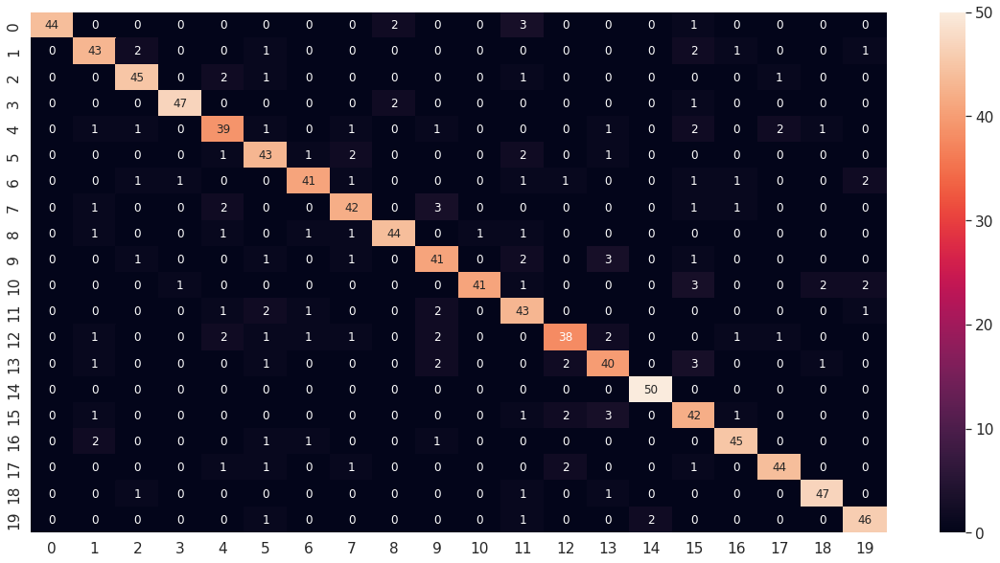

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_10_df_CM = pd.DataFrame(deepid_model_vgg4_10_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_10_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_10_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_10_report)

              precision    recall  f1-score   support

           1       1.00      0.88      0.94        50
           2       0.84      0.86      0.85        50
           3       0.88      0.90      0.89        50
           4       0.96      0.94      0.95        50
           5       0.80      0.78      0.79        50
           6       0.80      0.86      0.83        50
           7       0.89      0.82      0.85        50
           8       0.84      0.84      0.84        50
           9       0.92      0.88      0.90        50
          10       0.79      0.82      0.80        50
          11       0.98      0.82      0.89        50
          12       0.75      0.86      0.80        50
          13       0.84      0.76      0.80        50
          14       0.78      0.80      0.79        50
          15       0.96      1.00      0.98        50
          16       0.72      0.84      0.78        50
          17       0.90      0.90      0.90        50
          18       0.92    

#### Modelo 11: (BTH = 10, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_11 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_11 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_11)
deepid_model_vgg4_11.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_11.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_11.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_11 = deepid_model_vgg4_11.fit(new_trainX, new_trainY, batch_size=10, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
216/216 [==============================] - 2s 6ms/step - loss: 5.8693 - accuracy: 0.1238 - val_loss: 2.8022 - val_accuracy: 0.1704
Epoch 2/200
216/216 [==============================] - 1s 5ms/step - loss: 2.6383 - accuracy: 0.2212 - val_loss: 2.3361 - val_accuracy: 0.2889
Epoch 3/200
216/216 [==============================] - 1s 5ms/step - loss: 2.1919 - accuracy: 0.3539 - val_loss: 1.8450 - val_accuracy: 0.4667
Epoch 4/200
216/216 [==============================] - 1s 5ms/step - loss: 1.5408 - accuracy: 0.5487 - val_loss: 1.0359 - val_accuracy: 0.6870
Epoch 5/200
216/216 [==============================] - 1s 5ms/step - loss: 0.8248 - accuracy: 0.7537 - val_loss: 0.6789 - val_accuracy: 0.8111
Epoch 6/200
216/216 [==============================] - 1s 5ms/step - loss: 0.4852 - accuracy: 0.8678 - val_loss: 0.3589 - val_accuracy: 0.9204
Epoch 7/200
216/216 [==============================] - 1s 6ms/step - loss: 0.2060 - accuracy: 0.9490 - val_loss: 0.2903 - val_accuracy: 0.9481

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_11 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_11.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_11.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_11.evaluate(testX, testY)

32/32 [==============================] - 0s 4ms/step - loss: 0.9052 - accuracy: 0.8580


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_11.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_11_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 3ms/step


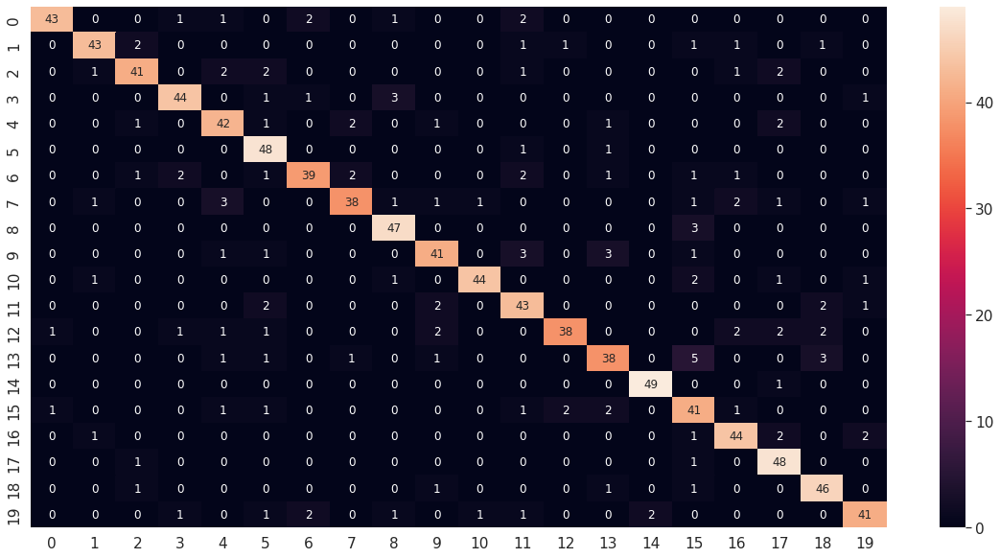

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_11_df_CM = pd.DataFrame(deepid_model_vgg4_11_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_11_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_11_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_11_report)

              precision    recall  f1-score   support

           1       0.96      0.86      0.91        50
           2       0.91      0.86      0.89        50
           3       0.87      0.82      0.85        50
           4       0.90      0.88      0.89        50
           5       0.81      0.84      0.82        50
           6       0.80      0.96      0.87        50
           7       0.89      0.78      0.83        50
           8       0.88      0.76      0.82        50
           9       0.87      0.94      0.90        50
          10       0.84      0.82      0.83        50
          11       0.96      0.88      0.92        50
          12       0.78      0.86      0.82        50
          13       0.93      0.76      0.84        50
          14       0.81      0.76      0.78        50
          15       0.96      0.98      0.97        50
          16       0.71      0.82      0.76        50
          17       0.85      0.88      0.86        50
          18       0.81    

#### Modelo 12: (BTH = 50, EHS = 200, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_12 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_12 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_12)
deepid_model_vgg4_12.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_12.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_12.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_12 = deepid_model_vgg4_12.fit(new_trainX, new_trainY, batch_size=50, epochs=200, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/200
44/44 [==============================] - 1s 13ms/step - loss: 23.3040 - accuracy: 0.0320 - val_loss: 3.4393 - val_accuracy: 0.0648
Epoch 2/200
44/44 [==============================] - 0s 9ms/step - loss: 3.2955 - accuracy: 0.0608 - val_loss: 3.1995 - val_accuracy: 0.0759
Epoch 3/200
44/44 [==============================] - 0s 9ms/step - loss: 3.1770 - accuracy: 0.0696 - val_loss: 3.1106 - val_accuracy: 0.0852
Epoch 4/200
44/44 [==============================] - 0s 9ms/step - loss: 3.1131 - accuracy: 0.0756 - val_loss: 3.0435 - val_accuracy: 0.0852
Epoch 5/200
44/44 [==============================] - 0s 9ms/step - loss: 3.0562 - accuracy: 0.0904 - val_loss: 2.9989 - val_accuracy: 0.0944
Epoch 6/200
44/44 [==============================] - 0s 9ms/step - loss: 3.0193 - accuracy: 0.0932 - val_loss: 2.9724 - val_accuracy: 0.1037
Epoch 7/200
44/44 [==============================] - 0s 9ms/step - loss: 2.9803 - accuracy: 0.1127 - val_loss: 2.9241 - val_accuracy: 0.1111
Epoch 8/200

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_12 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_12.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_12.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_12.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.2362 - accuracy: 0.8390


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_12.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_12_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


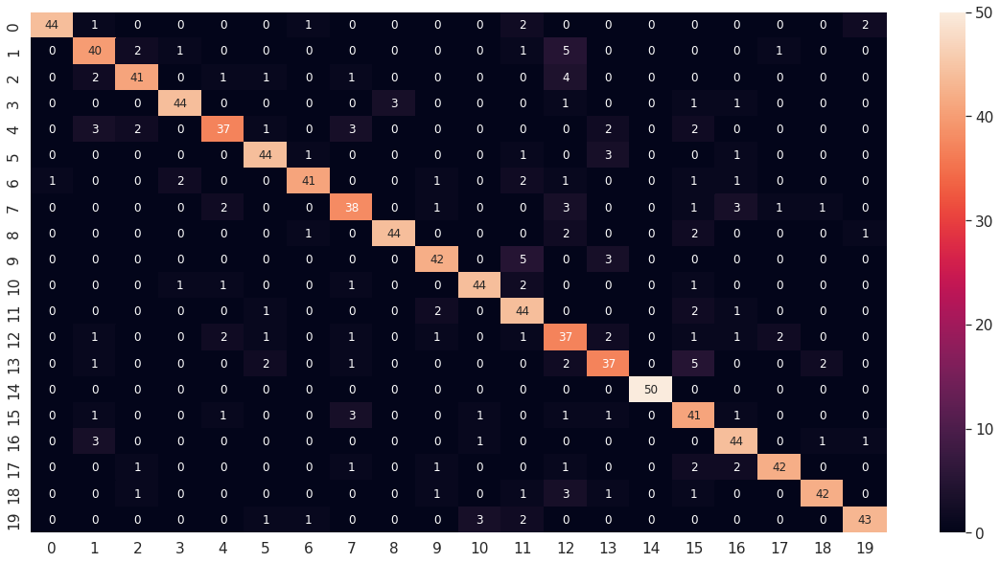

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_12_df_CM = pd.DataFrame(deepid_model_vgg4_12_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_12_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_12_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_12_report)

              precision    recall  f1-score   support

           1       0.98      0.88      0.93        50
           2       0.77      0.80      0.78        50
           3       0.87      0.82      0.85        50
           4       0.92      0.88      0.90        50
           5       0.84      0.74      0.79        50
           6       0.86      0.88      0.87        50
           7       0.91      0.82      0.86        50
           8       0.78      0.76      0.77        50
           9       0.94      0.88      0.91        50
          10       0.86      0.84      0.85        50
          11       0.90      0.88      0.89        50
          12       0.72      0.88      0.79        50
          13       0.62      0.74      0.67        50
          14       0.76      0.74      0.75        50
          15       1.00      1.00      1.00        50
          16       0.68      0.82      0.75        50
          17       0.80      0.88      0.84        50
          18       0.91    

#### Modelo 13: (BTH = 20, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_13 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_13 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_13)
deepid_model_vgg4_13.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_13.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_13.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_13 = deepid_model_vgg4_13.fit(new_trainX, new_trainY, batch_size=20, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
108/108 [==============================] - 1s 8ms/step - loss: 10.6539 - accuracy: 0.0951 - val_loss: 3.0484 - val_accuracy: 0.1111
Epoch 2/250
108/108 [==============================] - 1s 6ms/step - loss: 2.8746 - accuracy: 0.1489 - val_loss: 2.8088 - val_accuracy: 0.1741
Epoch 3/250
108/108 [==============================] - 1s 6ms/step - loss: 2.7291 - accuracy: 0.1818 - val_loss: 2.7576 - val_accuracy: 0.1889
Epoch 4/250
108/108 [==============================] - 1s 6ms/step - loss: 2.5936 - accuracy: 0.2175 - val_loss: 2.5313 - val_accuracy: 0.2519
Epoch 5/250
108/108 [==============================] - 1s 7ms/step - loss: 2.4224 - accuracy: 0.2542 - val_loss: 2.3308 - val_accuracy: 0.2870
Epoch 6/250
108/108 [==============================] - 1s 6ms/step - loss: 2.3362 - accuracy: 0.2737 - val_loss: 2.2908 - val_accuracy: 0.2944
Epoch 7/250
108/108 [==============================] - 1s 6ms/step - loss: 2.2979 - accuracy: 0.2774 - val_loss: 2.2507 - val_accuracy: 0.266

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_13 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_13.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_13.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_13.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.0479 - accuracy: 0.8580


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_13.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_13_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


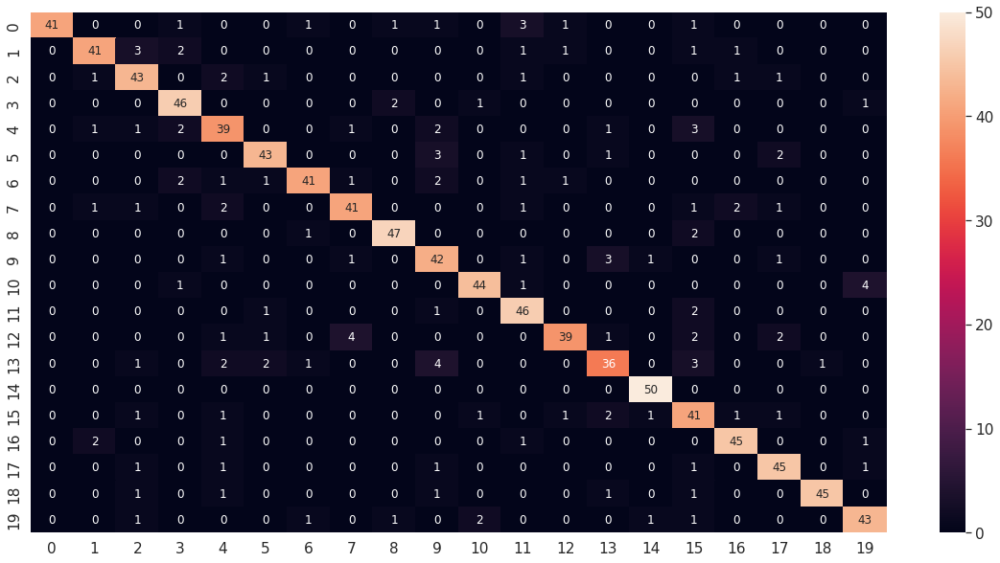

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_13_df_CM = pd.DataFrame(deepid_model_vgg4_13_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_13_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_13_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_13_report)

              precision    recall  f1-score   support

           1       1.00      0.82      0.90        50
           2       0.89      0.82      0.85        50
           3       0.81      0.86      0.83        50
           4       0.85      0.92      0.88        50
           5       0.75      0.78      0.76        50
           6       0.88      0.86      0.87        50
           7       0.91      0.82      0.86        50
           8       0.85      0.82      0.84        50
           9       0.92      0.94      0.93        50
          10       0.74      0.84      0.79        50
          11       0.92      0.88      0.90        50
          12       0.81      0.92      0.86        50
          13       0.91      0.78      0.84        50
          14       0.80      0.72      0.76        50
          15       0.94      1.00      0.97        50
          16       0.69      0.82      0.75        50
          17       0.90      0.90      0.90        50
          18       0.85    

#### Modelo 14: (BTH = 40, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_14 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_14 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_14)
deepid_model_vgg4_14.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_14.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_14.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_14 = deepid_model_vgg4_14.fit(new_trainX, new_trainY, batch_size=40, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
54/54 [==============================] - 1s 12ms/step - loss: 10.8695 - accuracy: 0.1452 - val_loss: 2.9898 - val_accuracy: 0.1481
Epoch 2/250
54/54 [==============================] - 0s 8ms/step - loss: 2.6991 - accuracy: 0.2463 - val_loss: 2.5751 - val_accuracy: 0.2796
Epoch 3/250
54/54 [==============================] - 0s 8ms/step - loss: 2.4120 - accuracy: 0.3242 - val_loss: 2.4123 - val_accuracy: 0.3037
Epoch 4/250
54/54 [==============================] - 0s 7ms/step - loss: 2.2284 - accuracy: 0.3697 - val_loss: 2.2483 - val_accuracy: 0.3611
Epoch 5/250
54/54 [==============================] - 0s 7ms/step - loss: 2.0475 - accuracy: 0.3966 - val_loss: 1.9978 - val_accuracy: 0.4278
Epoch 6/250
54/54 [==============================] - 0s 7ms/step - loss: 1.8527 - accuracy: 0.4443 - val_loss: 1.8206 - val_accuracy: 0.4648
Epoch 7/250
54/54 [==============================] - 0s 7ms/step - loss: 1.5745 - accuracy: 0.5589 - val_loss: 1.5809 - val_accuracy: 0.5796
Epoch 8/250

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_14 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_14.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_14.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_14.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.4365 - accuracy: 0.8450


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_14.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_14_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


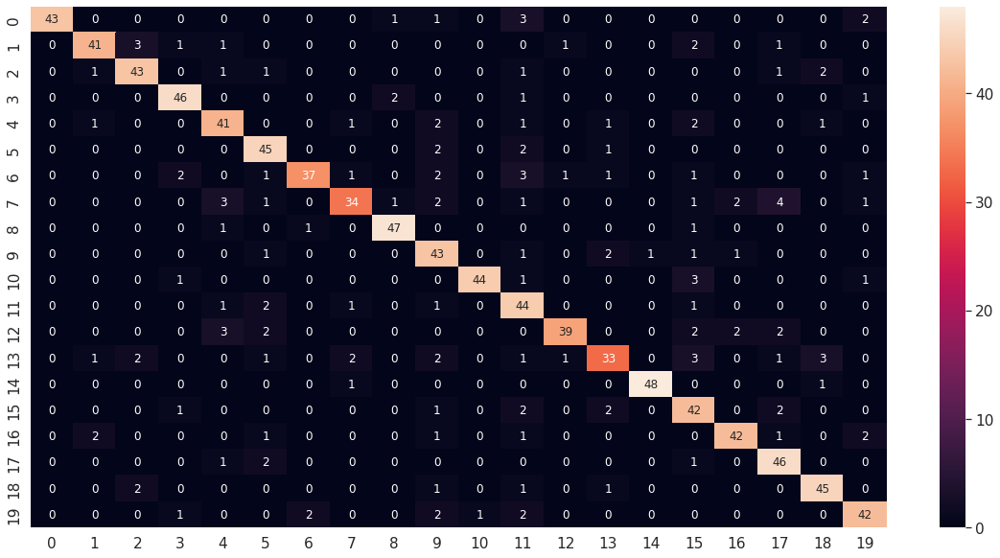

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_14_df_CM = pd.DataFrame(deepid_model_vgg4_14_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_14_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_14_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_14_report)

              precision    recall  f1-score   support

           1       1.00      0.86      0.92        50
           2       0.89      0.82      0.85        50
           3       0.86      0.86      0.86        50
           4       0.88      0.92      0.90        50
           5       0.79      0.82      0.80        50
           6       0.79      0.90      0.84        50
           7       0.93      0.74      0.82        50
           8       0.85      0.68      0.76        50
           9       0.92      0.94      0.93        50
          10       0.72      0.86      0.78        50
          11       0.98      0.88      0.93        50
          12       0.68      0.88      0.77        50
          13       0.93      0.78      0.85        50
          14       0.80      0.66      0.73        50
          15       0.98      0.96      0.97        50
          16       0.70      0.84      0.76        50
          17       0.89      0.84      0.87        50
          18       0.79    

#### Modelo 15: (BTH = 10, EHS = 250, ValidSplit = 0.2, Dropout=0, INI = HeNormal, REG = L2, OPT = adam[0.001])

In [ ]:
# Construcción del clasificador
initializer = tf.keras.initializers.HeNormal()
reg = tf.keras.regularizers.L2()

deepid_model_vgg4_15 = layers.Dense(21, kernel_initializer=initializer, kernel_regularizer=reg, activation='softmax', name='Class')(deepid_model.get_layer('deepid').get_output_at(node_index=0))
deepid_model_vgg4_15 = keras.Model(deepid_model.get_layer('input_1').get_output_at(node_index=0), deepid_model_vgg4_15)
deepid_model_vgg4_15.summary()

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 55, 47, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 52, 44, 20)   980         ['input_1[0][0]']                
                                                                                                  
 Pool1 (MaxPooling2D)           (None, 26, 22, 20)   0           ['Conv1[0][0]']                  
                                                                                                  
 D1 (Dropout)                   (None, 26, 22, 20)   0           ['Pool1[0][0]']                  
                                                                                           

In [ ]:
# Hacer shuffle a los datos de entrenamiento
index = [i for i in range(len(trainY))]    
random.shuffle(index)   
new_trainX = trainX[index]  
new_trainY = trainY[index] 

In [ ]:
# Compilación del modelo
adam=Adam(learning_rate=0.001)
deepid_model_vgg4_15.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamiento del modelo, con un chekpoint para guardar los hiperparametros que consiguen los mejores resultados en el set de validación
checkpointer = ModelCheckpoint(filepath=path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_15.h5', monitor="val_loss", save_best_only=True)
hist_model_vgg4_15 = deepid_model_vgg4_15.fit(new_trainX, new_trainY, batch_size=10, epochs=250, shuffle=True, validation_split=0.2, callbacks=[checkpointer])

Epoch 1/250
216/216 [==============================] - 2s 6ms/step - loss: 5.9639 - accuracy: 0.1391 - val_loss: 2.8170 - val_accuracy: 0.1685
Epoch 2/250
216/216 [==============================] - 1s 5ms/step - loss: 2.4512 - accuracy: 0.2987 - val_loss: 2.1203 - val_accuracy: 0.4130
Epoch 3/250
216/216 [==============================] - 1s 5ms/step - loss: 1.7892 - accuracy: 0.4898 - val_loss: 1.6462 - val_accuracy: 0.5556
Epoch 4/250
216/216 [==============================] - 1s 5ms/step - loss: 1.3366 - accuracy: 0.6011 - val_loss: 1.1752 - val_accuracy: 0.6833
Epoch 5/250
216/216 [==============================] - 1s 5ms/step - loss: 0.7573 - accuracy: 0.7853 - val_loss: 0.7095 - val_accuracy: 0.8315
Epoch 6/250
216/216 [==============================] - 1s 5ms/step - loss: 0.5030 - accuracy: 0.8738 - val_loss: 0.5447 - val_accuracy: 0.8815
Epoch 7/250
216/216 [==============================] - 1s 5ms/step - loss: 0.2619 - accuracy: 0.9360 - val_loss: 0.2645 - val_accuracy: 0.9630

In [ ]:
# Carga del modelo obtenido durante el entrenamiento, evaluación del modelo con trainX, testX y generamos las predicciones a partir del testX
load_deepid_model_vgg4_15 = load_model(path + 'data_reconocimiento3/models_VGG4/deepid_model_VGG4_15.h5')

# Evaluación del modelo
train_loss, train_acc = load_deepid_model_vgg4_15.evaluate(trainX, trainY)
test_loss, test_acc = load_deepid_model_vgg4_15.evaluate(testX, testY)

32/32 [==============================] - 0s 3ms/step - loss: 1.1372 - accuracy: 0.8400


In [ ]:
# Matriz de confusión usando Scikit Learn
predY = load_deepid_model_vgg4_15.predict(testX)  
predictedY = np.argmax(predY, axis=1)  #revisar el bias adecuado

#Creamos la matriz de confusión
deepid_model_vgg4_15_CM = confusion_matrix(np.argmax(testY, axis=1), predictedY)

32/32 [==============================] - 0s 2ms/step


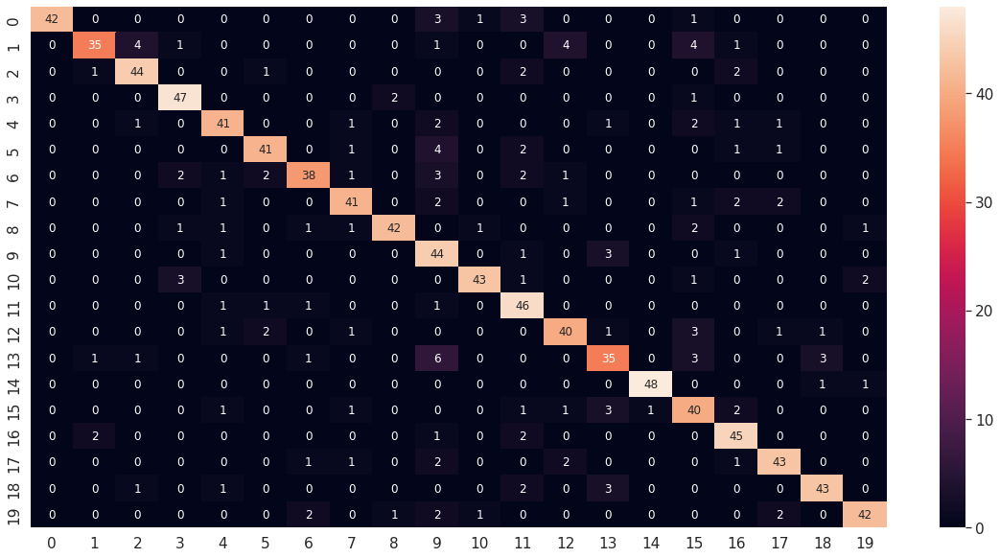

In [ ]:
# Visualizamos la matriz de confusión
deepid_model_vgg4_15_df_CM = pd.DataFrame(deepid_model_vgg4_15_CM, range(20), range(20))  
plt.figure(figsize = (20,10))  
seaborn.set(font_scale=1.4) #for label size  
seaborn.heatmap(deepid_model_vgg4_15_df_CM, annot=True, annot_kws={"size": 12}) # font size  
plt.show()  

In [ ]:
# Resumen de clasificación
deepid_model_vgg4_15_report = classification_report(np.argmax(testY, axis=1), predictedY)  
print(deepid_model_vgg4_15_report)

              precision    recall  f1-score   support

           1       1.00      0.84      0.91        50
           2       0.90      0.70      0.79        50
           3       0.86      0.88      0.87        50
           4       0.87      0.94      0.90        50
           5       0.84      0.82      0.83        50
           6       0.87      0.82      0.85        50
           7       0.86      0.76      0.81        50
           8       0.85      0.82      0.84        50
           9       0.93      0.84      0.88        50
          10       0.62      0.88      0.73        50
          11       0.93      0.86      0.90        50
          12       0.74      0.92      0.82        50
          13       0.82      0.80      0.81        50
          14       0.76      0.70      0.73        50
          15       0.98      0.96      0.97        50
          16       0.69      0.80      0.74        50
          17       0.80      0.90      0.85        50
          18       0.86    